# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 100418.55894768  96156.8490052

Omni_P_RQi ================== 0.10027688357192878
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99723.88095634223, 'S': 10000, 'W': 10000, 'P': 0.10027688357192878, 'dP': 0}, 'j': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878634}, 'k': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878634}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10027688357192854
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99723.88095634223, 'S': 10000, 'W': 10000, 'P': 0.10027688357192854, 'dP': 0}, 'j': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878609}, 'k': {'R': 99162.32170728213, 'S': 10000, 'W': 10000, 'P': 0.10084475461878609}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.1002768835719287
Initial Q HDX: 20000.000000000015
config_init_state  <cla

Omni_P_RQi ================== 0.09871310466515879
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101303.67223197628, 'S': 10000, 'W': 10000, 'P': 0.09871310466515879, 'dP': 0}, 'j': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475995}, 'k': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475995}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09700016060850966
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103092.61280875358, 'S': 10000, 'W': 10000, 'P': 0.09700016060850966, 'dP': 0}, 'j': {'R': 98408.40772921551, 'S': 10000, 'W': 10000, 'P': 0.10161733362779729}, 'k': {'R': 98408.40772921551, 'S': 10000, 'W': 10000, 'P': 0.10161733362779729}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09700016060850962
Initial Q HDX: 19999.999999999985
config_init_state  <

Omni_P_RQi ================== 0.10046935797896117
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99532.83469865563, 'S': 10000, 'W': 10000, 'P': 0.10046935797896117, 'dP': 0}, 'j': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045646}, 'k': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045646}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10046935797896121
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99532.83469865563, 'S': 10000, 'W': 10000, 'P': 0.10046935797896121, 'dP': 0}, 'j': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.1003230598904565}, 'k': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.1003230598904565}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10046935797896131
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09689123758605603
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.09689123758605603, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054253}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054253}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09689123758605599
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.09689123758605599, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054249}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09689123758605603
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10094327596489383
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99065.53858503481, 'S': 10000, 'W': 10000, 'P': 0.10094327596489383, 'dP': 0}, 'j': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205316}, 'k': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205316}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10094327596489377
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99065.53858503481, 'S': 10000, 'W': 10000, 'P': 0.10094327596489377, 'dP': 0}, 'j': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.0994862748220531}, 'k': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.0994862748220531}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10094327596489415
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10093105027890092
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99077.5383032989, 'S': 10000, 'W': 10000, 'P': 0.10093105027890092, 'dP': 0}, 'j': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404639}, 'k': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404639}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10093105027890115
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99077.5383032989, 'S': 10000, 'W': 10000, 'P': 0.10093105027890115, 'dP': 0}, 'j': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404663}, 'k': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404663}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.1009310502789009
Initial Q HDX: 19999.99999999998
config_init_state  <class

Omni_P_RQi ================== 0.10093571709458452
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99072.95740148392, 'S': 10000, 'W': 10000, 'P': 0.10093571709458452, 'dP': 0}, 'j': {'R': 99946.99160514465, 'S': 10000, 'W': 10000, 'P': 0.10005303650865732}, 'k': {'R': 99946.99160514465, 'S': 10000, 'W': 10000, 'P': 0.10005303650865732}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10093571709458461
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99072.95740148392, 'S': 10000, 'W': 10000, 'P': 0.10093571709458461, 'dP': 0}, 'j': {'R': 99946.99160514465, 'S': 10000, 'W': 10000, 'P': 0.10005303650865742}, 'k': {'R': 99946.99160514465, 'S': 10000, 'W': 10000, 'P': 0.10005303650865742}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09951729263360366
Initial Q HDX: 19999.999999999996
config_init_state  <cl

Omni_P_RQi ================== 0.10390031866640637
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96246.09556884154, 'S': 10000, 'W': 10000, 'P': 0.10390031866640637, 'dP': 0}, 'j': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.095193367395557}, 'k': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.095193367395557}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10390031866640602
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96246.09556884154, 'S': 10000, 'W': 10000, 'P': 0.10390031866640602, 'dP': 0}, 'j': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555669}, 'k': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555669}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10390031866640598
Initial Q HDX: 20000.0
config_init_state  <class 'mode

Omni_P_RQi ================== 0.10113080846955805
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98881.83582562936, 'S': 10000, 'W': 10000, 'P': 0.10113080846955805, 'dP': 0}, 'j': {'R': 100604.85630104183, 'S': 10000, 'W': 10000, 'P': 0.09939878021471267}, 'k': {'R': 100604.85630104183, 'S': 10000, 'W': 10000, 'P': 0.09939878021471267}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10113080846955798
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98881.83582562936, 'S': 10000, 'W': 10000, 'P': 0.10113080846955798, 'dP': 0}, 'j': {'R': 100604.85630104183, 'S': 10000, 'W': 10000, 'P': 0.0993987802147126}, 'k': {'R': 100604.85630104183, 'S': 10000, 'W': 10000, 'P': 0.0993987802147126}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10113080846955837
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.0993735386735663
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100630.41060507215, 'S': 10000, 'W': 10000, 'P': 0.0993735386735663, 'dP': 0}, 'j': {'R': 97689.97679087454, 'S': 10000, 'W': 10000, 'P': 0.10236464710608999}, 'k': {'R': 97689.97679087454, 'S': 10000, 'W': 10000, 'P': 0.10236464710608999}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09937353867356652
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100630.41060507215, 'S': 10000, 'W': 10000, 'P': 0.09937353867356652, 'dP': 0}, 'j': {'R': 97689.97679087454, 'S': 10000, 'W': 10000, 'P': 0.10236464710609022}, 'k': {'R': 97689.97679087454, 'S': 10000, 'W': 10000, 'P': 0.10236464710609022}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09937353867356627
Initial Q HDX: 19999.99999999998
config_init_state  <cl

Omni_P_RQi ================== 0.10286458721315293
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97215.18620668055, 'S': 10000, 'W': 10000, 'P': 0.10286458721315293, 'dP': 0}, 'j': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.09850753363670313}, 'k': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.09850753363670313}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10286458721315316
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97215.18620668055, 'S': 10000, 'W': 10000, 'P': 0.10286458721315316, 'dP': 0}, 'j': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.09850753363670335}, 'k': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.09850753363670335}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.1028645872131529
Initial Q HDX: 19999.99999999998
config_init_state  

Omni_P_RQi ================== 0.1004525282862031
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99549.51030708376, 'S': 10000, 'W': 10000, 'P': 0.1004525282862031, 'dP': 0}, 'j': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600801}, 'k': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600801}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10045252828620305
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99549.51030708376, 'S': 10000, 'W': 10000, 'P': 0.10045252828620305, 'dP': 0}, 'j': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600797}, 'k': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600797}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10045252828620327
Initial Q HDX: 20000.00000000003
config_init_state  <clas

Omni_P_RQi ================== 0.09986504823524137
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100135.13413065275, 'S': 10000, 'W': 10000, 'P': 0.09986504823524137, 'dP': 0}, 'j': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929873}, 'k': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929873}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09986504823524141
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100135.13413065275, 'S': 10000, 'W': 10000, 'P': 0.09986504823524141, 'dP': 0}, 'j': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929877}, 'k': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929877}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.0998650482352415
Initial Q HDX: 20000.000000000022
config_init_state  <class '

Omni_P_RQi ================== 0.1010946040247746
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98917.24782412128, 'S': 10000, 'W': 10000, 'P': 0.1010946040247746, 'dP': 0}, 'j': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449278}, 'k': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449278}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10109460402477427
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98917.24782412128, 'S': 10000, 'W': 10000, 'P': 0.10109460402477427, 'dP': 0}, 'j': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449245}, 'k': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449245}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10109460402477422
Initial Q HDX: 20000.0
config_init_state  <class 'mo

Omni_P_RQi ================== 0.10232845185595764
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97724.53133637224, 'S': 10000, 'W': 10000, 'P': 0.10232845185595764, 'dP': 0}, 'j': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532487}, 'k': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532487}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.1023284518559578
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97724.53133637224, 'S': 10000, 'W': 10000, 'P': 0.1023284518559578, 'dP': 0}, 'j': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532502}, 'k': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532502}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10232845185595774
Initial Q HDX: 20000
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.1012084001425011
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.1012084001425011, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212255}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212255}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10120840014250133
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250133, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212277}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212277}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10120840014250108
Initial Q HDX: 19999.99999999998
config_init_state  <

Omni_P_RQi ================== 0.10058503385111173
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99418.36888778338, 'S': 10000, 'W': 10000, 'P': 0.10058503385111173, 'dP': 0}, 'j': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.1010119364303751}, 'k': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.1010119364303751}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10058503385111181
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99418.36888778338, 'S': 10000, 'W': 10000, 'P': 0.10058503385111181, 'dP': 0}, 'j': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037518}, 'k': {'R': 98998.20113727594, 'S': 10000, 'W': 10000, 'P': 0.10101193643037518}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10121056160363334
Initial Q HDX: 19999.999999999996
config_init_state  <clas

Omni_P_RQi ================== 0.09636357967717578
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103773.64595110154, 'S': 10000, 'W': 10000, 'P': 0.09636357967717578, 'dP': 0}, 'j': {'R': 100137.20628179522, 'S': 10000, 'W': 10000, 'P': 0.09986298171589782}, 'k': {'R': 100137.20628179522, 'S': 10000, 'W': 10000, 'P': 0.09986298171589782}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09636357967717574
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103773.64595110154, 'S': 10000, 'W': 10000, 'P': 0.09636357967717574, 'dP': 0}, 'j': {'R': 100137.20628179522, 'S': 10000, 'W': 10000, 'P': 0.09986298171589778}, 'k': {'R': 100137.20628179522, 'S': 10000, 'W': 10000, 'P': 0.09986298171589778}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09636357967717578
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10213773950176343
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97907.0033151395, 'S': 10000, 'W': 10000, 'P': 0.10213773950176343, 'dP': 0}, 'j': {'R': 100951.58925445436, 'S': 10000, 'W': 10000, 'P': 0.09905738061036785}, 'k': {'R': 100951.58925445436, 'S': 10000, 'W': 10000, 'P': 0.09905738061036785}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10213773950176336
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97907.0033151395, 'S': 10000, 'W': 10000, 'P': 0.10213773950176336, 'dP': 0}, 'j': {'R': 100951.58925445436, 'S': 10000, 'W': 10000, 'P': 0.09905738061036778}, 'k': {'R': 100951.58925445436, 'S': 10000, 'W': 10000, 'P': 0.09905738061036778}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10213773950176375
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10247149043877993
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97588.11897026488, 'S': 10000, 'W': 10000, 'P': 0.10247149043877993, 'dP': 0}, 'j': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362544}, 'k': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362544}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10247149043877968
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97588.11897026488, 'S': 10000, 'W': 10000, 'P': 0.10247149043877968, 'dP': 0}, 'j': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362521}, 'k': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362521}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10247149043877983
Initial Q HDX: 20000.000000000015
config_init_state 

Omni_P_RQi ================== 0.10399675221734771
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96156.84900525093, 'S': 10000, 'W': 10000, 'P': 0.10399675221734771, 'dP': 0}, 'j': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157524}, 'k': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157524}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10399675221734767
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96156.84900525093, 'S': 10000, 'W': 10000, 'P': 0.10399675221734767, 'dP': 0}, 'j': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157518}, 'k': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157518}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10399675221734789
Initial Q HDX: 20000.00000000003
config_init_state  <class 

Omni_P_RQi ================== 0.10269169542170073
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97378.8577443898, 'S': 10000, 'W': 10000, 'P': 0.10269169542170073, 'dP': 0}, 'j': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877291}, 'k': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877291}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10269169542170078
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97378.8577443898, 'S': 10000, 'W': 10000, 'P': 0.10269169542170078, 'dP': 0}, 'j': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877295}, 'k': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877295}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10269169542170087
Initial Q HDX: 20000.000000000022
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09853406549739592
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101487.74385305645, 'S': 10000, 'W': 10000, 'P': 0.09853406549739592, 'dP': 0}, 'j': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.0995461585996073}, 'k': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.0995461585996073}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09853406549739588
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101487.74385305645, 'S': 10000, 'W': 10000, 'P': 0.09853406549739588, 'dP': 0}, 'j': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.09954615859960726}, 'k': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.09954615859960726}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09853406549739592
Initial Q HDX: 20000.00000000001
config_init_state  <class 'm

Omni_P_RQi ================== 0.10023154108344018
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.10023154108344018, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017252}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017252}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10023154108344011
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.10023154108344011, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1002315410834405
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.part

Omni_P_RQi ================== 0.10300089416360227
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97086.5358131398, 'S': 10000, 'W': 10000, 'P': 0.10300089416360227, 'dP': 0}, 'j': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149373}, 'k': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149373}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10300089416360249
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97086.5358131398, 'S': 10000, 'W': 10000, 'P': 0.10300089416360249, 'dP': 0}, 'j': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149395}, 'k': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149395}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10300089416360224
Initial Q HDX: 19999.99999999998
config_init_state  <

Omni_P_RQi ================== 0.10144995581930501
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98570.76742163642, 'S': 10000, 'W': 10000, 'P': 0.10144995581930501, 'dP': 0}, 'j': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193395}, 'k': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193395}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.1014499558193051
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98570.76742163642, 'S': 10000, 'W': 10000, 'P': 0.1014499558193051, 'dP': 0}, 'j': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193404}, 'k': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193404}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.1009254414055659
Initial Q HDX: 19999.999999999996
config_init_state  <c

Omni_P_RQi ================== 0.09790815596908976
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102136.53705373706, 'S': 10000, 'W': 10000, 'P': 0.09790815596908976, 'dP': 0}, 'j': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.1026758232582241}, 'k': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.1026758232582241}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09790815596908972
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102136.53705373706, 'S': 10000, 'W': 10000, 'P': 0.09790815596908972, 'dP': 0}, 'j': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.10267582325822404}, 'k': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.10267582325822404}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09790815596908976
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model

Omni_P_RQi ================== 0.10358861850280672
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96535.70193842343, 'S': 10000, 'W': 10000, 'P': 0.10358861850280672, 'dP': 0}, 'j': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650929}, 'k': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650929}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10358861850280668
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96535.70193842343, 'S': 10000, 'W': 10000, 'P': 0.10358861850280668, 'dP': 0}, 'j': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650925}, 'k': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650925}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10358861850280672
Initial Q HDX: 20000.00000000001
config_init_state  <class 'm

Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99232.87001635153, 'S': 10000, 'W': 10000, 'P': 0.10077306036147309, 'dP': 0}, 'j': {'R': 100695.23274396057, 'S': 10000, 'W': 10000, 'P': 0.09930956736975988}, 'k': {'R': 100695.23274396057, 'S': 10000, 'W': 10000, 'P': 0.09930956736975988}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10077306036147317
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99232.87001635153, 'S': 10000, 'W': 10000, 'P': 0.10077306036147317, 'dP': 0}, 'j': {'R': 100695.23274396057, 'S': 10000, 'W': 10000, 'P': 0.09930956736975997}, 'k': {'R': 100695.23274396057, 'S': 10000, 'W': 10000, 'P': 0.09930956736975997}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10136291276645458
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool':

Omni_P_RQi ================== 0.09878422078042397
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101230.74232905963, 'S': 10000, 'W': 10000, 'P': 0.09878422078042397, 'dP': 0}, 'j': {'R': 100465.54124539506, 'S': 10000, 'W': 10000, 'P': 0.09953661599825799}, 'k': {'R': 100465.54124539506, 'S': 10000, 'W': 10000, 'P': 0.09953661599825799}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09878422078042365
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101230.74232905963, 'S': 10000, 'W': 10000, 'P': 0.09878422078042365, 'dP': 0}, 'j': {'R': 100465.54124539506, 'S': 10000, 'W': 10000, 'P': 0.09953661599825765}, 'k': {'R': 100465.54124539506, 'S': 10000, 'W': 10000, 'P': 0.09953661599825765}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.0987842207804236
Initial Q HDX: 20000.0
config_init_state  <class 

Omni_P_RQi ================== 0.09815486100305465
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101879.82436946042, 'S': 10000, 'W': 10000, 'P': 0.09815486100305465, 'dP': 0}, 'j': {'R': 98581.59550494535, 'S': 10000, 'W': 10000, 'P': 0.10143881267876576}, 'k': {'R': 98581.59550494535, 'S': 10000, 'W': 10000, 'P': 0.10143881267876576}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09815486100305458
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101879.82436946042, 'S': 10000, 'W': 10000, 'P': 0.09815486100305458, 'dP': 0}, 'j': {'R': 98581.59550494535, 'S': 10000, 'W': 10000, 'P': 0.10143881267876569}, 'k': {'R': 98581.59550494535, 'S': 10000, 'W': 10000, 'P': 0.10143881267876569}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09815486100305496
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10062027873299442
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99383.54500623034, 'S': 10000, 'W': 10000, 'P': 0.10062027873299442, 'dP': 0}, 'j': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241038}, 'k': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241038}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10062027873299464
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99383.54500623034, 'S': 10000, 'W': 10000, 'P': 0.10062027873299464, 'dP': 0}, 'j': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.0990569042124106}, 'k': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.0990569042124106}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.1006202787329944
Initial Q HDX: 19999.99999999998
config_init_state  <class

Omni_P_RQi ================== 0.09933972880854482
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100664.6597482944, 'S': 10000, 'W': 10000, 'P': 0.09933972880854482, 'dP': 0}, 'j': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852724}, 'k': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852724}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09933972880854491
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100664.6597482944, 'S': 10000, 'W': 10000, 'P': 0.09933972880854491, 'dP': 0}, 'j': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852734}, 'k': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852734}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.0980680116223739
Initial Q HDX: 19999.999999999996
config_init_state  <cla

Omni_P_RQi ================== 0.10096285860284838
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.10096285860284838, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150896}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150896}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10096285860284805
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.10096285860284805, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150861}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150861}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.100962858602848
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.10223710487495577
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97811.84641555347, 'S': 10000, 'W': 10000, 'P': 0.10223710487495577, 'dP': 0}, 'j': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023766}, 'k': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023766}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.1022371048749557
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97811.84641555347, 'S': 10000, 'W': 10000, 'P': 0.1022371048749557, 'dP': 0}, 'j': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023759}, 'k': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023759}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10223710487495609
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09838824093654974
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101638.16229267666, 'S': 10000, 'W': 10000, 'P': 0.09838824093654974, 'dP': 0}, 'j': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874434}, 'k': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874434}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0983882409365495
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101638.16229267666, 'S': 10000, 'W': 10000, 'P': 0.0983882409365495, 'dP': 0}, 'j': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.0980918799287441}, 'k': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.0980918799287441}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09838824093654966
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.1001441095824624
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99856.09779440539, 'S': 10000, 'W': 10000, 'P': 0.1001441095824624, 'dP': 0}, 'j': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.09836948326647466}, 'k': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.09836948326647466}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10014410958246216
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99856.09779440539, 'S': 10000, 'W': 10000, 'P': 0.10014410958246216, 'dP': 0}, 'j': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.0983694832664744}, 'k': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.0983694832664744}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10014410958246231
Initial Q HDX: 20000.000000000015
config_init_state  <cl

Omni_P_RQi ================== 0.09927940905802733
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.82114338681, 'S': 10000, 'W': 10000, 'P': 0.09927940905802733, 'dP': 0}, 'j': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274338}, 'k': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274338}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09927940905802729
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.82114338681, 'S': 10000, 'W': 10000, 'P': 0.09927940905802729, 'dP': 0}, 'j': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274333}, 'k': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274333}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09927940905802751
Initial Q HDX: 20000.00000000003
config_init_state  <class 'm

Omni_P_RQi ================== 0.10129846834195694
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98718.17574025536, 'S': 10000, 'W': 10000, 'P': 0.10129846834195694, 'dP': 0}, 'j': {'R': 98503.98161483789, 'S': 10000, 'W': 10000, 'P': 0.10151873899982208}, 'k': {'R': 98503.98161483789, 'S': 10000, 'W': 10000, 'P': 0.10151873899982208}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.101298468341957
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98718.17574025536, 'S': 10000, 'W': 10000, 'P': 0.101298468341957, 'dP': 0}, 'j': {'R': 98503.98161483789, 'S': 10000, 'W': 10000, 'P': 0.10151873899982213}, 'k': {'R': 98503.98161483789, 'S': 10000, 'W': 10000, 'P': 0.10151873899982213}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10129846834195708
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.096971054821072
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103123.55597710772, 'S': 10000, 'W': 10000, 'P': 0.096971054821072, 'dP': 0}, 'j': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}, 'k': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921406}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09697105482107236
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103123.55597710772, 'S': 10000, 'W': 10000, 'P': 0.09697105482107236, 'dP': 0}, 'j': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921444}, 'k': {'R': 98381.778745048, 'S': 10000, 'W': 10000, 'P': 0.10164483837921444}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09697105482107204
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_u

Omni_P_RQi ================== 0.09691947135449715
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103178.44144468698, 'S': 10000, 'W': 10000, 'P': 0.09691947135449715, 'dP': 0}, 'j': {'R': 100684.56826343398, 'S': 10000, 'W': 10000, 'P': 0.09932008621058706}, 'k': {'R': 100684.56826343398, 'S': 10000, 'W': 10000, 'P': 0.09932008621058706}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09691947135449751
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103178.44144468698, 'S': 10000, 'W': 10000, 'P': 0.09691947135449751, 'dP': 0}, 'j': {'R': 100684.56826343398, 'S': 10000, 'W': 10000, 'P': 0.09932008621058744}, 'k': {'R': 100684.56826343398, 'S': 10000, 'W': 10000, 'P': 0.09932008621058744}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09691947135449719
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09836979340598924
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101657.22274853483, 'S': 10000, 'W': 10000, 'P': 0.09836979340598924, 'dP': 0}, 'j': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797358}, 'k': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797358}}}
config_param a value =============  1
Omni_P_RQi ================== 0.0983697934059896
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101657.22274853483, 'S': 10000, 'W': 10000, 'P': 0.0983697934059896, 'dP': 0}, 'j': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797394}, 'k': {'R': 101667.95875871566, 'S': 10000, 'W': 10000, 'P': 0.09835940567797394}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09836979340598928
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model

Omni_P_RQi ================== 0.10059974623144823
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99403.829279978, 'S': 10000, 'W': 10000, 'P': 0.10059974623144823, 'dP': 0}, 'j': {'R': 102949.43661991539, 'S': 10000, 'W': 10000, 'P': 0.09713506288450643}, 'k': {'R': 102949.43661991539, 'S': 10000, 'W': 10000, 'P': 0.09713506288450643}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10059974623144839
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99403.829279978, 'S': 10000, 'W': 10000, 'P': 0.10059974623144839, 'dP': 0}, 'j': {'R': 102949.43661991539, 'S': 10000, 'W': 10000, 'P': 0.09713506288450659}, 'k': {'R': 102949.43661991539, 'S': 10000, 'W': 10000, 'P': 0.09713506288450659}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10059974623144832
Initial Q HDX: 20000
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10405479027714559
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96103.2161360896, 'S': 10000, 'W': 10000, 'P': 0.10405479027714559, 'dP': 0}, 'j': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.09470551564242828}, 'k': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.09470551564242828}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10405479027714555
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96103.2161360896, 'S': 10000, 'W': 10000, 'P': 0.10405479027714555, 'dP': 0}, 'j': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.09470551564242824}, 'k': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.09470551564242824}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10405479027714579
Initial Q HDX: 20000.00000000003
config_init_state  <

Omni_P_RQi ================== 0.10044026618712842
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712842, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320544}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320544}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10044026618712852
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712852, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320553}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320553}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09928839028214397
Initial Q HDX: 19999.999999999996
config_init_state 

Omni_P_RQi ================== 0.097087755000201
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102999.60072183456, 'S': 10000, 'W': 10000, 'P': 0.097087755000201, 'dP': 0}, 'j': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207057}, 'k': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207057}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09708775500020105
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102999.60072183456, 'S': 10000, 'W': 10000, 'P': 0.09708775500020105, 'dP': 0}, 'j': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207061}, 'k': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207061}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09708775500020113
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10162996689498066
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98396.17492283059, 'S': 10000, 'W': 10000, 'P': 0.10162996689498066, 'dP': 0}, 'j': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.1004478808894652}, 'k': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.1004478808894652}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10162996689498105
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98396.17492283059, 'S': 10000, 'W': 10000, 'P': 0.10162996689498105, 'dP': 0}, 'j': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946557}, 'k': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946557}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10162996689498072
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.09818603289587688
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587688, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576621}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576621}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09818603289587664
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587664, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576597}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576597}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.0981860328958768
Initial Q HDX: 20000.000000000015
config_init_state

Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100659.60234076504, 'S': 10000, 'W': 10000, 'P': 0.09934471990209941, 'dP': 0}, 'j': {'R': 99854.46274564261, 'S': 10000, 'W': 10000, 'P': 0.10014574937399467}, 'k': {'R': 99854.46274564261, 'S': 10000, 'W': 10000, 'P': 0.10014574937399467}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10106504614361779
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98946.17755172808, 'S': 10000, 'W': 10000, 'P': 0.10106504614361779, 'dP': 0}, 'j': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836105}, 'k': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836105}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10106504614361775
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'

Omni_P_RQi ================== 0.09897881760332497
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101031.71812050497, 'S': 10000, 'W': 10000, 'P': 0.09897881760332497, 'dP': 0}, 'j': {'R': 97016.03465199456, 'S': 10000, 'W': 10000, 'P': 0.10307574449801957}, 'k': {'R': 97016.03465199456, 'S': 10000, 'W': 10000, 'P': 0.10307574449801957}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09897881760332493
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101031.71812050497, 'S': 10000, 'W': 10000, 'P': 0.09897881760332493, 'dP': 0}, 'j': {'R': 97016.03465199456, 'S': 10000, 'W': 10000, 'P': 0.10307574449801953}, 'k': {'R': 97016.03465199456, 'S': 10000, 'W': 10000, 'P': 0.10307574449801953}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09897881760332497
Initial Q HDX: 20000.00000000001
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0980815448565035
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101955.97973737391, 'S': 10000, 'W': 10000, 'P': 0.0980815448565035, 'dP': 0}, 'j': {'R': 101727.37587210859, 'S': 10000, 'W': 10000, 'P': 0.09830195573482575}, 'k': {'R': 101727.37587210859, 'S': 10000, 'W': 10000, 'P': 0.09830195573482575}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09808154485650386
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101955.97973737391, 'S': 10000, 'W': 10000, 'P': 0.09808154485650386, 'dP': 0}, 'j': {'R': 101727.37587210859, 'S': 10000, 'W': 10000, 'P': 0.09830195573482613}, 'k': {'R': 101727.37587210859, 'S': 10000, 'W': 10000, 'P': 0.09830195573482613}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09808154485650354
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model

Omni_P_RQi ================== 0.10065741029203959
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203959, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800479}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800479}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10065741029203934
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203934, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800454}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800454}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.1006574102920395
Initial Q HDX: 20000.000000000015
config_init_state  <cla

Omni_P_RQi ================== 0.10296998711703235
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97115.6769072363, 'S': 10000, 'W': 10000, 'P': 0.10296998711703235, 'dP': 0}, 'j': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250678}, 'k': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250678}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.1029699871170323
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97115.6769072363, 'S': 10000, 'W': 10000, 'P': 0.1029699871170323, 'dP': 0}, 'j': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250674}, 'k': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250674}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10296998711703254
Initial Q HDX: 20000.00000000003
config_init_state  <cl

Omni_P_RQi ================== 0.09940956859484007
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100593.93820283673, 'S': 10000, 'W': 10000, 'P': 0.09940956859484007, 'dP': 0}, 'j': {'R': 98247.99118597165, 'S': 10000, 'W': 10000, 'P': 0.1017832515381531}, 'k': {'R': 98247.99118597165, 'S': 10000, 'W': 10000, 'P': 0.1017832515381531}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09940956859484011
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100593.93820283673, 'S': 10000, 'W': 10000, 'P': 0.09940956859484011, 'dP': 0}, 'j': {'R': 98247.99118597165, 'S': 10000, 'W': 10000, 'P': 0.10178325153815314}, 'k': {'R': 98247.99118597165, 'S': 10000, 'W': 10000, 'P': 0.10178325153815314}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09940956859484021
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model

Omni_P_RQi ================== 0.09998977463201124
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100010.22641367724, 'S': 10000, 'W': 10000, 'P': 0.09998977463201124, 'dP': 0}, 'j': {'R': 100116.47357551524, 'S': 10000, 'W': 10000, 'P': 0.09988366192759741}, 'k': {'R': 100116.47357551524, 'S': 10000, 'W': 10000, 'P': 0.09988366192759741}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09998977463201132
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100010.22641367724, 'S': 10000, 'W': 10000, 'P': 0.09998977463201132, 'dP': 0}, 'j': {'R': 100116.47357551524, 'S': 10000, 'W': 10000, 'P': 0.0998836619275975}, 'k': {'R': 100116.47357551524, 'S': 10000, 'W': 10000, 'P': 0.0998836619275975}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10047022948466634
Initial Q HDX: 19999.999999999996
config_init_state 

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sqaddliq - Sq delta Sq 4661.446750464999
addliq - Sq delta S 4661.446750464999
POOL ADD LIQUIDITY Timestep ===  10  delta W  4460.21167743851
4698.158891618addliq - Sq delta Sq 4752.019419452625
addliq - Sq delta S 4752.019419452625
POOL ADD LIQUIDITY Timestep ===  10 delta W  4545.955432040378

addliq - Sq delta Sqaddliq - Sq delta Saddliq - Sq delta Sq 4752.023299430314
addliq - Sq delta S 4752.023299430314
POOL ADD LIQUIDITY Timestep ===  10 delta W  4545.998936040982
addliq - Sq delta Sq  4698.158891618
POOL ADD LIQUIDITY Timestep ===  10 delta W  4493.969634265072
addliq - Sq delta Sq4698.161979668047addliq - Sq delta Sq 4423.1809622702085
addliq - Sq delta S 4423.1809622702085
POOL ADD LIQUIDITY Timestep ===  10 delta W  4238.844392004043
  4594.789869217265
addliq - Sq delta S 4594.789869217266
POOL ADD LIQUIDITY Timestep === 
4609.012199721504 10
 addliq - Sq delta S 4698.161979668047
POOL ADD LIQUIDITY Timestep ===  10 delta W  4494.012132126768
delta W addli

POOL ADD LIQUIDITY Timestep ===  10 delta W  4698.1639891007134655.4798591214685

addliq - Sq delta S 154703.0
4698.163989100713
POOL ADD LIQUIDITY Timestep ===  10 delta W  4494.043703228114
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3457.2038352451136 delta S  4703
POOL REMOVE LIQUIDITY share fraction of pool = 0.1898444303922708
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3049826077418959
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3049826077418959
154703.0
154748.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3483.4289748245405 delta S  4748
POOL REMOVE LIQUIDITY share fraction of pool = 0.19166101295207413
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3151874533582454
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3151874533582454
154748.0
154672.0
addliq - Sq delta Sq 4864.498623080945
addliq - Sq delta S 4864.498623080945
POOL REMOVE LIQUIDITY Timestep ===  90POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta Sq  4772.912043359195
addliq - Sq delta

addliq - Sq delta Sq 4608.244140342545
addliq - Sq delta S 4608.244140342545
POOL ADD LIQUIDITY Timestep ===  10 delta W  4411.226695222798

154783.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90 delta W  3524.8455841558175 delta S  4783 
POOL REMOVE LIQUIDITY share fraction of pool = 0.193174499568701844668.499254370111

POOL REMOVE LIQUIDITY share fraction of reserve = 0.30400738033495855
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30400738033495855
154783.0addliq - Sq delta S154829.0
POOL REMOVE LIQUIDITY Timestep ===  
4668.499254370112 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4467.851436629243
90 delta W  3567.1863991235505 delta S  4829
POOL REMOVE LIQUIDITY share fraction of pool = 0.19430653566497663
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30246282103340244
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30246282103340244
154829.0
addliq - Sq delta Sq 4669.265737064837154924.0
POOL REMOVE LIQUIDITY Timestep === 
 154924.0
POOL REMOVE LIQUID

154783.090 delta W  3409.8060323239147 delta S  4649
POOL REMOVE LIQUIDITY share fraction of pool = 0.18913937818043514
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3135684394971837
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3135684394971837
154649.0

addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep === 154737.0
4668.502605715574
addliq - Sq delta S 4668.502605715575
POOL ADD LIQUIDITY Timestep ===  10 delta W  4467.873847196042
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq 4580.26485088063
addliq - Sq delta S 4580.264850880629
POOL ADD LIQUIDITY Timestep ===  10 delta W  4384.290135325782
 9090 delta W   delta W 3509.508679256766 delta S  4783
POOL REMOVE LIQUIDITY share fraction of pool = 0.19317441931946705
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31234831092145815
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31234831092145815
154783.0
 3519.2363335537516 delta S  4737
POOL REMOVE LIQUIDITY share fraction of pool = 0.1920263763859835
POOL 

 4688.808293728907
addliq - Sq delta S 4688.808293728906
POOL ADD LIQUIDITY Timestep ===  10 delta W  4486.459184541718
addliq - Sq delta Sq 4772.645329073023
addliq - Sq delta S 4772.645329073022addliq - Sq delta Sq 4772.65370134016
POOL ADD LIQUIDITY Timestep ===  10 delta W  4574.426125649381

addliq - Sq delta S 4772.65370134016
POOL ADD LIQUIDITY Timestep ===  10 delta W  4574.406678775732
154564.0
POOL REMOVE LIQUIDITY Timestep === 154851.0
 90 delta W  3353.0239585791123 delta S 154536.0POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY Timestep === 4564 90 90 delta W  3560.2966583626335
 delta S  4851
POOL REMOVE LIQUIDITY share fraction of pool = 0.19428937463961432
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3143147813435721
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3143147813435721
POOL REMOVE LIQUIDITY share fraction of pool = 0.18630113016859765
POOL REMOVE LIQUIDITY share fraction of reserve = 0.318292295033557
POOL REMOVE LIQUIDITY weight fraction

addliq - Sq delta Sq 4780.05702414854
addliq - Sq delta S 4780.05702414854
POOL ADD LIQUIDITY Timestep ===  10 delta W  4573.278114491133
154782.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3531.974114077279 delta S 154737.0 4782

POOL REMOVE LIQUIDITY share fraction of pool = 0.19241951601066015
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30336577836594864POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30336577836594864
154782.090 
delta W  3512.770704213488 delta S  4737
POOL REMOVE LIQUIDITY share fraction of pool = 0.19060866094621726
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2953880687089911
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2953880687089911
154737.0
154898.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3589.51567002848 delta S  4898
POOL REMOVE LIQUIDITY share fraction of pool = 0.19617188398197033
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3234165676289441
POOL REMOVE LIQUIDITY weight fract

 154758.010
154669.04625
POOL REMOVE LIQUIDITY share fraction of pool = 0.18798302830137167
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3063719725609467
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3063719725609467
154625.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3483.0940685133314 delta S  4758
POOL REMOVE LIQUIDITY share fraction of pool = 0.192718237850776
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32469319118102014
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32469319118102014
154758.0 delta W  4572.904186681361



POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3418.579677583361 delta S  4669154713.0
154625.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  
3398.3635994687793POOL REMOVE LIQUIDITY share fraction of pool = 0.1904832706869729POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3177312997602679
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3177312997602679
154669.0
 delta S  addliq - Sq delta Sq 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  POOL REMOVE LIQUIDITY Timestep ===  3450.9626471425995 delta S  471390
POOL REMOVE LIQUIDITY share fraction of pool = 0.19159084471257776
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3188106856162545delta W  3439.7412781793423
 delta S POOL REMOVE LIQUIDITY weight fraction of pool = 0.3188106856162545
 4713154713.0

POOL REMOVE LIQUIDITY share fraction of pool = 0.19087622526668463
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3094610737255248
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3094610737255248
addliq - Sq delta Sq154713.0
 4810.934157823921addliq - Sq delta Sq 
addliq - Sq delta S 4810.93415782392
POOL ADD LIQUIDITY Timestep ===  10 delta W  4602.486193868471
4905.587091514887
addliq - Sq delta S 4905.587091514887
POOL ADD LIQUIDITY Timestep ===  10 delta W  4694.020573664014
addliq - Sq delta Sq 4893.445861661519
addliq - Sq delta Sq 4704.694513996921
addliq - Sq delta S 4704.694513996921
POOL ADD LIQUIDITY 

154785.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3511.128659652043 delta S  4785154938.0
POOL REMOVE LIQUIDITY Timestep === 
 90 POOL REMOVE LIQUIDITY share fraction of pool = 0.1921585604331763
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31539179572305165
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31539179572305165
154785.0delta W 
 3649.7575597642767 delta S  4938
POOL REMOVE LIQUIDITY share fraction of pool = 0.19750304435748825
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31283668394077246
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31283668394077246
154938.0
154695.0addliq - Sq delta Sq 4798.146361325003
addliq - Sq delta S 4798.146361325003
POOL ADD LIQUIDITY Timestep ===  10 delta W  4587.199564221546

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4905.578791631454
addliq - Sq delta S  4905.57879163145490
POOL ADD LIQUIDITY Timestep ===  10 delta W  4693.961828802328
 addliq - Sq delta Sq 4717.714144076413
addliq - Sq delta S 4717.71

154722.0
3481.70426917389 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19322588824949424
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32297441077529776
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32297441077529776
154762.0
addliq - Sq delta Sq 4881.498865439048
154950.0
addliq - Sq delta S 4881.498865439047
POOL ADD LIQUIDITY Timestep ===  10 delta W  4670.497079671213
154689.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3642.961508832062 154762.0delta S  
POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 4950 154722.04829.00748296535953443.557283753984 delta S  4689
POOL REMOVE LIQUIDITY share fraction of pool = 0.19042346302058102
POOL REMOVE LIQUIDITY share fraction of reserve = 0.302452337179491
POOL REMOVE LIQUIDITY weight fraction of pool = 0.302452337179491
 90 delta W  3481.8637602778194 delta S  
addliq - Sq delta S 4829.0074829653595
POOL ADD LIQUIDITY Timestep ===  10 delta W  4618.314870

 154762.0
154645.0
delta W  3525.6554635499865 delta S  4813
POOL REMOVE LIQUIDITY share fraction of pool = 0.19416488012484523
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32329448890710094
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32329448890710094
154813.0
addliq - Sq delta Sq 4624.062500165203
addliq - Sq delta S 4624.062500165203
POOL ADD LIQUIDITY Timestep ===  10 delta W  4424.5549512104435
addliq - Sq delta Sq 4555.273042693641
addliq - Sq delta S 4555.273042693641
POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq 4624.079067518514
addliq - Sq delta S 4624.079067518515
POOL ADD LIQUIDITY Timestep ===  10 delta W  addliq - Sq delta Sq delta W  154824.04713.6554033499414360.351312602527

addliq - Sq delta S 4713.6554033499415
POOL ADD LIQUIDITY Timestep ===  10 delta W  4508.935369334953
 4424.608955352642

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3554.7640966752438 delta S  4824
POOL REMOVE LIQUIDITY share fraction of pool = 0.19375097376769304
POOL R

154844.0 4335.072032961029

addliq - Sq delta S154752.0 4610.311537410045


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3484.938703473089POOL ADD LIQUIDITY Timestep ===  delta S  4752
POOL REMOVE LIQUIDITY share fraction of pool = 0.19219162050602862
POOL REMOVE LIQUIDITY share fraction of reserve = 0.321306944249482
POOL REMOVE LIQUIDITY weight fraction of pool = 0.321306944249482
154752.0addliq - Sq delta Sq
  4817.4579746725610 delta W  4415.789989475108

addliq - Sq delta S 4817.457974672559
POOL ADD LIQUIDITY Timestep ===  10 delta W  4609.650409214044
addliq - Sq delta Sq 4863.4225363999485
addliq - Sq delta S 4863.4225363999485
POOL ADD LIQUIDITY Timestep ===  10 delta W  4651.80754624386
addliq - Sq delta Sq 4677.45877097195
addliq - Sq delta S 4677.45877097195
POOL ADD LIQUIDITY Timestep === 154752.0 10
POOL REMOVE LIQUIDITY Timestep ===   delta W  4474.643966373423
90 delta W  3499.344581777234 delta S  4752
POOL REMOVE LIQUIDITY share fraction of pool = 0.192191778081577


POOL REMOVE LIQUIDITY share fraction of reserve = 0.30538172465436014

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30538172465436014
154630.0 delta W POOL REMOVE LIQUIDITY Timestep ===  
 3495.78704349233990  delta S delta W  3562.8916370234356 delta S  4844
POOL REMOVE LIQUIDITY share fraction of pool = 0.19518514251274566
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3148968871307726
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3148968871307726
154844.0 
4782
POOL REMOVE LIQUIDITY share fraction of pool = 0.1931289730867886addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3256554545366753
addliq - Sq delta Sq 4669.6075226084964863.412476214831addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.3256554545366753
154782.0

addliq - Sq delta S 4853.468684989328
addliq - Sq delta S154844.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 
154674.0 904863.412476214831
POOL ADD LIQUIDITY Timestep ===  10 delta W  4651.736364

 delta W  addliq - Sq delta Sq4467.214337706864
 addliq - Sq delta Sq 4554.008040955252
addliq - Sq delta S 4554.008040955251
POOL ADD LIQUIDITY Timestep ===  10 delta W  4361.333710428949
addliq - Sq delta Sq4641.470072270714 4760.662258199109

addliq - Sq delta S addliq - Sq delta S4641.470072270713
POOL ADD LIQUIDITY Timestep ===  10 delta W  4444.0590113149065
 4760.662258199109
POOL ADD LIQUIDITY Timestep ===  10 delta W  4553.13755029824
154892.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3569.8583470290832 154798.0
delta S  4892
POOL REMOVE LIQUIDITY share fraction of pool = 0.19671369403173966
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3167625117606655
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3167625117606655
154892.0POOL REMOVE LIQUIDITY Timestep === 
 addliq - Sq delta Sq 4730.576681286063
addliq - Sq delta S 4730.576681286063
POOL ADD LIQUIDITY Timestep ===  10 delta W  4529.014667107546
90 delta W  3493.9750785891047 delta S  4798
POOL REMOVE LIQUIDIT

90addliq - Sq delta Sq 4815.736388311086
addliq - Sq delta S 4815.736388311086
 delta W  3433.9172152270035 delta S  4676
POOL ADD LIQUIDITY Timestep ===  10 delta W  4612.91691449333
POOL REMOVE LIQUIDITY share fraction of pool = 0.190041048257448790 
delta W  3577.882719953855 delta S  4892
POOL REMOVE LIQUIDITY share fraction of pool = 0.19595079176828692
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3104531066213461
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3104531066213461
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3091847774208475154892.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3091847774208475
154676.0
addliq - Sq delta Sq 4694.773739082711
addliq - Sq delta S 4694.77373908271
POOL ADD LIQUIDITY Timestep ===  154892.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3570.8317925650535 delta S  4892
POOL REMOVE LIQUIDITY share fraction of pool = 0.19595084817182992
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3147618324676669
POOL REMOVE LI

POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90  10  4843.212512369681delta W  3492.5660229496475 delta S  4765
POOL REMOVE LIQUIDITY share fraction of pool = 0.1922447946376171
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3234830698463444
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3234830698463444
154765.0delta W 
addliq - Sq delta S 4843.212512369681
POOL ADD LIQUIDITY Timestep ===  10 
 delta W 4856.112550625341 4629.883255706452

154867.0
POOL REMOVE LIQUIDITY Timestep ===  90 154707.0delta W  3559.8564456103836 delta S 
 POOL REMOVE LIQUIDITY Timestep === 4867
POOL REMOVE LIQUIDITY share fraction of pool = 0.19515652375087567 90 delta W  3470.5964652902317 delta S  4707
POOL REMOVE LIQUIDITY share fraction of pool = 0.19037120138913552
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3139512685413152
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3139512685413152
154707.0

POOL REMOVE LIQUIDITY share fraction of reserv

POOL REMOVE LIQUIDITY Timestep ===  90
 delta W  3531.812166542402 delta S  4816
POOL REMOVE LIQUIDITY share fraction of pool = 0.193526447319532
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3136916331002874
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3136916331002874
154816.0154640.0
154698.0
POOL REMOVE LIQUIDITY Timestep ===  90 
POOL REMOVE LIQUIDITY Timestep === delta W addliq - Sq delta Sq 4707.1554366473365
addliq - Sq delta S 4707.155436647336
POOL ADD LIQUIDITY Timestep ===  10 delta W  4503.86996592798
  3400.0535245256665 delta S  4640
POOL REMOVE LIQUIDITY share fraction of pool = 0.18847959926090982
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3112026587063078
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3112026587063078
154863.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3560.925438829582 delta S  4863
POOL REMOVE LIQUIDITY share fraction of pool = 0.1954150627376434
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32282870946604786
POOL R

POOL REMOVE LIQUIDITY Timestep === 154698.0
 90addliq - Sq delta Sq delta W addliq - Sq delta Sq   3463.242654508214 4980.817736677433
addliq - Sq delta S 4980.817736677433
POOL ADD LIQUIDITY Timestep ===  10 delta W  4766.2359599329375
delta S 4791.991976872293
 addliq - Sq delta Saddliq - Sq delta Sq 4727 4889.485875594282
addliq - Sq delta S 4889.485875594281
POOL ADD LIQUIDITY Timestep ===  10 delta W  4673.891033797122

4791.991976872293POOL REMOVE LIQUIDITY share fraction of pool = 0.19062052698178913
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32102775767956465
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32102775767956465
154727.0

POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta Sq10  154881.04858.53827273021

addliq - Sq delta Sdelta W   4584.087304070894
4858.538272730209154683.0
POOL ADD LIQUIDITY Timestep ===  10 
POOL REMOVE LIQUIDITY Timestep === delta W POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3595.5891800301306 delta S  4881
POOL REMOVE LIQUIDITY 

POOL ADD LIQUIDITY Timestep ===  154674.0addliq - Sq delta Sq10 delta W  
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq4305.284631743031  4664.721019470375
addliq - Sq delta S 4664.721019470375
POOL ADD LIQUIDITY Timestep ===  10  
delta W  4466.72343749077
90 delta W  3417.5475079698163 delta S  46744578.534698021662
addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of pool = 0.19028665905485173 addliq - Sq delta S4651.739224092048
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3160091391853203
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3160091391853203
154674.0 
4578.534698021662
POOL ADD LIQUIDITY Timestep ===  10 delta W  4384.944514235419

addliq - Sq delta S 4651.739224092047
POOL ADD LIQUIDITY Timestep ===  10 delta W  4450.413431436306
154725.0
POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq 4651.75094356026
addliq - Sq delta S 4651.75094356026
POOL ADD LIQUIDITY Timestep ===  10 delta W  4450.463411447865
 delta W  3455.6635530982603 de

POOL REMOVE LIQUIDITY Timestep === delta W   4533.415205172217
90 delta W addliq - Sq delta Sq154639.0
 3483.421302069224 delta S  4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19250488119721557
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3166195375509731
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3166195375509731
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3430.700766420295 delta S  4639
POOL REMOVE LIQUIDITY share fraction of pool = 0.1880824023013358
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29747224465800276
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29747224465800276
154763.0 
4558.64184660583
addliq - Sq delta S 4558.64184660583
POOL ADD LIQUIDITY Timestep ===  10 delta W  4363.641310121223
154639.0
154811.0154554.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3529.343987768877 delta S  4811
POOL REMOVE LIQUIDITY share fraction of pool = 0.19374135129283643
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31347070397544824POOL RE

addliq - Sq delta Sq 4844.716086069027
addliq - Sq delta Saddliq - Sq delta Sq 4844.716086069028
POOL ADD LIQUIDITY Timestep ===  10 delta W  4635.683165091887
 4660.690678813162
addliq - Sq delta S 4660.690678813162
POOL ADD LIQUIDITY Timestep ===  10 delta W  4459.91484352351
addliq - Sq delta Sq 4758.513654136411
addliq - Sq delta S 4758.513654136411
POOL ADD LIQUIDITY Timestep ===  10 delta W  4552.67760120464
addliq - Sq delta Sq 4580.885504956447
addliq - Sq delta S 4580.885504956447
POOL ADD LIQUIDITY Timestep ===  10 delta W  4384.809122284265
154601.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3372.4461926193962 delta S  4601
POOL REMOVE LIQUIDITY share fraction of pool = 0.1871778893215722
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30743449612742985
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30743449612742985
154601.0
addliq - Sq delta Sq 4580.900251686062
addliq - Sq delta S 4580.900251686062
154873.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3581.

154698.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3452.9210571640315 delta S  4698
POOL REMOVE LIQUIDITY share fraction of pool = 0.19072393991855913
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30318512215170484
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30318512215170484
154698.0
addliq - Sq delta Sq addliq - Sq delta Sqaddliq - Sq delta Sq 4855.72309817346
addliq - Sq delta S 4855.723098173461
POOL ADD LIQUIDITY Timestep ===  10 delta W  4644.682035877368
 4722.163969721897addliq - Sq delta Sq
 4762.142648399478
addliq - Sq delta S 4762.142648399479
POOL ADD LIQUIDITY Timestep ===  10 delta W  4555.193454425716
4906.740416929856addliq - Sq delta S
 4722.163969721897addliq - Sq delta Sq 5013.031886149784
addliq - Sq delta S 5013.031886149784
POOL ADD LIQUIDITY Timestep ===  10 delta W  4792.253743140617

addliq - Sq delta Saddliq - Sq delta Sq 4670.397705439988
addliq - Sq delta S 4670.3977054399875
POOL ADD LIQUIDITY Timestep ===  10 delta W  4468.287908835123
 

POOL ADD LIQUIDITY Timestep ===  4951.182551354829addliq - Sq delta Sq 10
 4815.718839689063
POOL ADD LIQUIDITY Timestep === addliq - Sq delta Saddliq - Sq delta Sqdelta W   4722.16957267168
4815.718839689063  addliq - Sq delta S
POOL ADD LIQUIDITY Timestep ===   104722.1695726716810 delta W  4605.541692477429
154931.0
 
POOL ADD LIQUIDITY Timestep === delta W  4736.867553391055
POOL REMOVE LIQUIDITY Timestep ===  90  4792.31924418757810delta W 
  3617.07482389438delta W  delta S   49314517.51284357566

POOL REMOVE LIQUIDITY share fraction of pool = 0.19762588575032944
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3206131824310329
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3206131824310329
154931.0
154894.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3594.610024126332 delta S  4894addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of pool = 0.19642784964712856
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3084310943825636
POOL REMOVE LIQUIDITY weight fract

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30967581528850585
154695.0
 4435.796639742572

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30648613092321336
154739.0addliq - Sq delta Sq 4459.1730874395425
addliq - Sq delta S 4459.173087439542
POOL ADD LIQUIDITY Timestep ===  10 delta W  4271.582850615739

154699.0
154739.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3491.6266995429337 delta S  4739
POOL REMOVE LIQUIDITY share fraction of pool = 0.19137078121424503
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30649025167227373
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30649025167227373
154739.0addliq - Sq delta Sqaddliq - Sq delta Sq
 4763.450611847818
addliq - Sq delta S154791.0 
 POOL REMOVE LIQUIDITY Timestep === 4763.450611847818 addliq - Sq delta Sq4763.44731917146POOL REMOVE LIQUIDITY Timestep ===  9090 
POOL ADD LIQUIDITY Timestep === 
 delta W  3540.9061419884206 delta S  4791
POOL REMOVE LIQUIDITY share fraction of pool = 0.19309038187680783
POOL REMO

addliq - Sq delta Sq addliq - Sq delta S  4845.062430782069
POOL ADD LIQUIDITY Timestep ===  10 delta W  delta W  3441.643096242882 delta S 
addliq - Sq delta S 4763.446043865635
POOL ADD LIQUIDITY Timestep ===  10 delta W  4559.744580153608
  4632.168026682824
4559.709801821146addliq - Sq delta Sq4699
POOL REMOVE LIQUIDITY share fraction of pool = 0.19005780288910445
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3066634128205245
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3066634128205245
154699.0
 4812.211522001654
addliq - Sq delta Sq 4721.636513880171
addliq - Sq delta S 4721.636513880171
POOL ADD LIQUIDITY Timestep ===  10 delta W  4520.514737857484

4752.256746136021addliq - Sq delta S
addliq - Sq delta S 4752.256746136021
POOL ADD LIQUIDITY Timestep ===  10 delta W  4544.065573034772
 4812.211522001654
POOL ADD LIQUIDITY Timestep ===  10 delta W  4607.763183212103
154772.0
POOL REMOVE LIQUIDITY Timestep ===  90 154701.0delta W 
 addliq - Sq delta Sq 4661.210588753952

addliq - Sq delta Sq 4966.498279234946
addliq - Sq delta S 4966.498279234946
POOL ADD LIQUIDITY Timestep ===  10 delta W  4750.08886486104
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31928216215658367
154743.0
154818.0154699.0addliq - Sq delta Sqaddliq - Sq delta Sq
 addliq - Sq delta Sq 
 POOL REMOVE LIQUIDITY Timestep === 4674.525383806546POOL REMOVE LIQUIDITY Timestep === 4870.308316375546
addliq - Sq delta S 4870.308316375546
 154727.090 POOL ADD LIQUIDITY Timestep === 4765.28292589898 

 10
90 delta W  4657.329923654861
 delta W POOL REMOVE LIQUIDITY Timestep === delta W addliq - Sq delta S 3445.258450994247 delta S  4699
POOL REMOVE LIQUIDITY share fraction of pool = 0.1904395130544113
POOL REMOVE LIQUIDITY share fraction of reserve = 0.327675436450687
POOL REMOVE LIQUIDITY weight fraction of pool = 0.327675436450687
  154699.03542.9493855897454 delta S  4818
POOL REMOVE LIQUIDITY share fraction of pool = 0.19392192912788872
POOL REMOVE LIQUIDITY share fraction of reserve =

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3476.5036082553565 delta S  4757
POOL REMOVE LIQUIDITY share fraction of pool = 0.19343065955630553
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3274897934395643
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3274897934395643
154757.0
 4612 
4684.074628989847 3504.6598381859817POOL REMOVE LIQUIDITY share fraction of pool = 0.1882596834610336
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31893389418181833
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31893389418181833
154612.03555.205783936523 

delta S   delta S  4835
POOL REMOVE LIQUIDITY share fraction of pool = 0.19450635844291456
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31113043337539414
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31113043337539414
154835.04781

POOL REMOVE LIQUIDITY share fraction of pool = 0.1927718695325222
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32126648859127643
POOL REMOVE LIQUIDITY weight fraction of pool = 0.321

 904822
 addliq - Sq delta S 4829.206796598238
POOL ADD LIQUIDITY Timestep ===  10 delta W  4619.722300240845

90addliq - Sq delta Sq POOL REMOVE LIQUIDITY weight fraction of pool = 0.3159350534437249  4709.5967027817305
addliq - Sq delta S 4709.596702781731
POOL ADD LIQUIDITY Timestep ===  10 delta W  4506.464224136503
3477.263170423169 POOL REMOVE LIQUIDITY share fraction of pool = 0.19372818947620776delta W addliq - Sq delta Sq
 3486.7108308418956 delta S  4755
POOL REMOVE LIQUIDITY share fraction of pool = 0.19150806462278375
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30920554491872415
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30920554491872415
154755.0delta W  4649.306610711981
addliq - Sq delta S 4649.306610711981

POOL REMOVE LIQUIDITY share fraction of reserve = 0.31244389569921477delta S 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.628110717469
 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31244389569921477
154822.0
3453.2510273994453 delta S  4713

154686.090 delta W 154600.0
 3387.859205312475 delta S  4623
POOL REMOVE LIQUIDITY share fraction of pool = 0.18821909011370955
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30744914194649275
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30744914194649275
154623.0
addliq - Sq delta Sqaddliq - Sq delta Sq addliq - Sq delta Sq4621.274004219043addliq - Sq delta Sq 4895.962906016685
addliq - Sq delta S 4895.962906016684
POOL ADD LIQUIDITY Timestep ===  10 delta W  4681.244656357216
 4619.25698060493
addliq - Sq delta S 4619.25698060493
POOL ADD LIQUIDITY Timestep ===  10 delta W  4422.309458660701
 
154829.0

POOL REMOVE LIQUIDITY Timestep === 4893.092847057556POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S  904621.2740042190435  delta W 

154876.0addliq - Sq delta SPOOL ADD LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===   4893.092847057556
POOL ADD LIQUIDITY Timestep ===  10 delta W  90 delta W  3566.8710929550966 delta S  4876
POOL REMOVE LIQUIDITY share frac

155023.04681.318313785898POOL REMOVE LIQUIDITY share fraction of reserve = 0.3053567099673873POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.19818982237101107
  
addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY weight fraction of pool = 0.30535670996738734681.461681107186
90 
154600.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.3143868794930115
4534.0366902071155  
POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta S
90delta W POOL REMOVE LIQUIDITY weight fraction of pool = 0.3143868794930115POOL ADD LIQUIDITY Timestep ===  4681.461681107187
POOL ADD LIQUIDITY Timestep ===  10 delta W  4479.76085931962

    
90 delta W  3380.1471046343568 delta S  4600
POOL REMOVE LIQUIDITY share fraction of pool = 0.1881638817992644
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3240620509016237
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3240620509016237
154600.0delta W  3694.820769391783 delta S  5023
154823.0
3486.7

delta W  3593.288983597891addliq - Sq delta S
 4508.048830144835POOL REMOVE LIQUIDITY weight fraction of pool = 0.30835840840687456
 
154777.0
10addliq - Sq delta Sq  delta W 4774.845285813881delta S  
POOL ADD LIQUIDITY Timestep ===  10 delta W  4570.395908092515
154751.0 4894.3310170758705 
4918
POOL REMOVE LIQUIDITY share fraction of pool = 0.19679639803163332addliq - Sq delta S 4894.3310170758705
POOL ADD LIQUIDITY Timestep ===  10 delta W  4680.449474459932


POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90 delta W  3489.1947551622466 delta S  4751
POOL REMOVE LIQUIDITY share fraction of pool = 0.19178585569274423
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3104265815063512
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3104265815063512
154751.04655.2943948263 

POOL REMOVE LIQUIDITY share fraction of reserve = 0.32687980322356144597.042354213995154870.0


POOL REMOVE LIQUIDITY weight fraction of pool = 0.3268798032235614
POOL REMOVE LIQUIDITY Timestep ===  ad

addliq - Sq delta S 4597.025861663367
POOL ADD LIQUIDITY Timestep === 154751.0
POOL REMOVE LIQUIDITY Timestep ===  10 delta W  4401.2596702598
 90 delta W  3514.2529832745486 delta S  4751
POOL REMOVE LIQUIDITY share fraction of pool = 0.19176715178075712
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3003809465485633
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3003809465485633
154751.0
154713.0
POOL REMOVE LIQUIDITY Timestep ===  154662.090 delta W  3492.4688216283007 delta S  4713
POOL REMOVE LIQUIDITY share fraction of pool = 0.19052362540912038
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2973383138835638
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2973383138835638
154713.0154626.0

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 
  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3402.0578486423797 delta S  4626
4597.052274975802addliq - Sq delta Sq 4561.7833405198135
addliq - Sq delta S 4561.7833405198135
POOL ADD LIQUIDITY Timestep ===  10 delta W  

addliq - Sq delta S90
 addliq - Sq delta Sq4401.117152707867 addliq - Sq delta S154838.090  
  addliq - Sq delta S
delta W delta W 4737.0827710289124571.5010168349814718.374890722792
POOL ADD LIQUIDITY Timestep ===  10 delta W  4515.916373287619

POOL ADD LIQUIDITY Timestep ===  10 delta W  4376.396612817448
 
 3448.3292891165856POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S delta S  4699
POOL REMOVE LIQUIDITY share fraction of pool = 0.19112618144503288
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31386871697945357
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31386871697945357
154699.03404.282481233187 4401.117152707868
POOL ADD LIQUIDITY Timestep ===  10 delta W  4218.402425495948
 
 delta S  90 154634.04737.082771028912
 addliq - Sq delta Sq4634
POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  
 delta W  3573.1938932673334 delta S  4838
POOL REMOVE LIQUIDITY share fraction of pool = 0.195002033148384779010  154792.0
154702.0POOL REMOVE LIQUIDIT

addliq - Sq delta Sq 4803.441536224923
addliq - Sq delta S 4803.441536224923
POOL ADD LIQUIDITY Timestep ===  10 delta W  4594.12753136485
 4674.824975611539
addliq - Sq delta S 4674.824975611538
POOL ADD LIQUIDITY Timestep ===  10 delta W  4473.856091235228
addliq - Sq delta Sq 4765.467532095057154746.0
154885.0addliq - Sq delta S
POOL REMOVE LIQUIDITY Timestep ===  4765.467532095058addliq - Sq delta Sq
  4896.410936170466
addliq - Sq delta S 4896.410936170465
POOL ADD LIQUIDITY Timestep ===  10 delta W  4683.3309075852485

POOL REMOVE LIQUIDITY Timestep ===  9090154678.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3435.648563437688 delta S  4678
POOL REMOVE LIQUIDITY share fraction of pool = 0.18970695714595104
POOL REMOVE LIQUIDITY share fraction of reserve = 0.306693665931108
POOL REMOVE LIQUIDITY weight fraction of pool = 0.306693665931108
 154678.0delta W  3495.8871988655987 delta S  4746 154744.0POOL ADD LIQUIDITY Timestep === delta W  154634.03591.0953794003744 
10 delta W 

 delta W delta S 4652.7707819535035POOL REMOVE LIQUIDITY share fraction of reserve = 0.30024973893912865delta W 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30024973893912865
154731.0 
 3544.89801831965364663.340492135864

 delta S  4823
POOL REMOVE LIQUIDITY share fraction of pool = 0.19298794504978187
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3037356013668542
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3037356013668542
154823.0delta S addliq - Sq delta S 
 4588
 POOL REMOVE LIQUIDITY share fraction of pool = 0.1867627658774552addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq4652.7707819535035 
4712.205643778741POOL REMOVE LIQUIDITY share fraction of reserve = 0.30502050055349444
  4565.936773279624
addliq - Sq delta S 4565.9367732796245
POOL ADD LIQUIDITY Timestep ===  10 delta W  4372.965187977936

POOL ADD LIQUIDITY Timestep ===  10 delta W  4455.24951657132

4622.665696943108POOL REMOVE LIQUIDITY weight fraction of pool = 0.30502050055349444
154588

addliq - Sq delta Sq154824.0
 90 delta W  3347.572770881515 delta S  4546
POOL REMOVE LIQUIDITY share fraction of pool = 0.18569741188367808
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30397036654125753
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30397036654125753
154546.04691.386277728379POOL ADD LIQUIDITY Timestep ===  4733

 
10POOL REMOVE LIQUIDITY share fraction of pool = 0.19120157622027292
154816.0
 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3127593973917546POOL REMOVE LIQUIDITY Timestep === delta W  4549.821865300169
POOL REMOVE LIQUIDITY Timestep ===   
90addliq - Sq delta SPOOL REMOVE LIQUIDITY weight fraction of pool = 0.3127593973917546
154733.0 154911.04691.3862777283890 
addliq - Sq delta Sq
 POOL ADD LIQUIDITY Timestep === delta W  delta W 10   
3553.088944666904 delta S  4824
POOL REMOVE LIQUIDITY share fraction of pool = 0.1941570127168158
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3110502739897821
POOL REMOVE LIQUIDITY weight fraction 

4942.751387640696
POOL ADD LIQUIDITY Timestep ===  10 POOL REMOVE LIQUIDITY weight fraction of pool = 0.32521996057920377
154733.0
delta W  4725.377718539691
154863.0
POOL REMOVE LIQUIDITY Timestep === 154824.0154816.0154959.0
POOL REMOVE LIQUIDITY Timestep === 

 154824.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3544.9351675275843 delta S  4824
POOL REMOVE LIQUIDITY share fraction of pool = 0.19415700986768422
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3168256674539462
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3168256674539462
154824.0
 POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90  90 delta W 90 delta W   3568.09030257206 delta S  4863
POOL REMOVE LIQUIDITY share fraction of pool = 0.19581102808719375
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3400137298254201
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3400137298254201
154871.03650.3323178577507 154863.090delta W 
delta S  
  POOL REMOVE LIQUIDITY Timestep === 3536.1

addliq - Sq delta Sqaddliq - Sq delta Sq154514.0  5040.4490501111364493.632680005027

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  5040.449050111135
POOL ADD LIQUIDITY Timestep ===  10 
 90delta W addliq - Sq delta S 4493.632680005028
POOL ADD LIQUIDITY Timestep ===  10 delta W  3321.15318069898 delta S  4514
POOL REMOVE LIQUIDITY share fraction of pool = 0.18462012730890826
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3094549836752152
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3094549836752152
154514.0
 154814.0 4819.9372971343355
addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep ===  delta W 90 delta W   4305.189505726573
3533.92841110129444450.208554561785 
addliq - Sq delta Sdelta S  154688.0154645.0
4450.208554561784POOL REMOVE LIQUIDITY Timestep ===  

POOL REMOVE LIQUIDITY Timestep ===  4814POOL ADD LIQUIDITY Timestep ===  10 delta W  4264.560604166307
 90 
154728.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.1931103171291499
POOL REMOVE LIQUIDITY

 4566.026188333401
addliq - Sq delta S 4566.0261883334
POOL ADD LIQUIDITY Timestep ===  10 delta W  4372.005447186417
154683.0154555.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3354.7552561874313 delta S  4555
POOL REMOVE LIQUIDITY share fraction of pool = 0.18629708576673398
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30487227482684415
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30487227482684415
154555.0

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90 delta W  3466.5562613696234 delta S  4683 addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of pool = 0.1895350296835669
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29855281719957394
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29855281719957394
154683.0
4648.161200866199
addliq - Sq delta S 4648.161200866199
POOL ADD LIQUIDITY Timestep ===  10 delta W  4452.930092738583
 154733.0
POOL REMOVE LIQUIDITY Timestep ===  904477.353551576278
addliq - Sq delta S 4477.353551576278
POOL ADD LI

 POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.3175739406872276690
154641.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.31757394068722766
154628.0
 delta W  3523.7874482118696 delta S  4820
POOL REMOVE LIQUIDITY share fraction of pool = 0.1943740833806557
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3181935206777017
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3181935206777017
154820.0 90 delta W  3473.50043413562 delta S  4729
POOL REMOVE LIQUIDITY share fraction of pool = 0.1906970553566694
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30774103584977797
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30774103584977797
154729.0


154774.0addliq - Sq delta Sqaddliq - Sq delta Sq154635.0
POOL REMOVE LIQUIDITY Timestep ===    4985.15482872474
4736.001781796447
addliq - Sq delta S 4985.15482872474
POOL ADD LIQUIDITY Timestep ===  10 delta W  4772.354035426383
90
POOL REMOVE LIQUIDITY Timestep ===  90  delta W  3402.62063941

4797.54634497917890 delta S  POOL REMOVE LIQUIDITY share fraction of reserve = 0.3177278955350015 4774
POOL REMOVE LIQUIDITY share fraction of pool = 0.192518965432038
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3151579543594185
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3151579543594185
154774.0delta W 
 

3428.756072643235POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY weight fraction of pool = 0.3177278955350015
 delta S  154820.010addliq - Sq delta Sq 
  4684
POOL REMOVE LIQUIDITY share fraction of pool = 0.18956648354212566
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31821679433297173
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31821679433297173
154684.04445.969181347568
addliq - Sq delta S 4445.969181347569
POOL ADD LIQUIDITY Timestep ===  10 delta W  4259.545369640622

delta W 154598.0
POOL REMOVE LIQUIDITY Timestep ===   4587.802227804449addliq - Sq delta Sq 4987.443751644751
addliq - Sq delta S 4987.44375164475
POOL ADD LIQUIDITY Timestep ===

addliq - Sq delta Sq90POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3426.0145319418066 delta S  4685
POOL REMOVE LIQUIDITY share fraction of pool = 0.1903323481406458
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3276176972007887
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3276176972007887
154685.0 
4436.706312534485
addliq - Sq delta S 4436.706312534485
POOL ADD LIQUIDITY Timestep ===  10 delta W   4251.030435903041delta W 
154811.0 addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3542.0637720971654 delta S  4811
POOL REMOVE LIQUIDITY share fraction of pool = 0.1937248280534807
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30700659633335864
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30700659633335864
154811.0
4694.457145687861addliq - Sq delta Sq 4477.065656163162
addliq - Sq delta S 4477.065656163162
POOL ADD LIQUIDITY Timestep ===  10 delta W 3302.5839081578033 4288.486127257449 delta S 
 4499
POOL REMOVE LIQUIDITY share fraction of po

addliq - Sq delta Sqdelta W 155005.0
4407.839633480823
155107.0  4927.794455316073
addliq - Sq delta S 4927.794455316073
POOL ADD LIQUIDITY Timestep ===  10 delta W  4715.845539676091

3448.1184473378535 POOL REMOVE LIQUIDITY Timestep ===  delta S 90POOL REMOVE LIQUIDITY Timestep ===  90  delta W  3656.7228317121344 delta S  5005
POOL REMOVE LIQUIDITY share fraction of pool = 0.200406485804656
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32510928040218895
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32510928040218895
155005.0
 addliq - Sq delta Sqdelta W 4665
 4492.989050671106
addliq - Sq delta S 4492.989050671107
POOL ADD LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.1889466879103181addliq - Sq delta Sq addliq - Sq delta Sq
3734.6882581823047 10 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3002641587550114689.508427101225delta S  4665.766177178357
addliq - Sq delta S 4665.766177178356
POOL ADD LIQUIDITY Timestep ===  10 delta W  4467.5793

 4490.56280503202
addliq - Sq delta Sq 5074.153279336255
154665.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S154687.0
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3448.5368062844354 delta S  4687
POOL REMOVE LIQUIDITY share fraction of pool = 0.1900204132293931
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32351550644665544
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32351550644665544
154687.05074.153279336255
POOL ADD LIQUIDITY Timestep ===  10 delta W 
 4850.769804987261
 addliq - Sq delta Sq90 delta W  3448.080046174795 delta S  4665
POOL REMOVE LIQUIDITY share fraction of pool = 0.18894666543634933
POOL REMOVE LIQUIDITY share fraction of reserve = 0.300264857531557
POOL REMOVE LIQUIDITY weight fraction of pool = 0.300264857531557
 4754.613209802732154665.0

addliq - Sq delta S 4754.613209802732
POOL ADD LIQUIDITY Timestep ===  10 delta W  4552.7308882558
154601.0
POOL REMOVE LIQUIDITY Timestep === 154732.0 90 delta W 
 3404.5760876831628POOL REMOVE LIQUID

 POOL REMOVE LIQUIDITY weight fraction of pool = 0.313398734069677410 delta W  addliq - Sq delta Sq 
154622.0
4279.55293440063
4553.5280192820155
154743.0addliq - Sq delta Sqaddliq - Sq delta S  4641.7089636110895
addliq - Sq delta S 4641.70896361109
POOL ADD LIQUIDITY Timestep ===  10 delta W  4442.547319875502
addliq - Sq delta Sq 4731.383720553803
addliq - Sq delta S 4731.383720553802
POOL ADD LIQUIDITY Timestep ===  10 delta W  4527.4461688421825
4553.5280192820155
POOL ADD LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W   154687.010 delta W  4359.481932049238

3505.229256269587POOL REMOVE LIQUIDITY Timestep === 154743.0 delta S  4743

 POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.19223747042793743
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3057363195086021
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3057363195086021
154743.0
90 delta W  903451.6669911766858 154622.0
POOL REMOVE LIQUIDITY Timestep ===  90

154845.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.19773233715697258
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3190114588876445
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3190114588876445

POOL REMOVE LIQUIDITY share fraction of reserve = 0.32071414841429574
154849.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32071414841429574154945.0


addliq - Sq delta Sq154699.0
 POOL REMOVE LIQUIDITY Timestep === 90 addliq - Sq delta Sq 5208.007642959314
addliq - Sq delta S 5208.007642959314
POOL ADD LIQUIDITY Timestep ===  10 delta W  4992.475747948363
delta W  3545.9579717646743 delta S  4828
POOL REMOVE LIQUIDITY share fraction of pool = 0.194290743935362
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3169161978396679addliq - Sq delta Sq
   90 delta W  POOL REMOVE LIQUIDITY weight fraction of pool = 0.31691619783966793564.61902706278034724.2208739416094849.345449468571
 154828.0
delta S 
 4849
POOL REMOVE LIQUIDITY share fract

154897.0addliq - Sq delta Saddliq - Sq delta Sq
 4817.123310248248
addliq - Sq delta S POOL REMOVE LIQUIDITY Timestep === 4817.123310248248154641.0addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep ===   
 4578.327623188793904849.348562940288154729.090 delta W  3399.9805871955764 delta S  4641
POOL REMOVE LIQUIDITY share fraction of pool = 0.18850523263433683
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30806122151892046
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30806122151892046
154641.0POOL ADD LIQUIDITY Timestep === 
 


POOL REMOVE LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep === delta W   3616.78789123651 delta S  4897
POOL REMOVE LIQUIDITY share fraction of pool = 0.19657299979426893
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3136729376767983
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3136729376767983
154897.0 addliq - Sq delta S90 10 delta W  4608.593357285876
 10 delta W  4641.118722889944
4578.327623188793
154945.0
 
POOL ADD LIQUIDITY Ti

addliq - Sq delta Sq154674.0 
POOL REMOVE LIQUIDITY Timestep === 154763.0addliq - Sq delta Sq 4811.103275263412
4800.314794695523
addliq - Sq delta S 4800.314794695522
POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta Sq 154716.0 90 POOL REMOVE LIQUIDITY Timestep === 154464.0
4811.1053372205615 4592.008203738441
 
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S
delta W 
POOL REMOVE LIQUIDITY Timestep === 154672.0 9090addliq - Sq delta S 
   3425.201445143675890 delta W  3471.472765399746 delta S  delta W   POOL REMOVE LIQUIDITY Timestep === 4811.1032752634114716  4811.1053372205615 delta S 3505.0353861583594delta W 


POOL ADD LIQUIDITY Timestep ===    4674
POOL REMOVE LIQUIDITY share fraction of pool = 0.18997560076710146
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32121057942877096
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32121057942877096
154674.0delta S POOL REMOVE LIQUIDITY share fraction of pool = 0.1895430649519023 3278.2612995368610POOL ADD L

POOL REMOVE LIQUIDITY Timestep ===  90154763.0 
POOL REMOVE LIQUIDITY Timestep === delta W   3559.328758551904 delta S  4855
POOL REMOVE LIQUIDITY share fraction of pool = 0.19441834993553708
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32066716848809723
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32066716848809723
90154855.0
addliq - Sq delta Sq delta W  3494.457657916437 delta S   4763
4429.028690499991POOL REMOVE LIQUIDITY share fraction of pool = 0.19289095043302348
addliq - Sq delta S 4429.028690499991
POOL ADD LIQUIDITY Timestep ===  10 delta W  4243.969755183207

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3159652850492171
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3159652850492171
154763.0
154789.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3502.219044223708 delta S  4789
POOL REMOVE LIQUIDITY share fraction of pool = 0.19374061206101859
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32136846313029604
POOL REMOVE LIQUIDITY weight fraction o

POOL ADD LIQUIDITY Timestep ===  10 delta W  4544.858754357506
addliq - Sq delta Sq 4621.313609715769
addliq - Sq delta S 4621.313609715769
POOL ADD LIQUIDITY Timestep ===  10 delta W 154687.0 
4423.416984873994POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3439.0736824446794 delta S  4687
POOL REMOVE LIQUIDITY share fraction of pool = 0.1896775867084338
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31128059250938506
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31128059250938506
154687.0

154679.0
POOL REMOVE LIQUIDITY Timestep ===  154672.0154854.0154807.090
POOL REMOVE LIQUIDITY Timestep ===  delta W  3449.8676580601355 delta S  4679
POOL REMOVE LIQUIDITY share fraction of pool = 0.18975356449460193
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3048245443154812
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3048245443154812
154679.0 
POOL REMOVE LIQUIDITY Timestep === 
154901.0 addliq - Sq delta Sq 4533.9493464091975
addliq - Sq delta S 4533.9493464091975
POOL AD

 delta W  3498.6755903882527 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.19211464509069645
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31118603235005254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31118603235005254
154761.0delta S  4732154644.0


addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===   154679.04787.474119446516

90addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of pool = 0.19079814946417686addliq - Sq delta Sq 
 POOL REMOVE LIQUIDITY Timestep ===  delta W  3411.501953976405 delta S  90POOL REMOVE LIQUIDITY share fraction of reserve = 0.30115988130090864787.474119446516 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3011598813009086
154732.04696.901433466263
POOL ADD LIQUIDITY Timestep === 154601.0
4644
POOL REMOVE LIQUIDITY share fraction of pool = 0.18861688175174562
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30591758264946944
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30591758264946944
154644.0 delta W  344

addliq - Sq delta Sq 4822.956138150054addliq - Sq delta Sq154585.0

 4881.183103524246addliq - Sq delta S 4822.956138150054
POOL ADD LIQUIDITY Timestep ===  10 delta W  4614.04545783843
154753.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  3357.1956107086553 delta S  4585
POOL REMOVE LIQUIDITY share fraction of pool = 0.18698844184544866
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30297618439181523
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30297618439181523
 154585.090
154585.0 delta W  3483.826474654677 delta S  4753
POOL REMOVE LIQUIDITY share fraction of pool = 0.19218520088040958
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31356073945246593
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31356073945246593
154753.0

 4881.183103524246
POOL ADD LIQUIDITY Timestep ===  10 delta W  4667.780394406287
addliq - Sq delta Sq
 4696.903964756379
addliq - Sq delta S 4696.903964756378
POOL ADD LIQUIDITY Timestep 

  delta W 90  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3580.6535047655957 delta S  delta W 4796.6785941061025 4873
POOL REMOVE LIQUIDITY share fraction of pool = 0.19574559983874787
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3129934077473289
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3129934077473289
154873.03499.1559356828598 delta S  

4779
POOL REMOVE LIQUIDITY share fraction of pool = 0.1934126182070163
POOL REMOVE LIQUIDITY share fraction of reserve = 0.321168208602521
POOL REMOVE LIQUIDITY weight fraction of pool = 0.321168208602521
154779.0
addliq - Sq delta Sq154969.0 4894.555544844857
addliq - Sq delta S 4894.555544844857
POOL ADD LIQUIDITY Timestep ===  10 delta W  4682.619663934556
154718.0

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3670.8420023138856 delta S  4969
POOL REMOVE LIQUIDITY share fraction of pool = 0.1972829045477949
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30637098218144077
POOL REMOVE L

addliq - Sq delta Sq154547.0
POOL REMOVE LIQUIDITY Timestep ===   4653.0066303111
addliq - Sq delta S 4653.006630311101
POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq154825.0
 90POOL REMOVE LIQUIDITY Timestep === 4770.30044834147 addliq - Sq delta Sq  delta W 
 addliq - Sq delta S 4770.300448341471
POOL ADD LIQUIDITY Timestep ===  10 delta W  4561.494201044649
 4455.764331278597154779.090 delta W  3542.284310220656 addliq - Sq delta Sqdelta S 
POOL REMOVE LIQUIDITY Timestep === 
4653.015197567403
addliq - Sq delta S 4653.015197567403
POOL ADD LIQUIDITY Timestep ===  10 delta W   delta W 4455.81903106562554825  3358.9127060614105 delta S   
45474863.584731732206
90
POOL REMOVE LIQUIDITY share fraction of pool = 0.1945500922042437
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3132535340793144
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3132535340793144
154825.0
addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of pool = 0.1863721168044091  delta W 4863.58473173

154873.0
POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq  4964.801094219533addliq - Sq delta Sq154797.0
 4773.352616470645
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3518.289848892536 delta S  4797
POOL REMOVE LIQUIDITY share fraction of pool = 0.1929127025918149
POOL REMOVE LIQUIDITY share fraction of reserve = 0.314285207618326
POOL REMOVE LIQUIDITY weight fraction of pool = 0.314285207618326
154797.0
delta W addliq - Sq delta S 4964.801094219534
POOL ADD LIQUIDITY Timestep ===  10 delta W  4748.765550460639
 3581.2137826065027 delta S  4873
POOL REMOVE LIQUIDITY share fraction of pool = 0.19496973069468876
POOL REMOVE LIQUIDITY share fraction of reserve = 0.308432652039865
POOL REMOVE LIQUIDITY weight fraction of pool = 0.308432652039865
154873.0

addliq - Sq delta S 4773.352616470645
POOL ADD LIQUIDITY Timestep ===  10 delta W  4566.814618602025
154718.0
POOL REMOVE LIQUIDITY Timestep === 154751.0154944.0

POOL REMOVE LIQUIDITY Timestep ===  90POOL REMOVE LIQUIDITY 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3545.4695336076998 delta S  4848
POOL REMOVE LIQUIDITY share fraction of pool = 0.19568484654464313
POOL REMOVE LIQUIDITY share fraction of reserve = 0.334792668853781
POOL REMOVE LIQUIDITY weight fraction of pool = 0.334792668853781
154848.0
delta W  3510.942709358802 delta S  4802
POOL REMOVE LIQUIDITY share fraction of pool = 0.19382830414584418
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32335049369300106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32335049369300106
154802.0addliq - Sq delta Sq
 addliq - Sq delta Sq 4806.6888231798724805.904876268105
addliq - Sq delta S 4805.904876268106
POOL ADD LIQUIDITY Timestep ===  10 delta W  4597.1174744534865
154735.0

addliq - Sq delta S 4806.688823179872
POOL ADD LIQUIDITY Timestep ===  10 delta W  4600.112853303207addliq - Sq delta Sq 4715.867551448435
addliq - Sq delta S 4715.867551448435
POOL ADD LIQUIDITY Timestep ===  10 delta W  4513.27601779144POOL REMOVE LIQUIDITY Times

POOL ADD LIQUIDITY Timestep ===  10 delta W  4689.4884545666
 154761.03461.691188646808
POOL REMOVE LIQUIDITY Timestep ===  delta S  4716
POOL REMOVE LIQUIDITY share fraction of pool = 0.19132926179848514
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3117764869872525
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3117764869872525
154716.0154738.0 90
 POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3489.5518845562624delta W  3484.3409707337673 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.1917426456236754
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3200333967510876
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3200333967510876
154761.0
 delta S  4738
POOL REMOVE LIQUIDITY share fraction of pool = 0.19169872351996728154629.0
POOL REMOVE LIQUIDITY Timestep === 
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.308918722455504890
154738.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3089187224555048 delta W  3413.3794465148453 delta S  4629
PO

addliq - Sq delta Sq 4949.563033280034
addliq - Sq delta S 4949.563033280034
POOL ADD LIQUIDITY Timestep ===  10 delta W  4733.506092057387
154876.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3570.236660411319 delta S  4876
POOL REMOVE LIQUIDITY share fraction of pool = 0.1954344118949952
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31376875881103977
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31376875881103977
154876.0
154876.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3577.1566492235925 delta S  4876
POOL REMOVE LIQUIDITY share fraction of pool = 0.19543428450013092
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3095098187421395
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3095098187421395
154876.0
Total execution time: 1260.25s


In [8]:
import pickle
filename = 'experiment' + '_block1_RforQ_sigma50_sweepA_' + '20210526' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200022.56,101998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,198086.56,102998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,198086.56,102998.28,10000.00,192445.45,98209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,198086.56,102998.28,10000.00,190511.45,99209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,148273.94,133769.97,10000.00,133094.42,143740.21,10000,99531.97,97740.21,9728276022.92,...,20073.55,m r_i_out r_i_in h q_i ...,1007354676978.70,j,1000,99,10,11,4,96
111096,441087,148273.94,133769.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20073.55,m r_i_out r_i_in h q_i ...,1007354676978.70,i,1000,99,10,11,4,97
111097,441091,147177.94,134769.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20073.55,m r_i_out r_i_in h q_i ...,1007354676978.70,i,1000,99,10,11,4,98
111098,441095,146097.94,135769.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20073.55,m r_i_out r_i_in h q_i ...,1007354676978.70,j,1000,99,10,11,4,99
111099,441099,146097.94,135769.97,10000.00,131274.42,145740.21,10000,99531.97,97740.21,9728276022.92,...,20073.55,m r_i_out r_i_in h q_i ...,1007354676978.70,j,1000,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,197089.94,100531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,1
30003,437499,195154.94,101531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
30002,437503,193257.94,102531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,3
30001,437507,193257.94,102531.97,10000.00,193507.42,98740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,151071.94,131288.97,10000.00,128636.42,148740.21,10000,99531.97,97740.21,9728276022.92,...,20024.88,m r_i_out r_i_in h q_i ...,1002487541014.62,j,1000,99,2,3,4,96
30115,437879,151071.94,131288.97,10000.00,127780.42,149740.21,10000,99531.97,97740.21,9728276022.92,...,20024.88,m r_i_out r_i_in h q_i ...,1002487541014.62,i,1000,99,2,3,4,97
30114,437883,149933.94,132288.97,10000.00,127780.42,149740.21,10000,99531.97,97740.21,9728276022.92,...,20024.88,m r_i_out r_i_in h q_i ...,1002487541014.62,j,1000,99,2,3,4,98
30008,437887,149933.94,132288.97,10000.00,126935.42,150740.21,10000,99531.97,97740.21,9728276022.92,...,20024.88,m r_i_out r_i_in h q_i ...,1002487541014.62,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 138128.1504107 , 139128.1504107 , ...,
       131634.32394905, 133634.32394905, 132634.32394905])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305, 100754.1504107 ,  98803.91770933, 100716.70989512,
        98806.02781904,  99418.36888778,  98917.24782412,  97190.99577765,
        98968.91569358, 100222.06920894, 102999.60072183,  97724.53133637,
        97588.11897026,  96103.21613609, 101658.52873405,  96156.84900525,
       100418.55894768, 100183.67167506,  99973.01189183, 103773.6459511 ,
        99561.66365956, 100523.42344369,  97907.00331514, 100659.60234077,
       100485.04873236,  96246.09556884,  96609.32594441,  98946.17755173,
        98605.84383074, 101090.91919622,  99072.95740148,  99531.97132416,
        99077.5383033 ,  98396.17492283, 102974.38116142, 100010.22641368,
       100135.13413065,  99549.51030708,  97994.91492509, 101847.47977958,
        98881.83582563,  98200.52092999,  97215.18620668,  99001.60364256,
       100630.41060507, 100725.33686386,  99383.54500623,  98335.73721185,
       100664.65974829,  98655.41278436, 101230.74232906, 101879.82436946,
        97115.67690724, 1

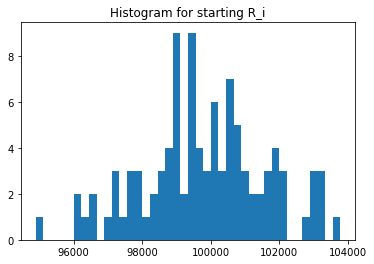

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461, 147145.3008214, 146091.3008214, ...,
       149197.6478981, 146972.6478981, 148076.6478981])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14685., 14640., 14867., 14881., 14816., 14863., 14892.,
       14858., 14855., 14755., 14707., 14629., 14970., 14601., 15045.,
       14569., 14942., 14664., 14639., 14718., 14828., 14811., 14783.,
       14687., 14695., 14898., 14920., 14679., 14796., 14810., 14779.,
       14625., 14758., 14829., 14850., 14744., 14546., 14797., 14761.,
       14782., 14762., 14901., 14722., 14798., 14645., 14684., 14792.,
       14699., 14634., 14729., 14644., 14619., 14624., 14732., 14848.,
       14626., 14688., 14555., 14628., 14778., 14768., 14805., 14689.,
       14588., 14641., 14772., 14746., 14665., 14873., 14791., 14931.,
       14789., 14876., 14822., 14621., 14590., 14874., 14906., 14757.,
       14713., 14564., 14649., 14547., 14620., 14774., 14753., 14703.,
       14544., 14672., 14849., 14721., 14736., 14596., 14715., 14737.,
       14883., 14807., 14709., 14698., 14835., 14845., 14667., 14545.,
       14765., 14663., 14788., 14891., 14924., 14683., 14820., 14657.,
      

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 140948.81243404, 139944.81243404, ...,
       133382.31638219, 135045.31638219, 134208.31638219])

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705, 138873.90621702, 139873.90621702, ...,
       161801.6581911 , 159801.6581911 , 160801.6581911 ])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98873.90621702,  96946.57155313,  98300.46413933,
       100199.48150437,  98998.20113728, 101180.51050906,  97235.50940288,
       100969.51802499, 104477.83237737,  97881.19793848,  98038.615829  ,
       103148.09539139, 105590.47096851,  98178.13568982,  99358.010978  ,
        98445.85349378,  99472.13737047,  97898.01131135, 100137.2062818 ,
       101259.0699654 , 100307.89249179, 100951.58925445,  99854.46274564,
       100120.52094464, 105049.33561649,  99616.05549329,  98320.83961603,
       100429.06252756,  99851.23382117,  99946.99160514,  97740.21245131,
        96235.52751612,  99554.11613914, 101594.48408897, 100116.47357552,
       102845.02743862,  98197.84354311,  99930.60748919, 100950.8729639 ,
       100604.85630104, 102311.73286339, 101515.07839878, 101438.1008063 ,
        97689.97679087,  98236.87716117, 100952.07476459, 103801.6581911 ,
        97645.78559626,  98649.29158138, 100465.5412454 ,  98581.59550495,
       100773.53414876, 1

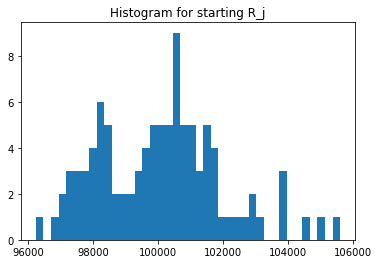

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305, 100754.1504107 , 100716.70989512,  97724.53133637,
        99418.36888778,  98803.91770933,  98806.02781904,  97190.99577765,
        98917.24782412,  98968.91569358, 100135.13413065, 100222.06920894,
       102999.60072183, 101658.52873405, 100183.67167506,  97588.11897026,
        96103.21613609, 100418.55894768,  96156.84900525, 103773.6459511 ,
        99973.01189183, 100523.42344369,  99561.66365956,  97907.00331514,
       100659.60234077,  98605.84383074, 100485.04873236,  99072.95740148,
        96609.32594441, 101847.47977958,  96246.09556884,  98946.17755173,
       101090.91919622,  99065.53858503,  99531.97132416,  99077.5383033 ,
        98396.17492283, 102974.38116142,  97215.18620668, 100010.22641368,
        99549.51030708,  97994.91492509,  98881.83582563,  99001.60364256,
        98200.52092999, 100630.41060507, 100725.33686386,  98335.73721185,
        99383.54500623, 101879.82436946, 100664.65974829,  98718.17574026,
       101230.74232906, 1

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705,  98873.90621702,  98300.46413933,  98038.615829  ,
        98998.20113728,  96946.57155313, 100199.48150437,  97235.50940288,
       101180.51050906, 100969.51802499, 102845.02743862, 104477.83237737,
        97881.19793848,  98178.13568982,  99472.13737047, 103148.09539139,
       105590.47096851,  98445.85349378,  99358.010978  , 100137.2062818 ,
        97898.01131135, 100307.89249179, 101259.0699654 , 100951.58925445,
        99854.46274564, 100429.06252756, 100120.52094464,  99946.99160514,
        99616.05549329, 100950.8729639 , 105049.33561649,  98320.83961603,
        99851.23382117, 100516.37794145,  97740.21245131,  96235.52751612,
        99554.11613914, 101594.48408897, 101515.07839878, 100116.47357552,
        98197.84354311,  99930.60748919, 100604.85630104, 101438.1008063 ,
       102311.73286339,  97689.97679087,  98236.87716117, 103801.6581911 ,
       100952.07476459,  98581.59550495,  97645.78559626,  98503.98161484,
       100465.5412454 ,  

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 9.96195642e+09, 9.90049933e+09, 9.58077778e+09,
       9.84223968e+09, 9.57870108e+09, 9.90031276e+09, 9.45041598e+09,
       1.00084976e+10, 9.99284372e+09, 1.02984006e+10, 1.04709845e+10,
       1.00817243e+10, 9.98064483e+09, 9.96548395e+09, 1.00660286e+10,
       1.01475839e+10, 9.88579074e+09, 9.55395326e+09, 1.03916030e+10,
       9.78715905e+09, 1.00832928e+10, 1.00815215e+10, 9.88386758e+09,
       1.00513105e+10, 9.90289246e+09, 1.00606154e+10, 9.90204404e+09,
       9.62383997e+09, 1.02815920e+10, 1.01105884e+10, 9.72847125e+09,
       1.00940530e+10, 9.95770912e+09, 9.72827602e+09, 9.53477916e+09,
       9.79574423e+09, 1.04616291e+10, 9.86880725e+09, 1.00126712e+10,
       9.77554724e+09, 9.79269138e+09, 9.94799288e+09, 1.00425347e+10,
       1.00470655e+10, 9.83058248e+09, 9.89494254e+09, 1.02074126e+10,
       1.00329751e+10, 1.00434756e+10, 9.82947978e+09, 9.72413337e+09,
       1.01702013e+10, 1.01454789e+10, 9.73228658e+09, 9.99227694e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


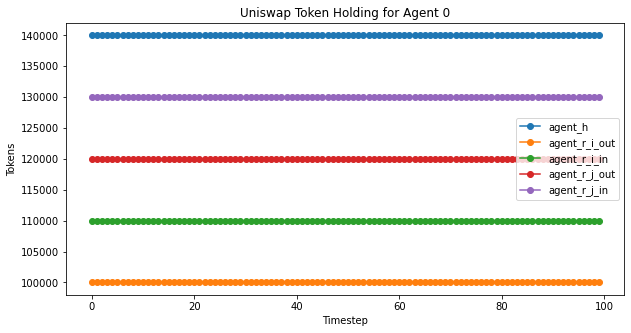

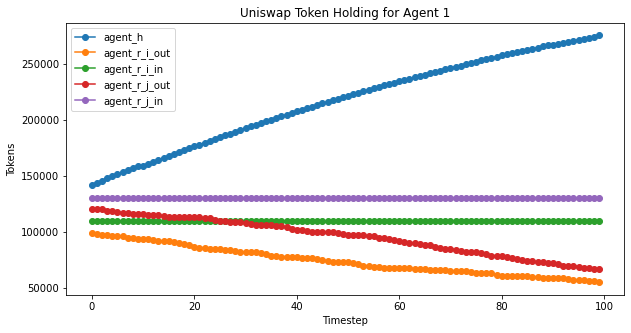

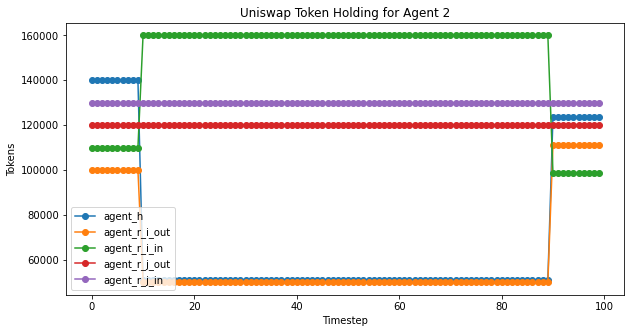

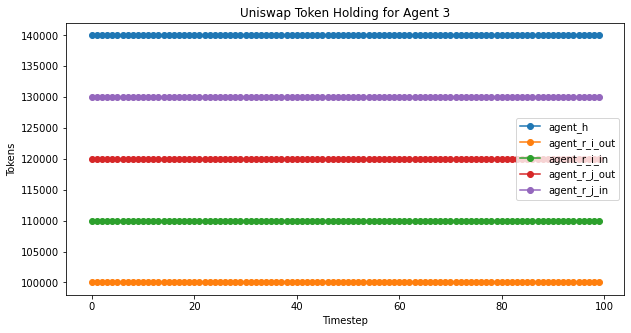

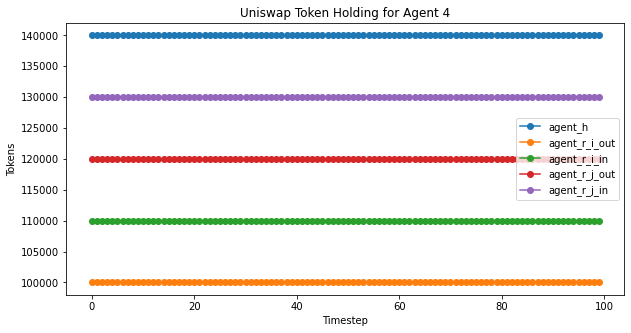

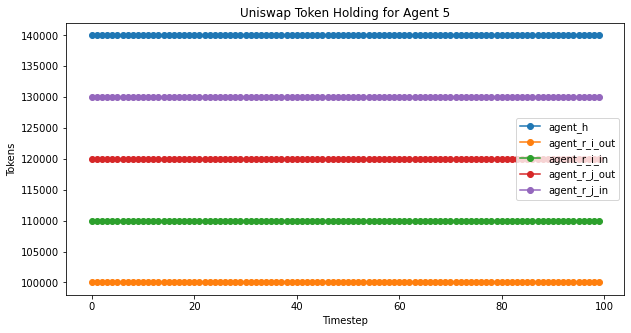

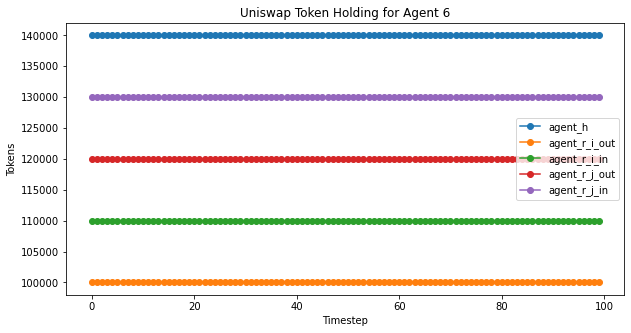

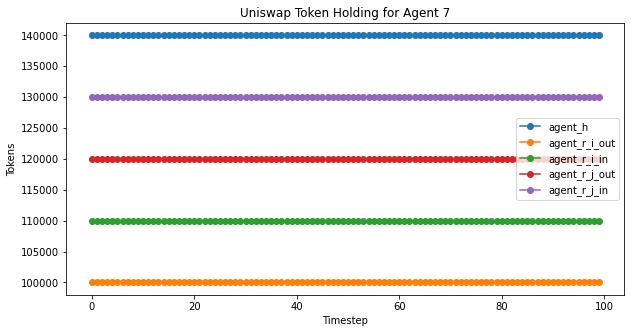

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


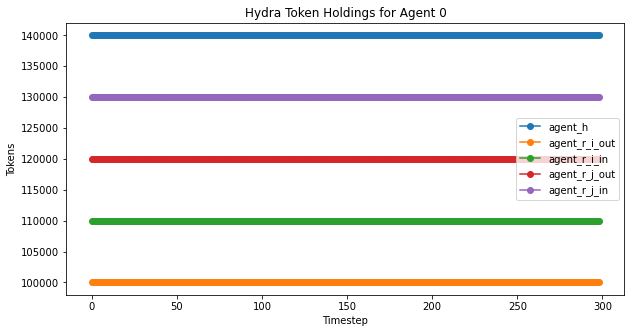

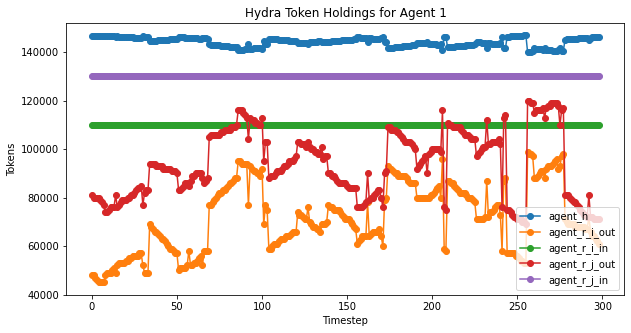

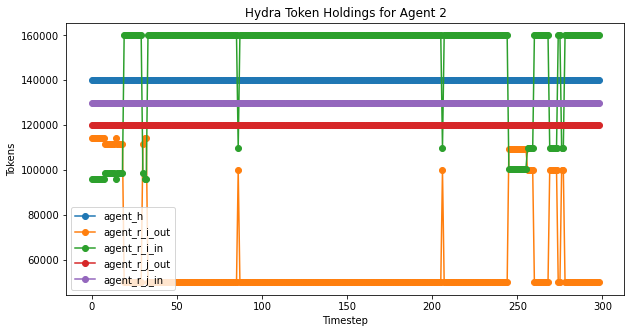

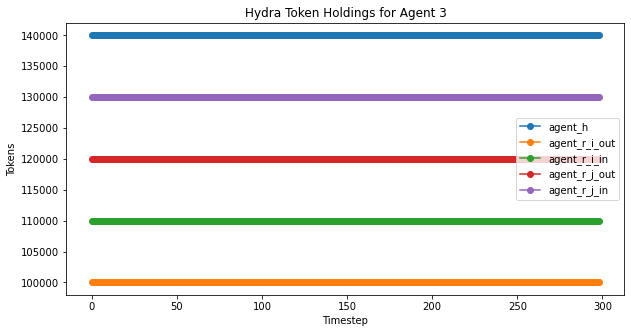

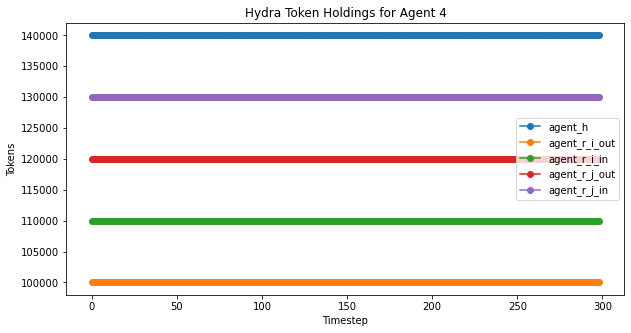

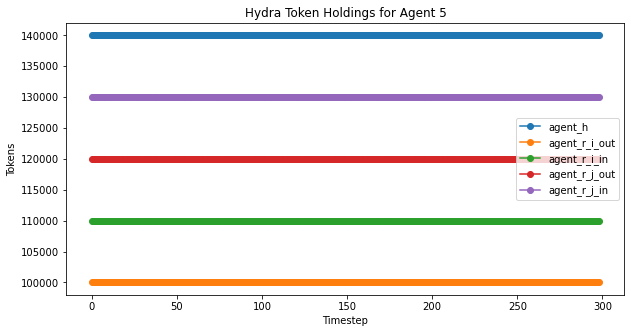

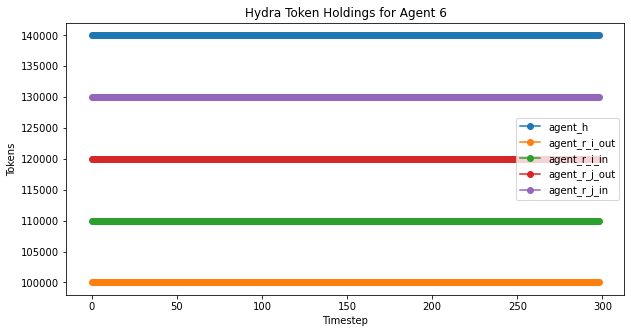

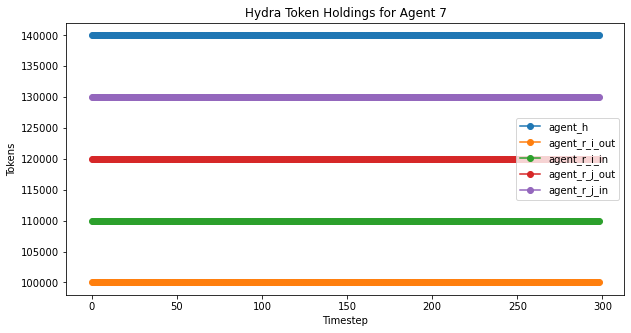

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

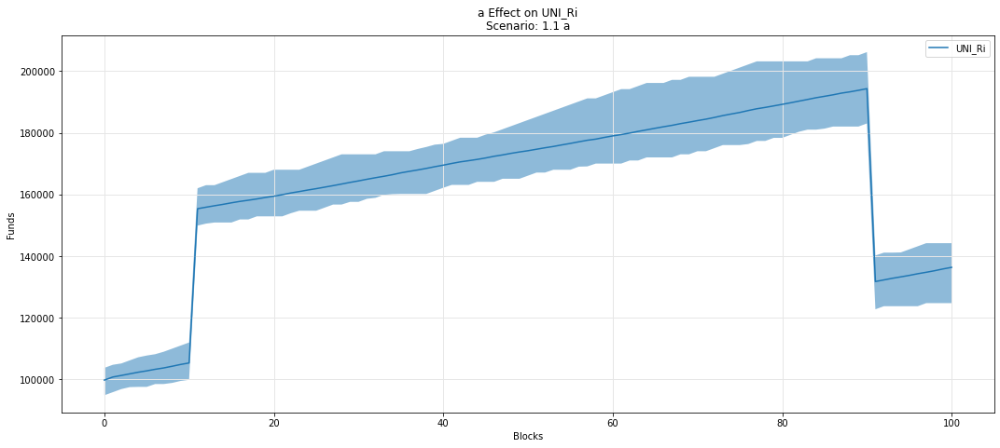

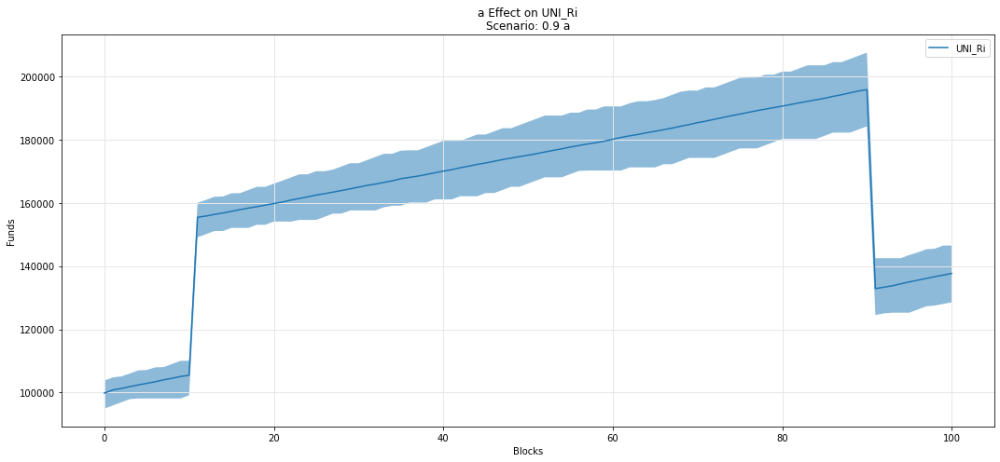

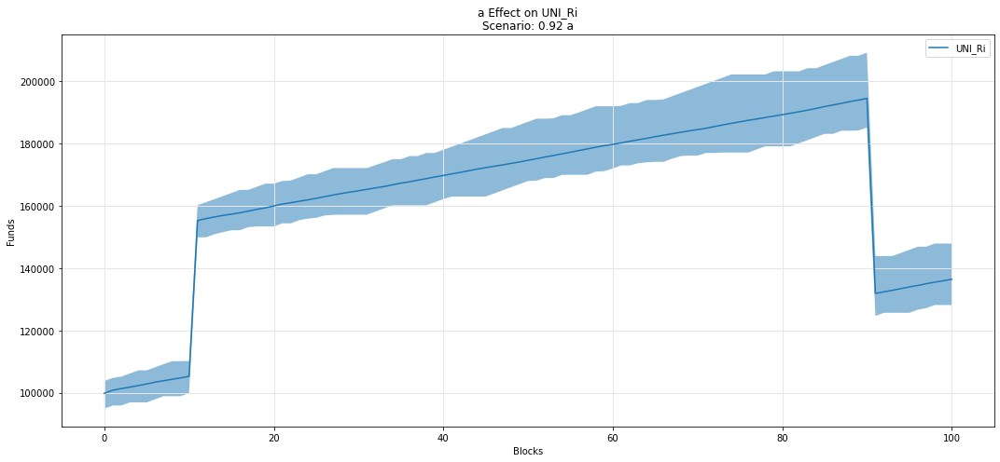

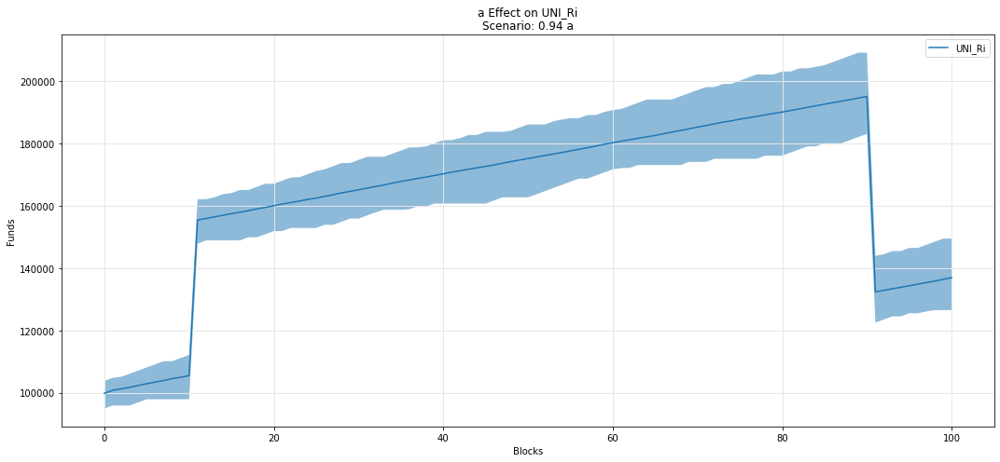

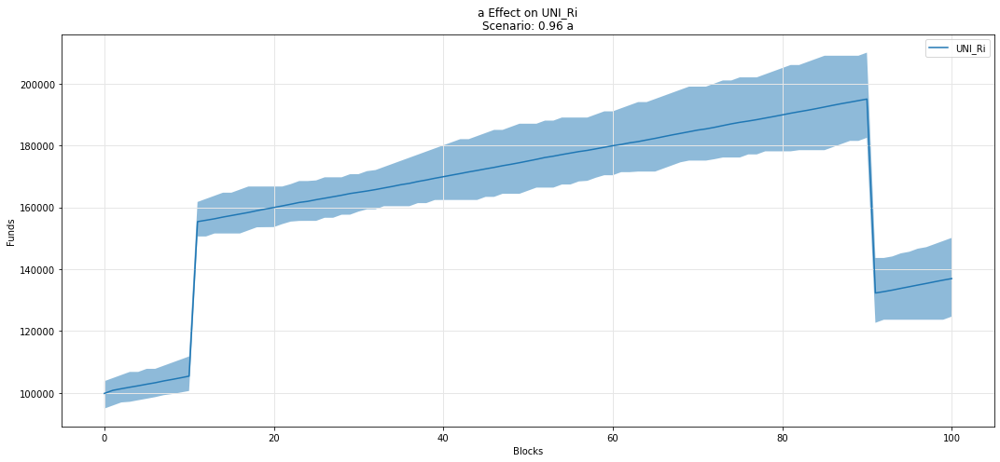

...

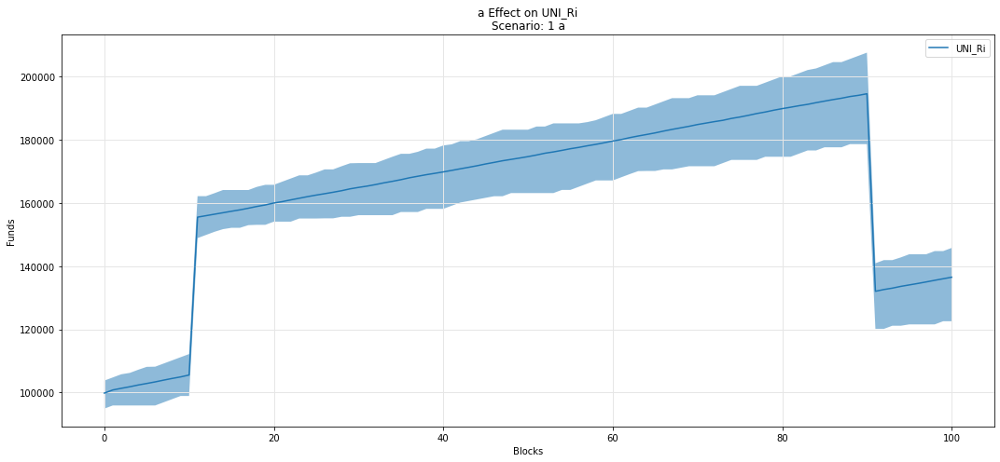

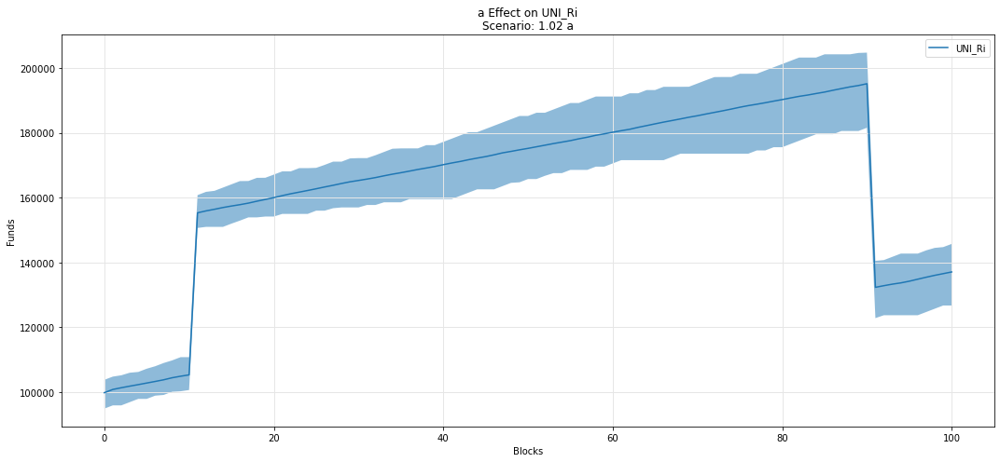

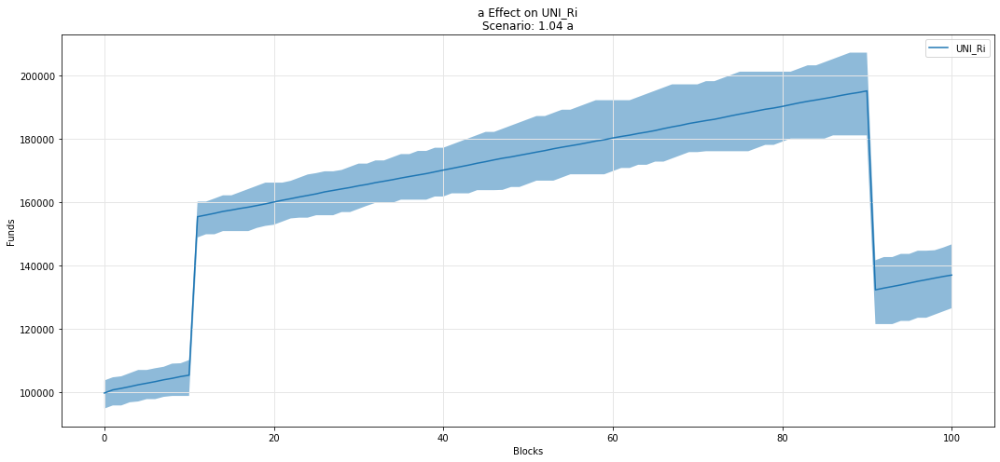

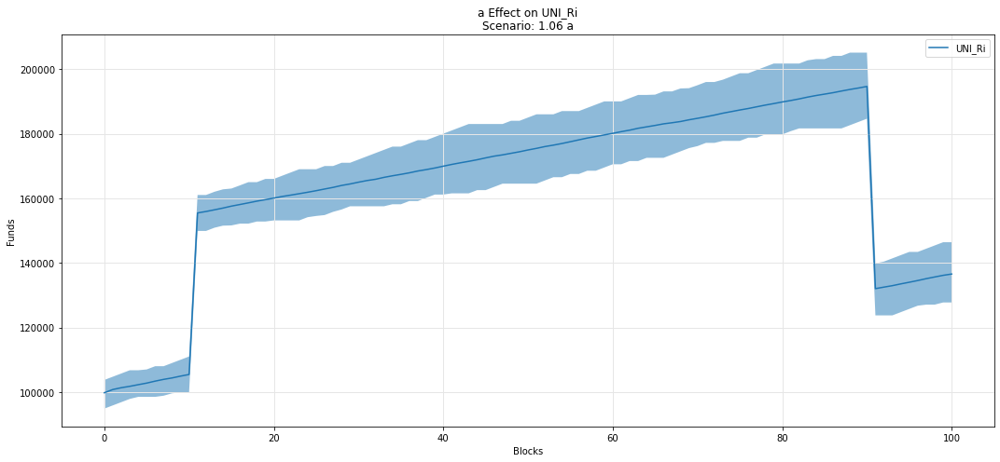

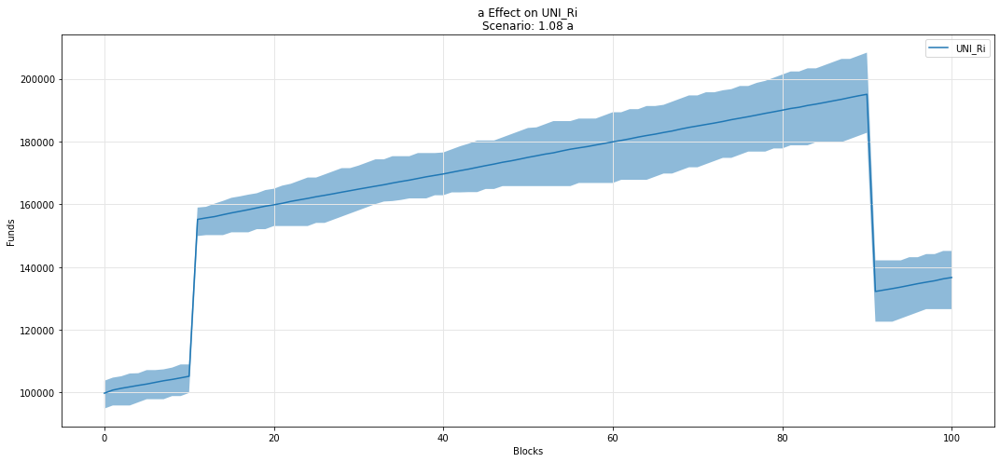

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

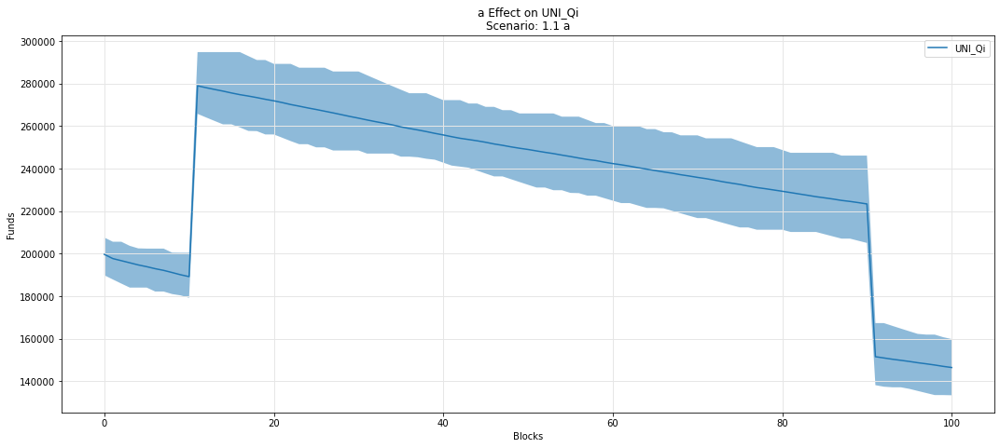

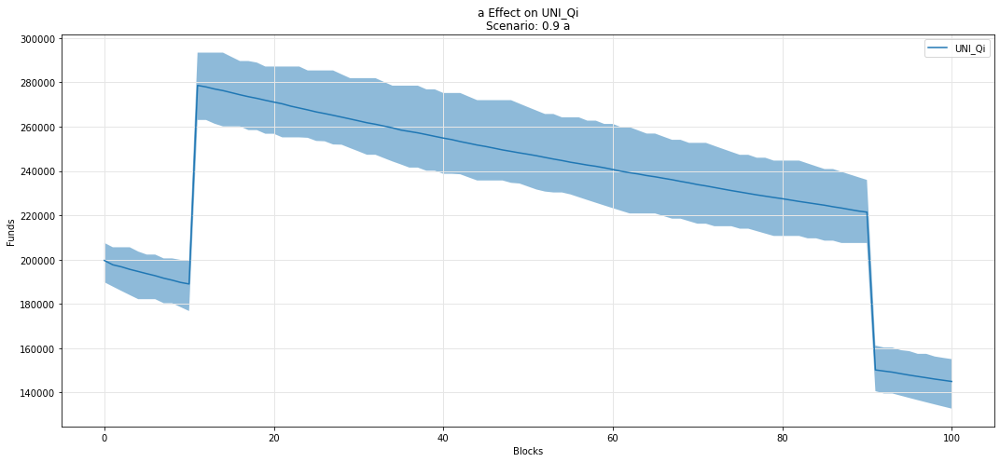

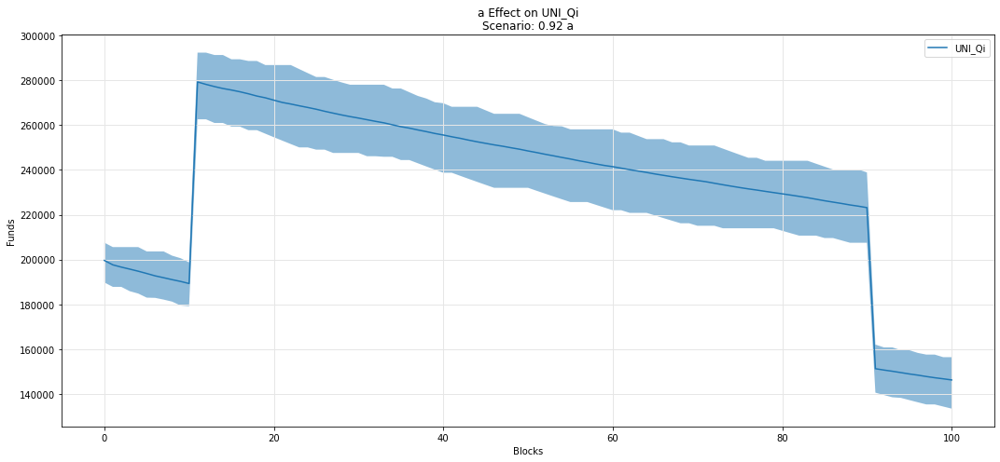

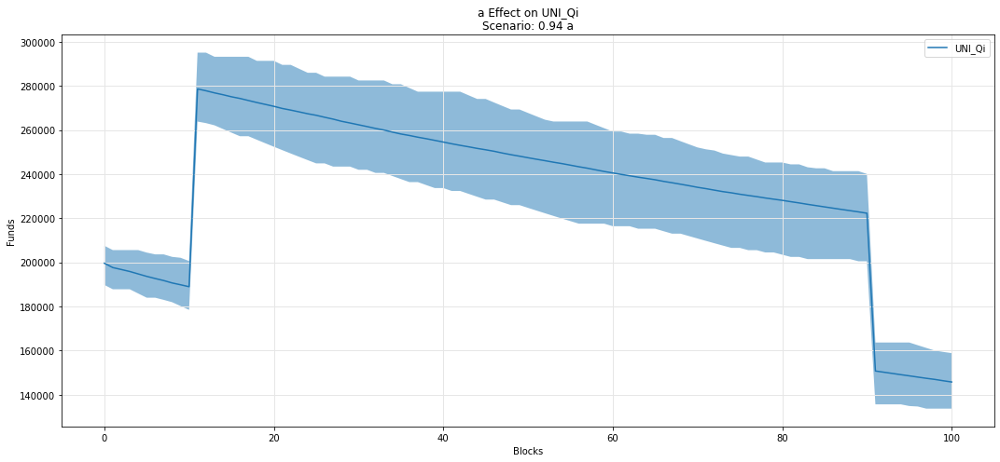

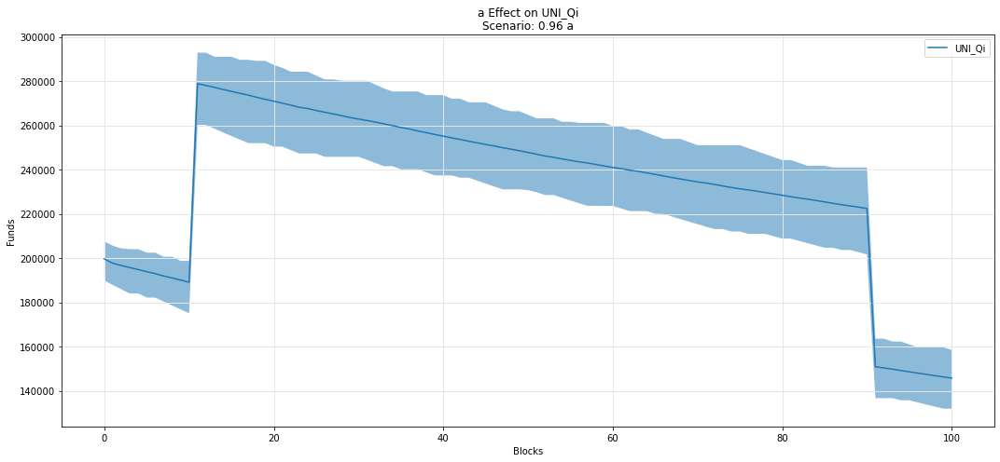

...

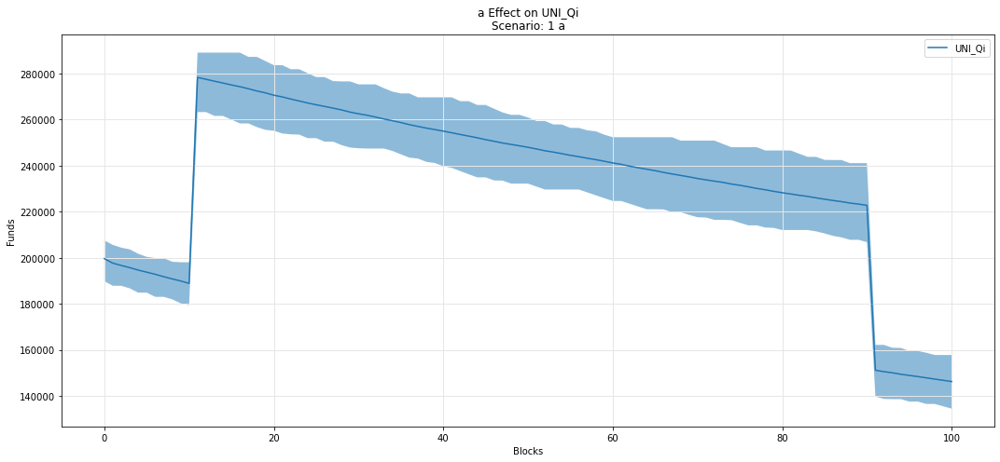

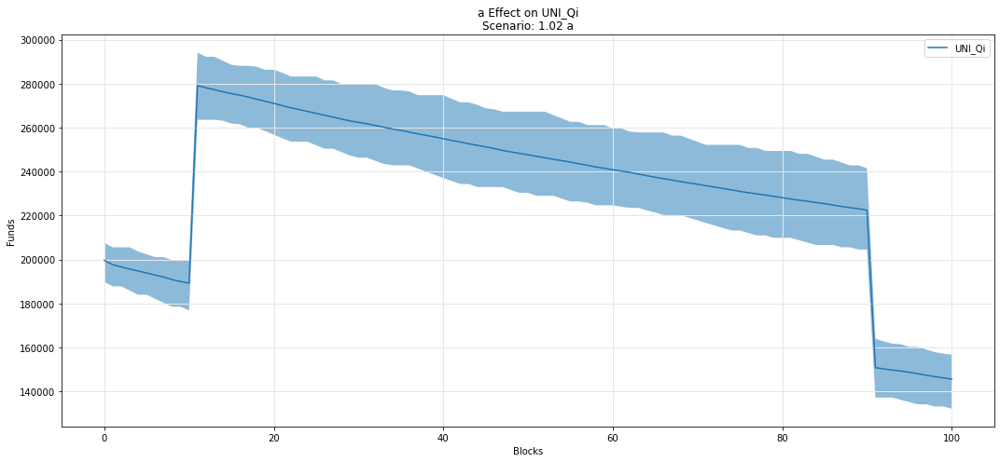

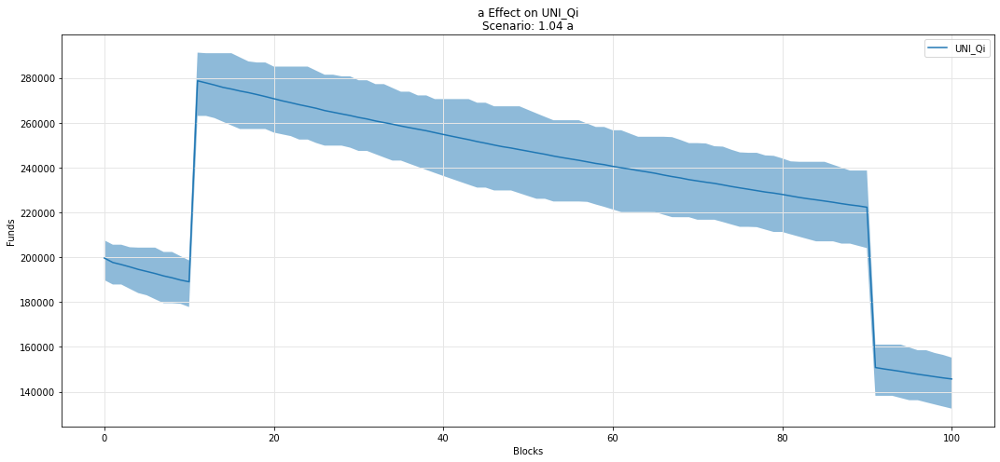

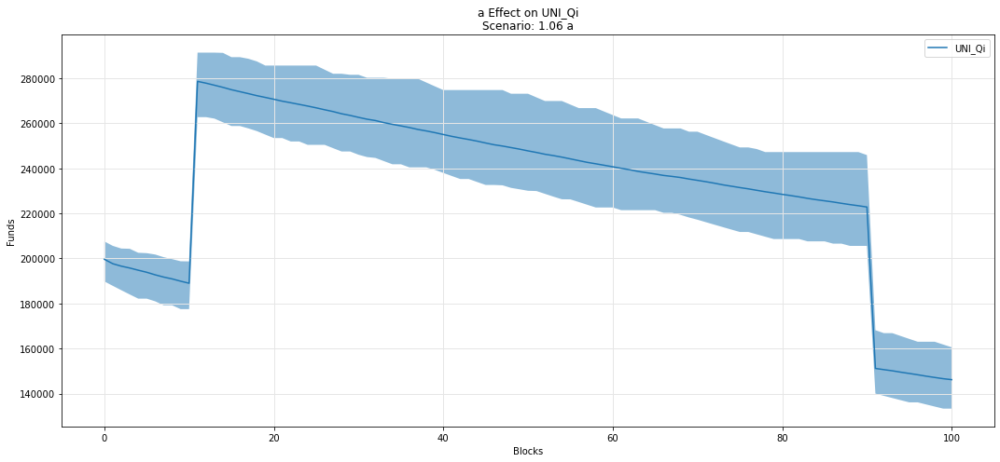

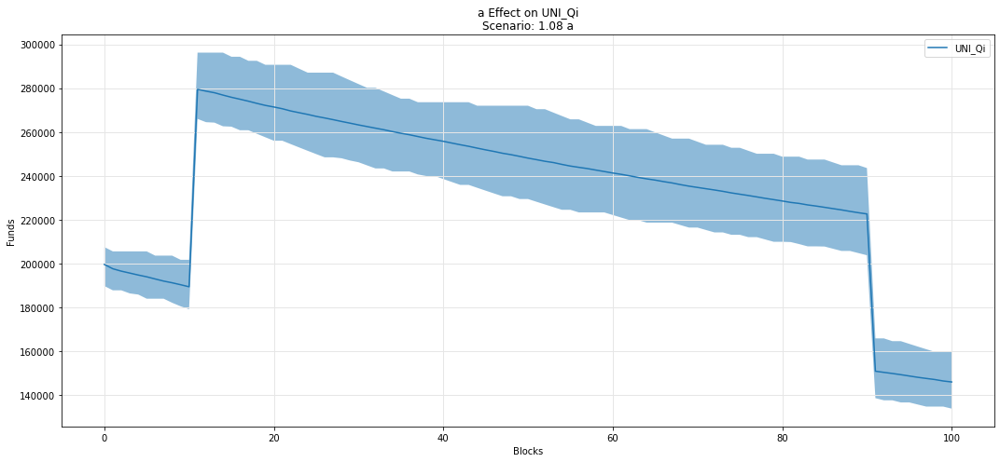

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

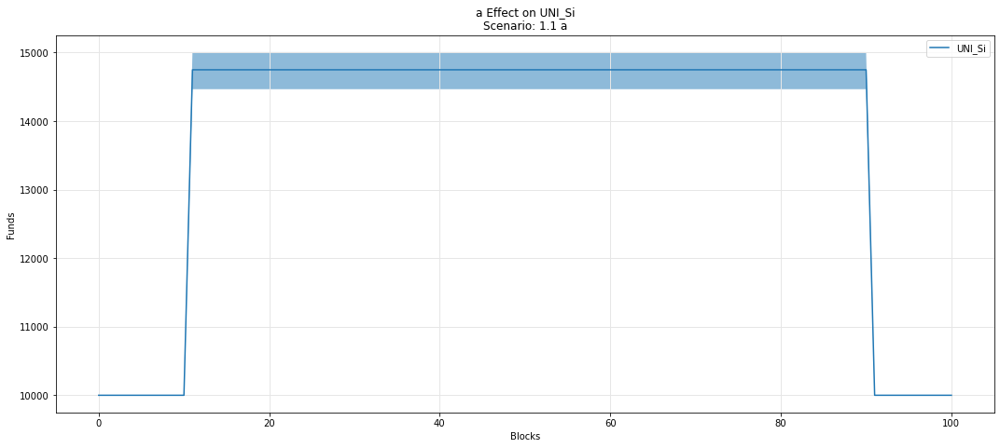

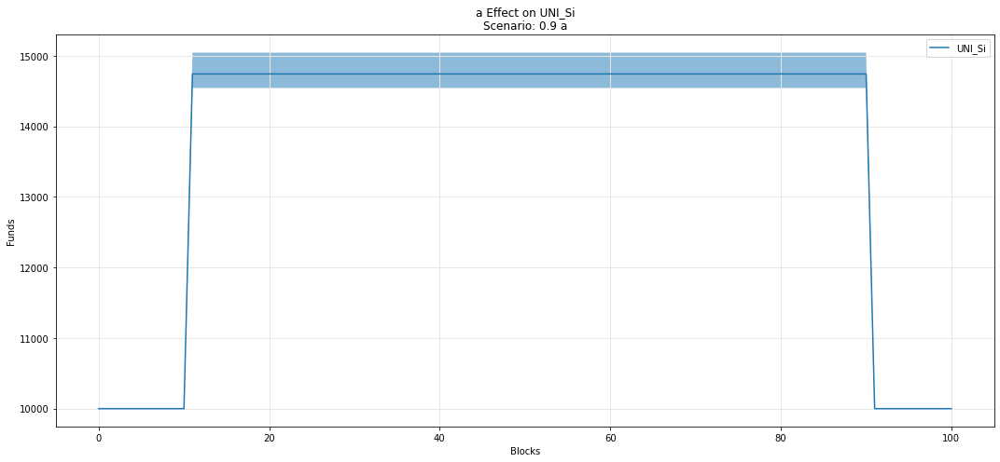

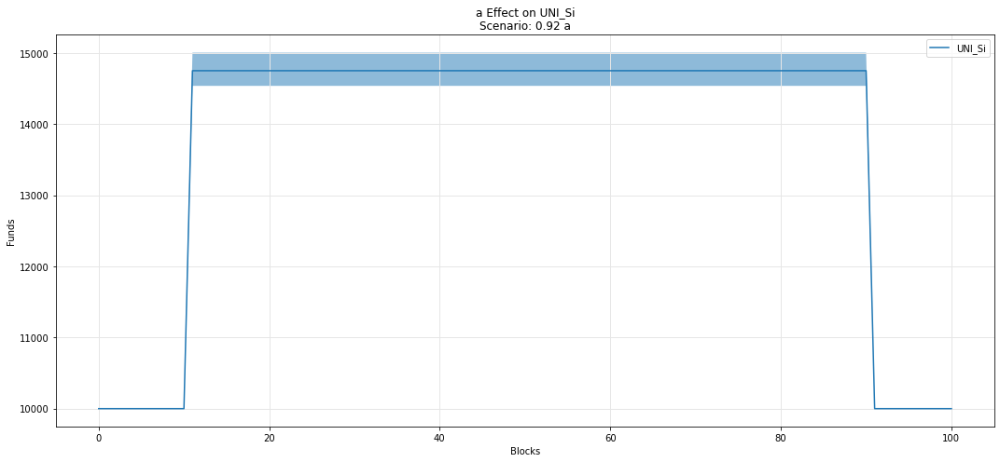

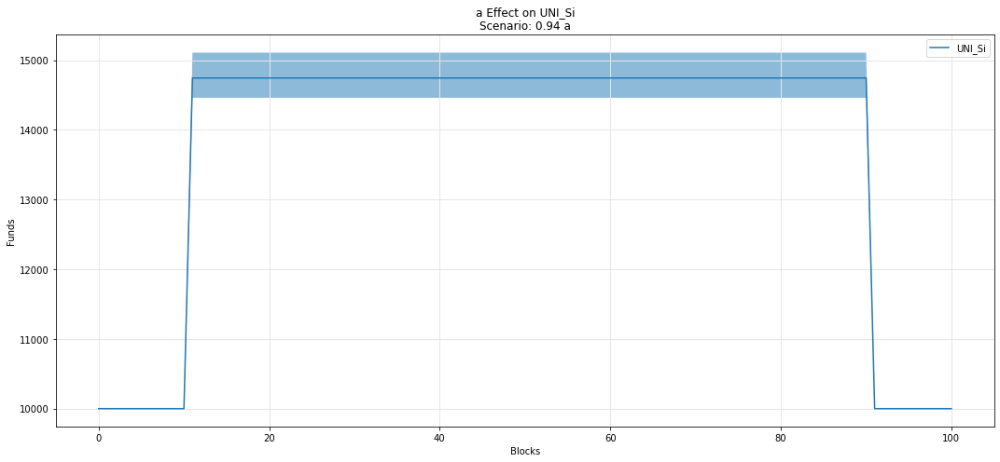

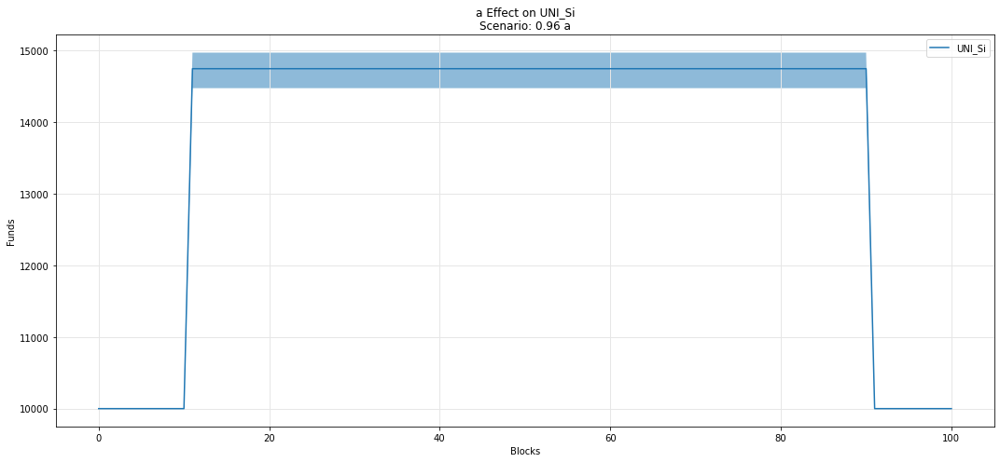

...

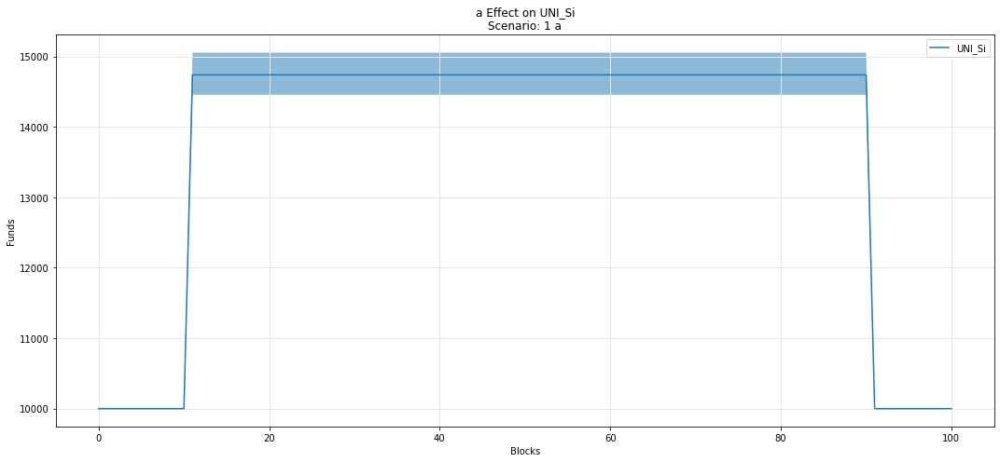

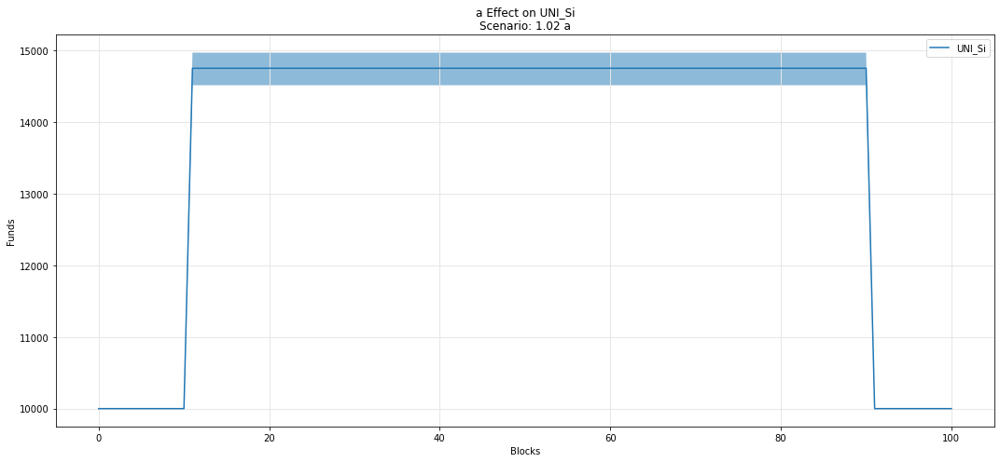

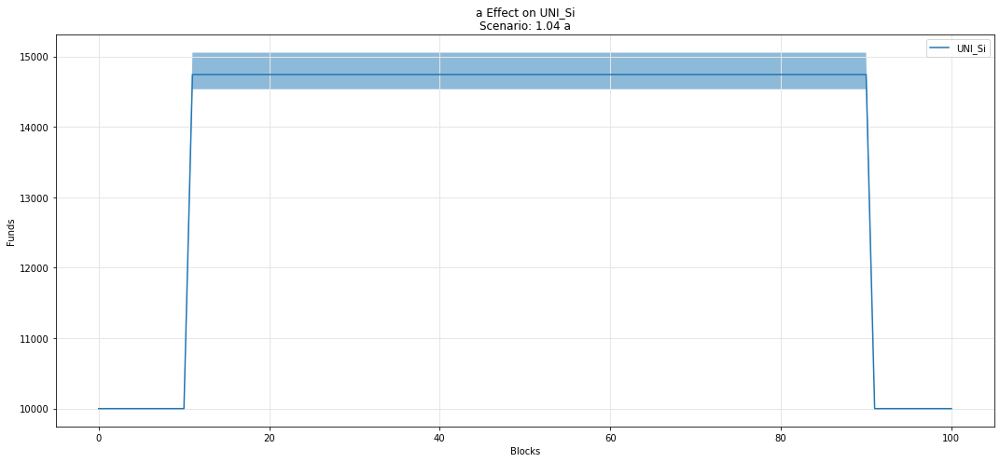

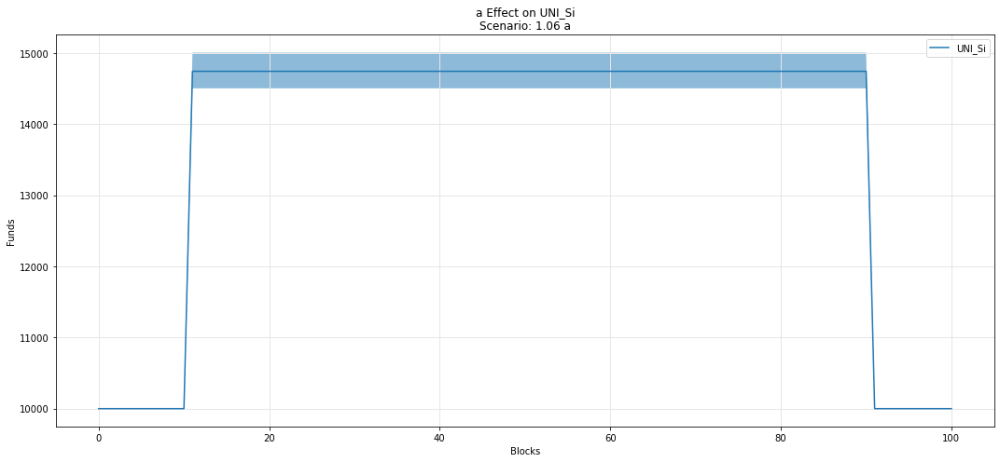

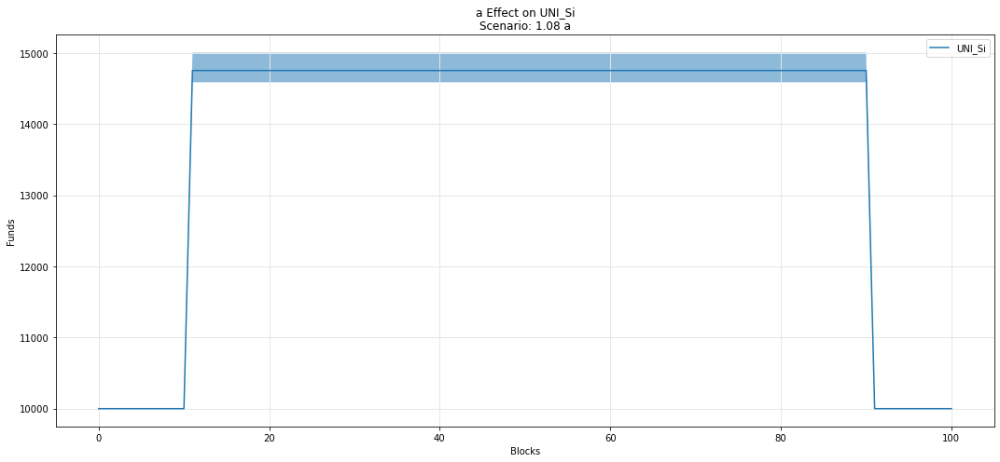

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

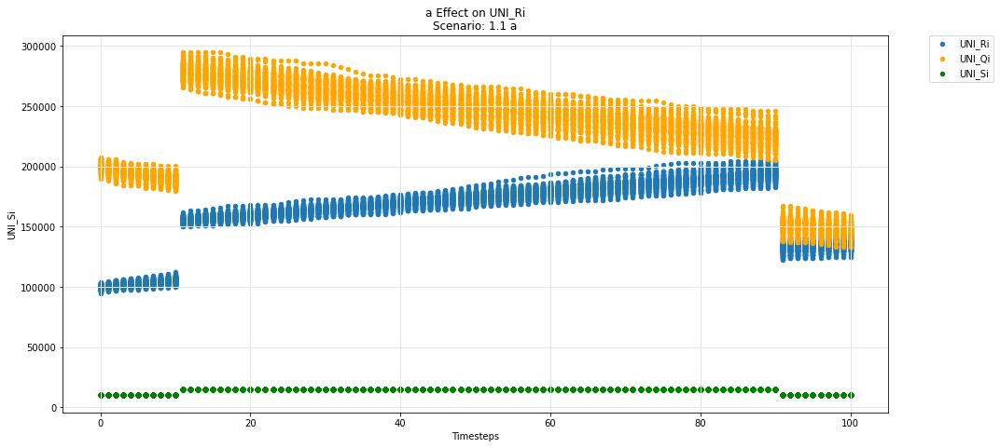

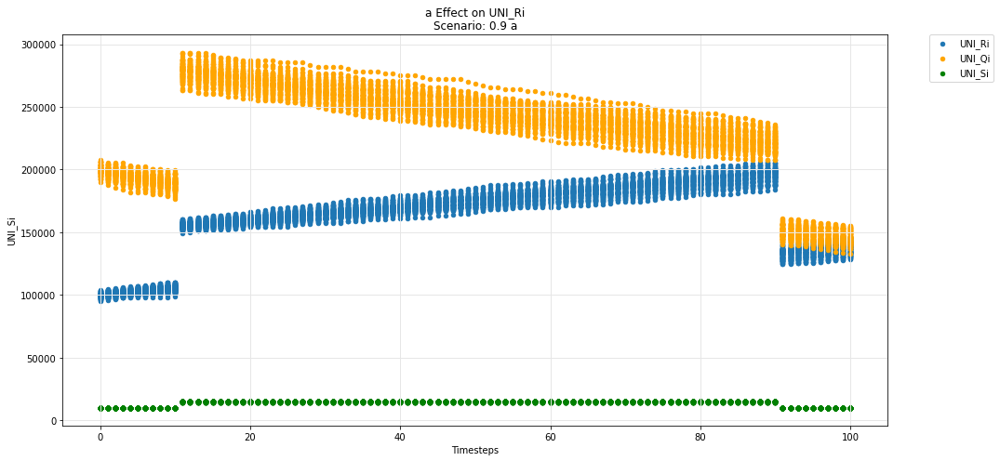

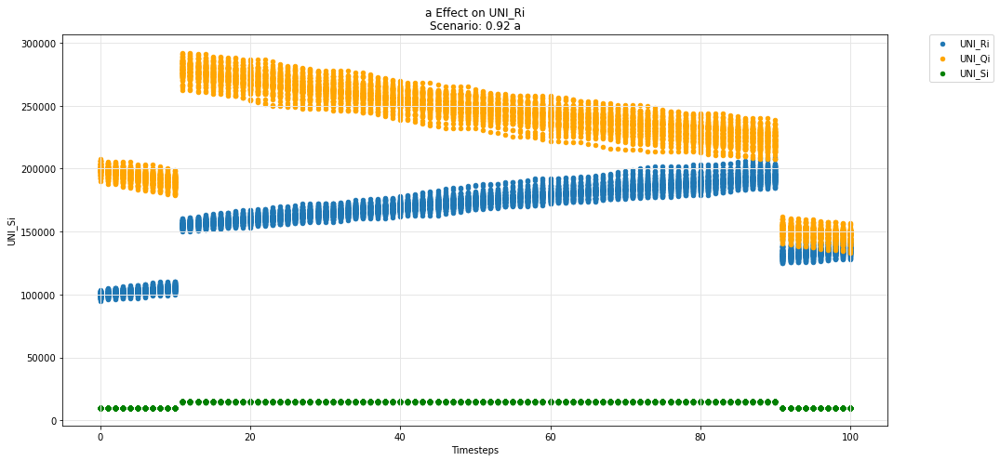

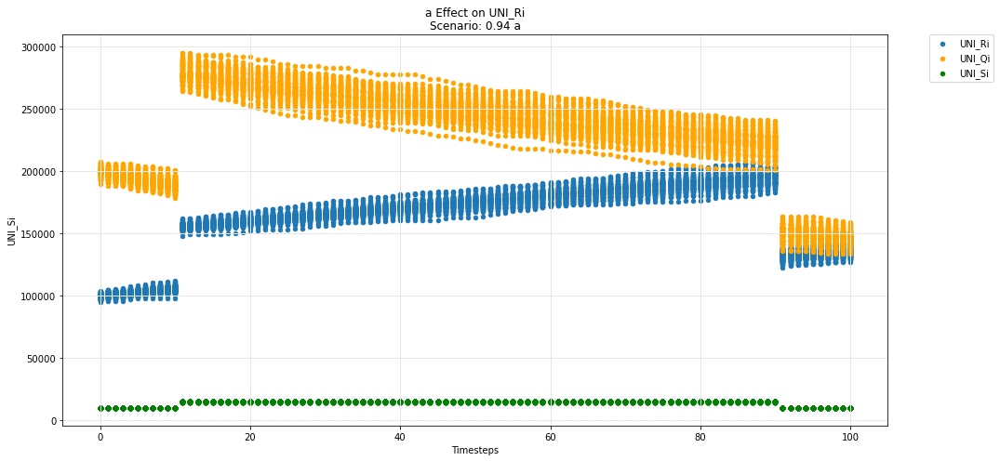

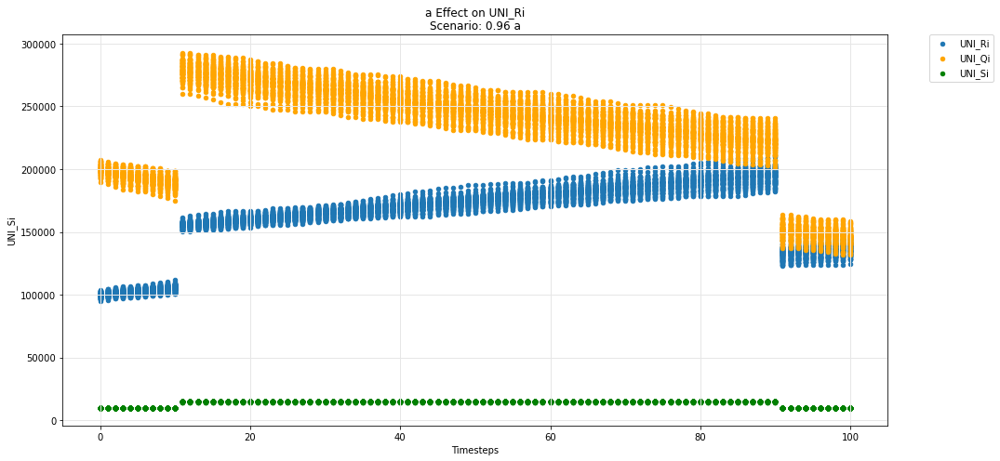

...

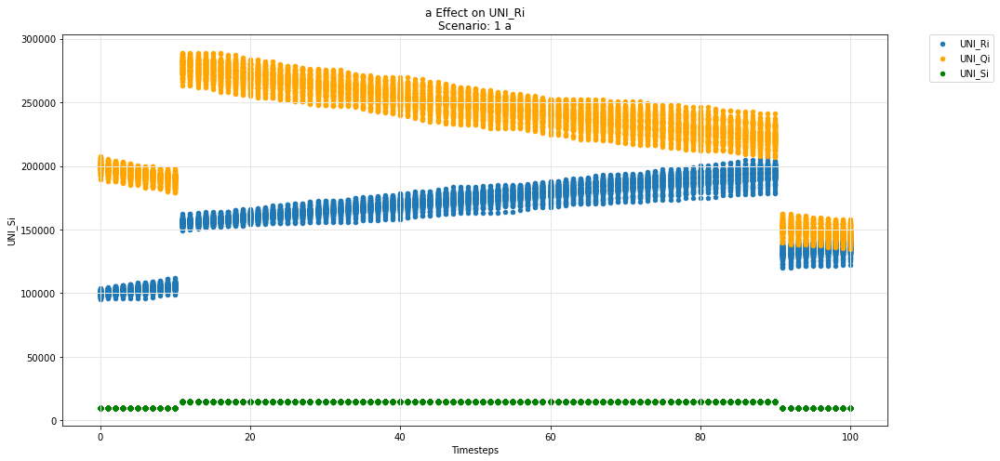

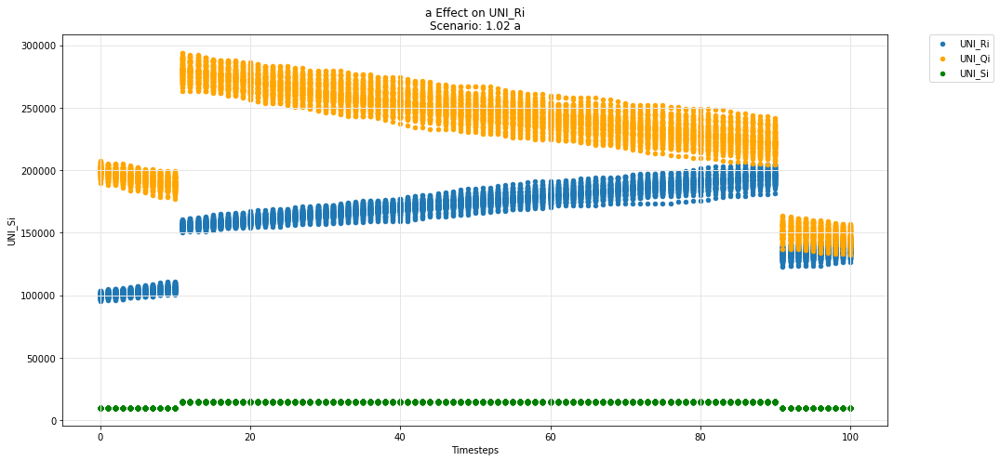

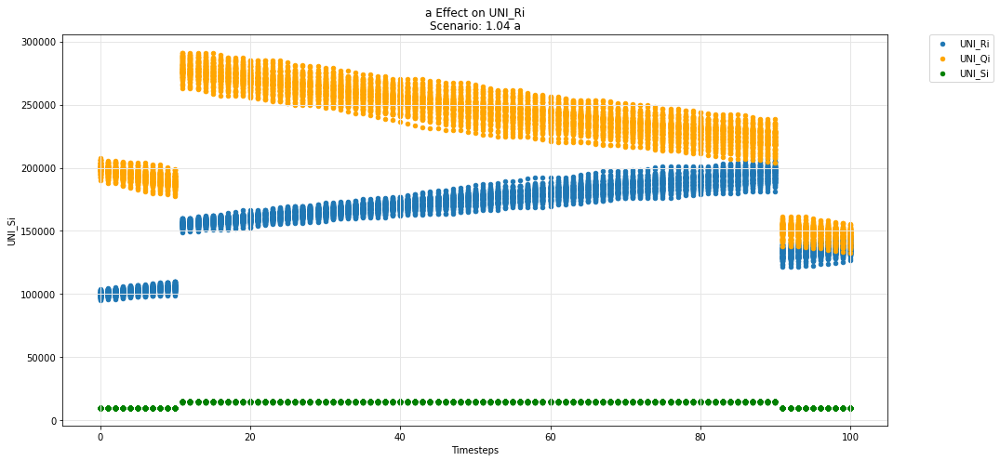

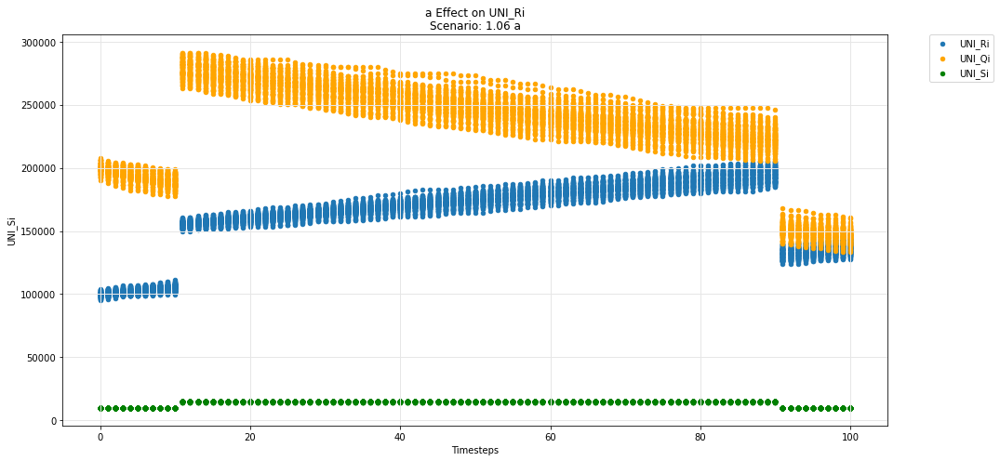

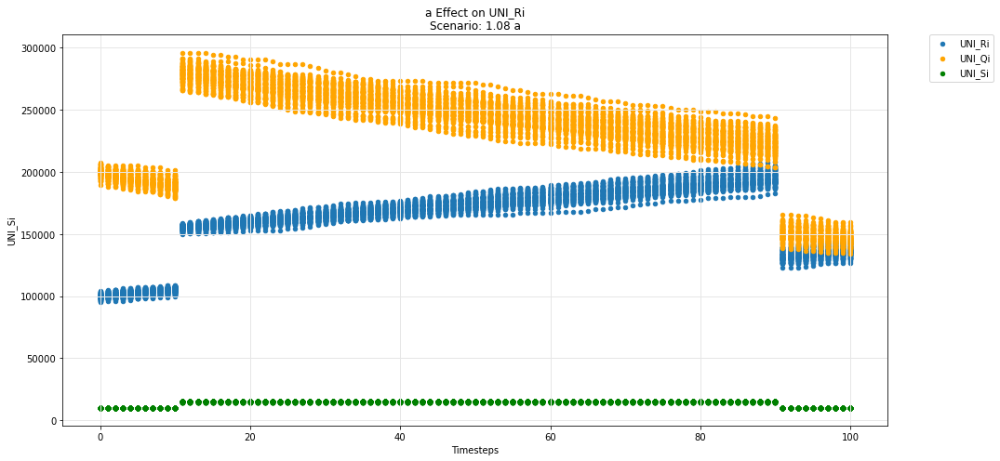

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

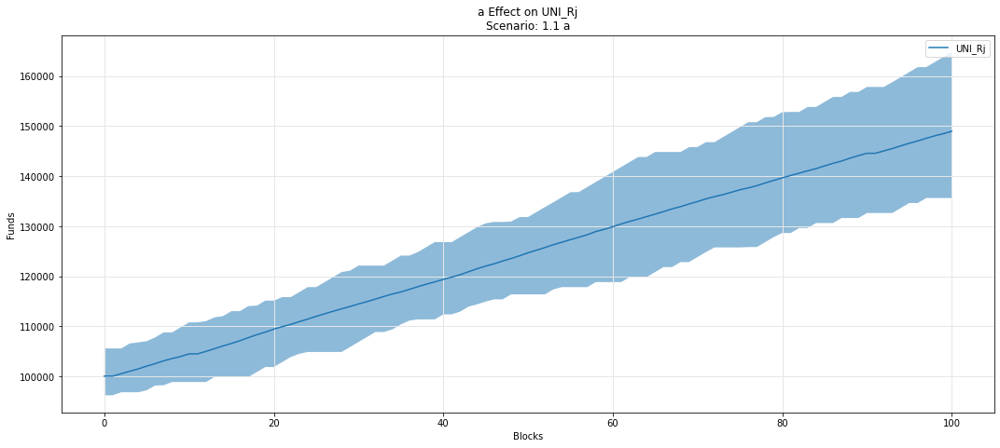

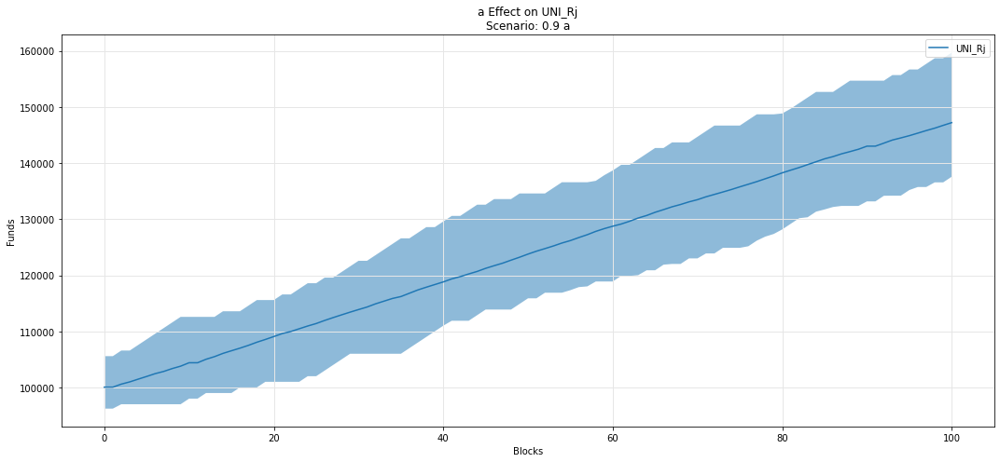

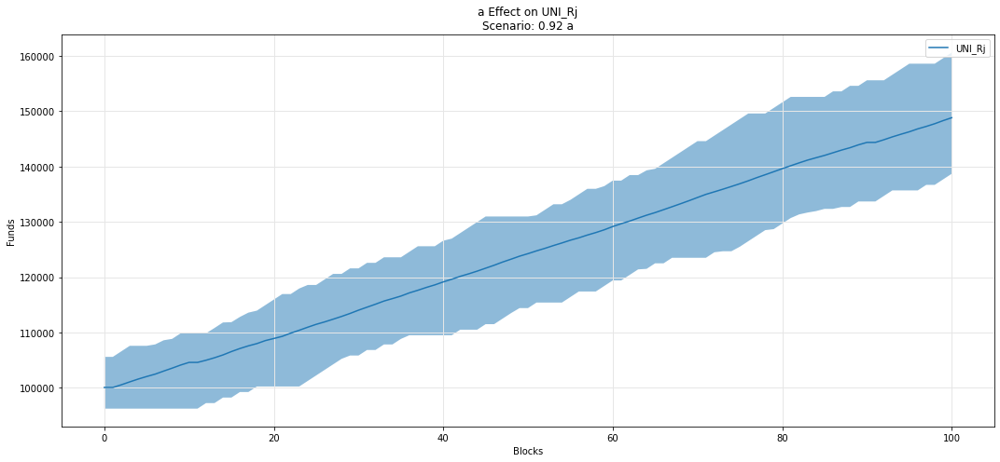

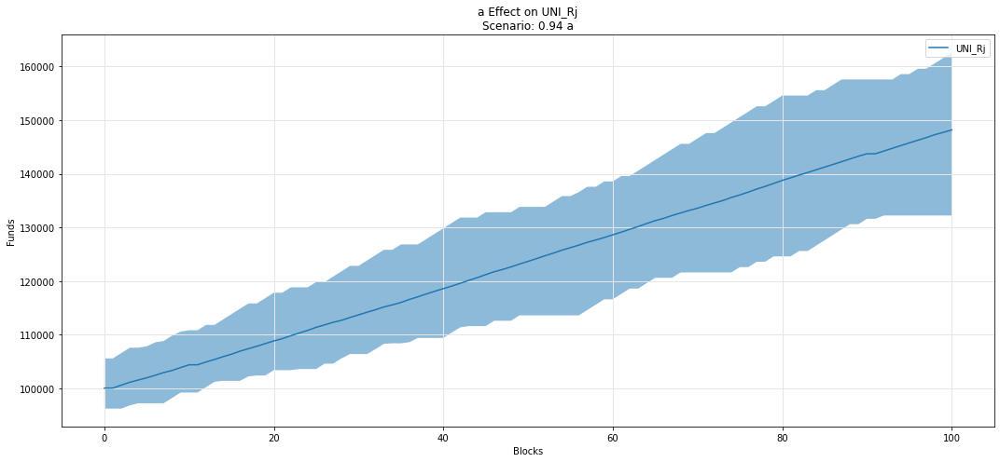

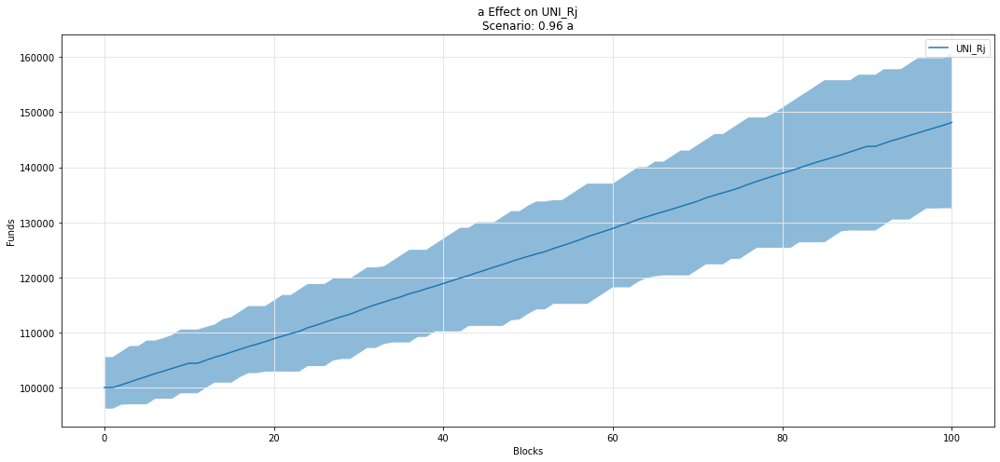

...

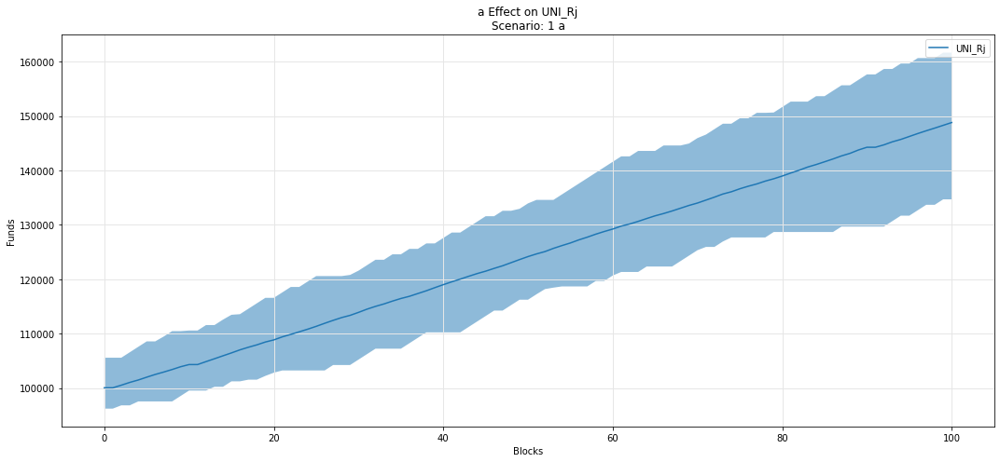

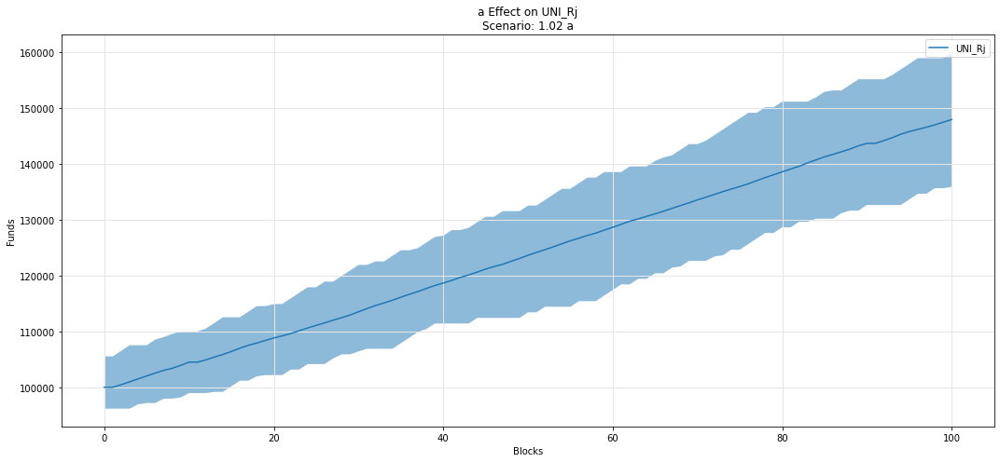

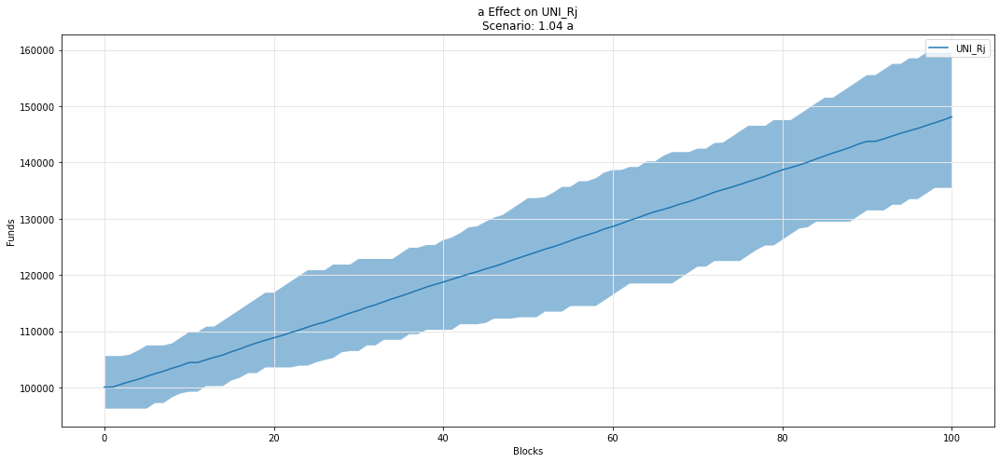

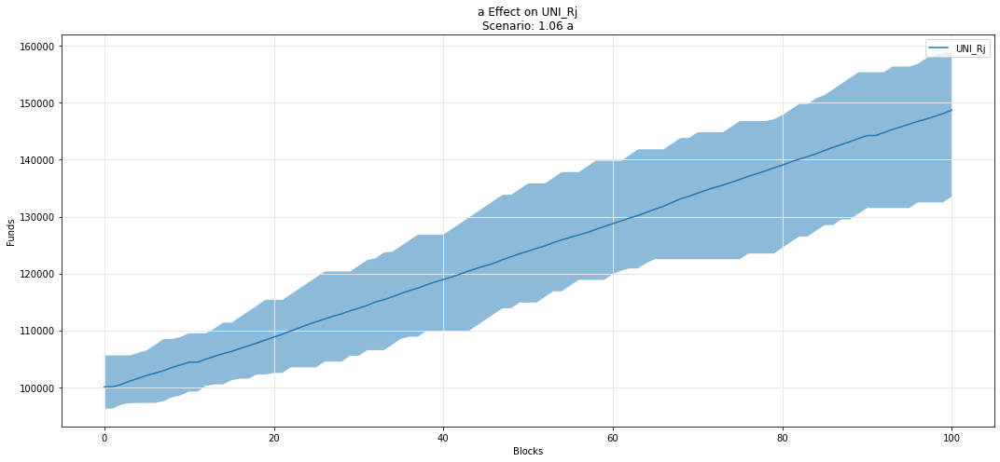

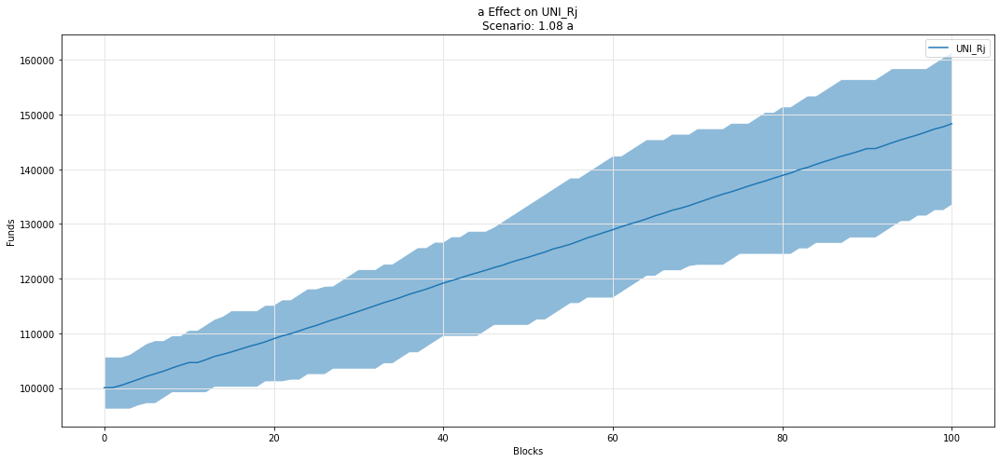

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

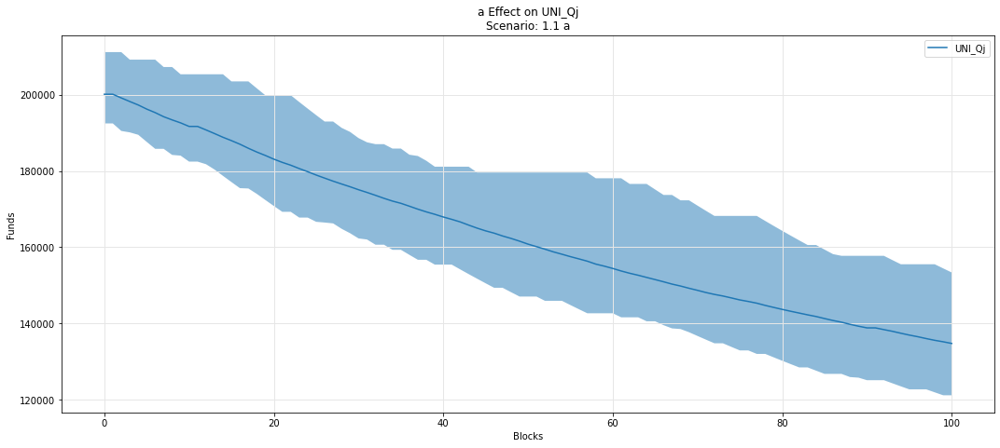

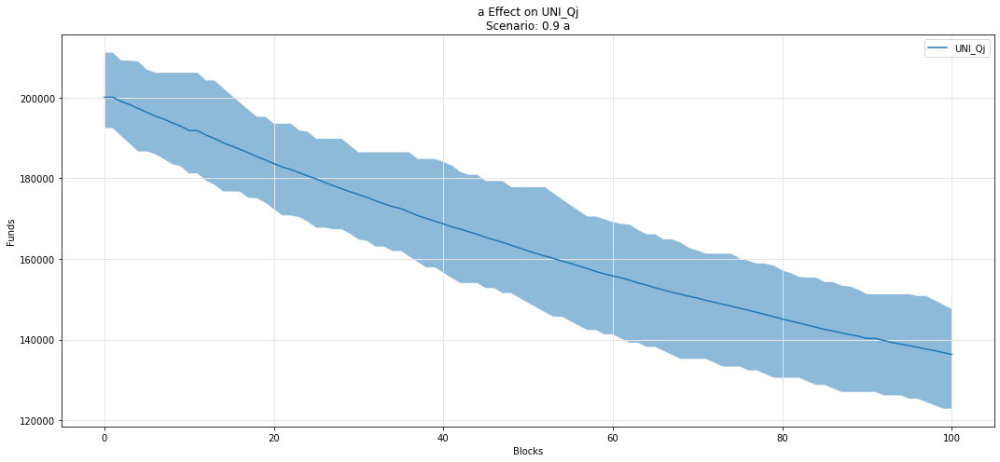

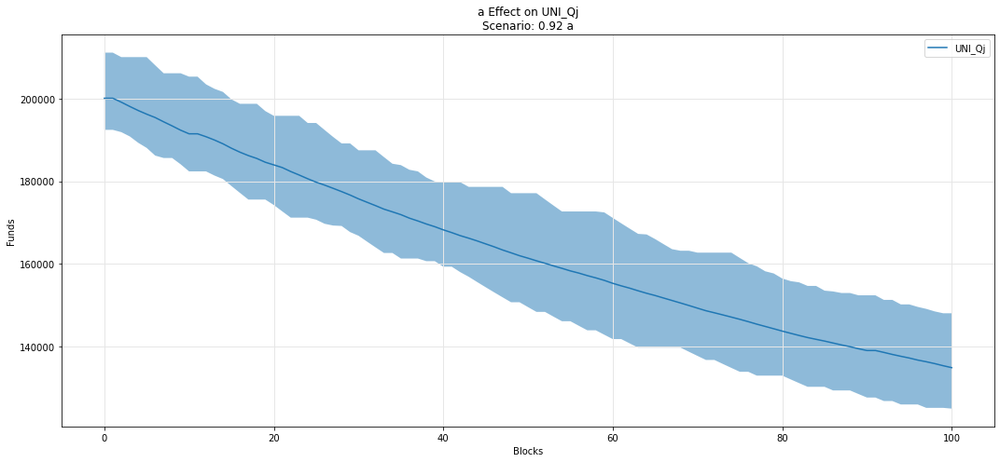

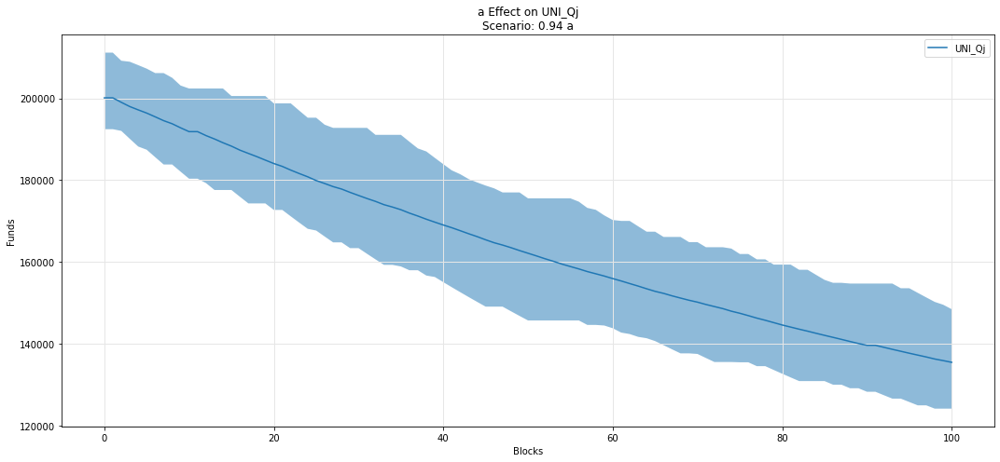

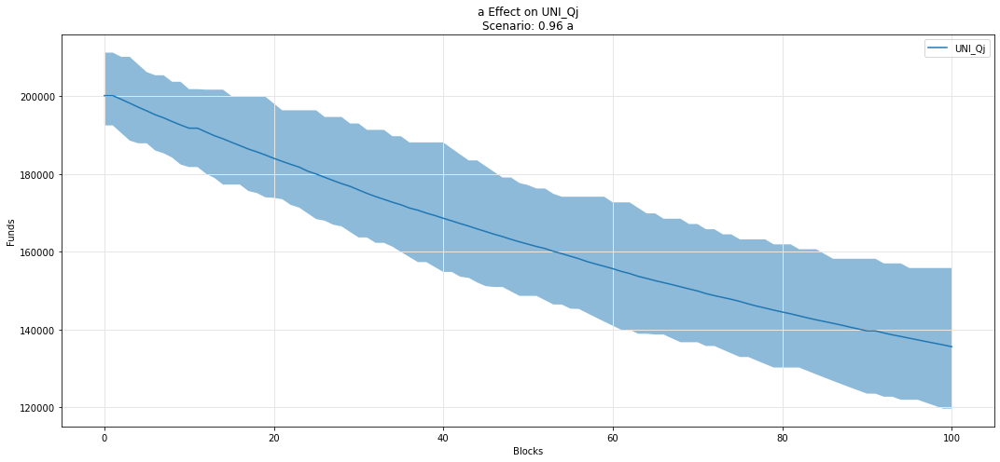

...

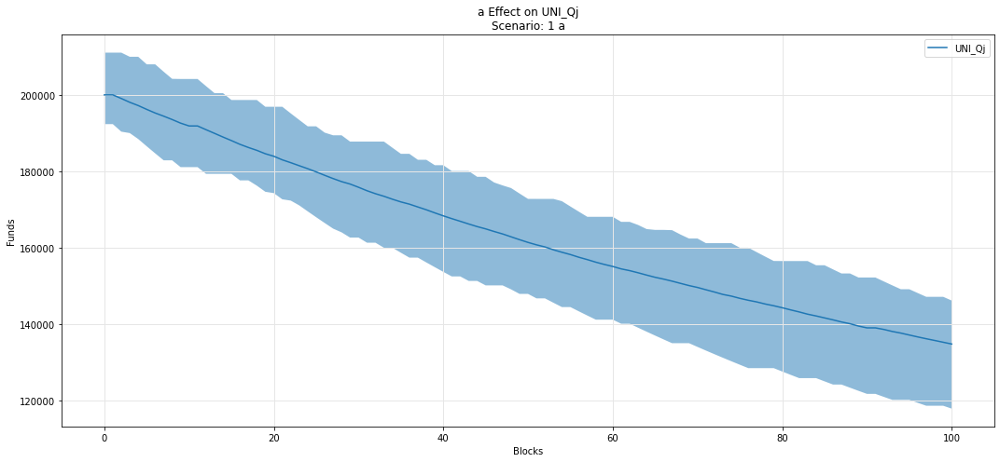

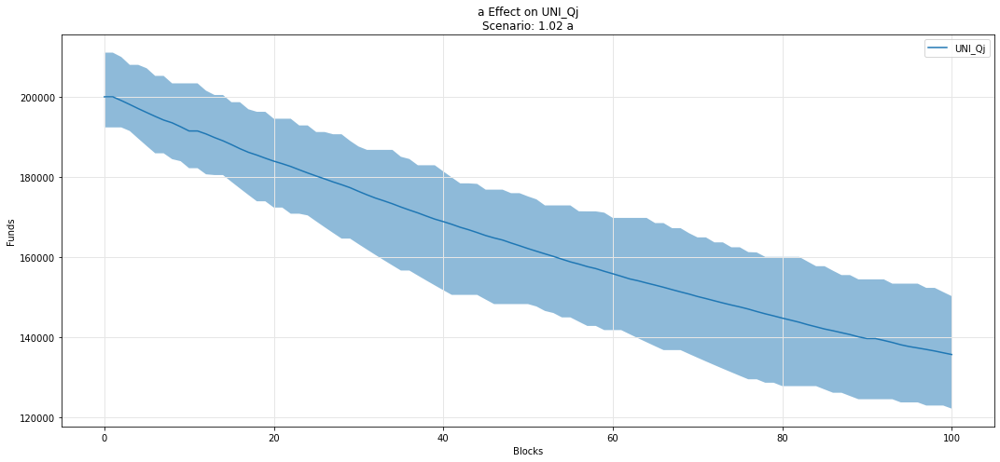

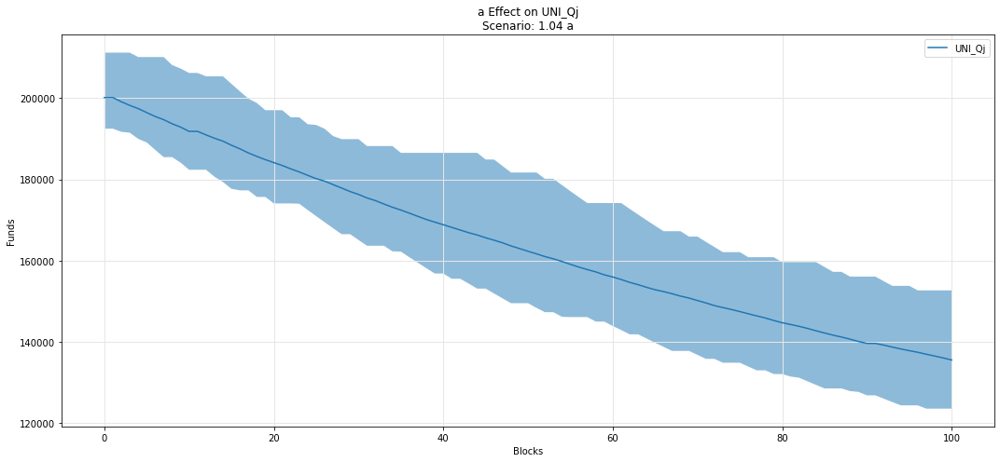

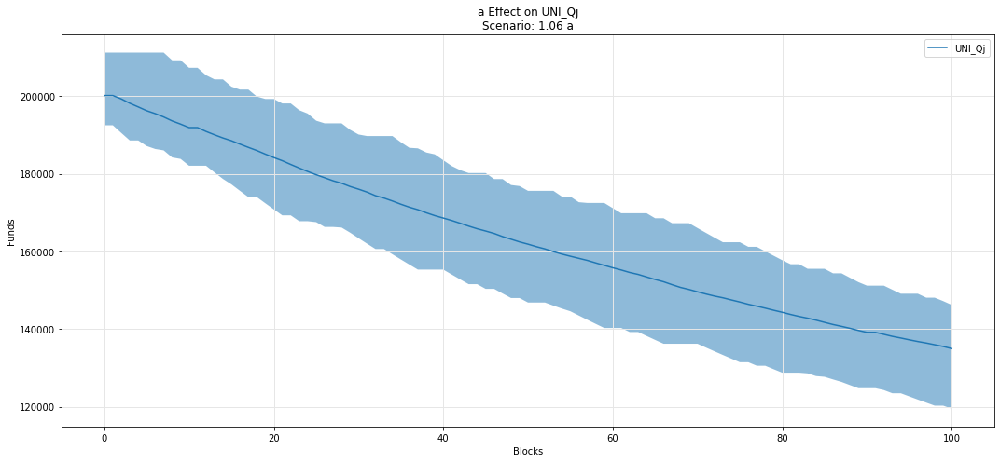

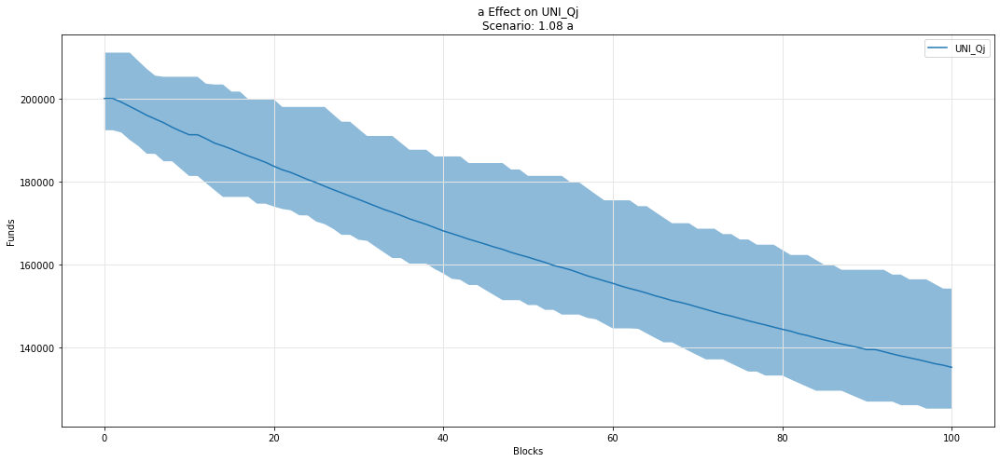

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

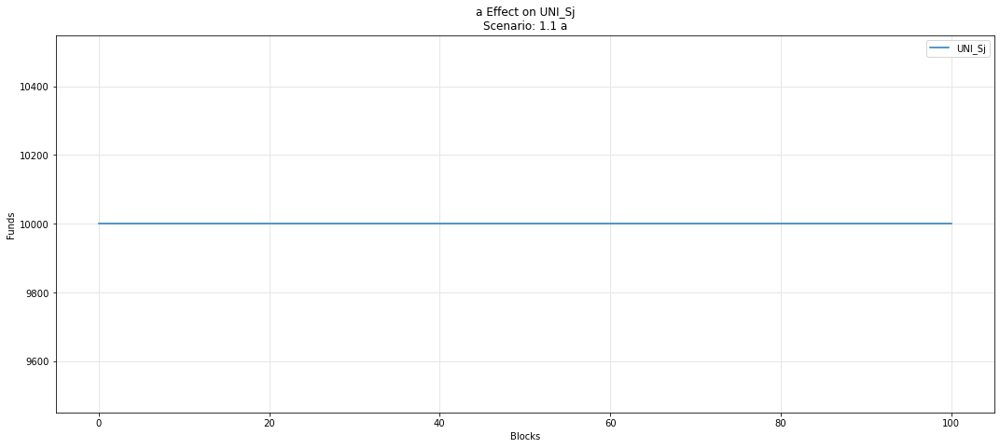

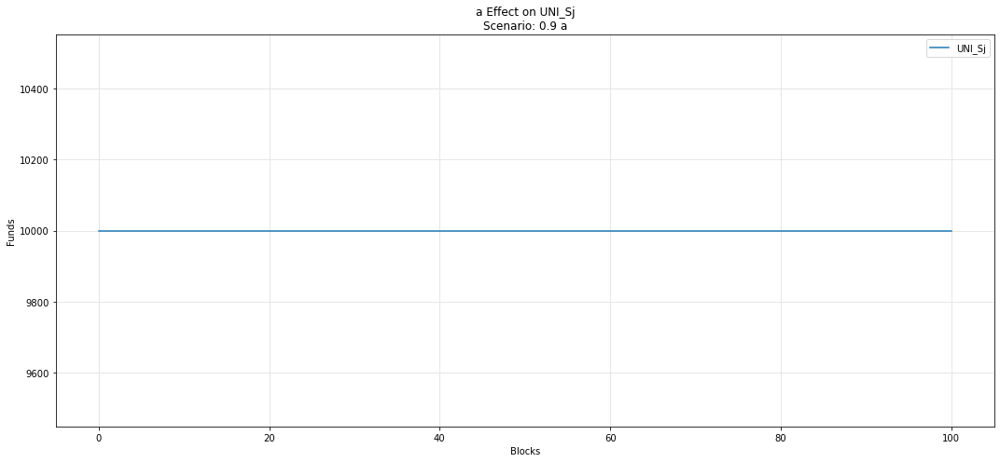

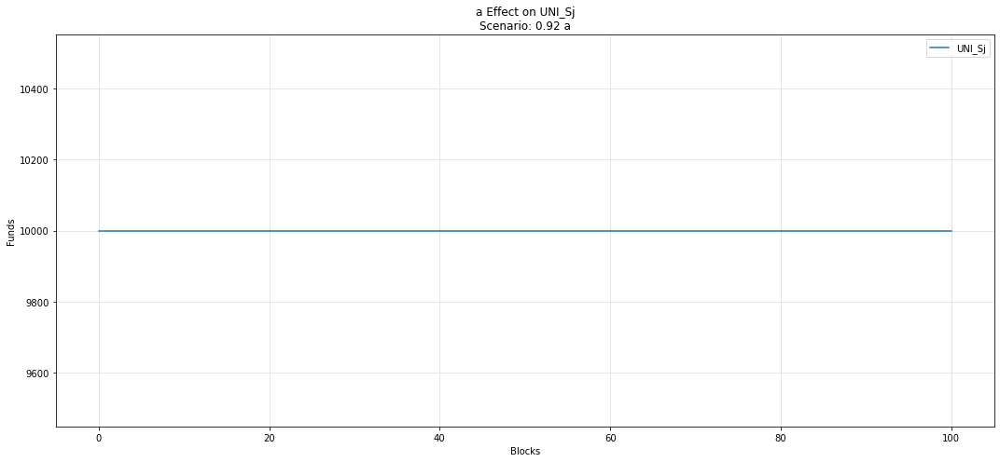

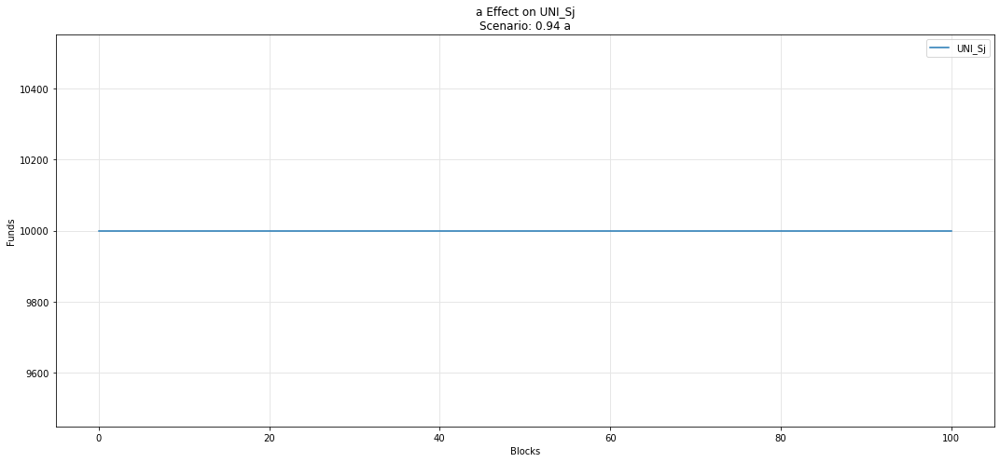

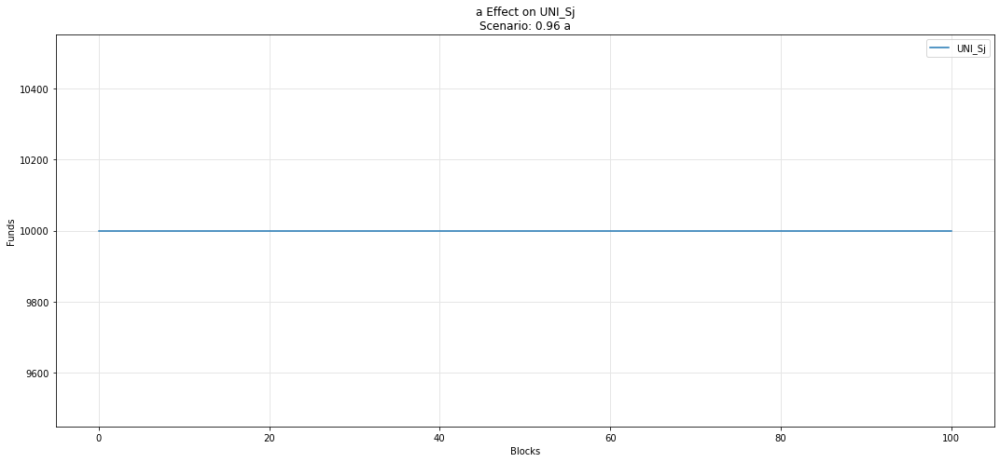

...

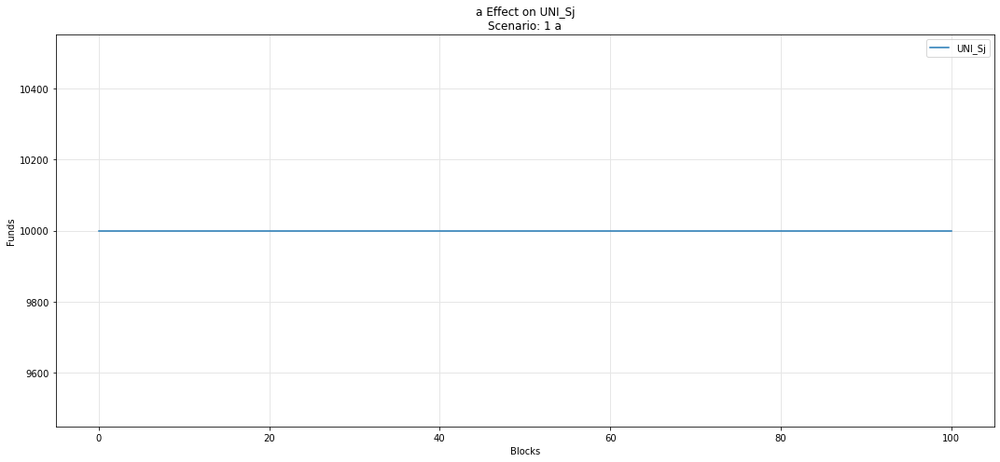

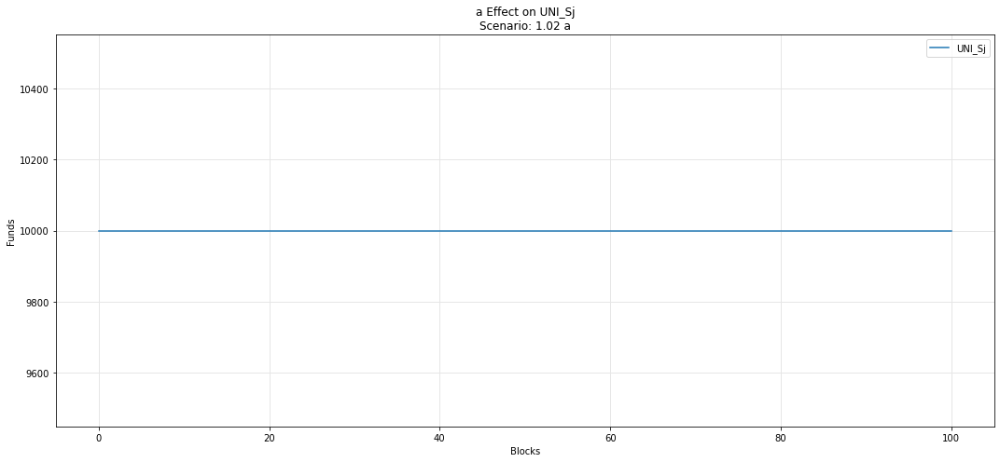

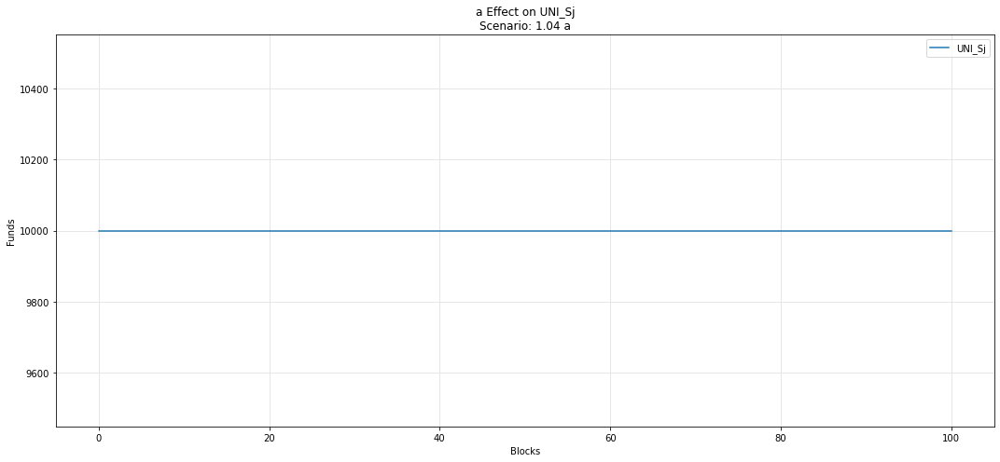

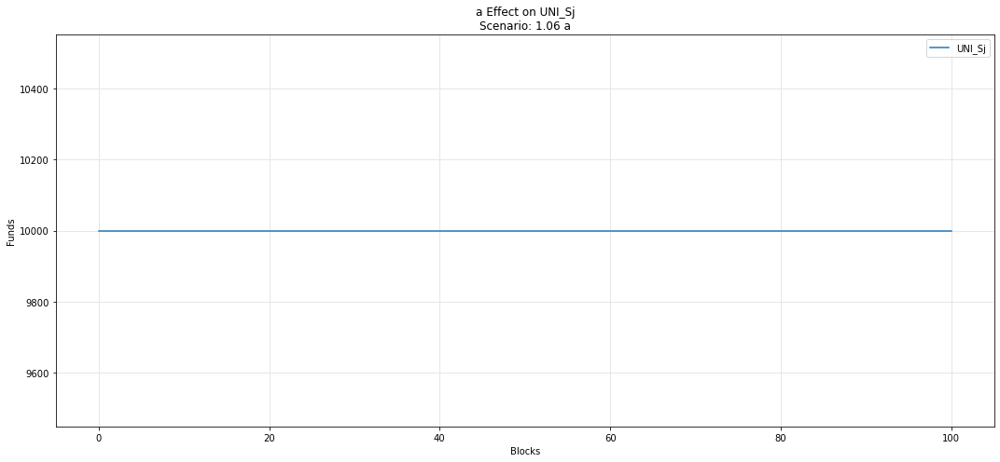

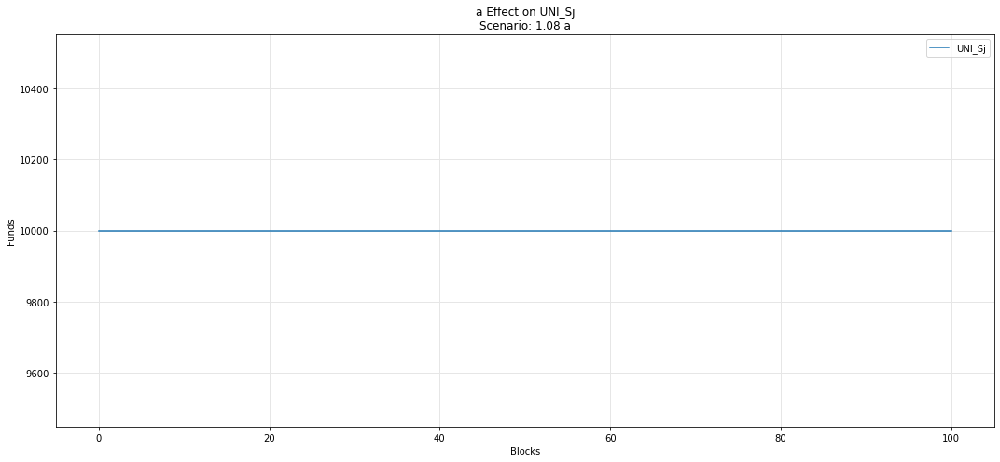

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

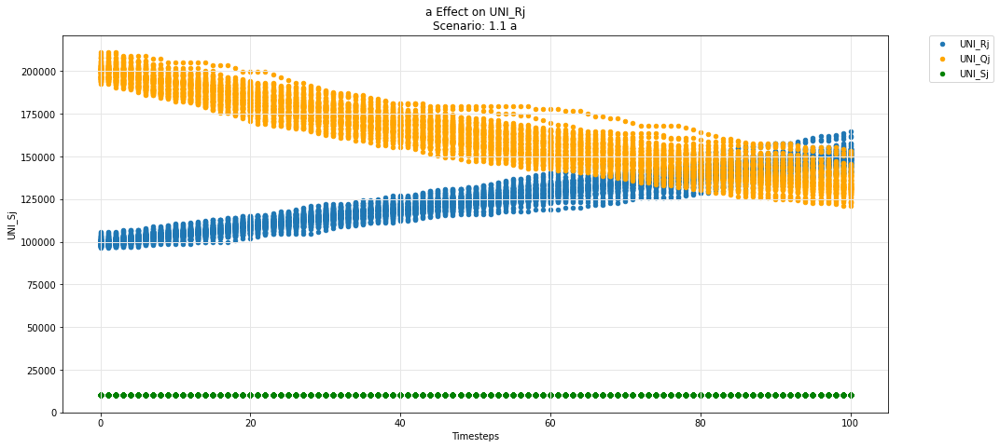

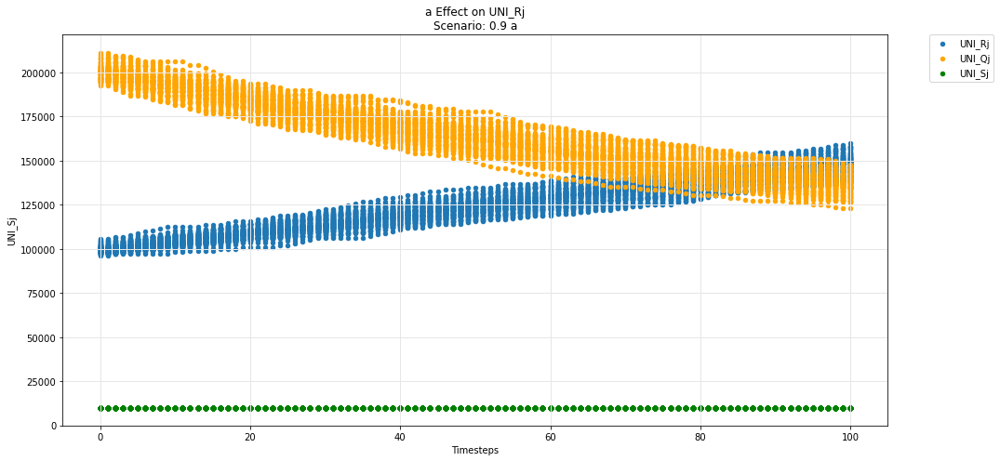

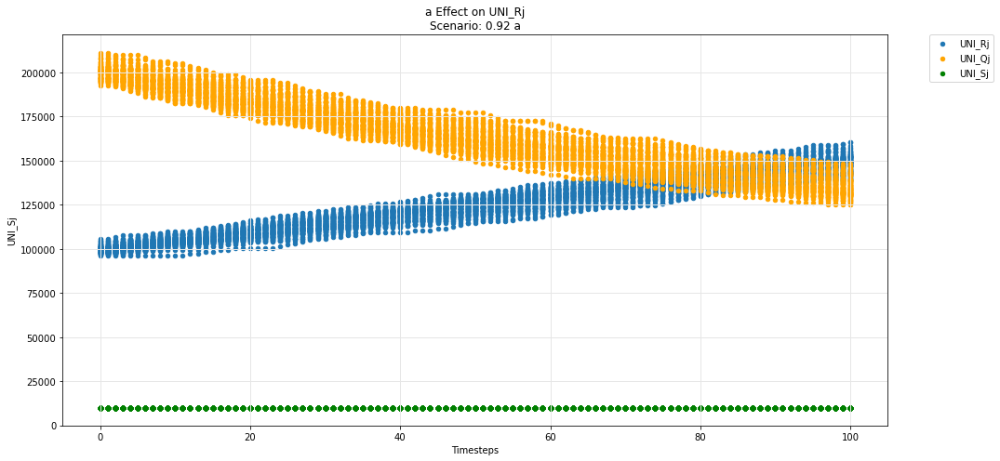

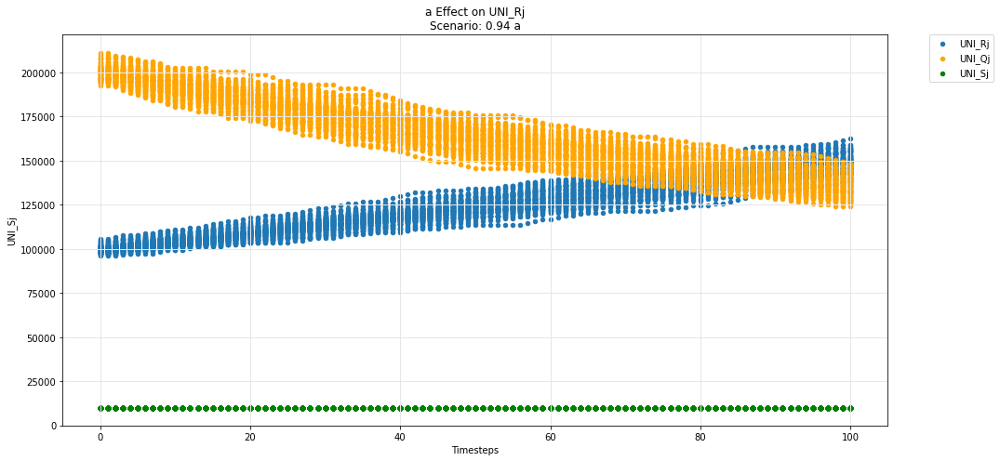

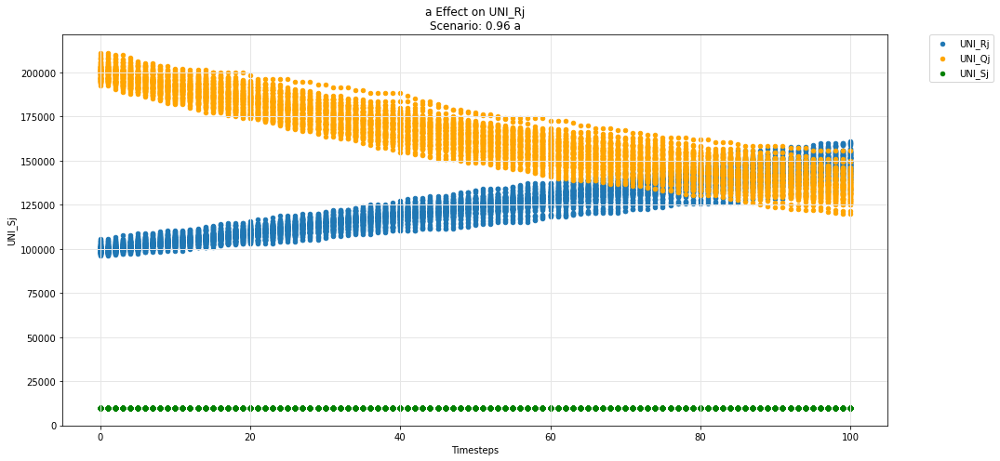

...

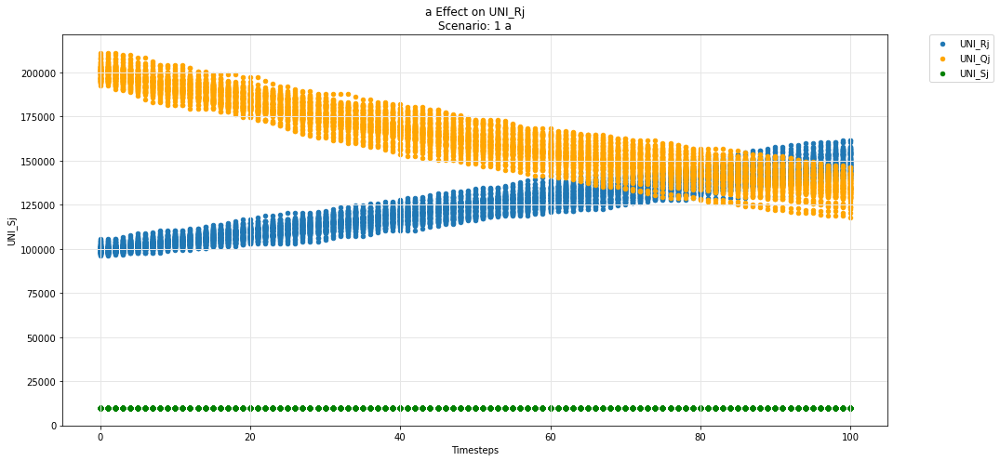

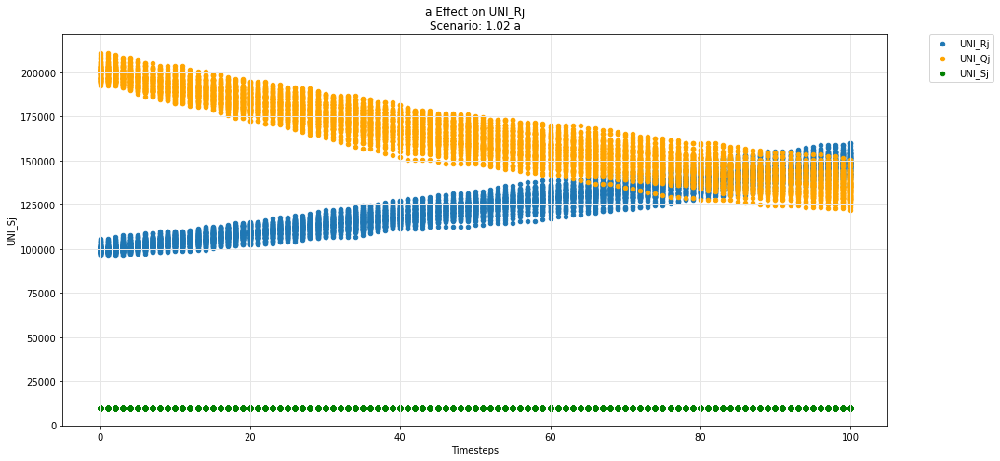

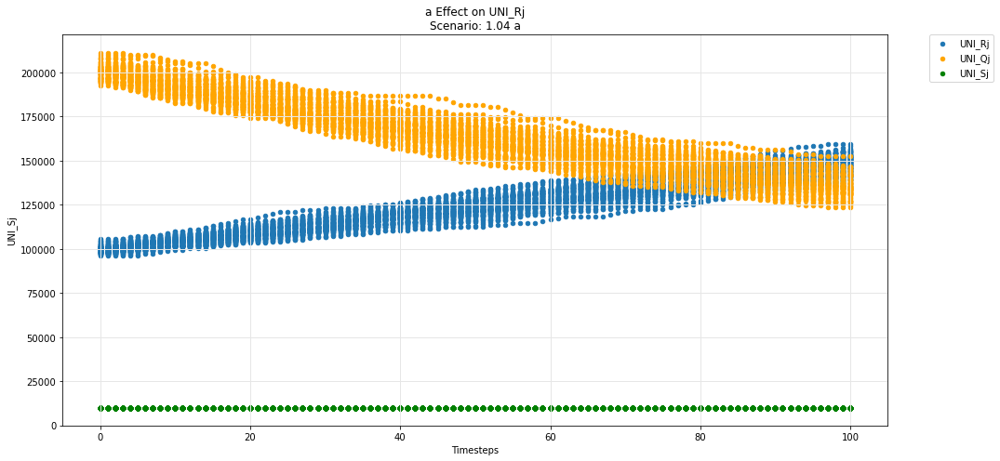

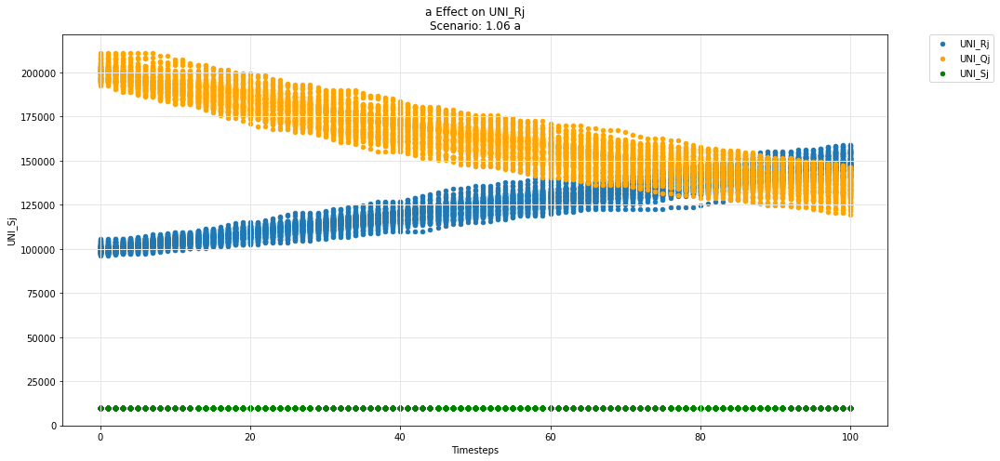

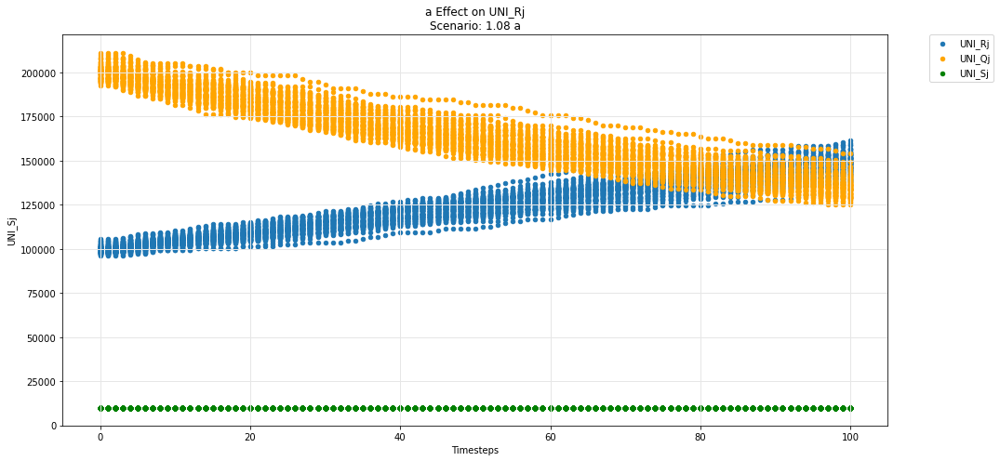

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

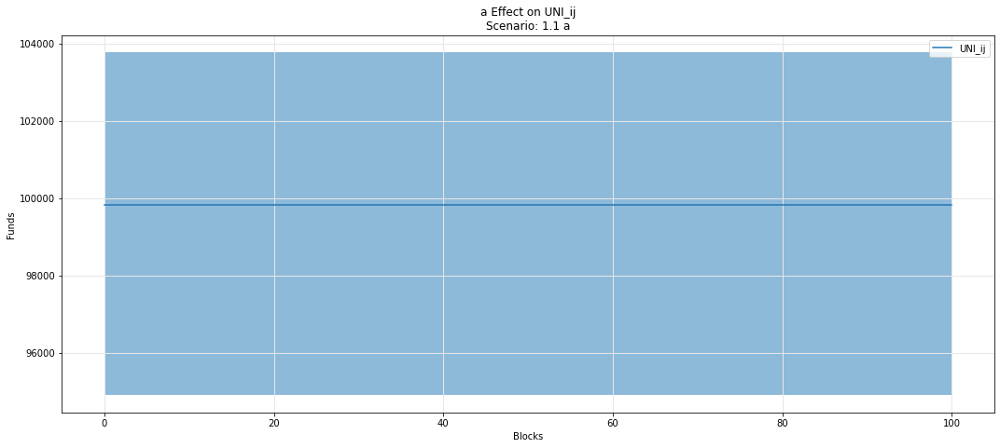

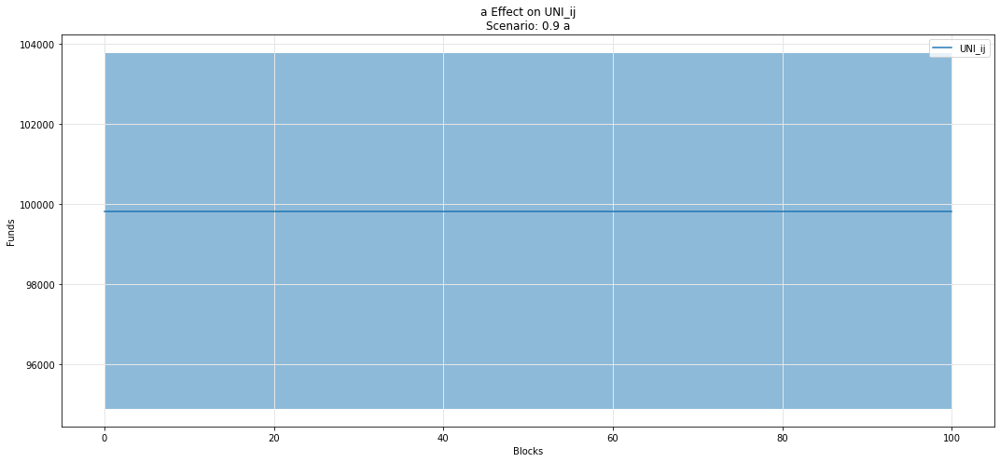

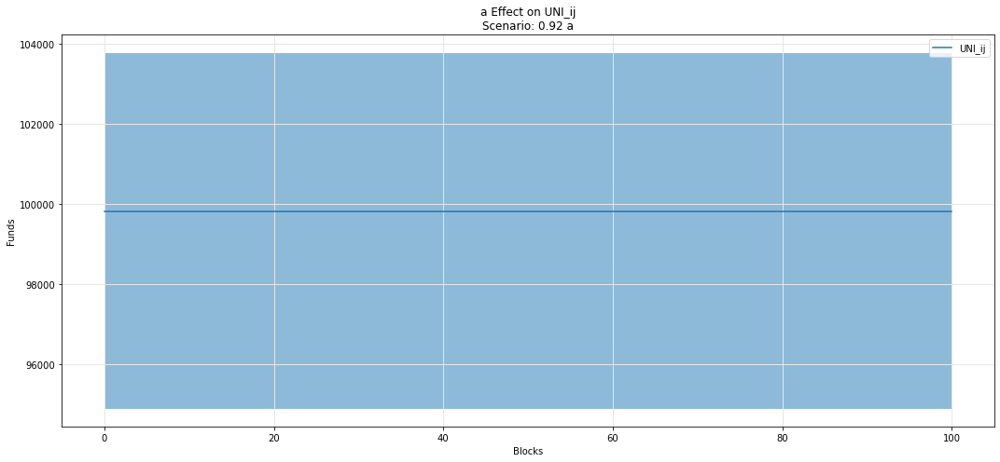

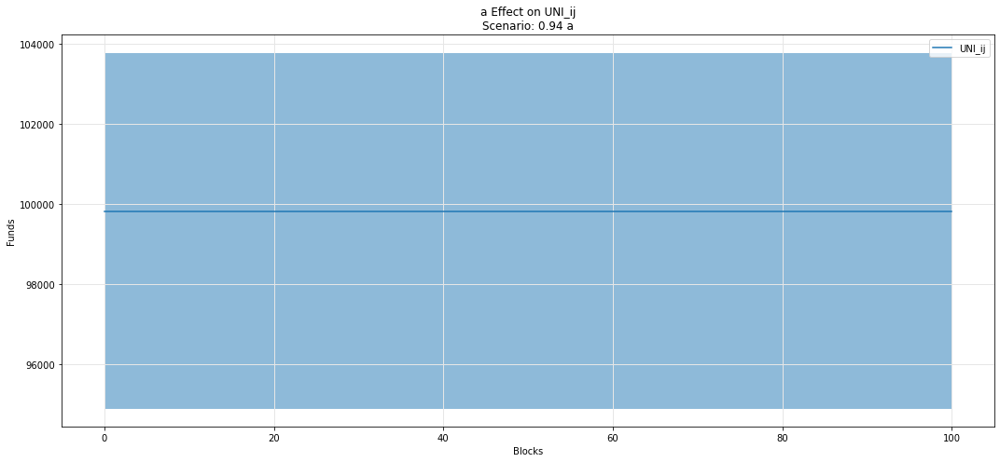

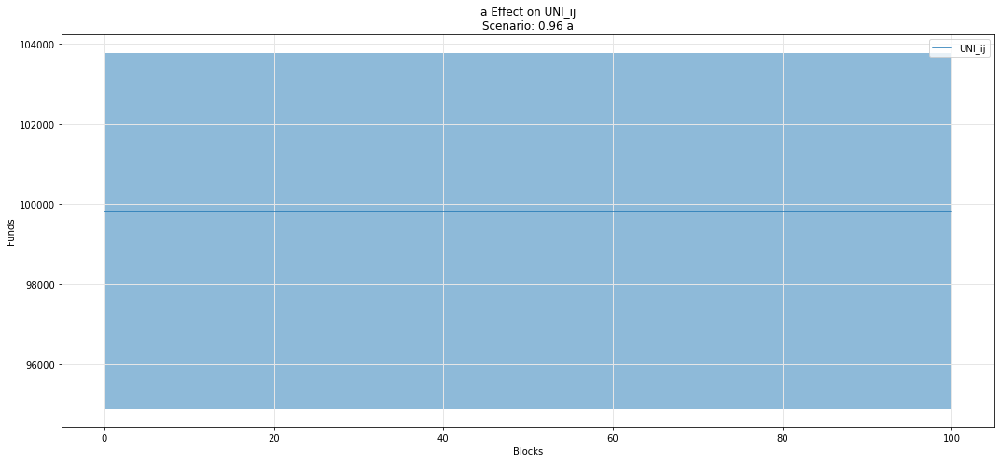

...

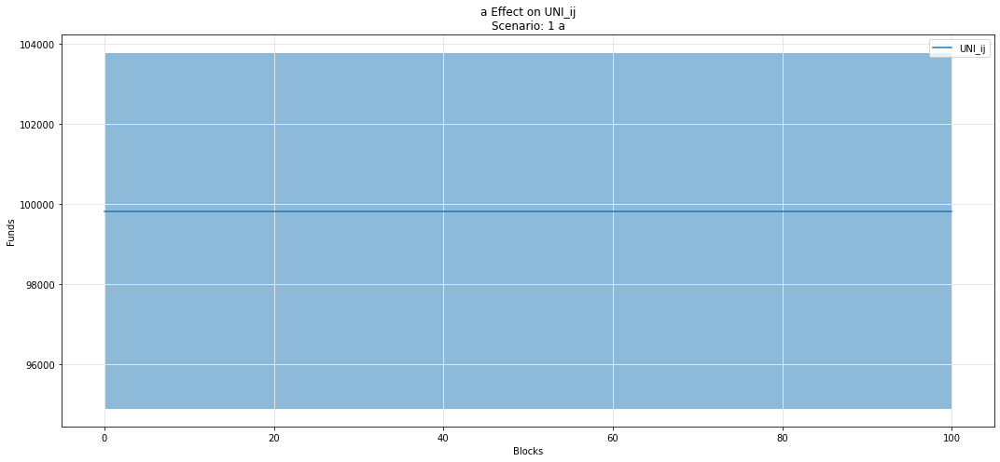

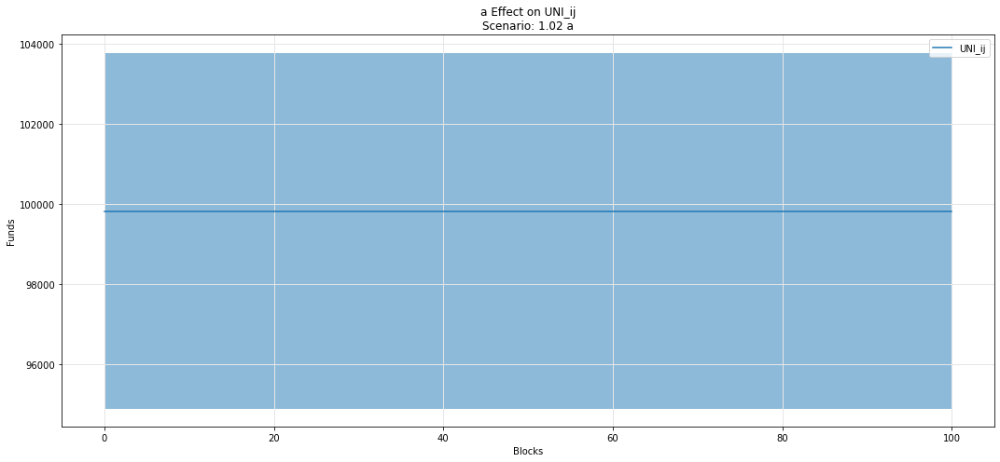

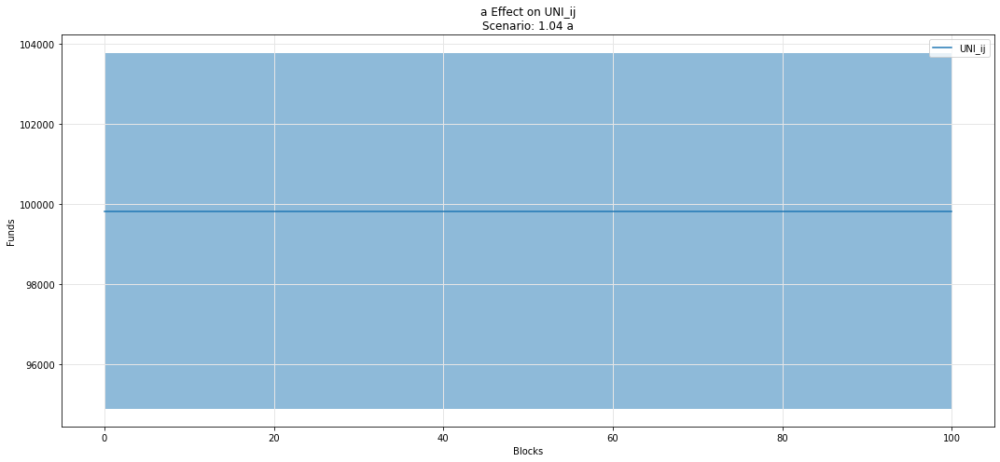

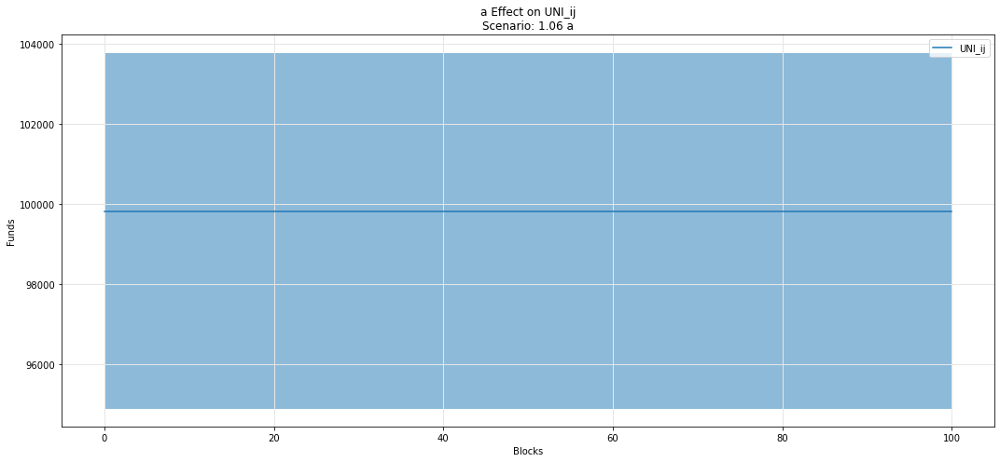

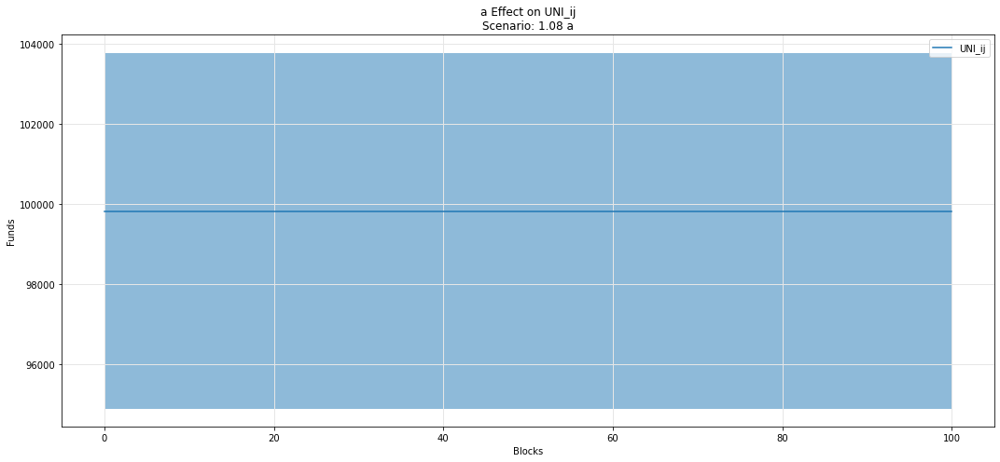

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

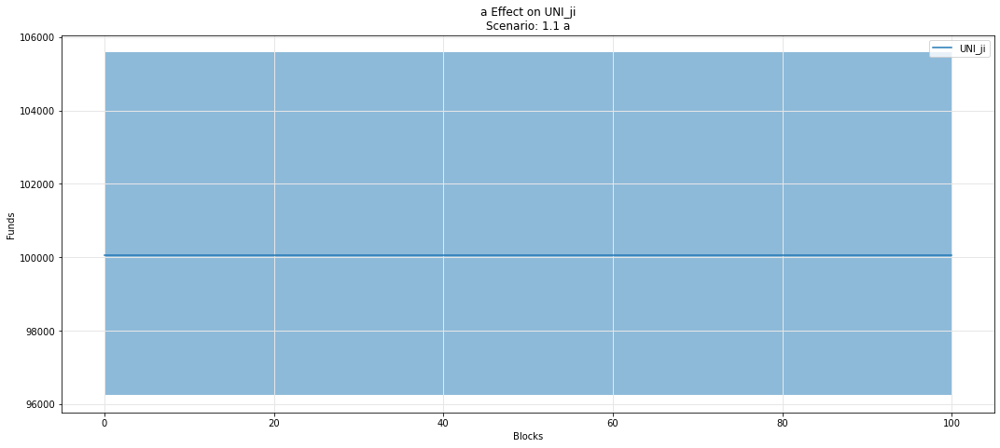

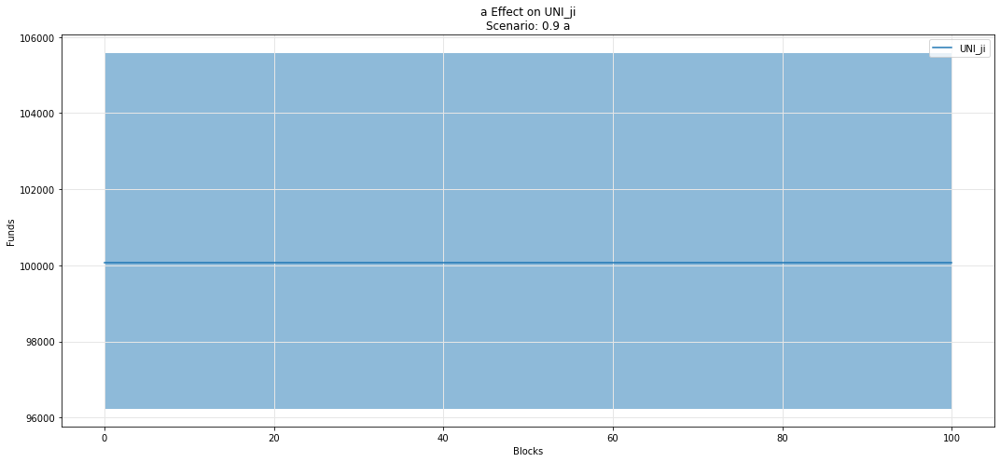

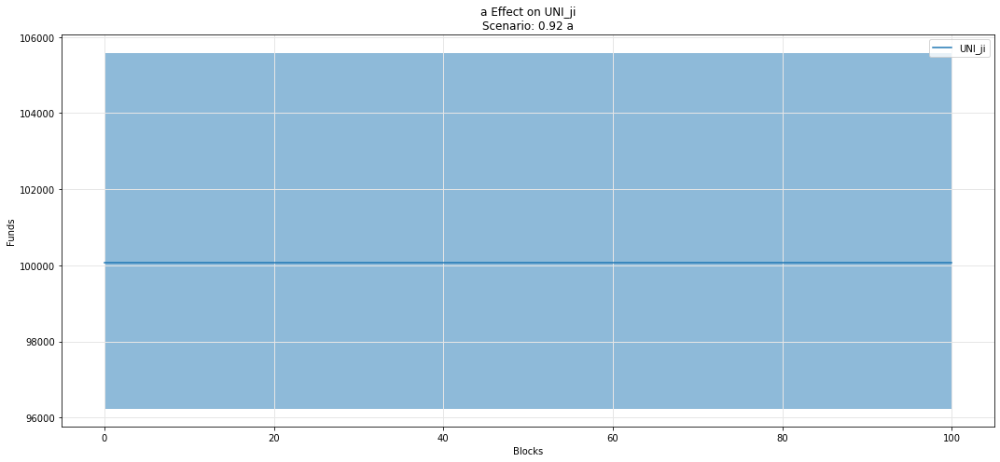

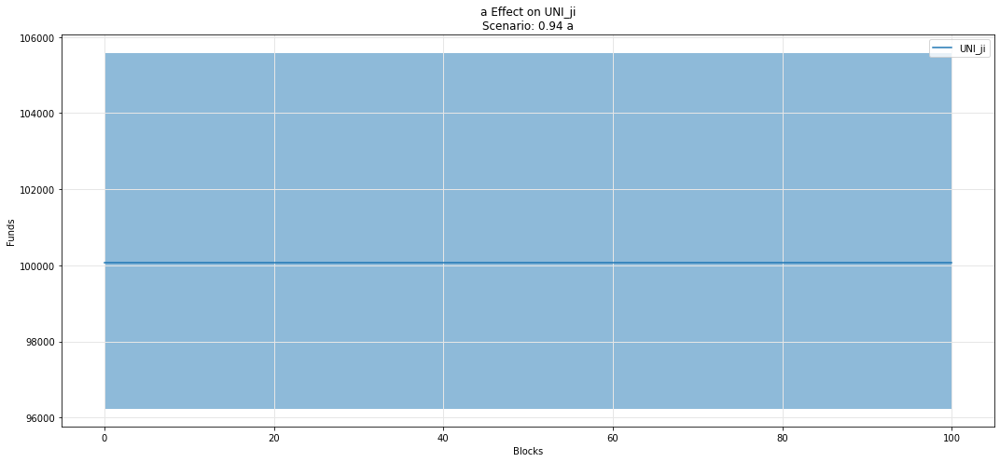

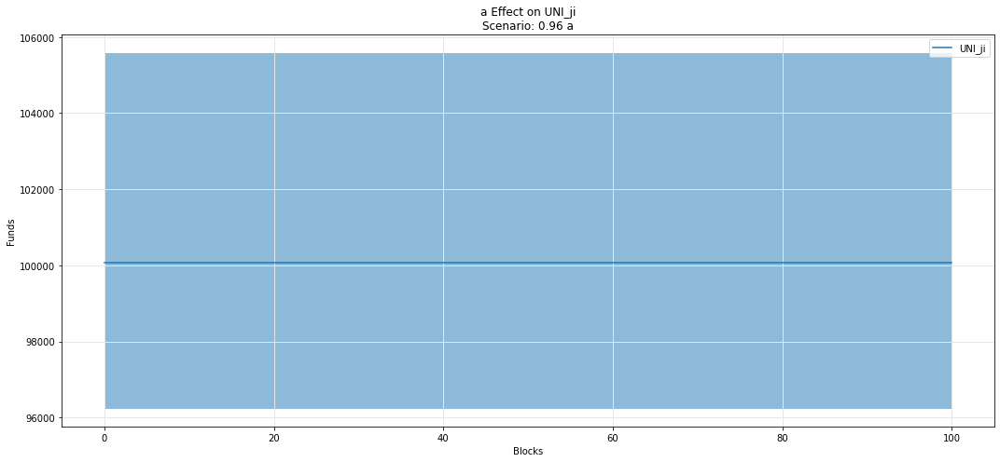

...

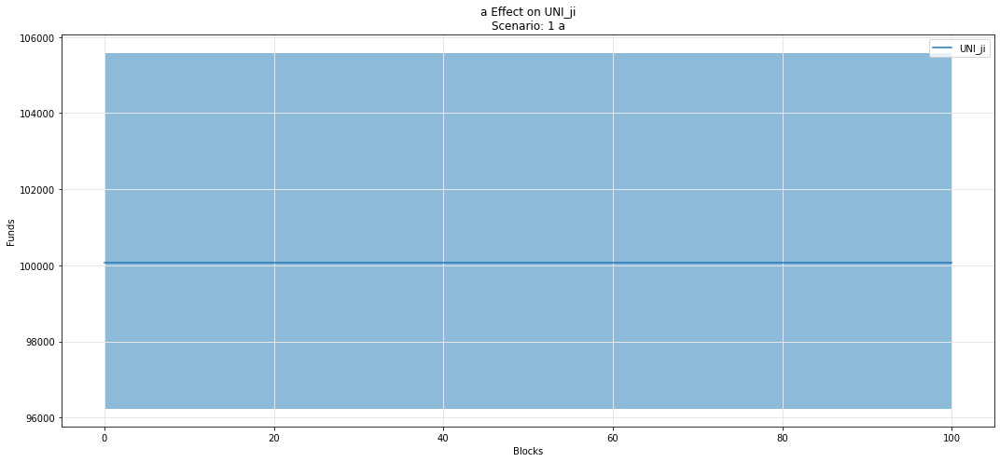

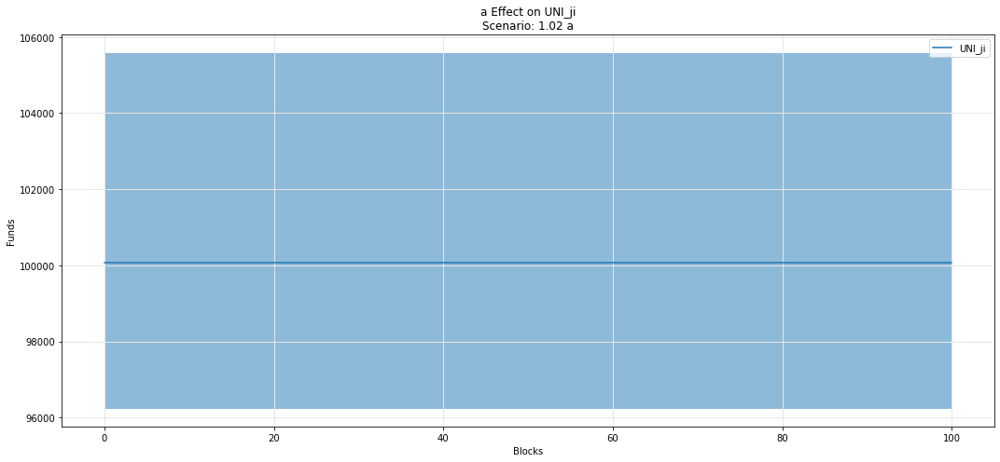

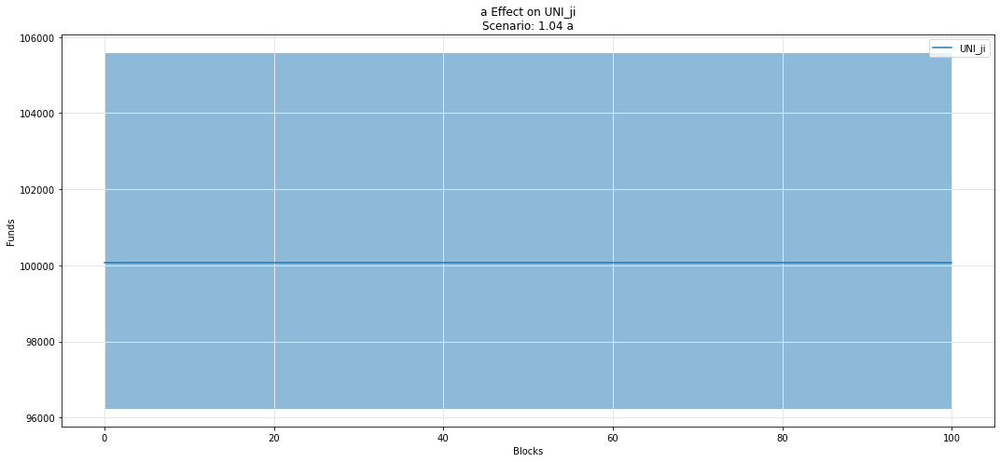

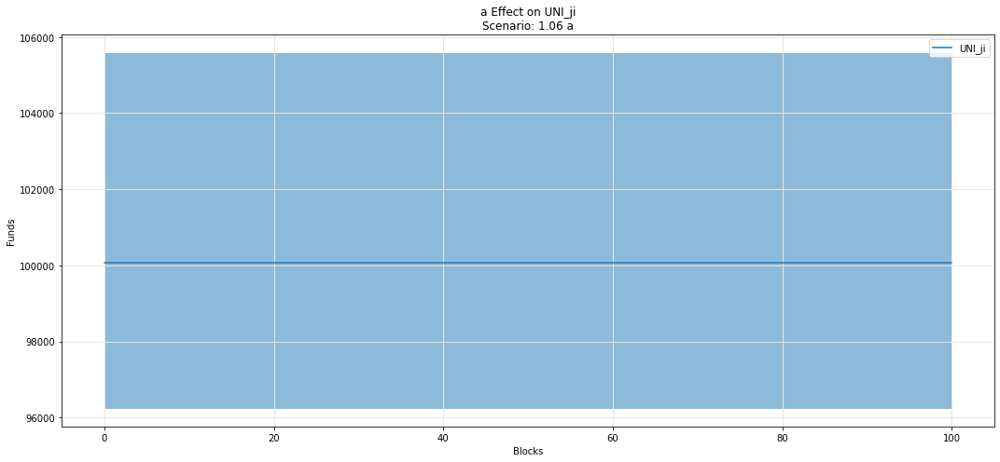

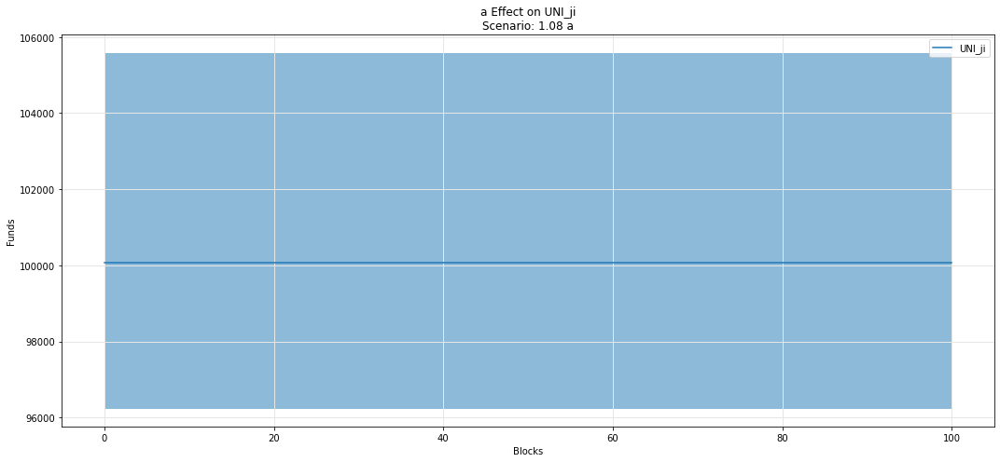

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

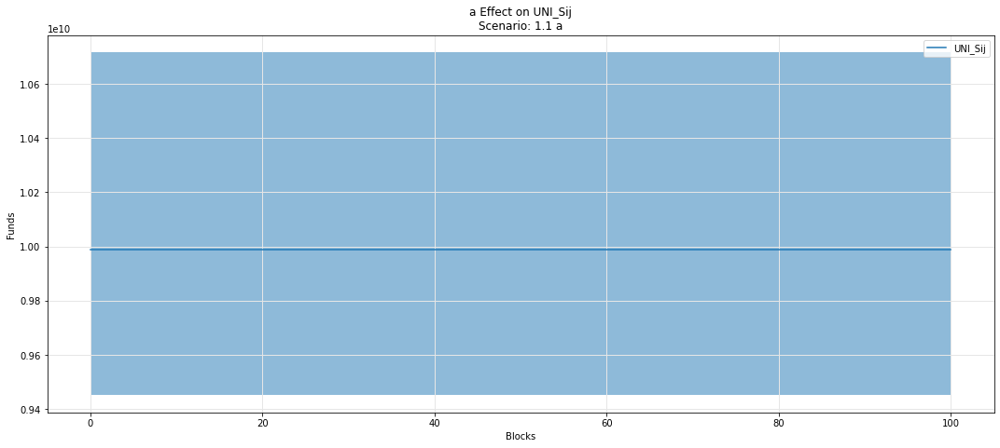

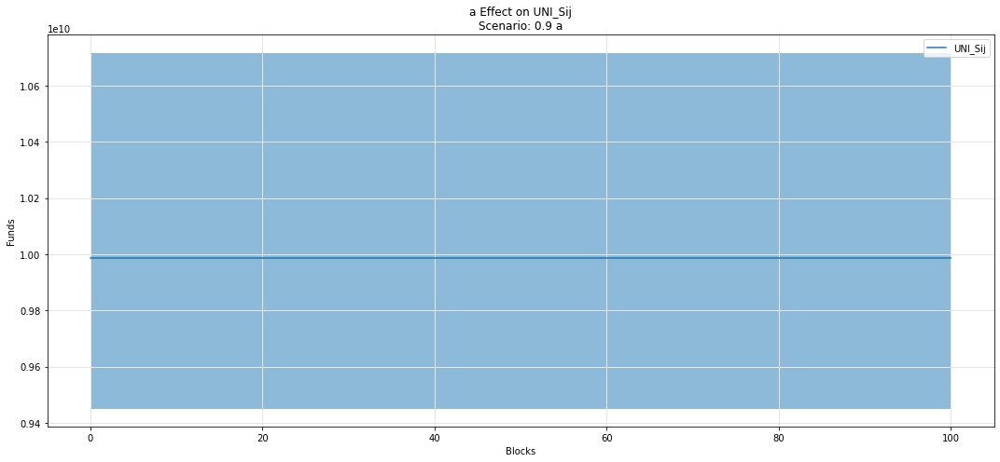

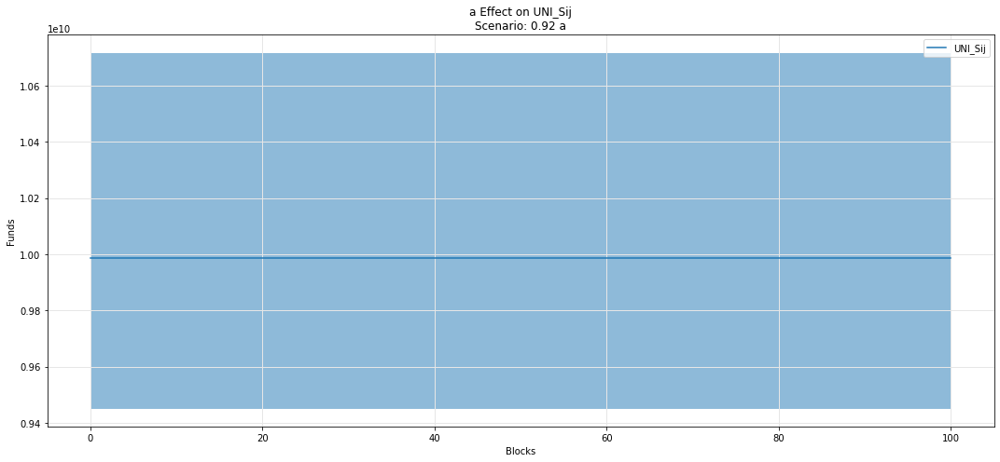

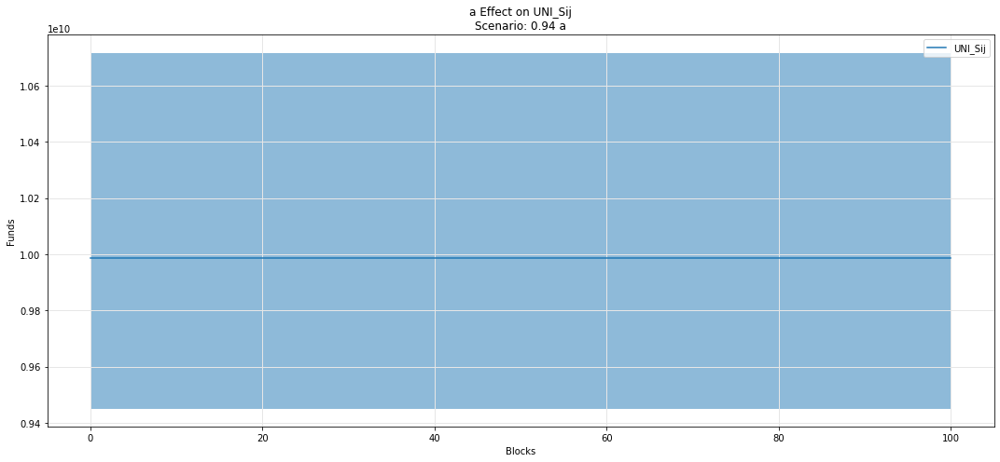

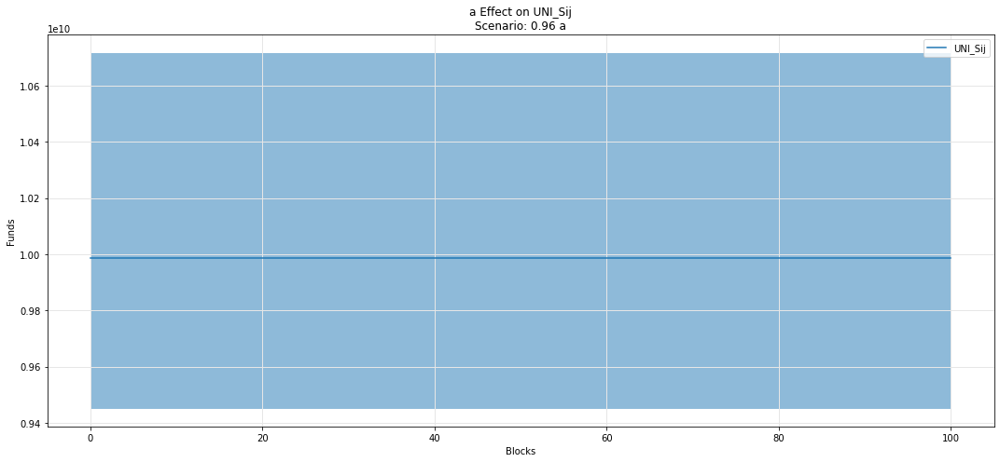

...

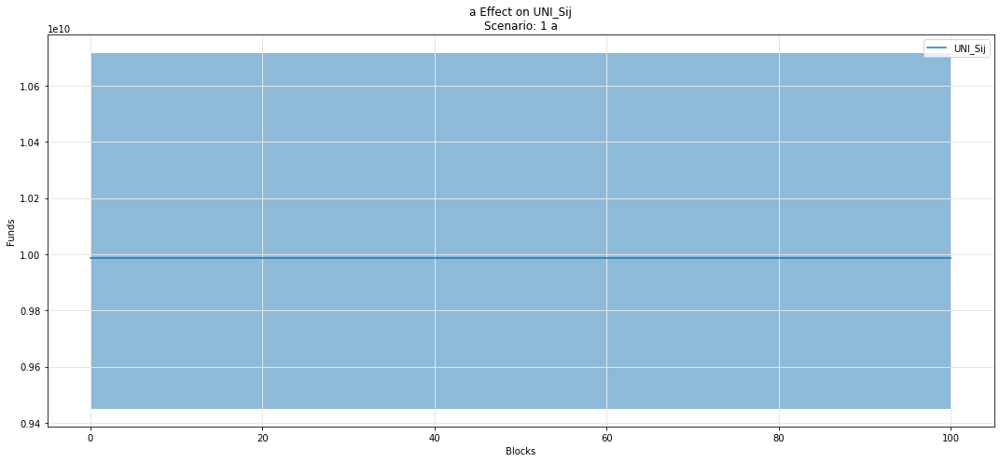

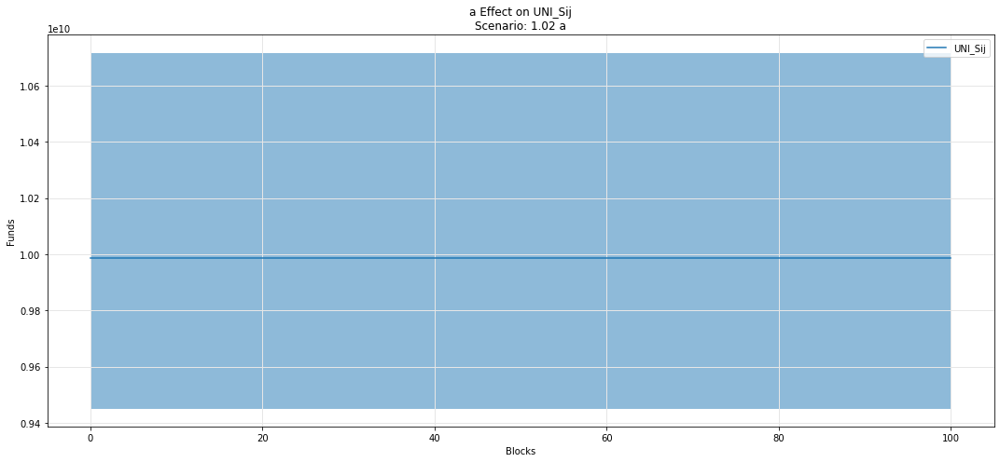

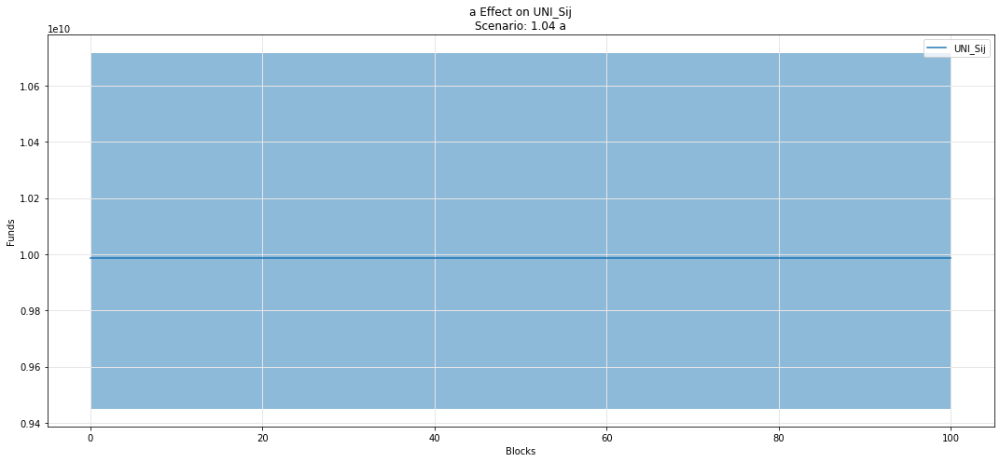

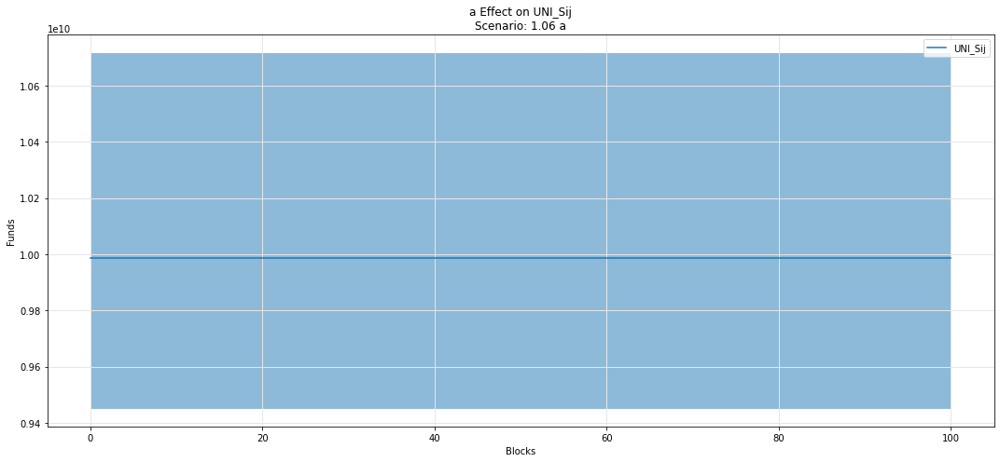

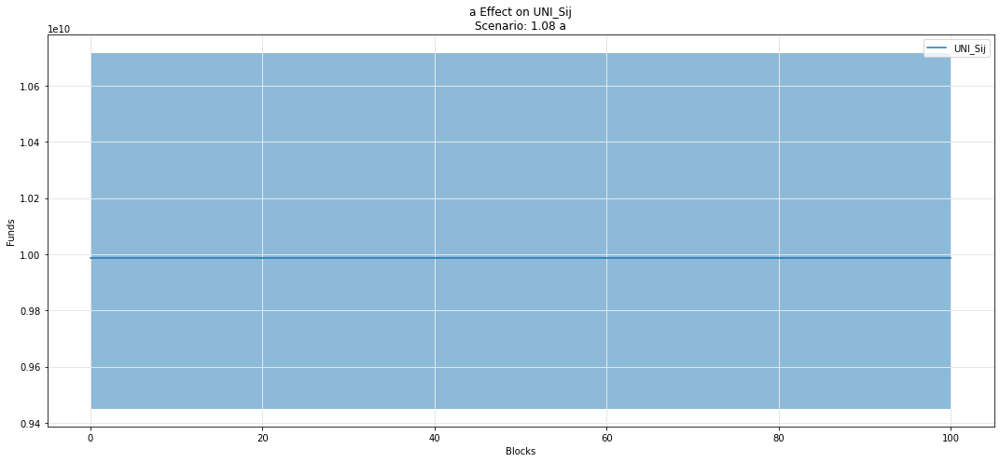

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

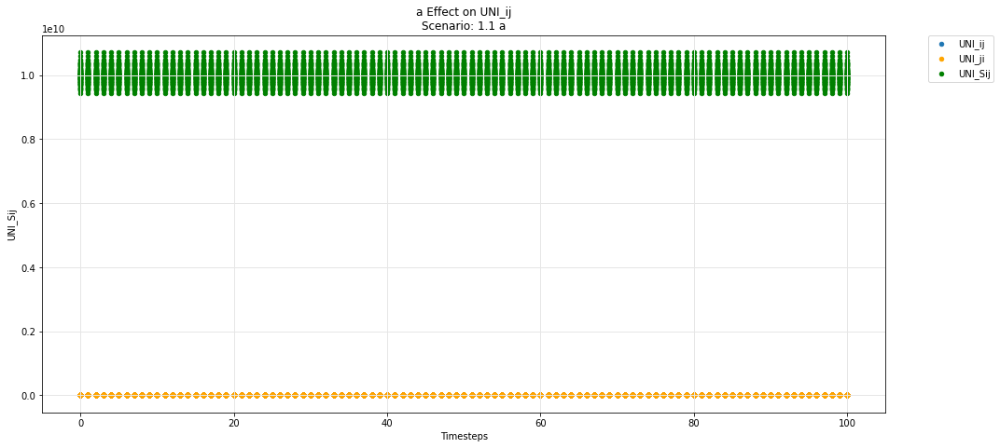

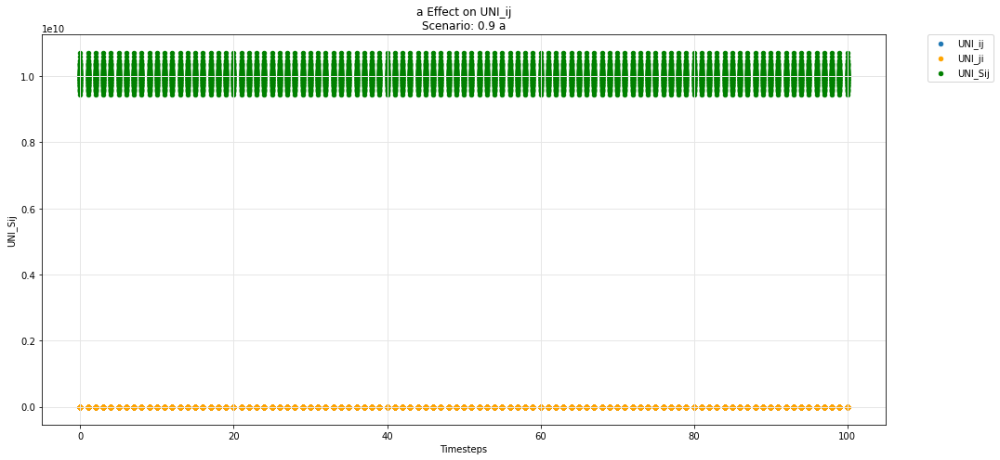

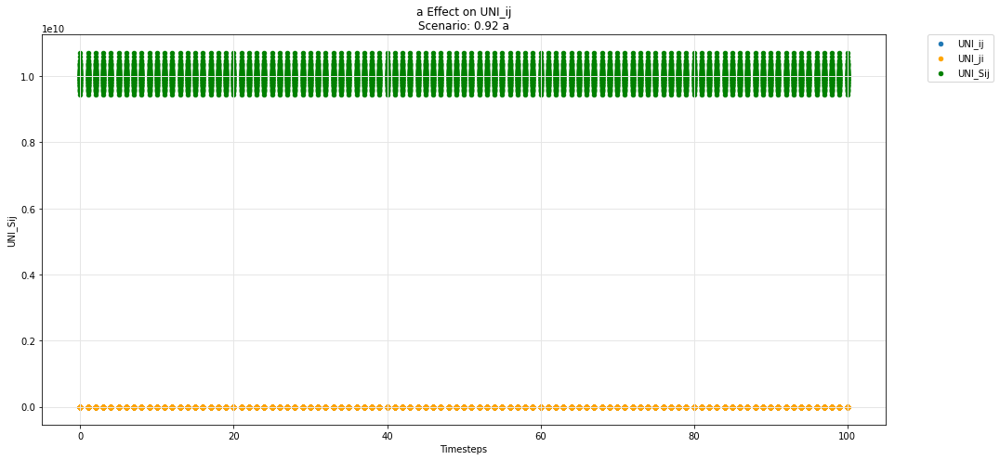

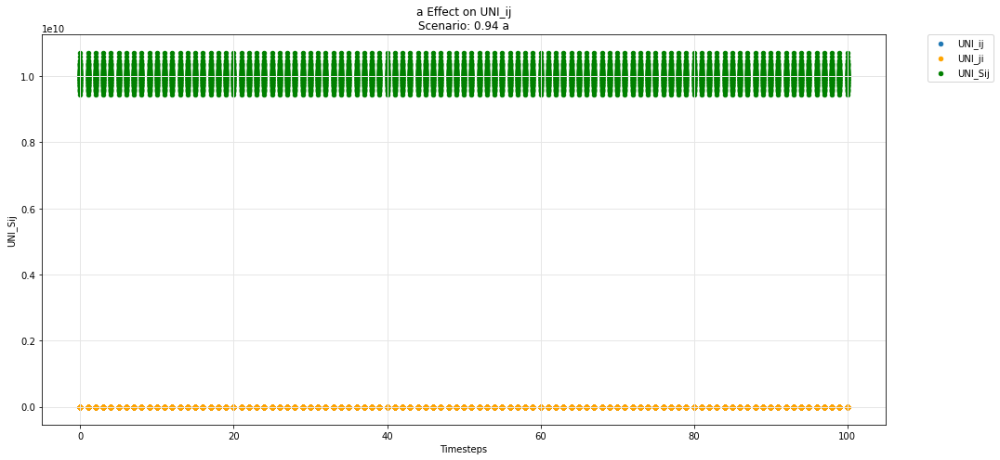

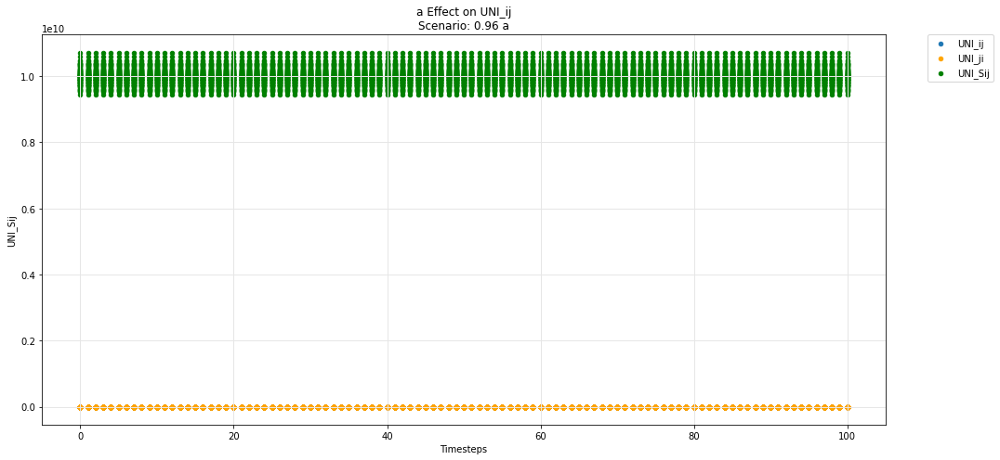

...

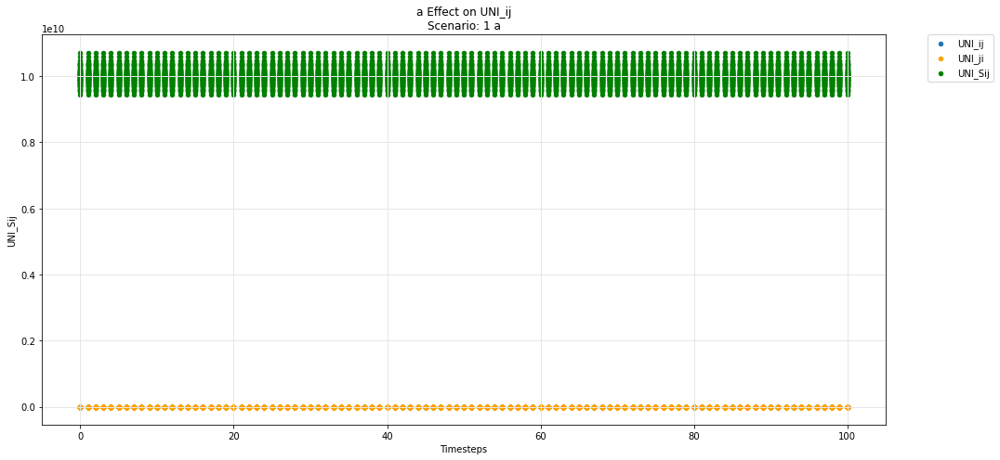

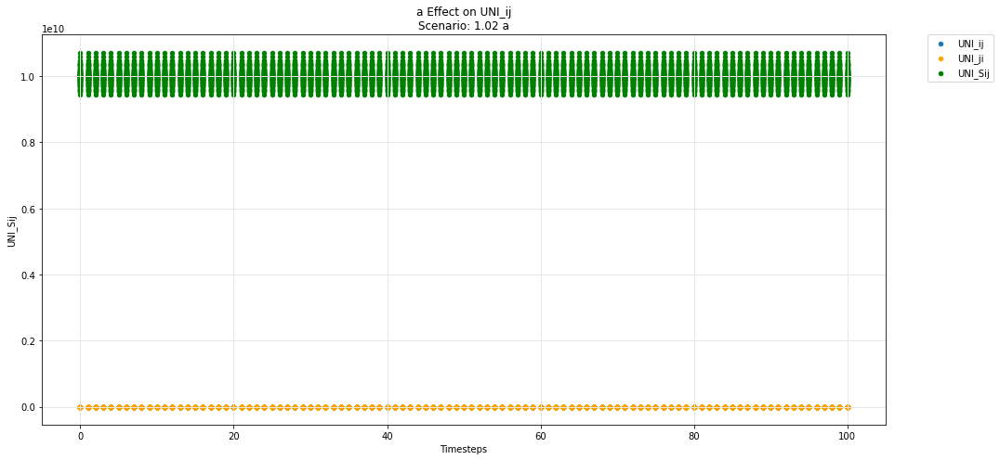

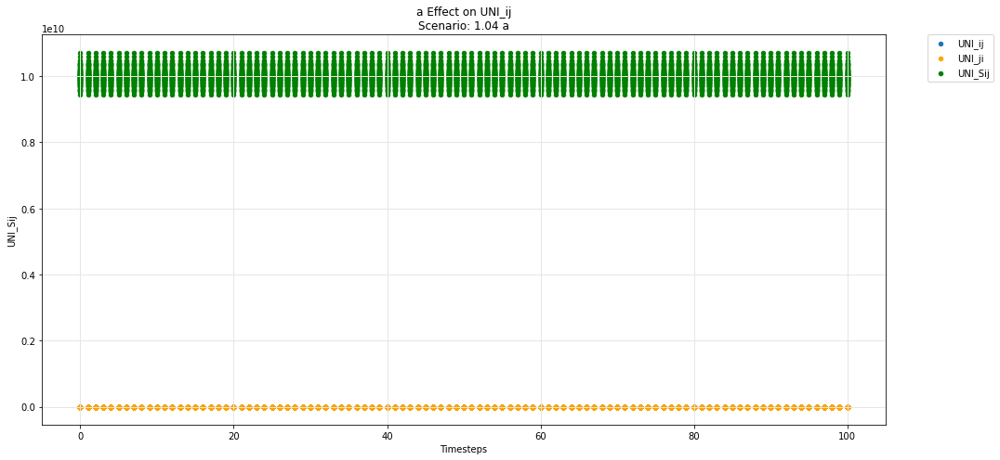

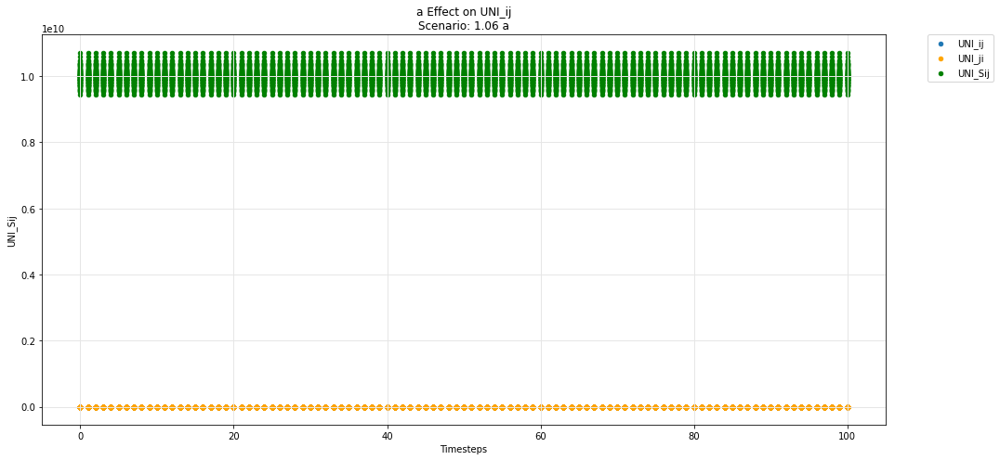

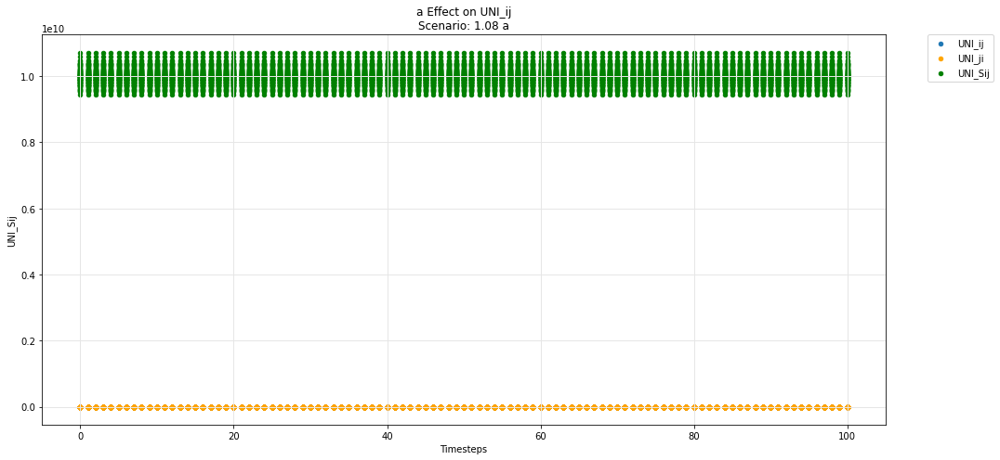

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

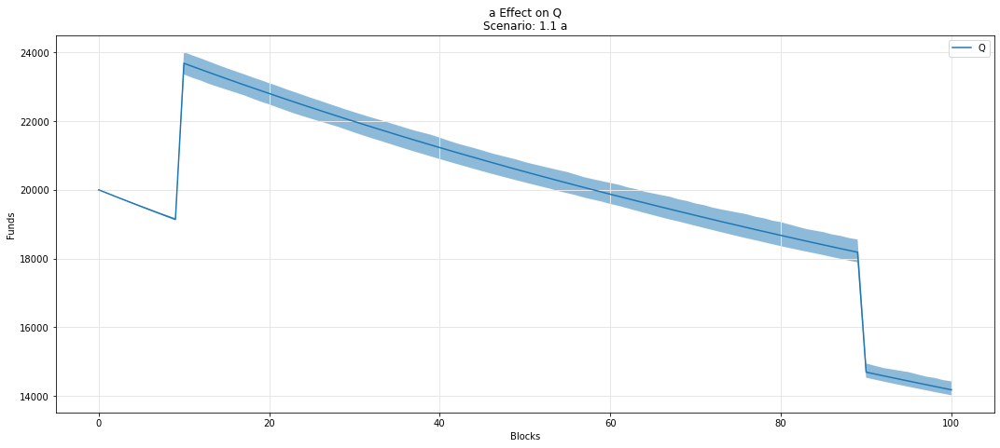

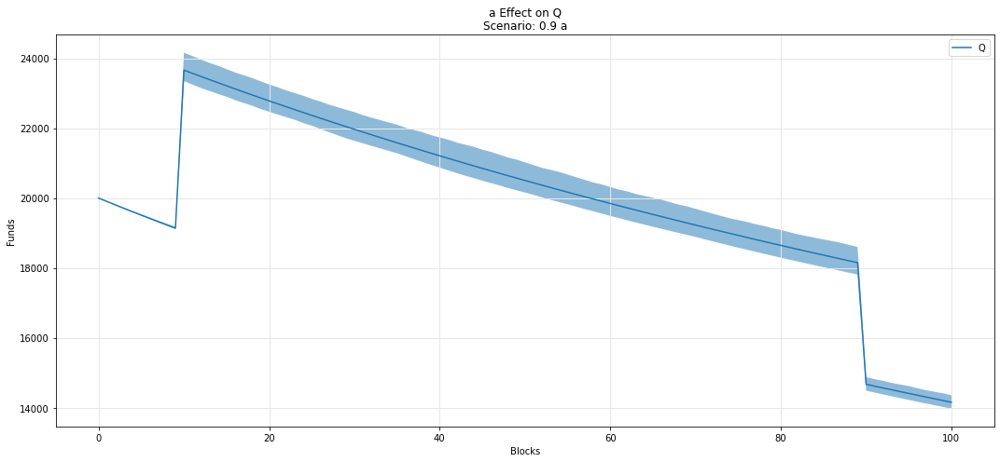

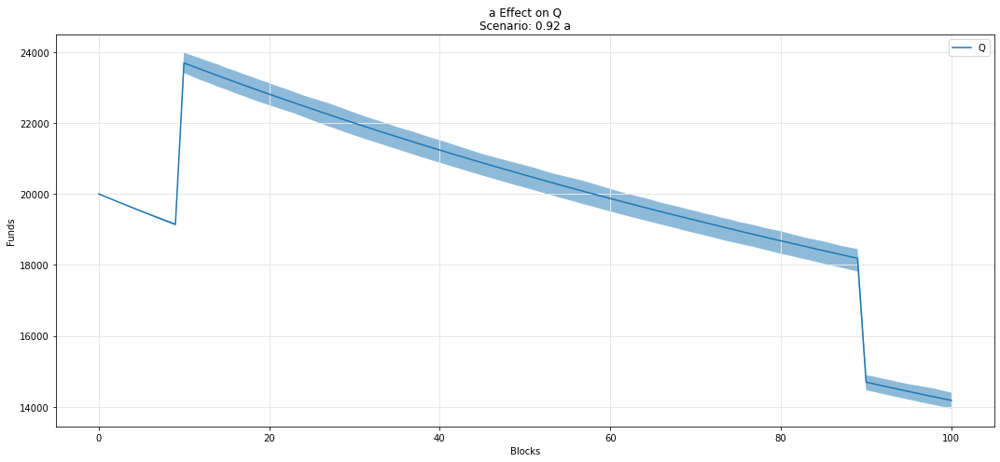

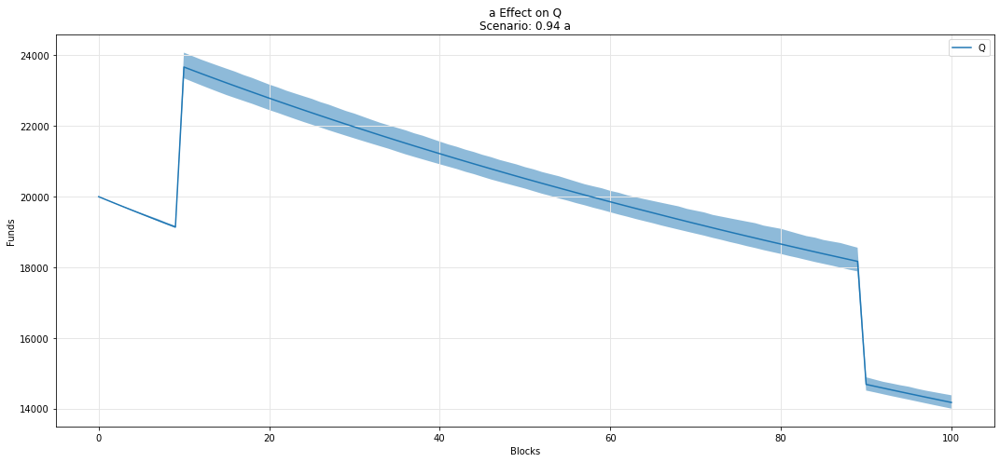

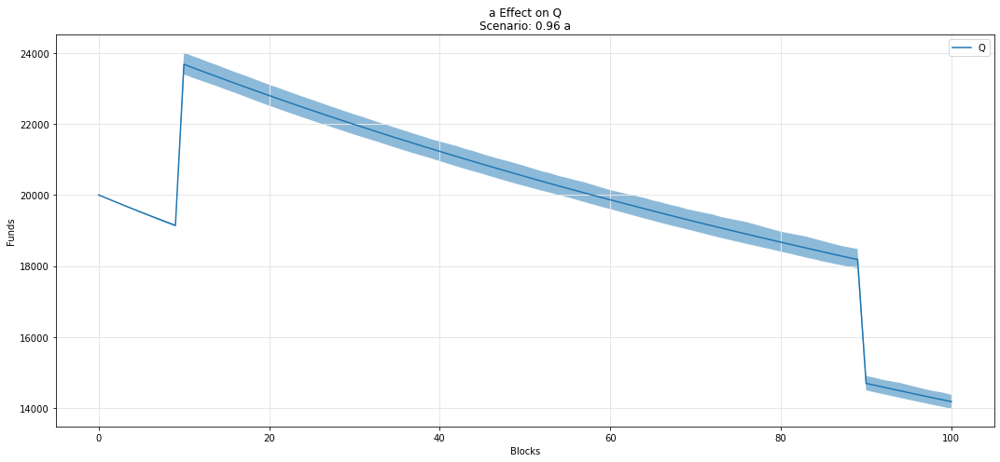

...

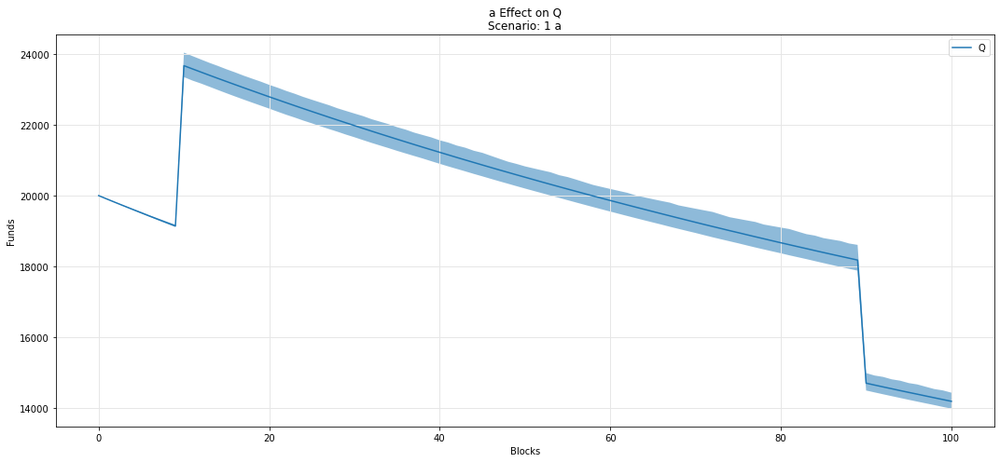

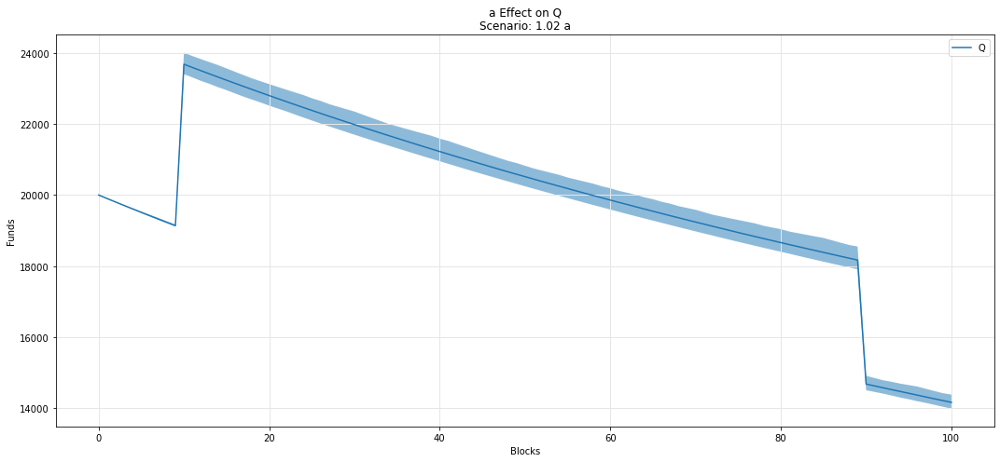

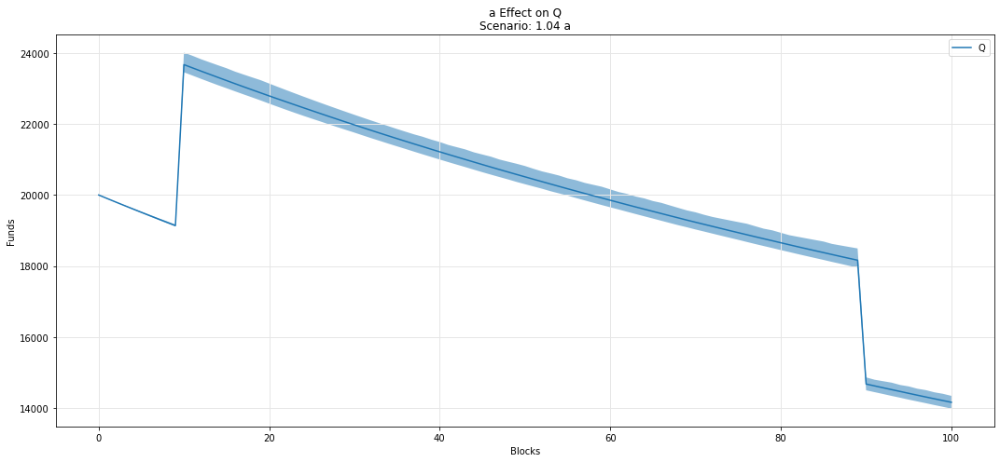

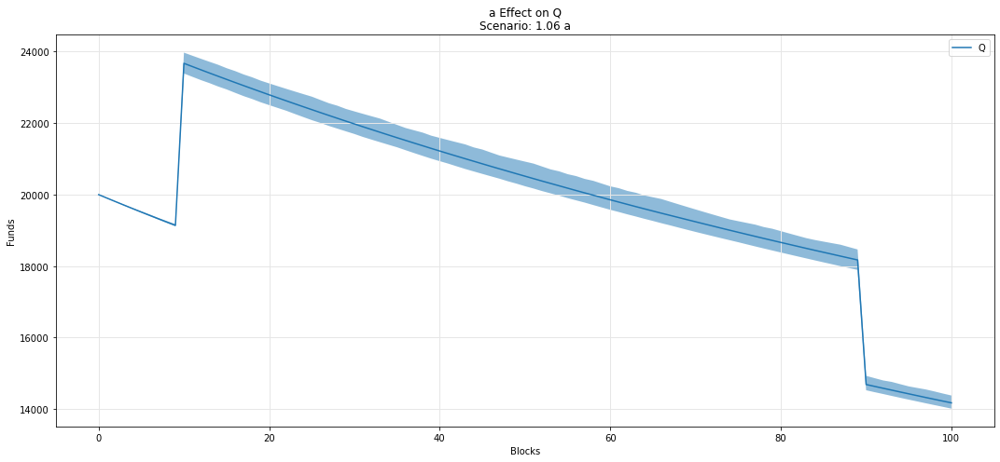

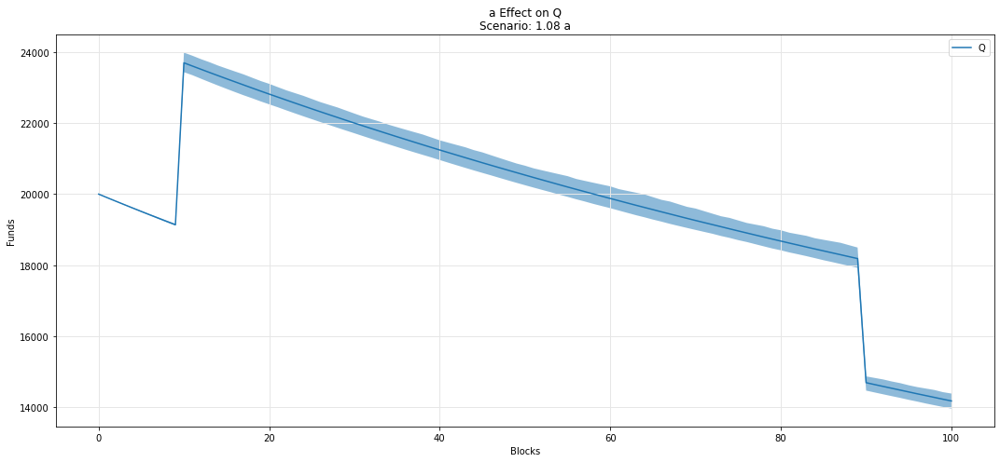

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

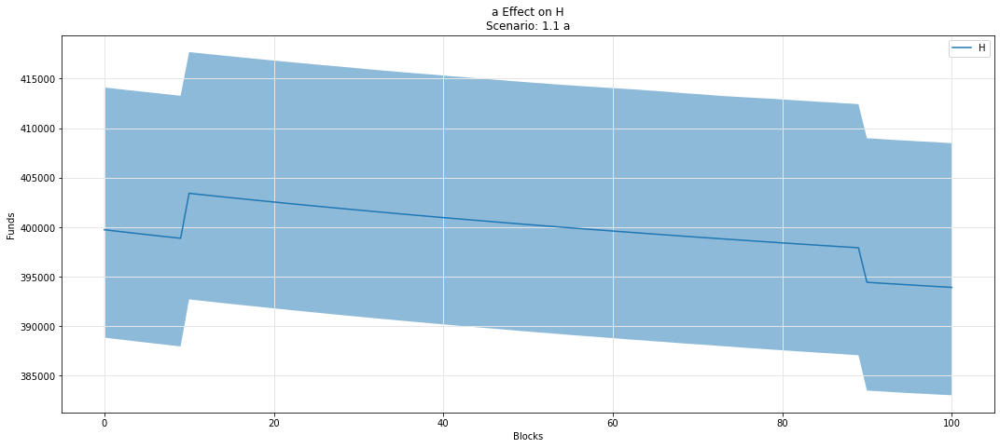

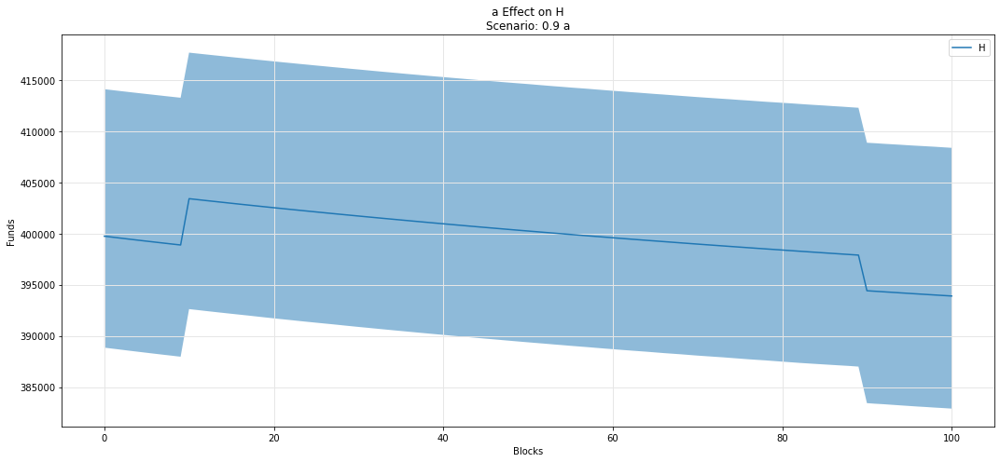

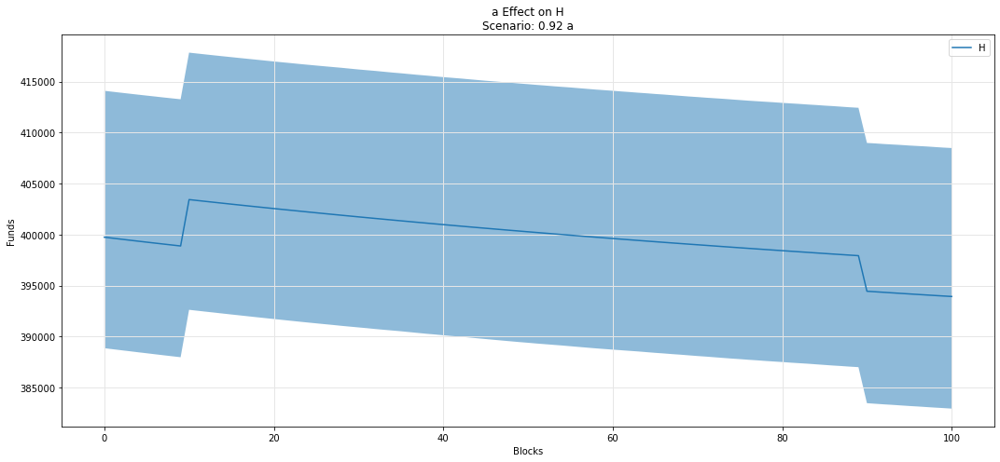

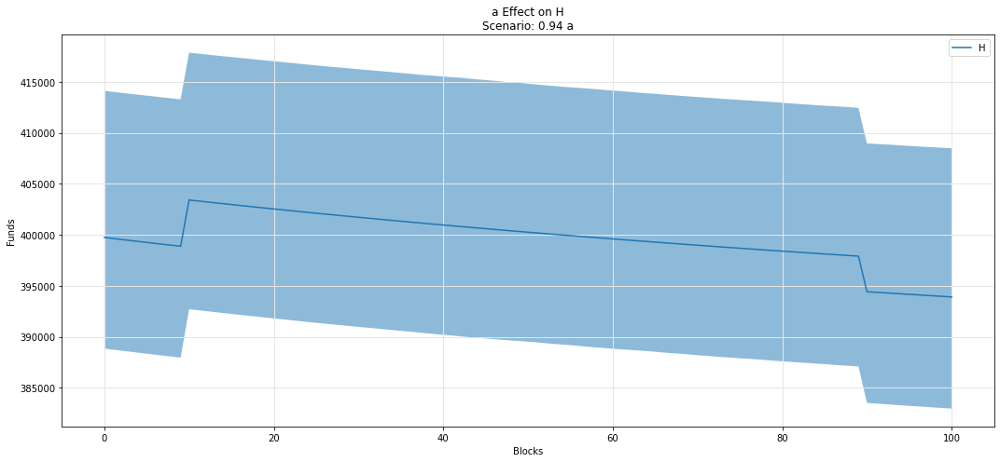

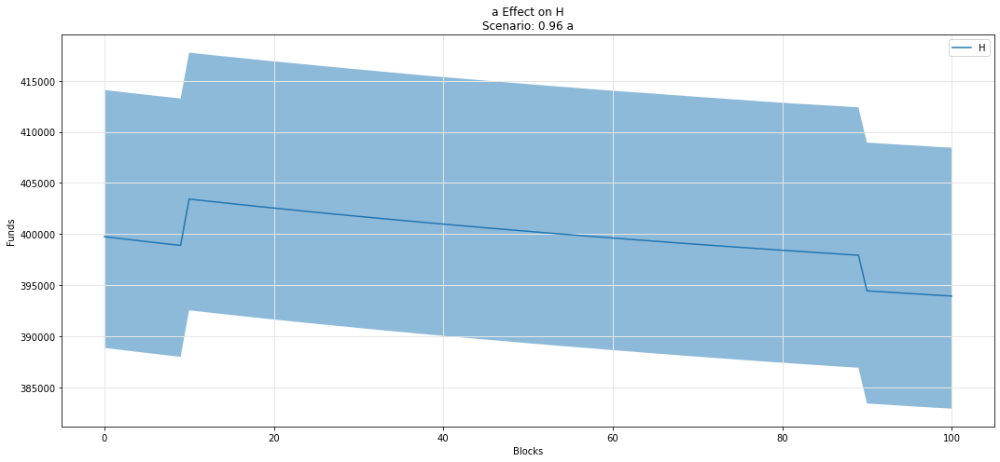

...

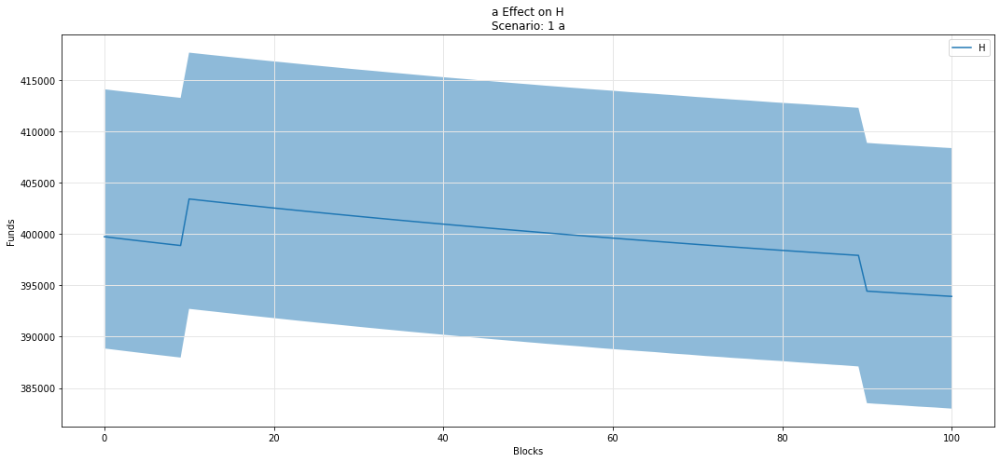

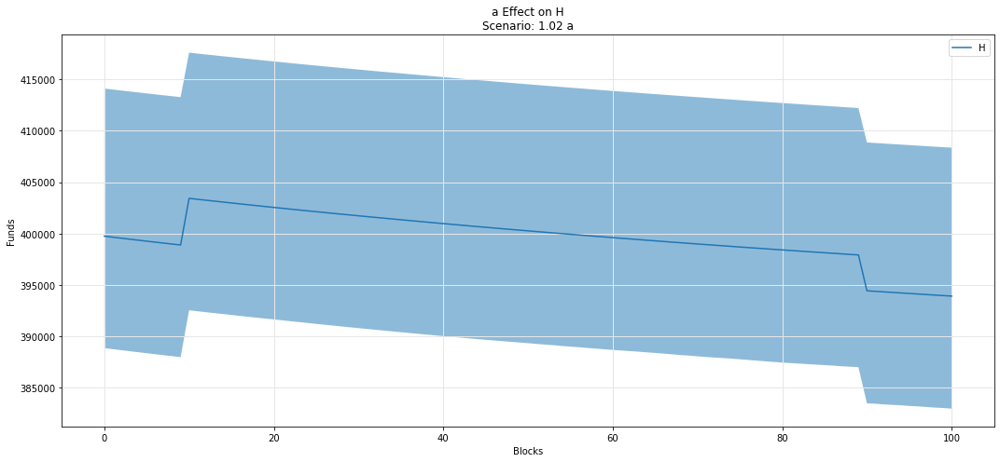

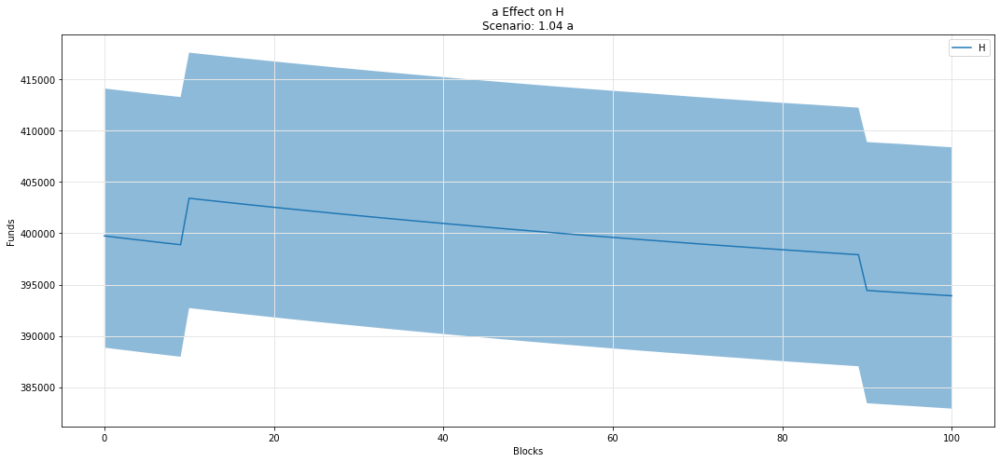

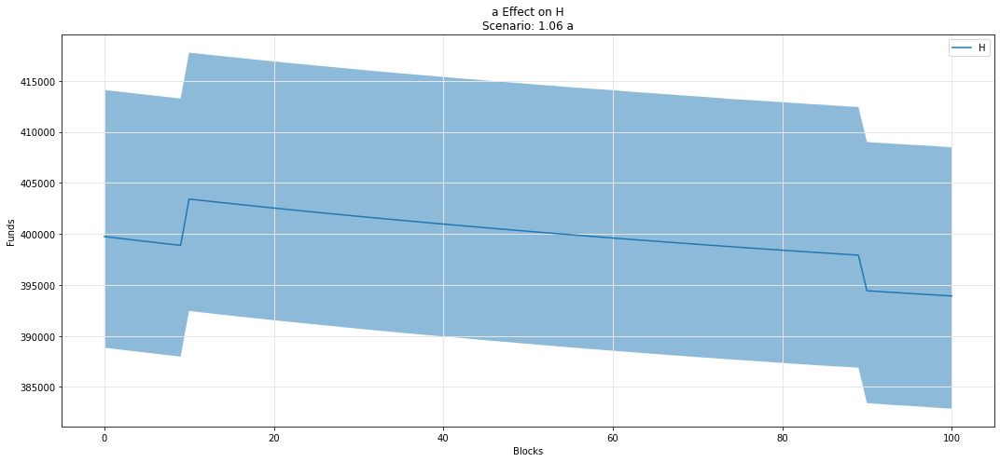

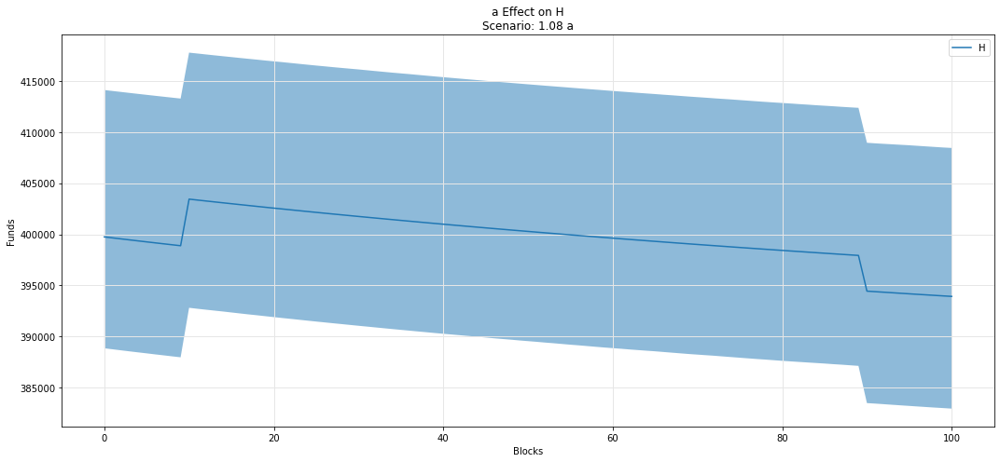

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

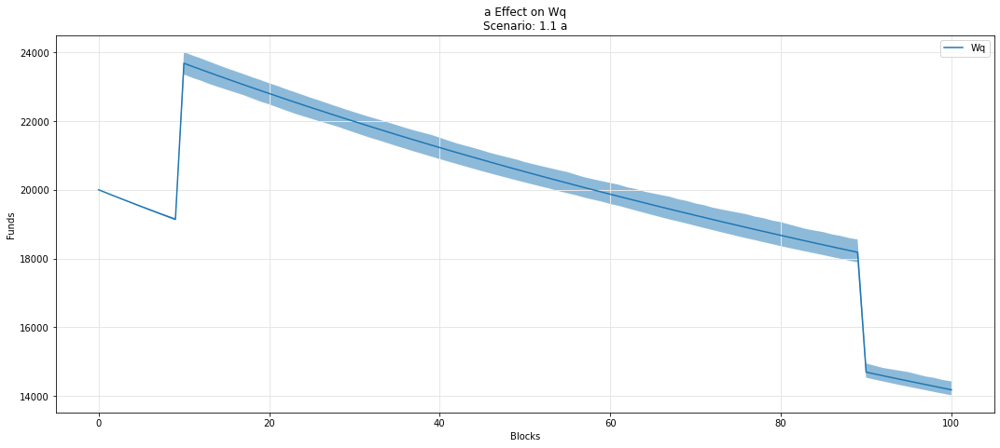

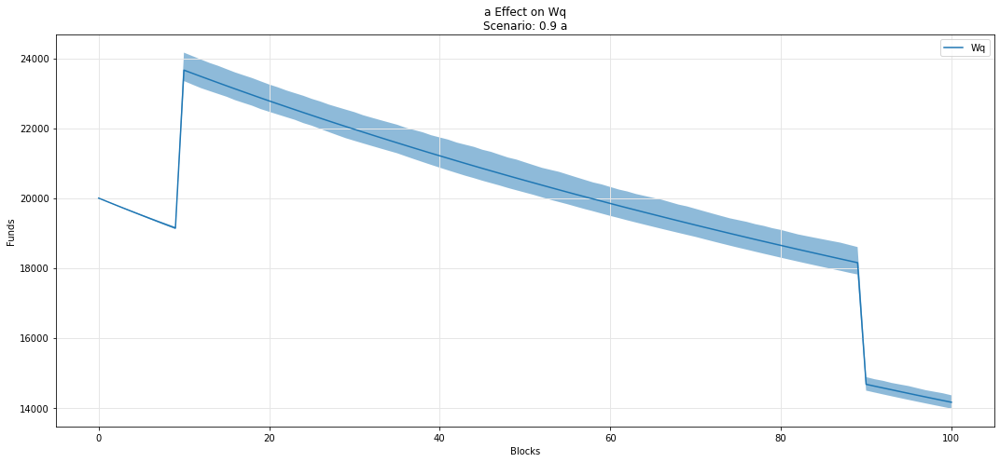

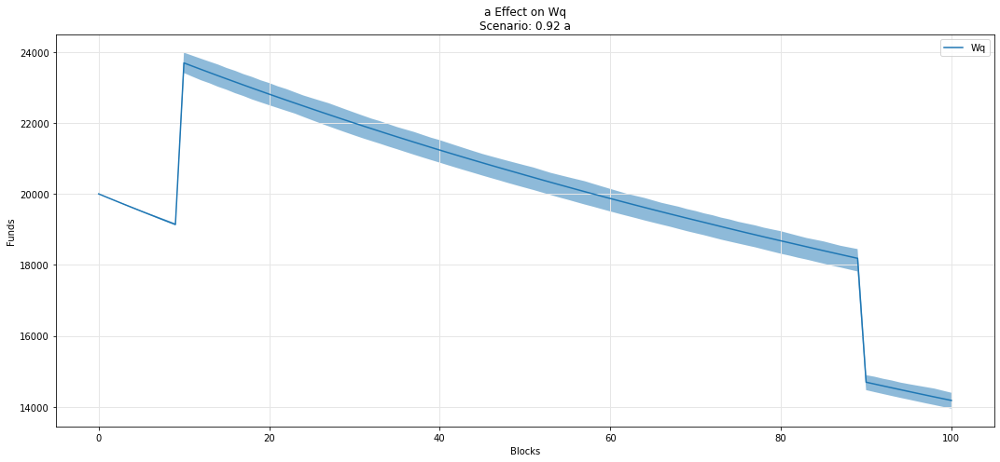

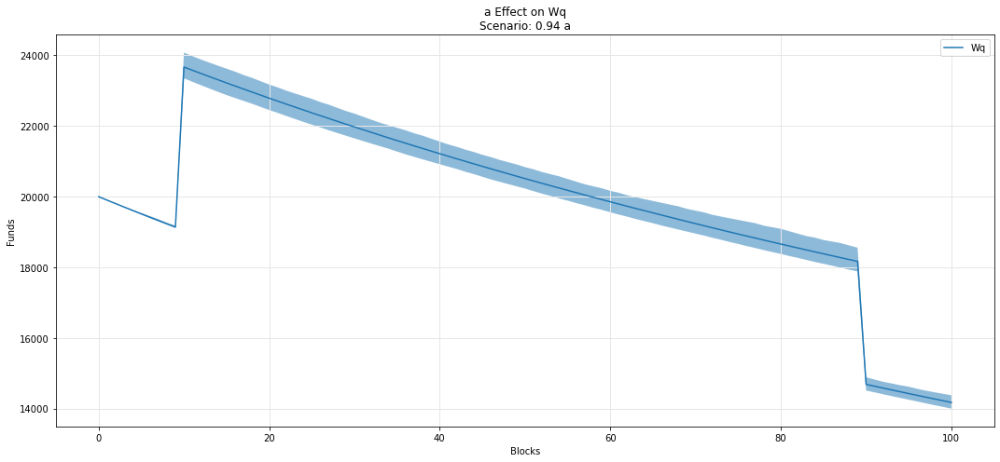

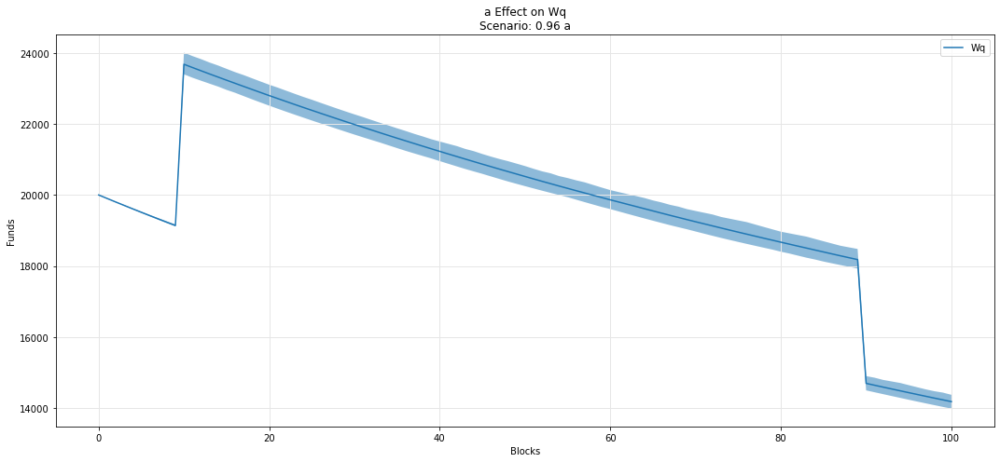

...

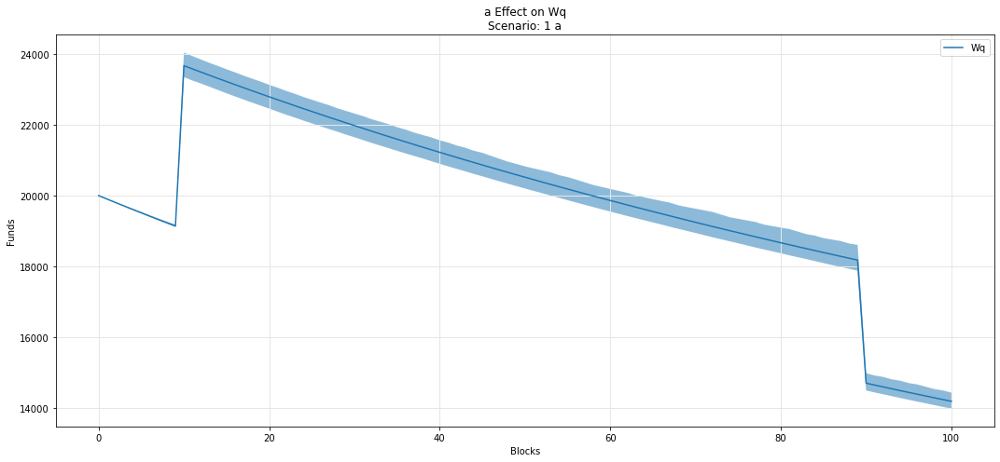

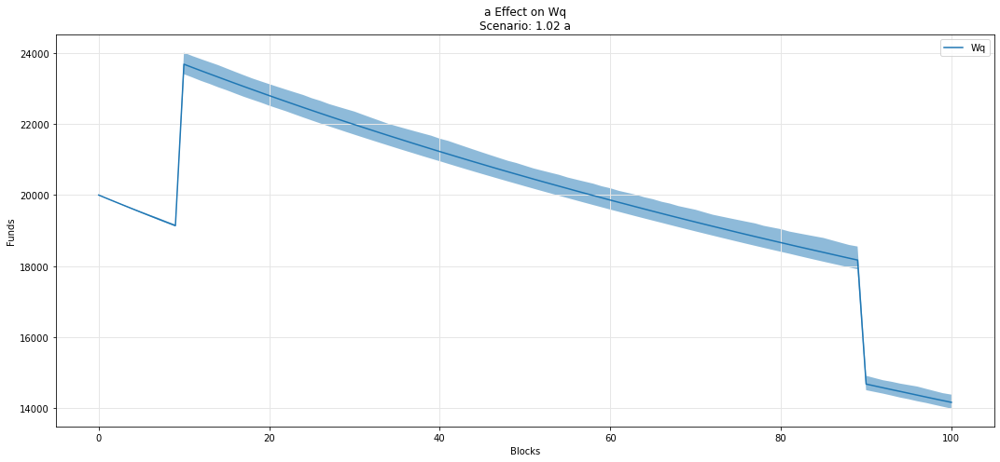

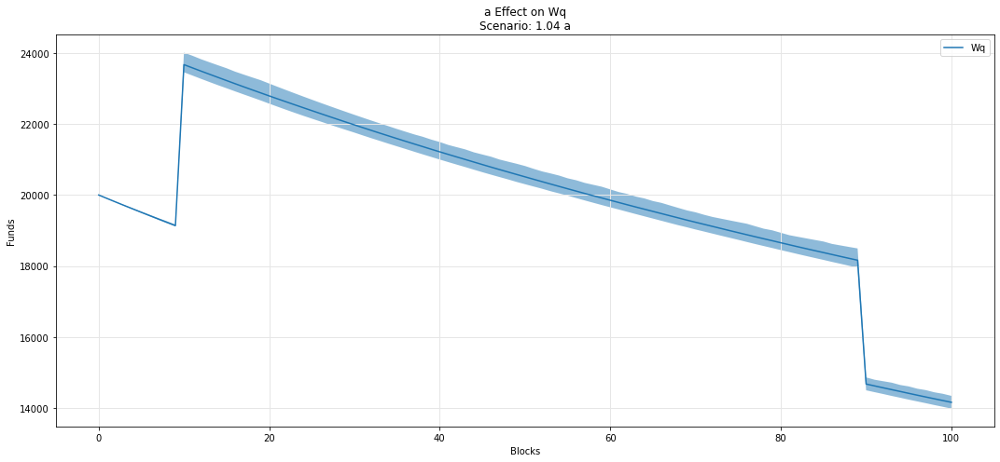

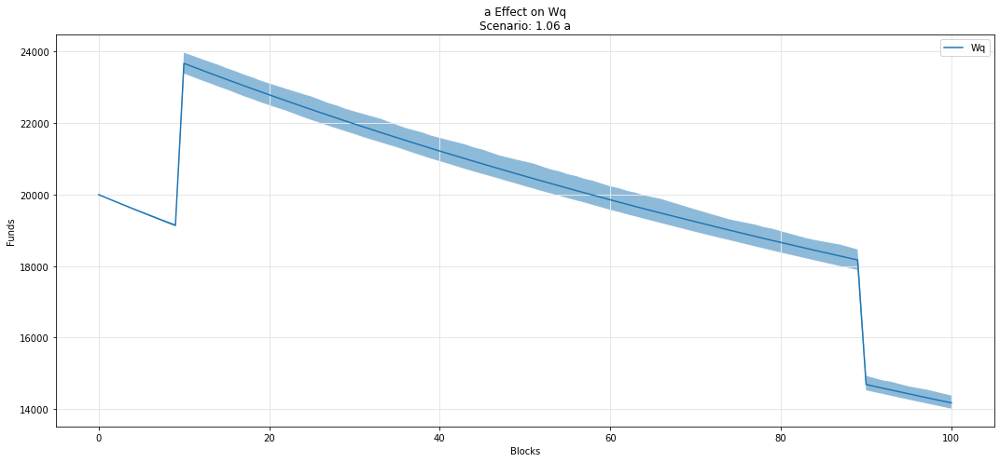

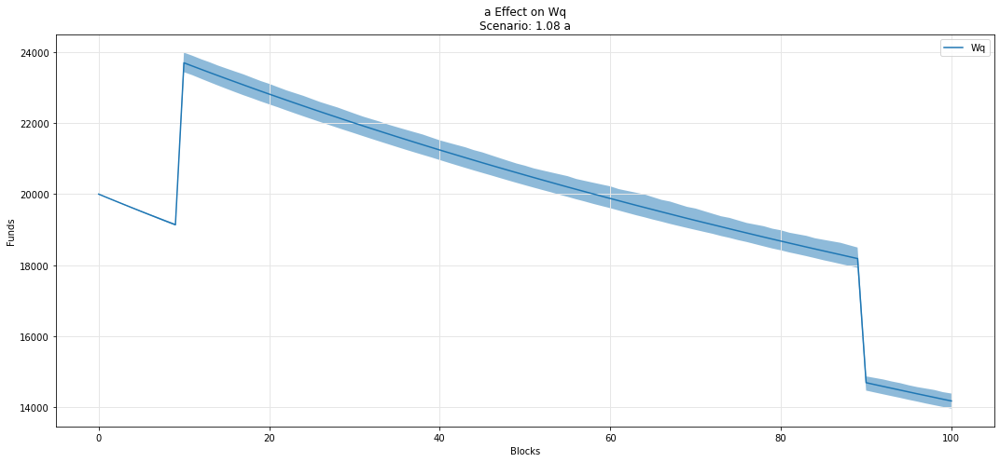

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

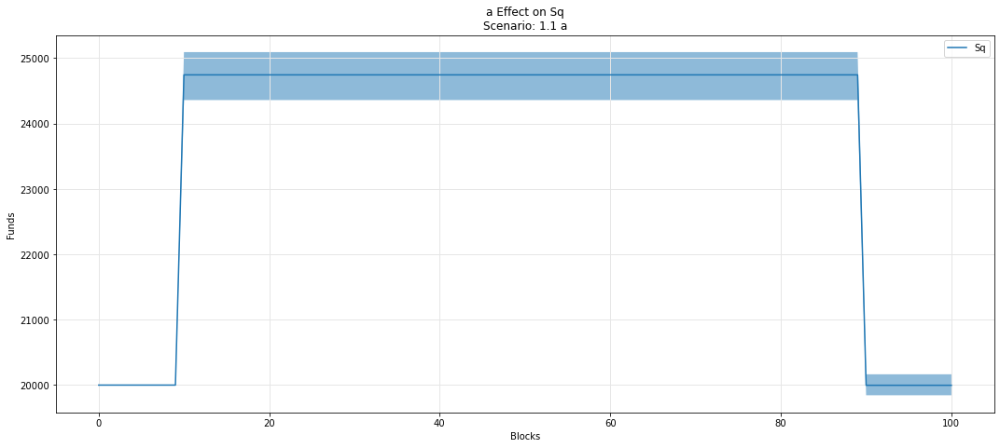

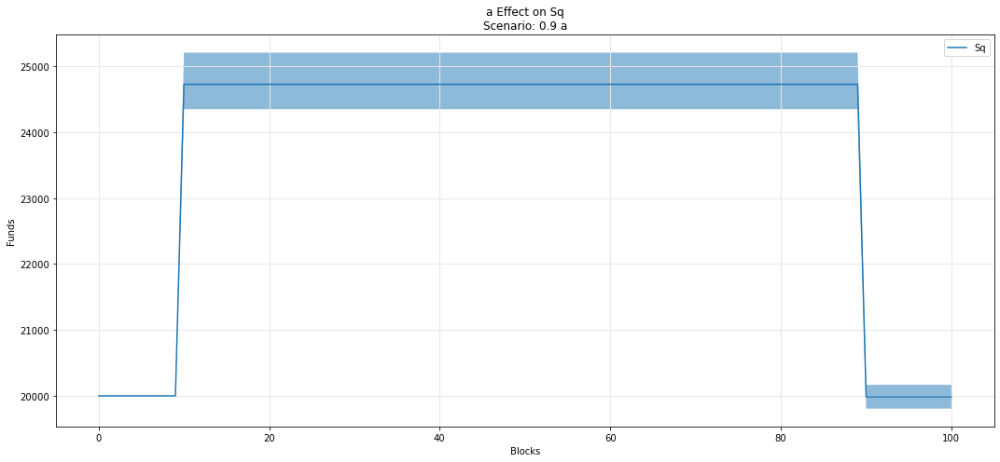

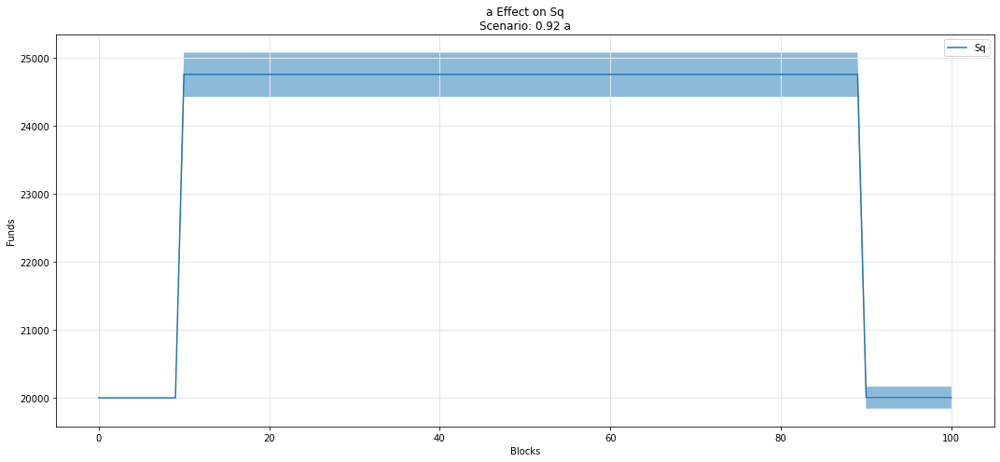

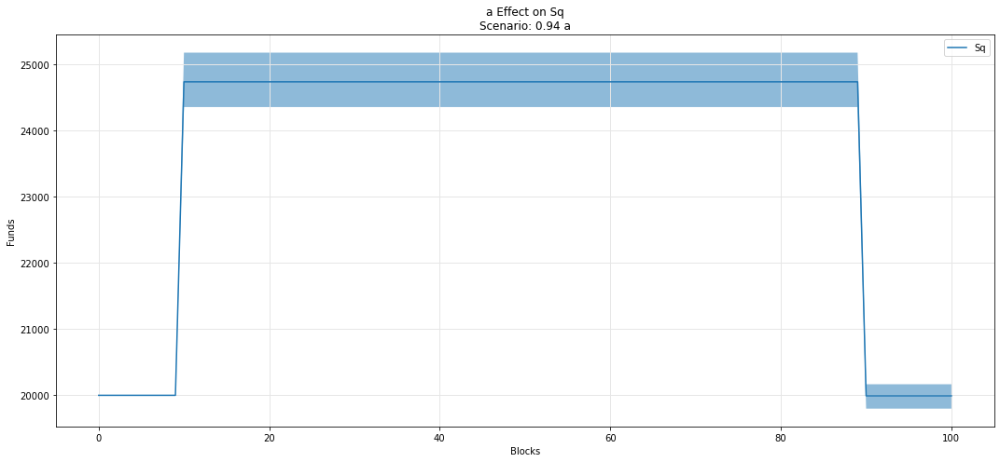

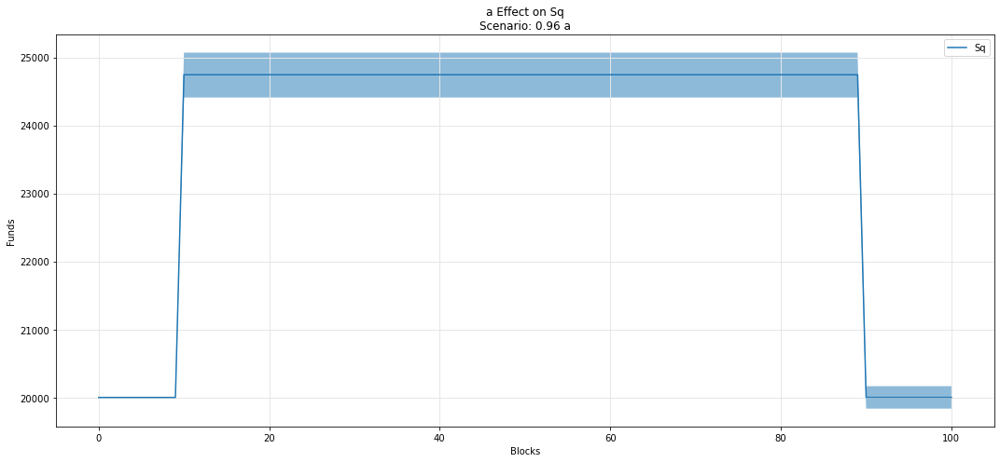

...

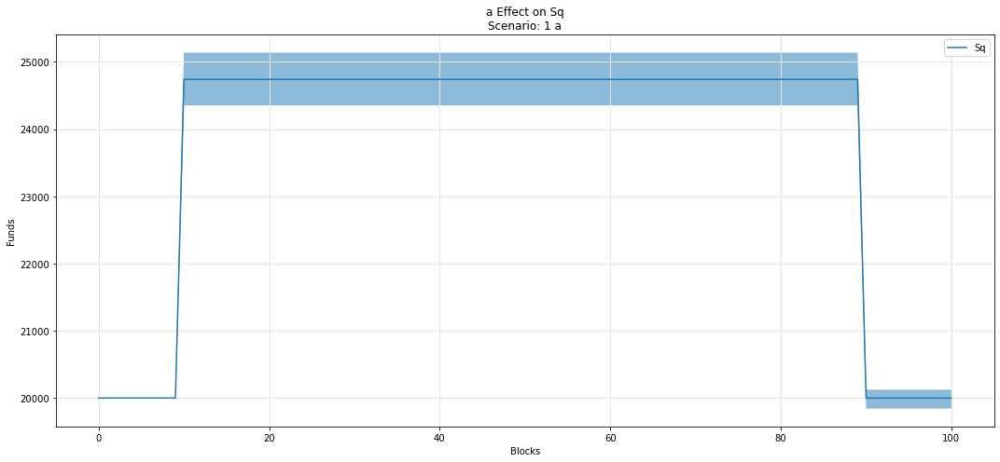

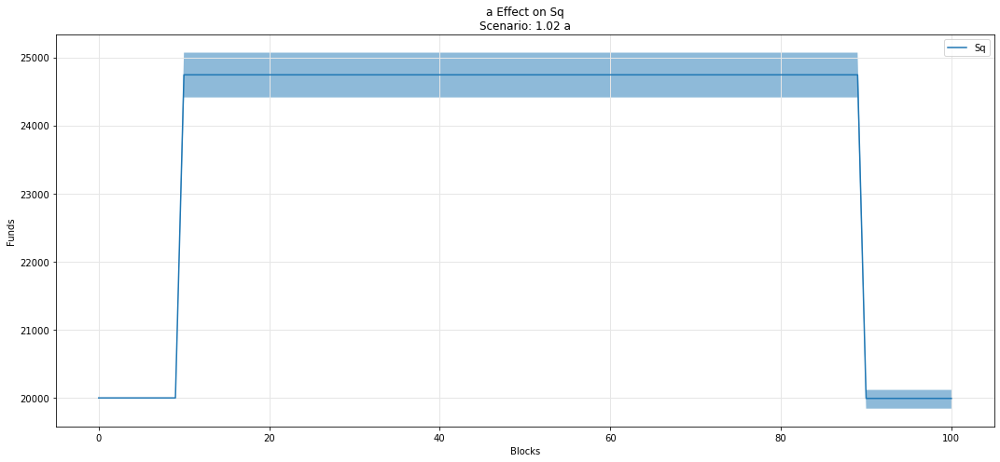

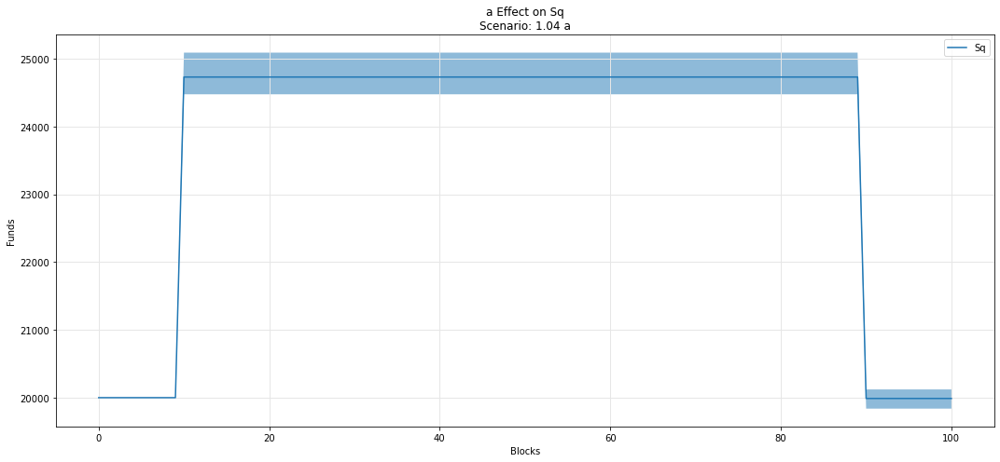

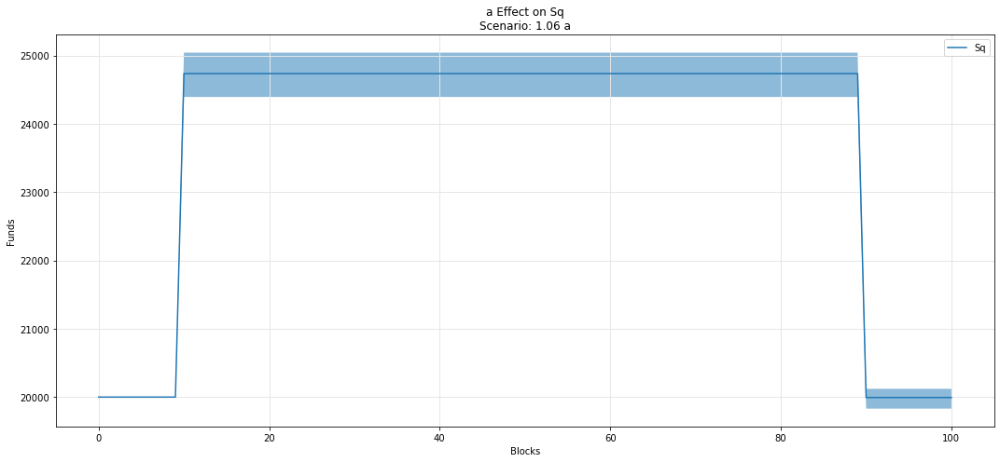

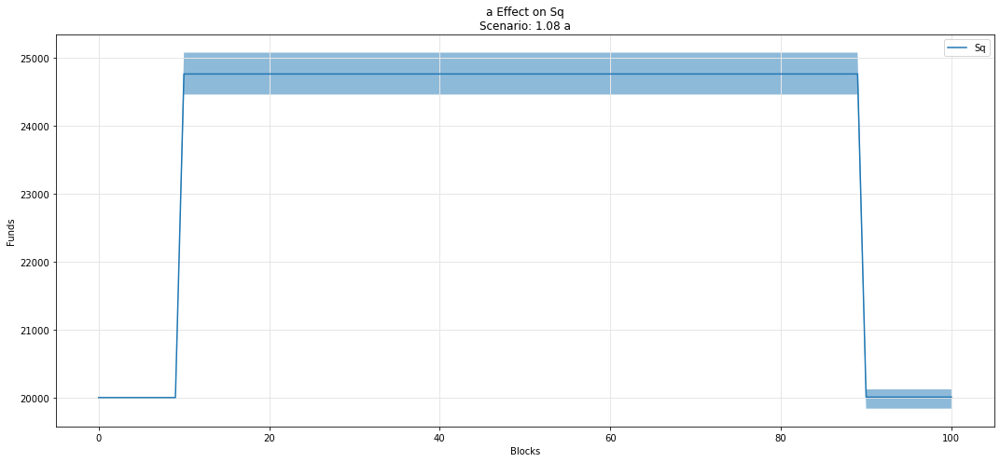

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

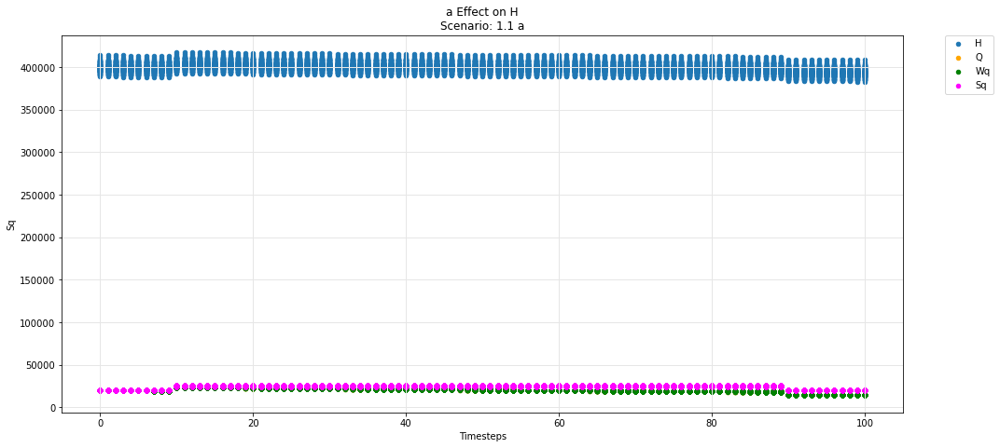

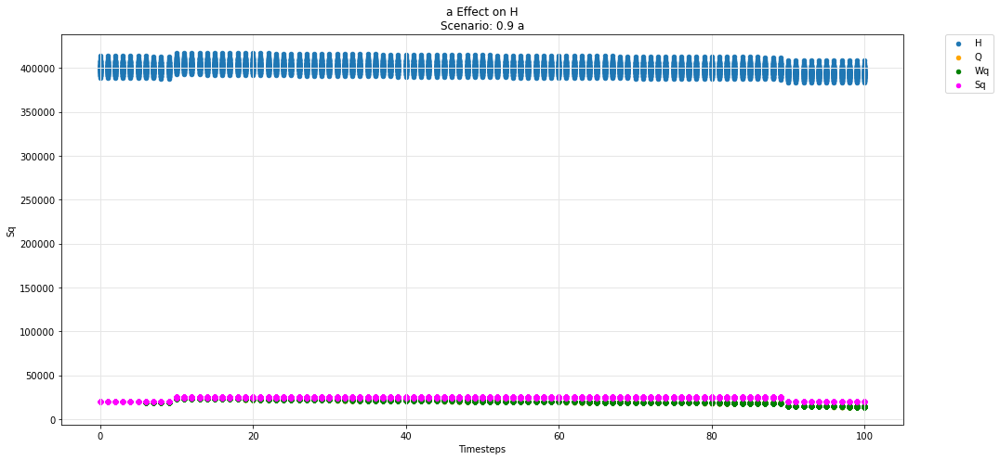

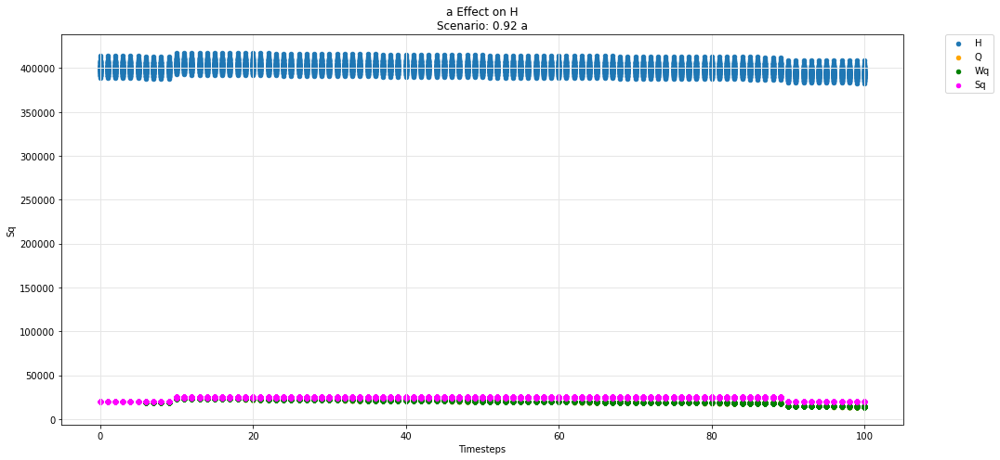

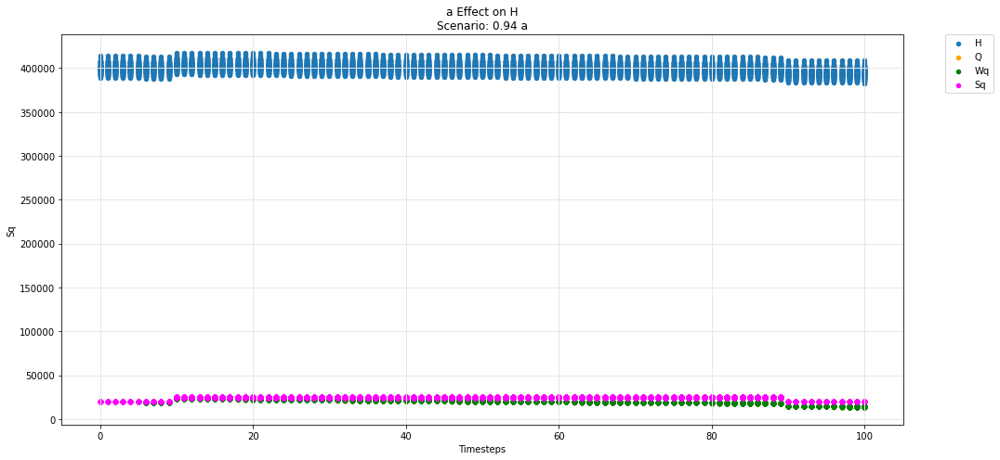

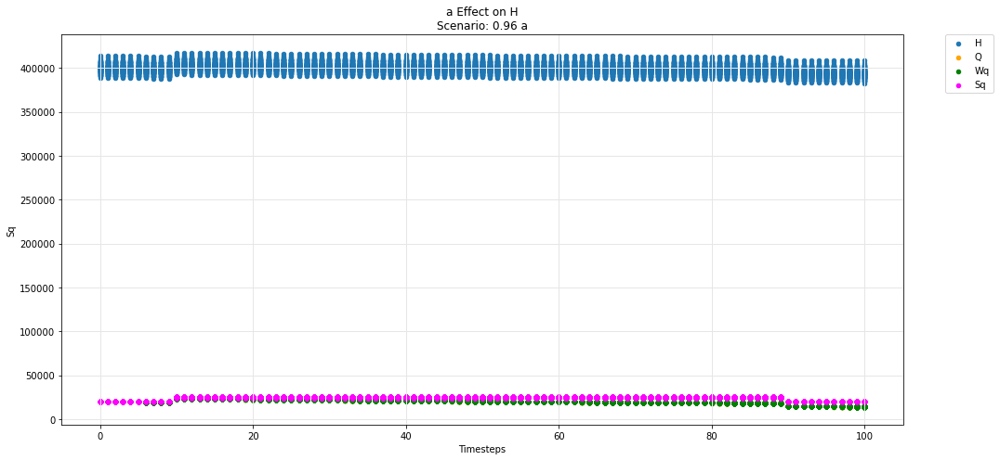

...

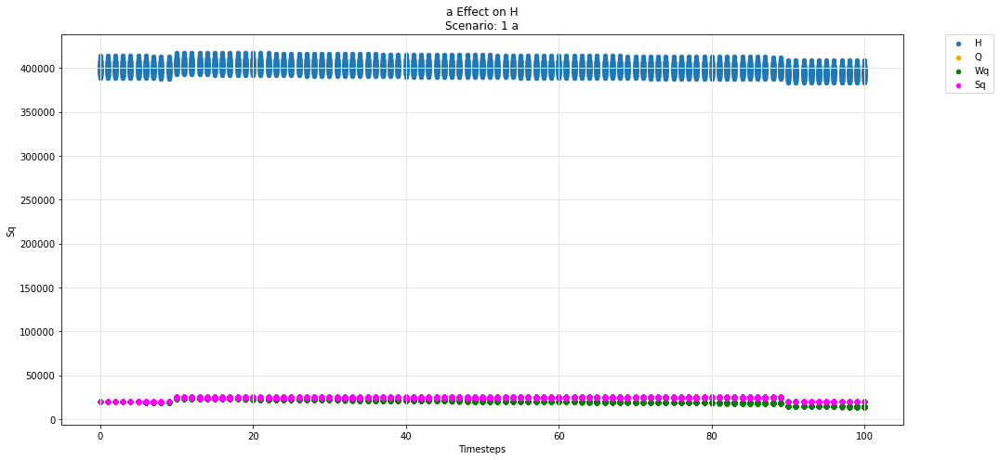

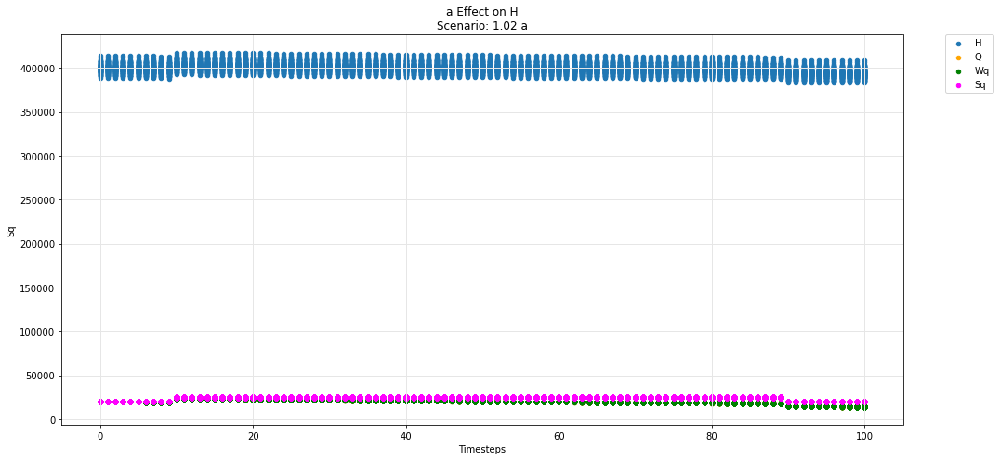

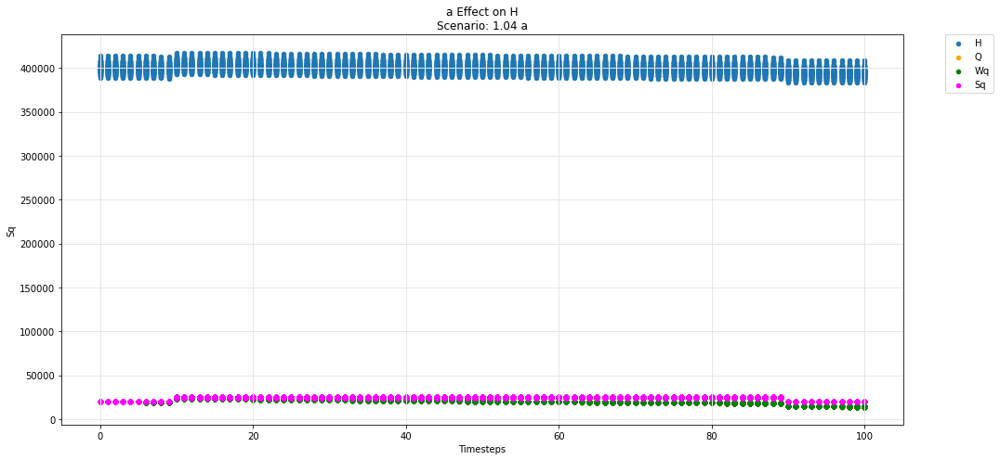

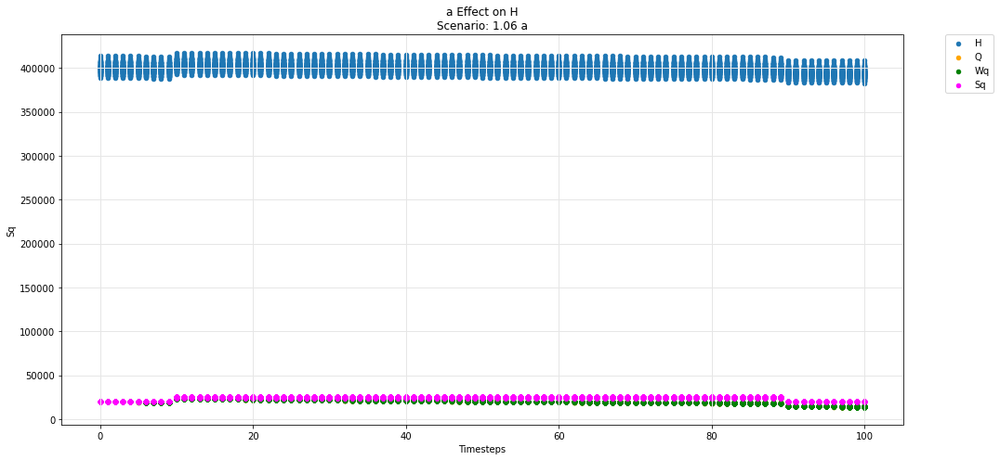

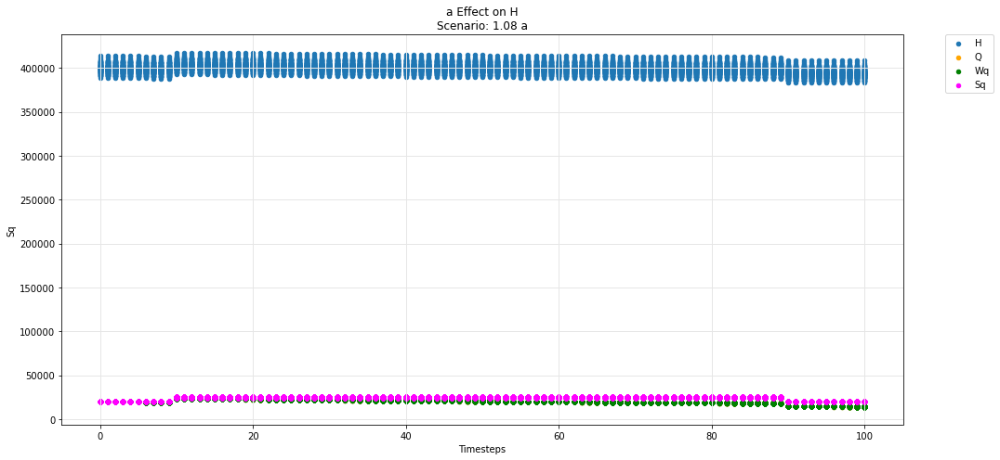

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

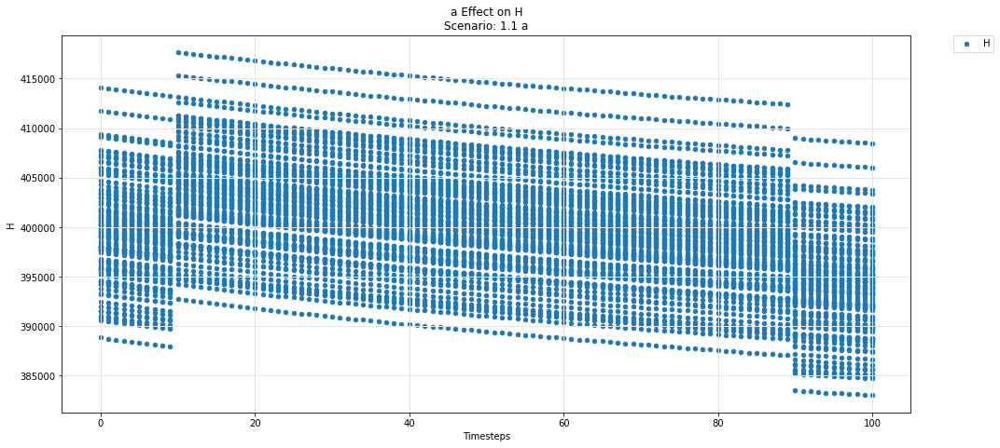

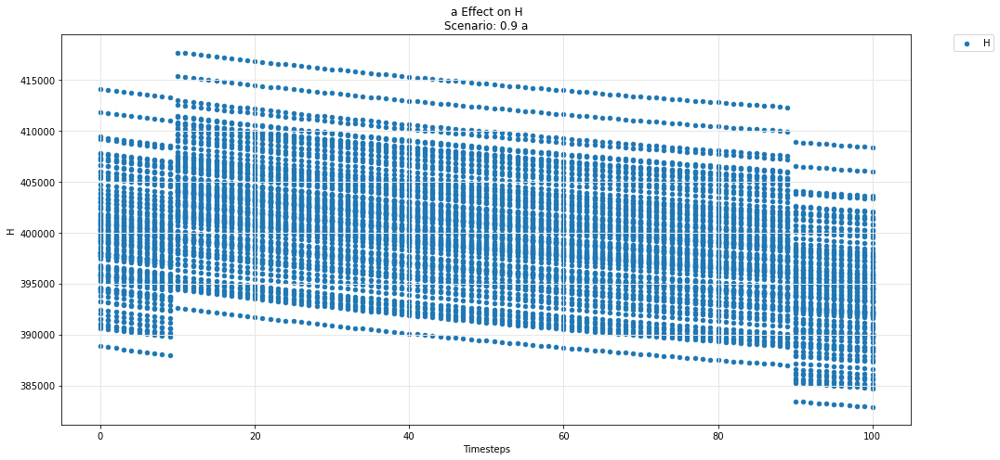

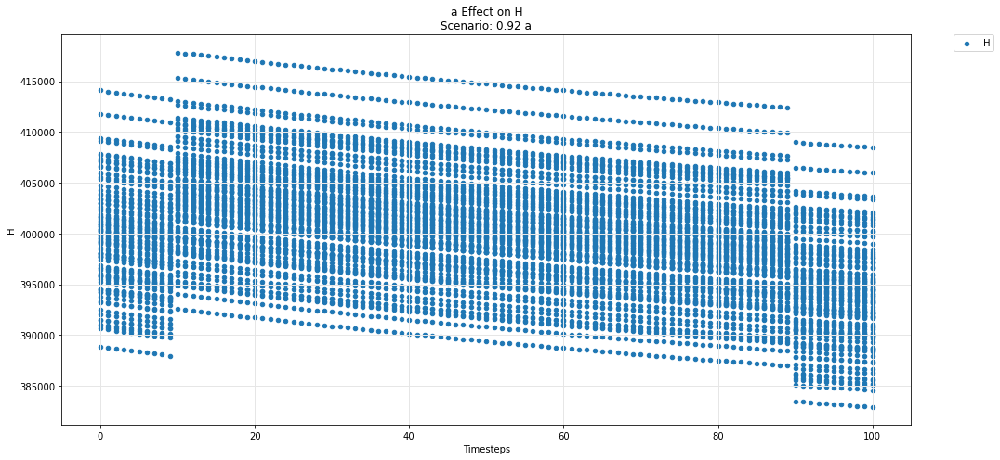

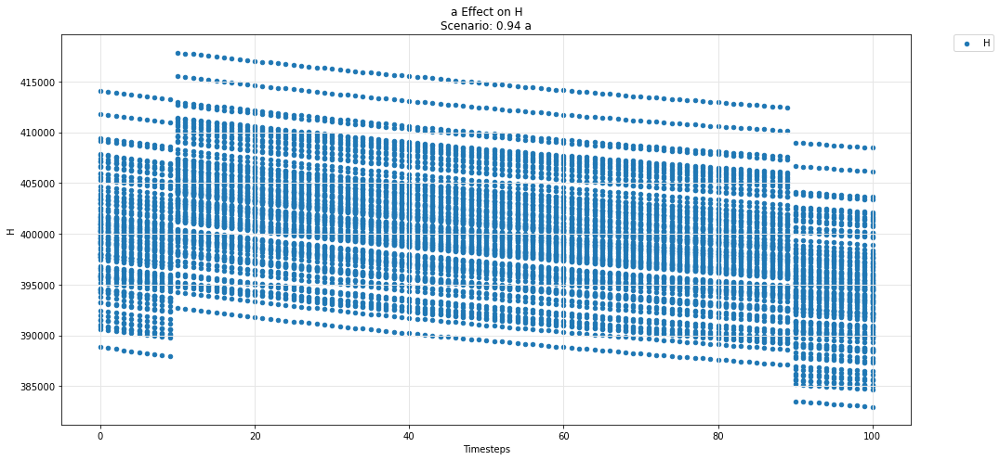

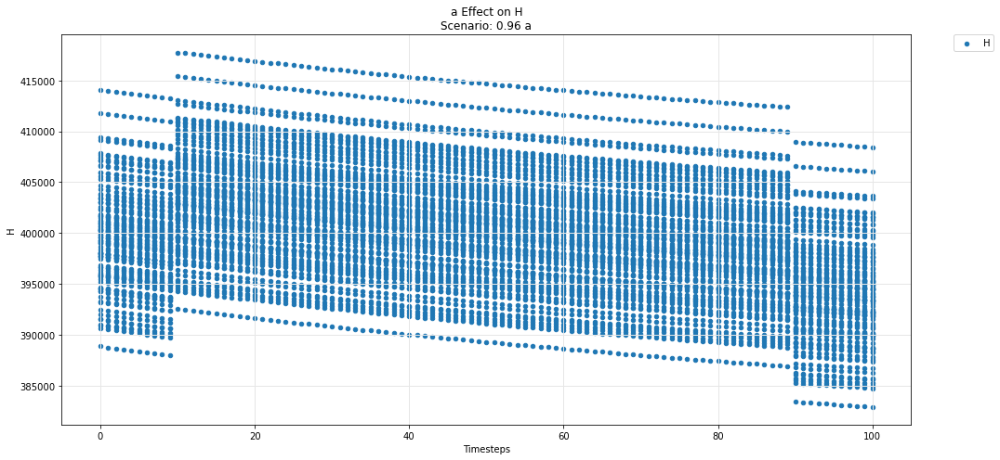

...

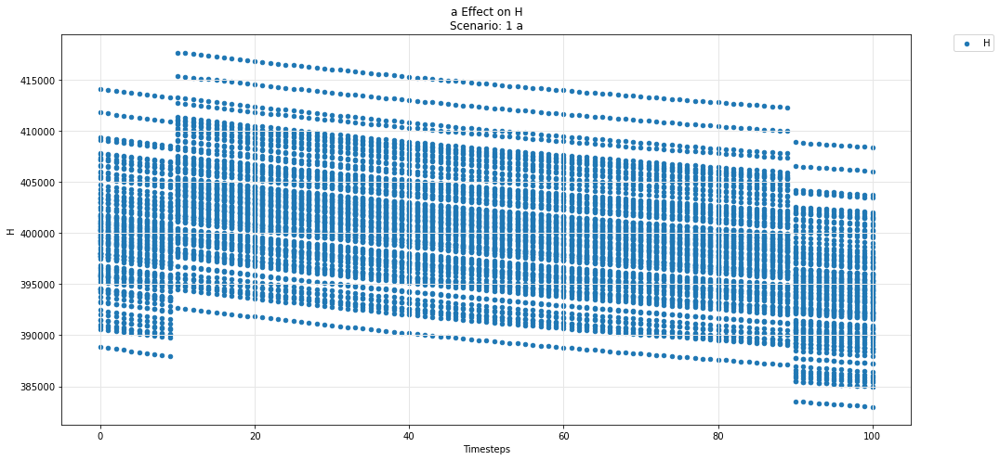

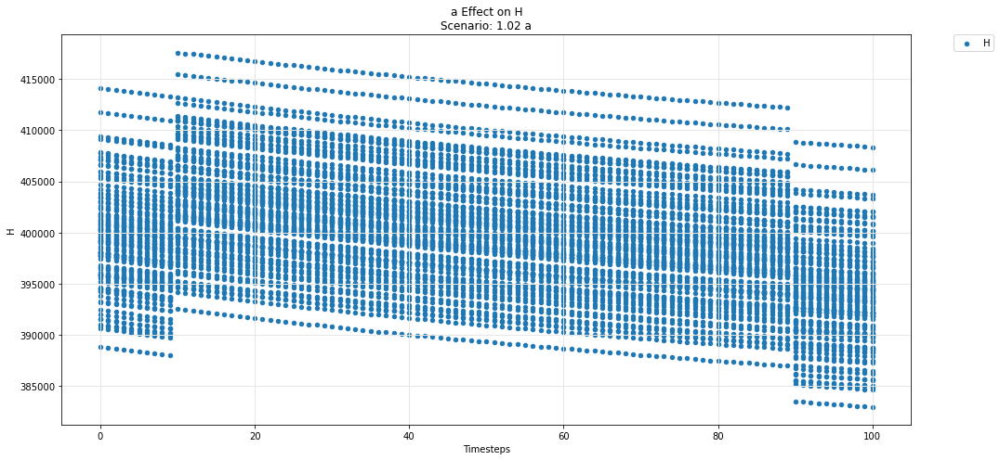

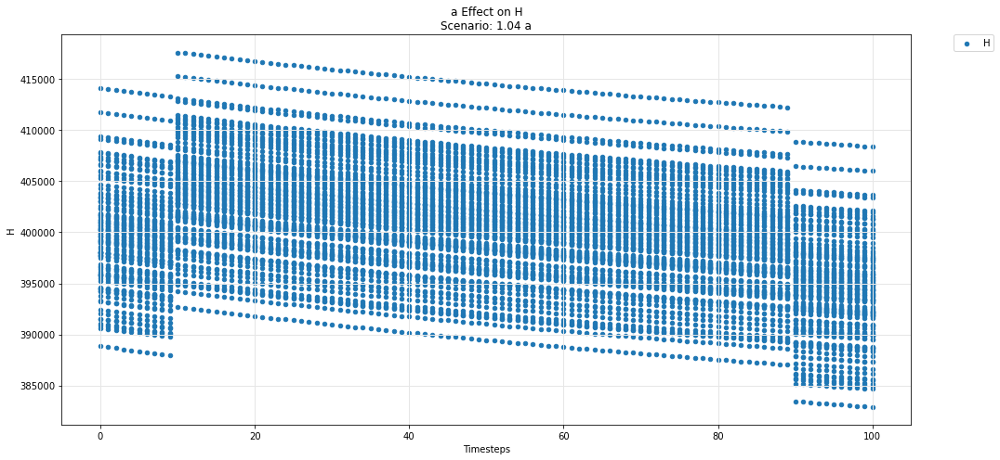

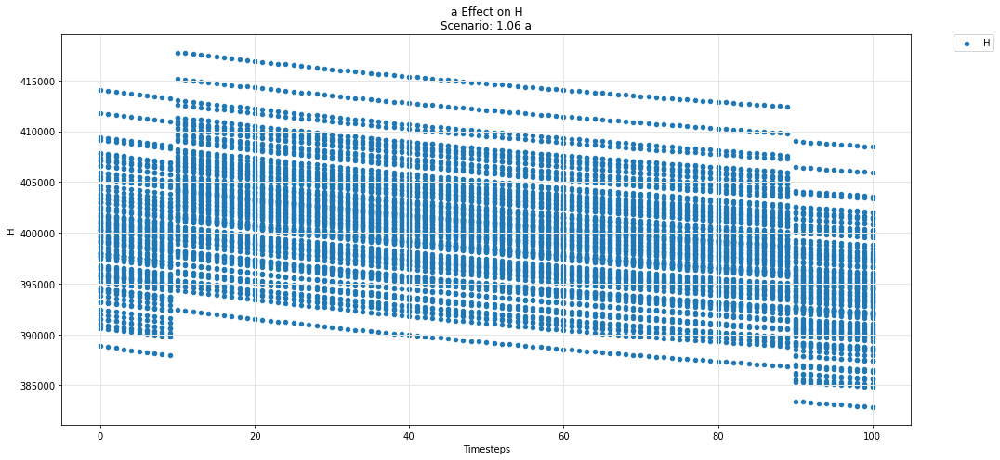

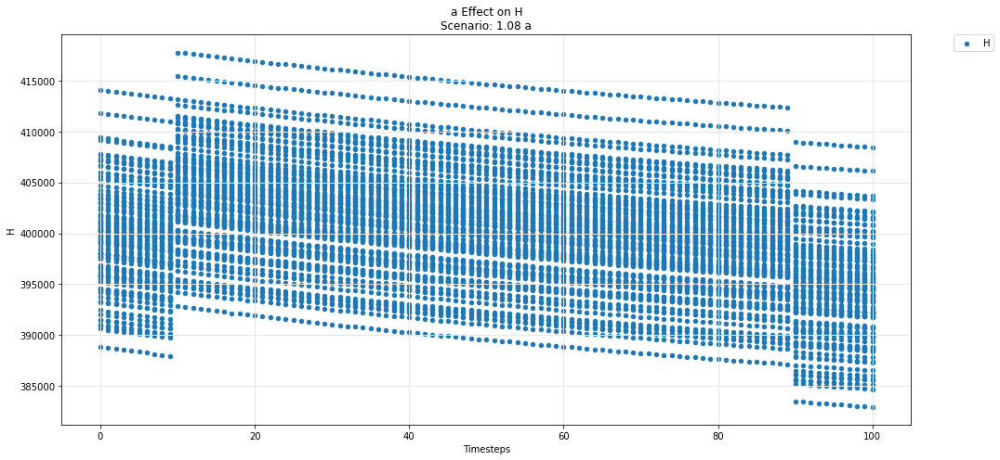

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

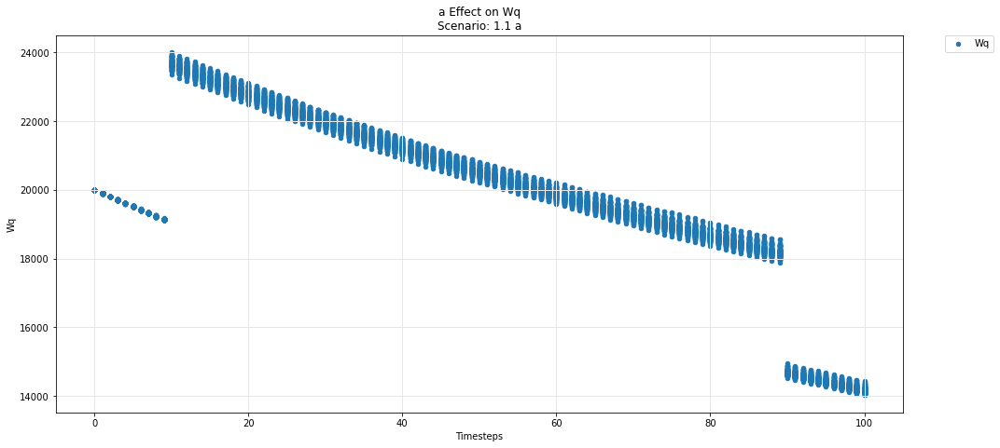

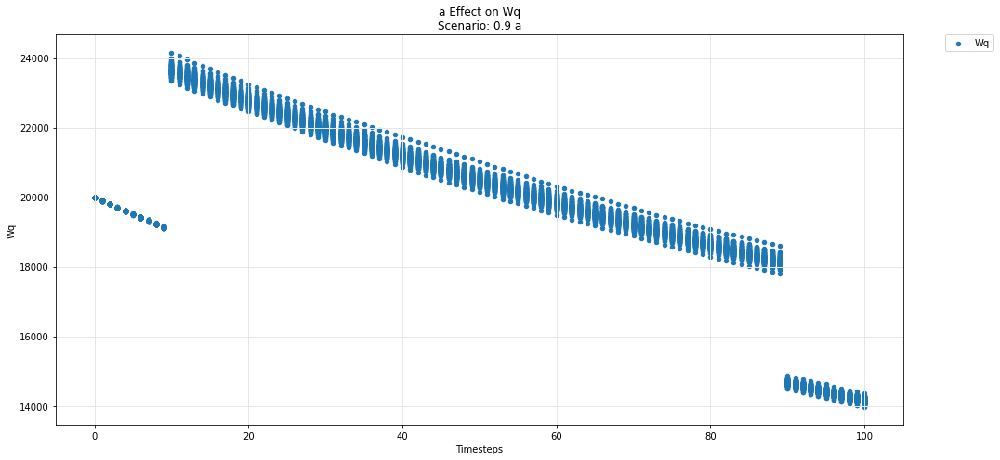

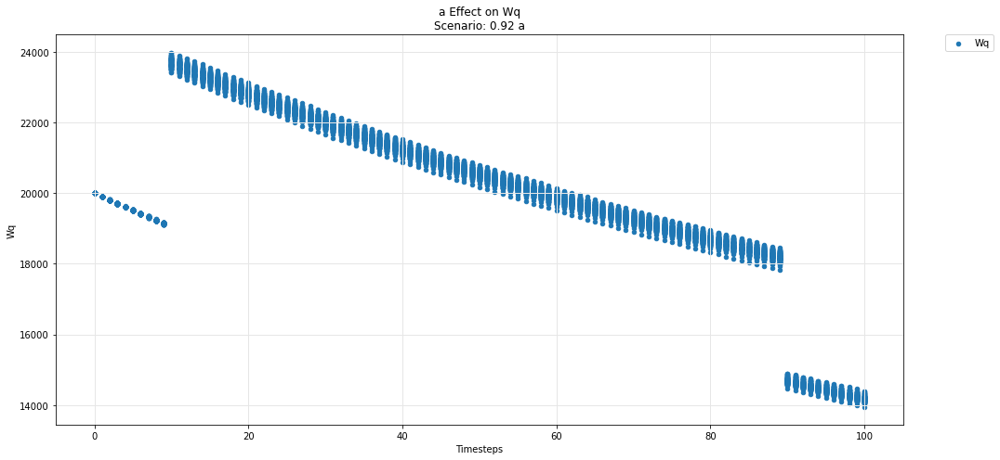

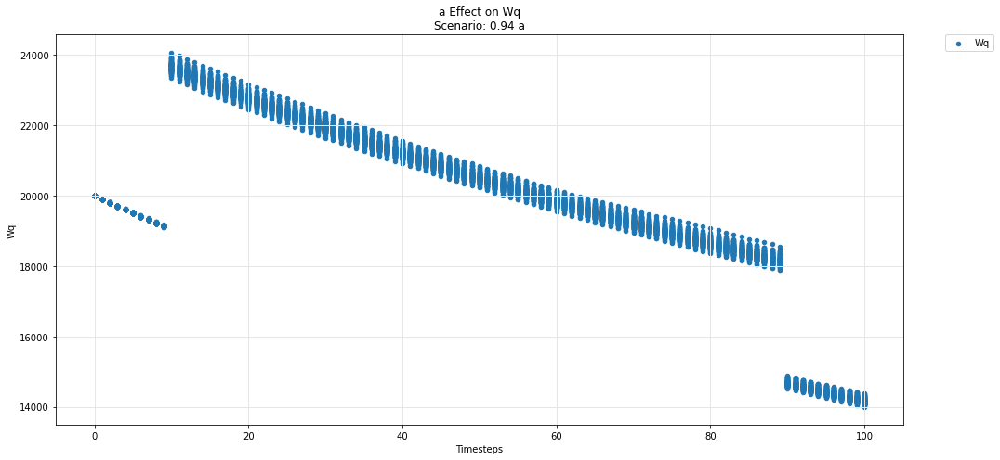

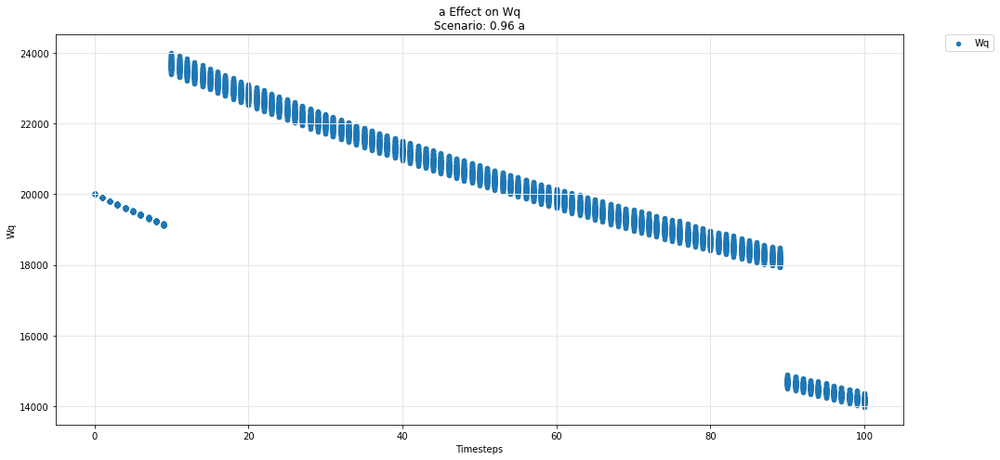

...

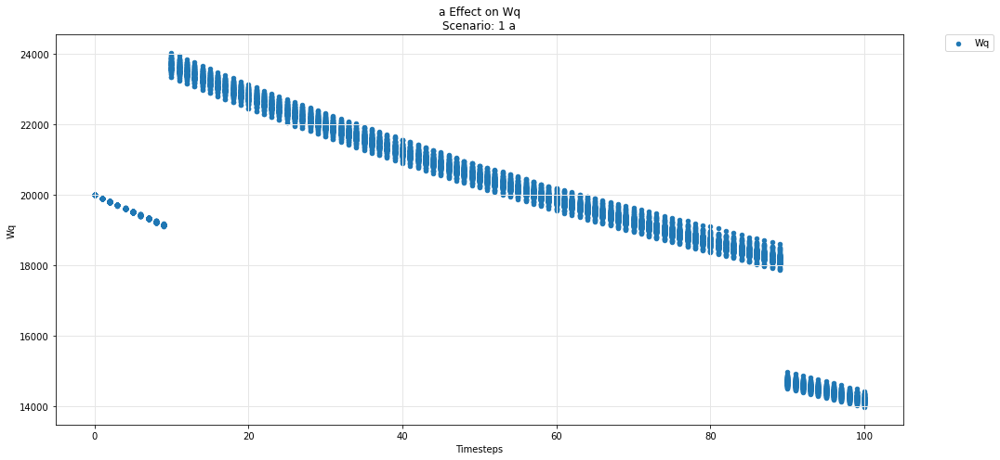

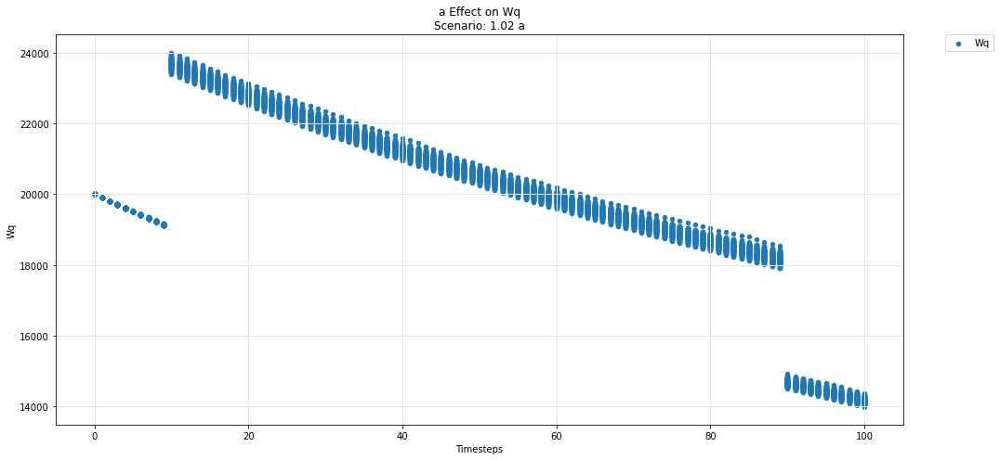

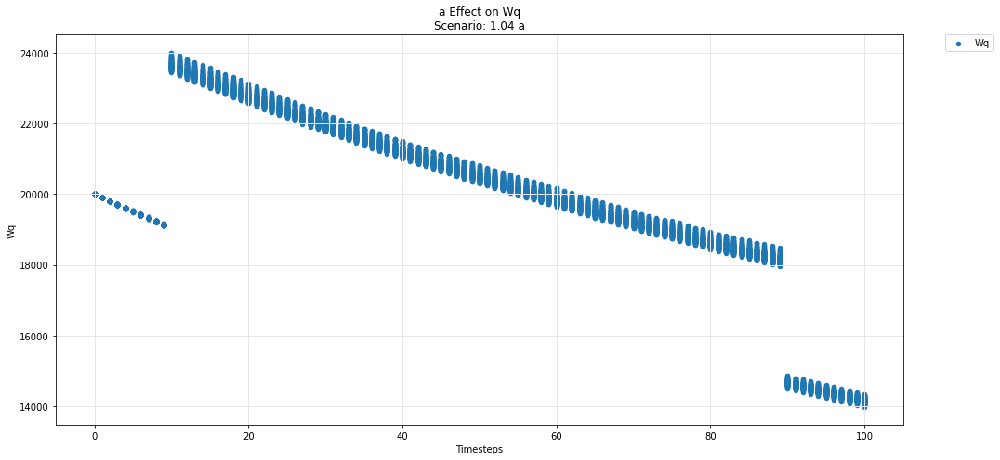

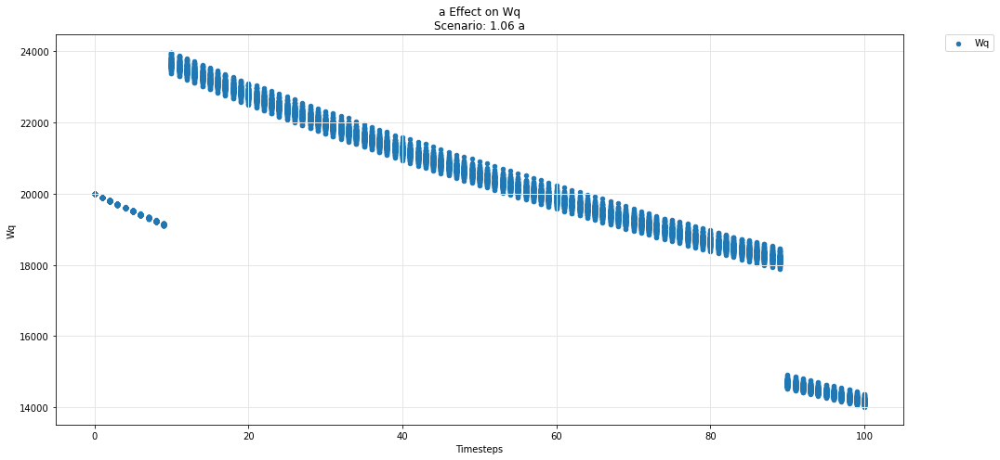

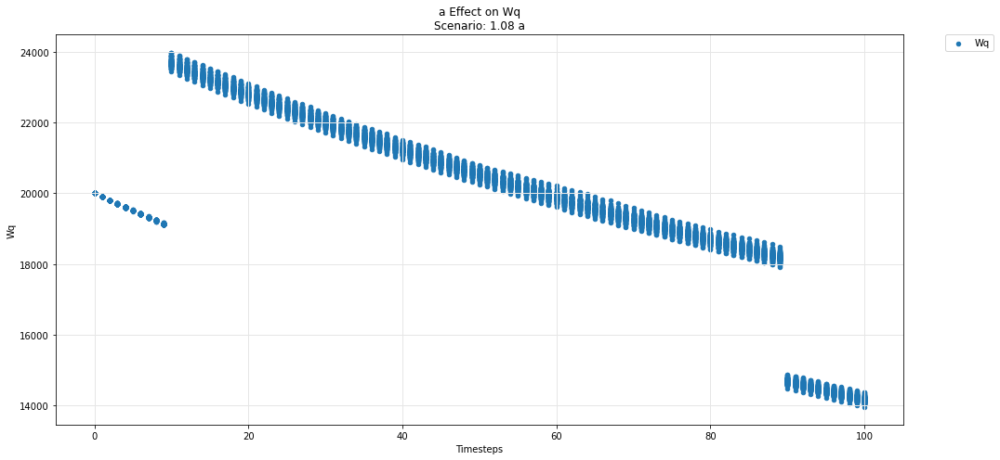

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

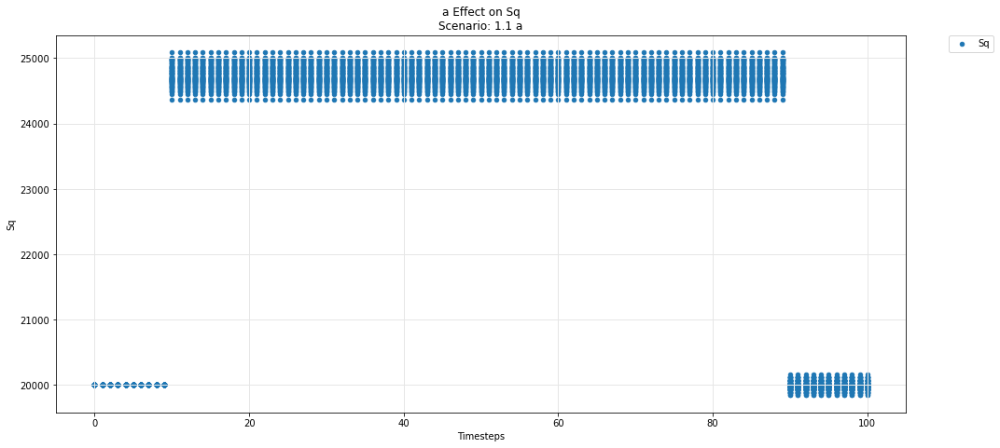

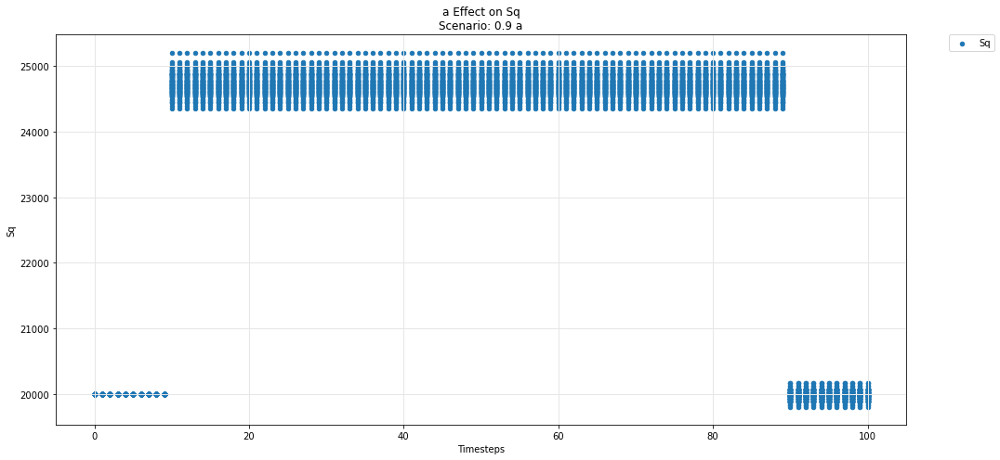

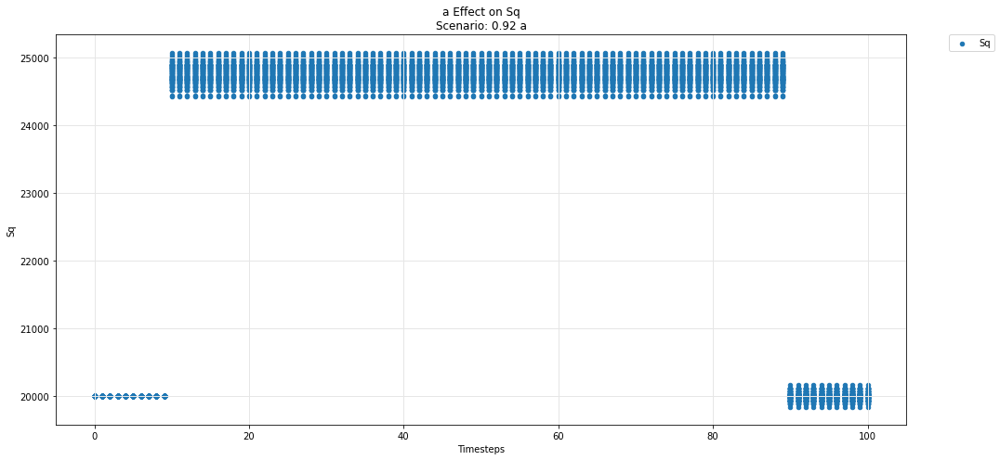

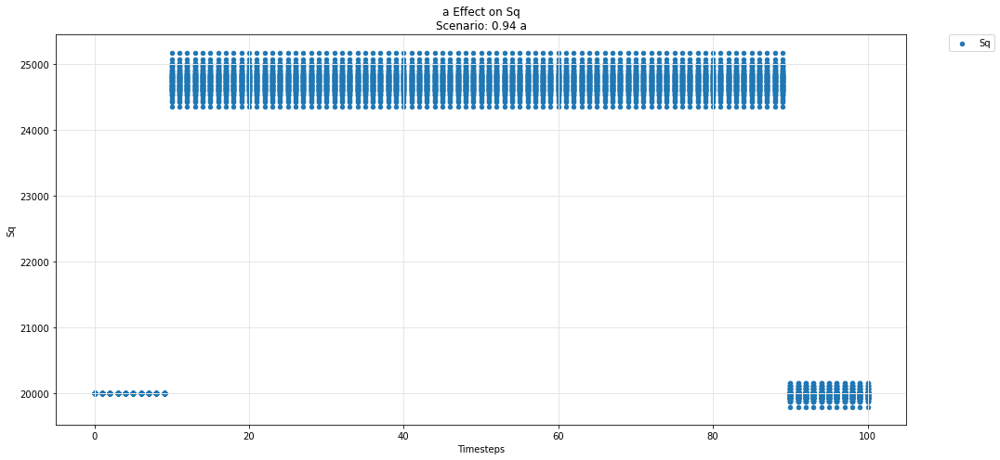

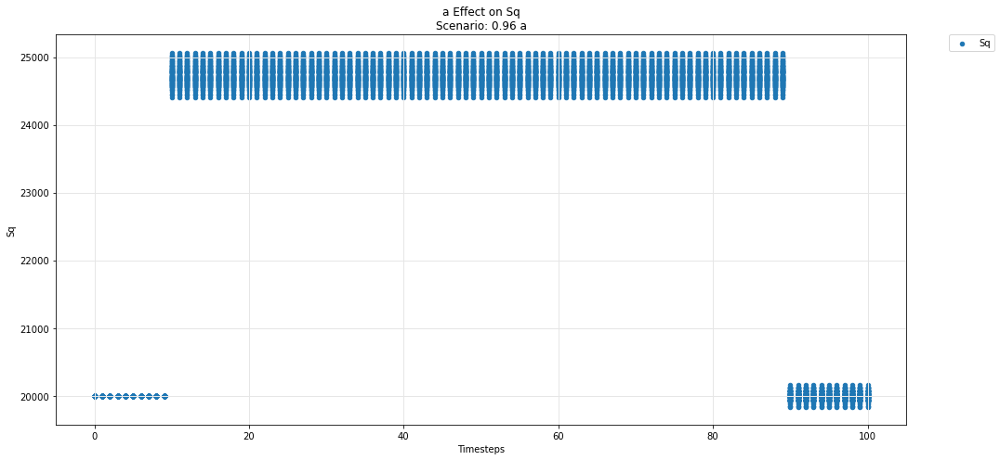

...

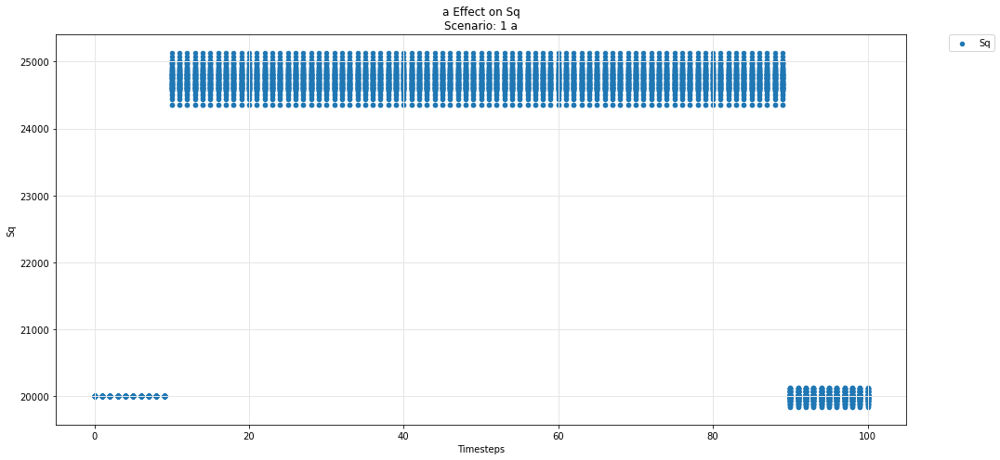

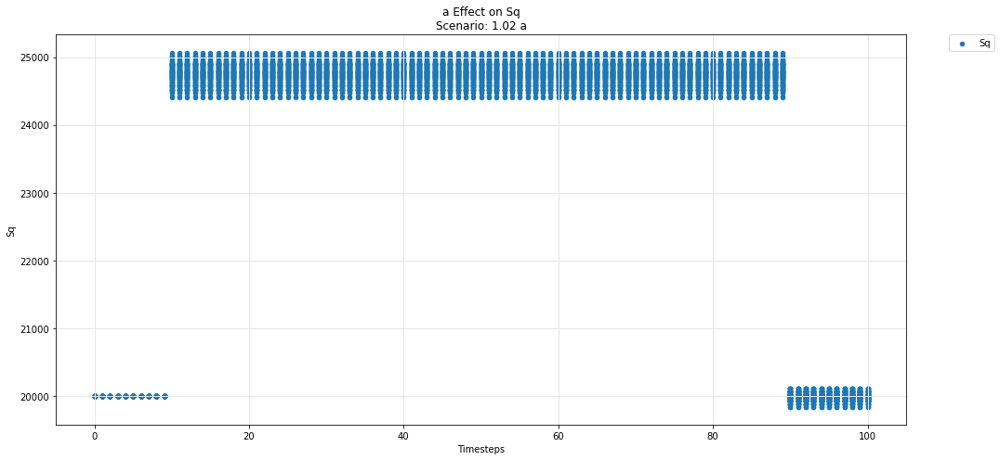

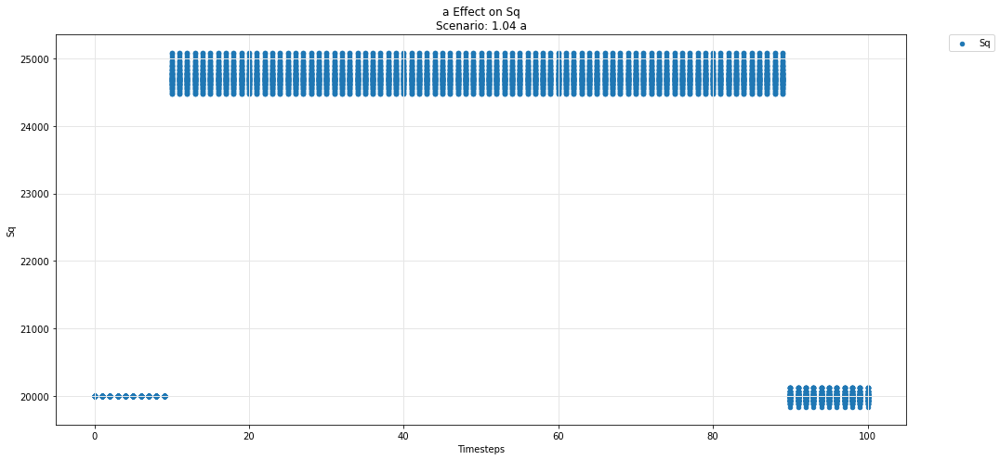

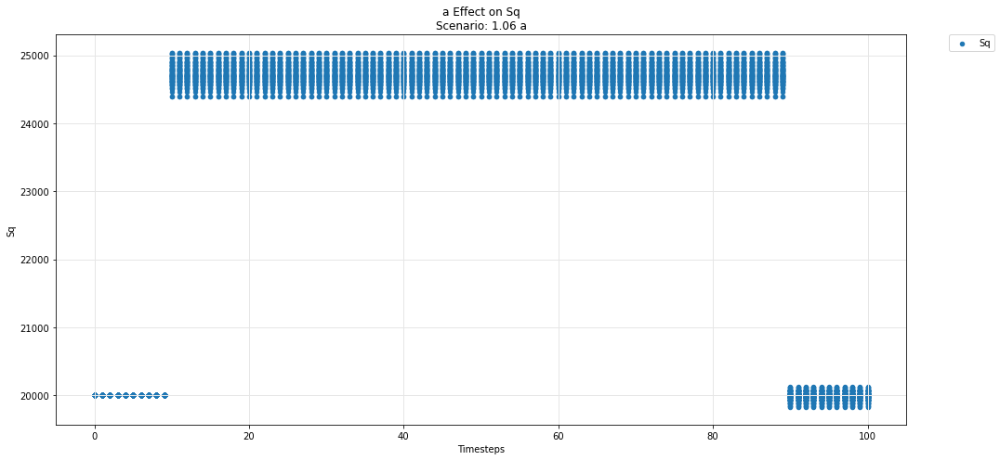

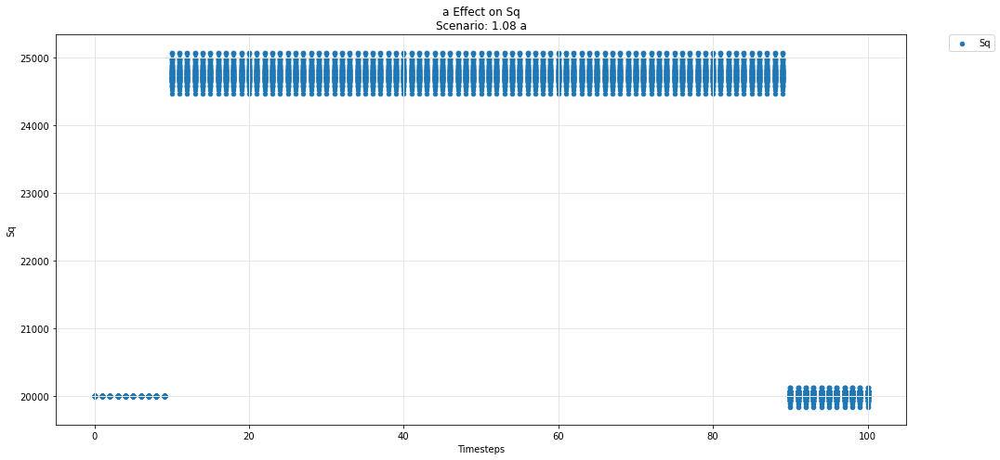

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

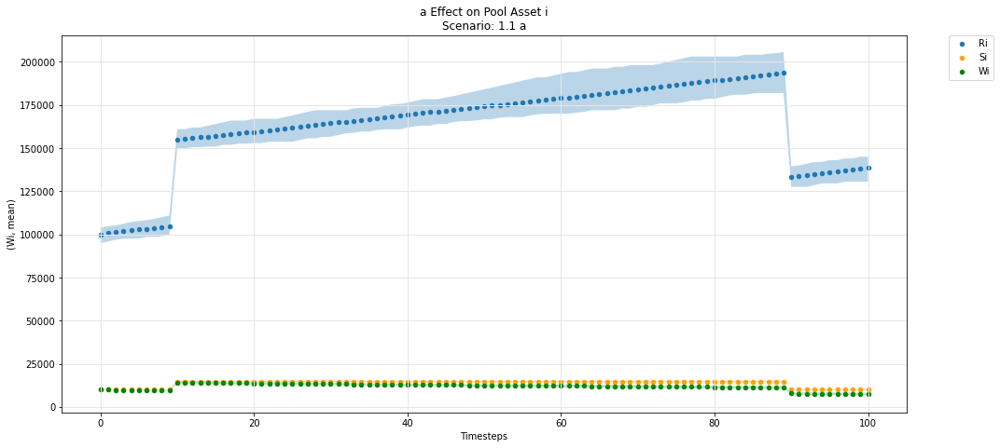

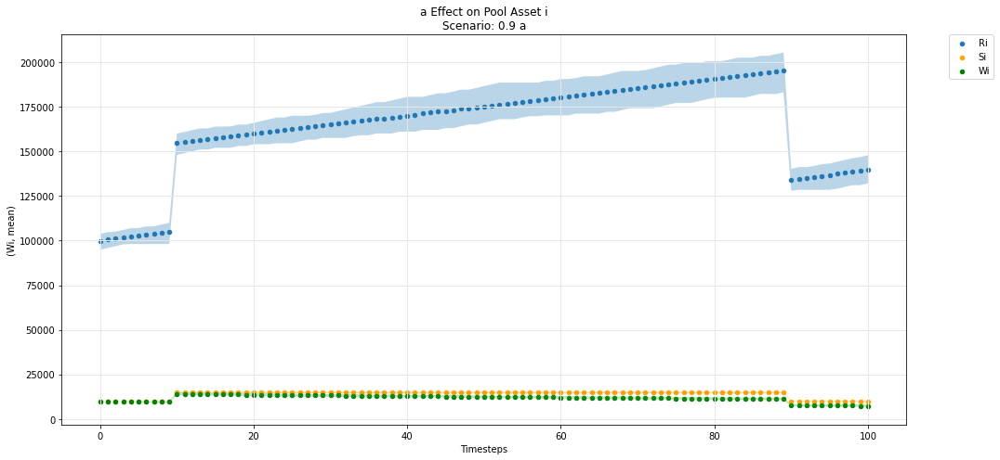

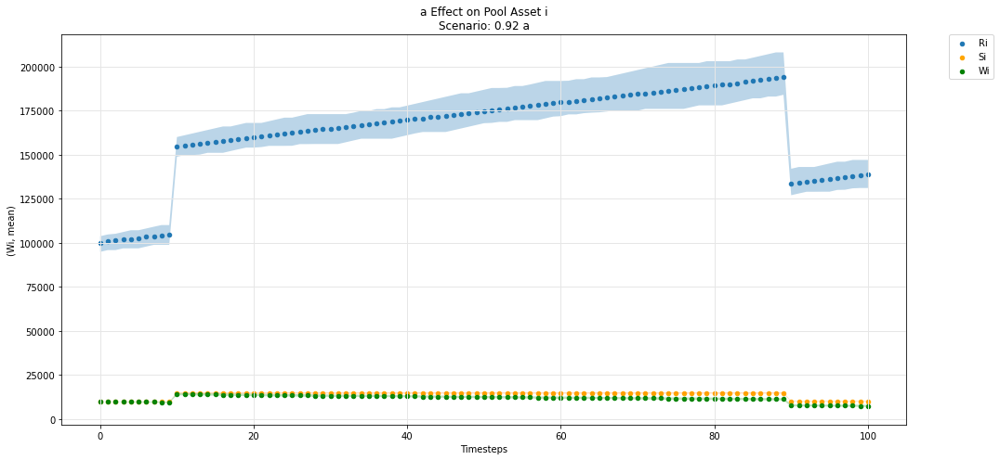

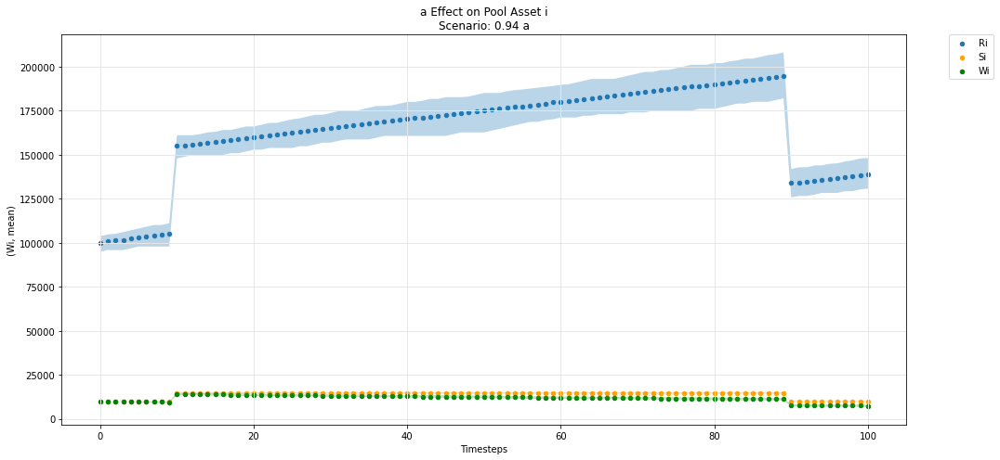

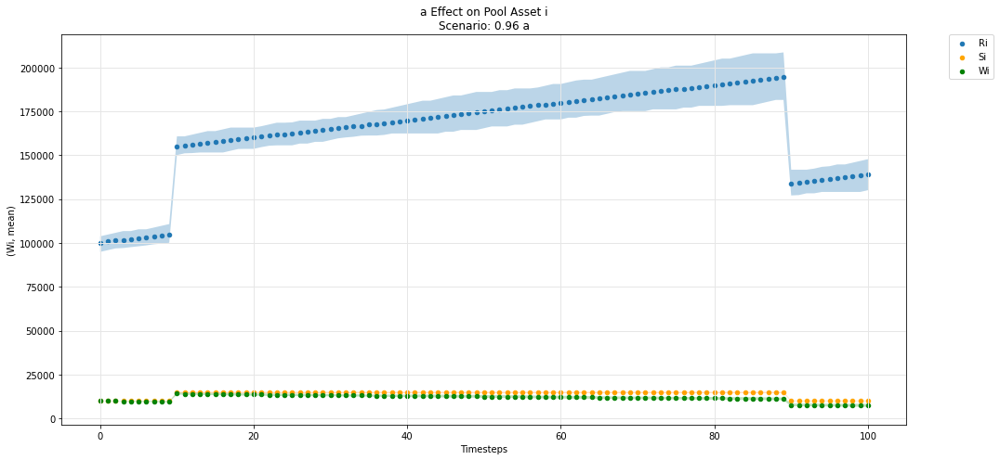

...

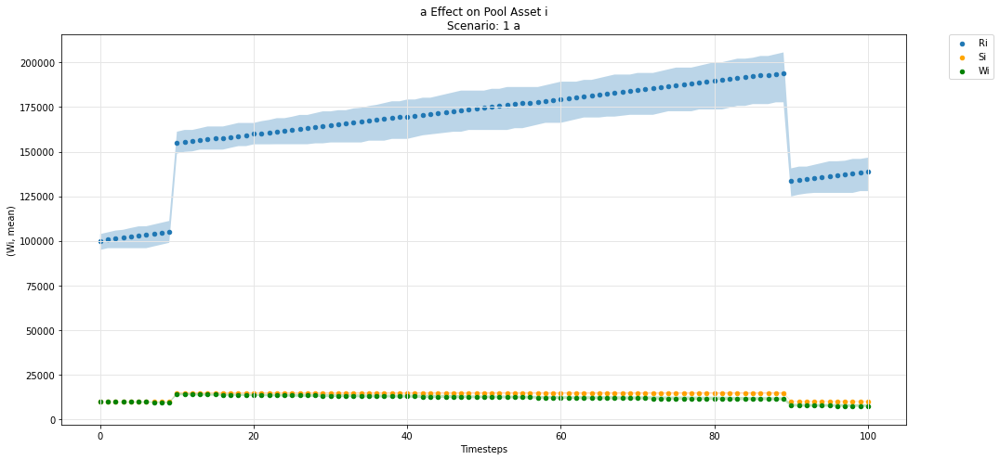

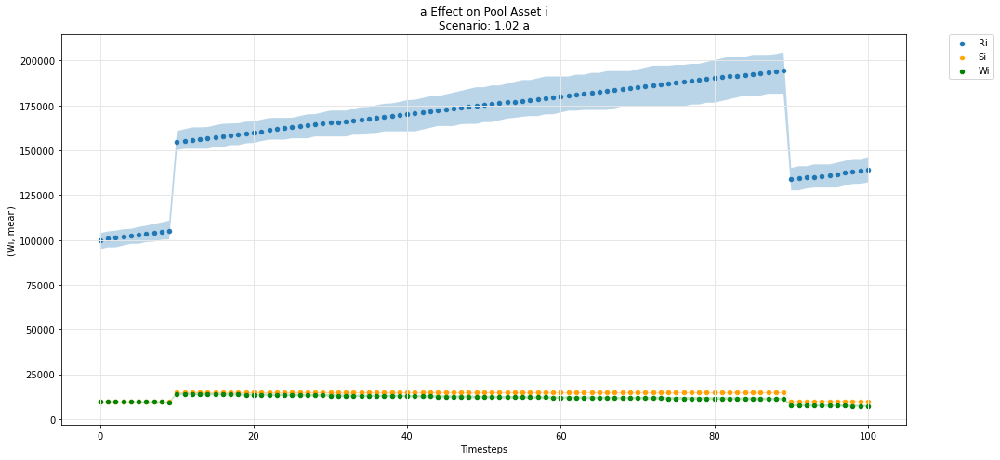

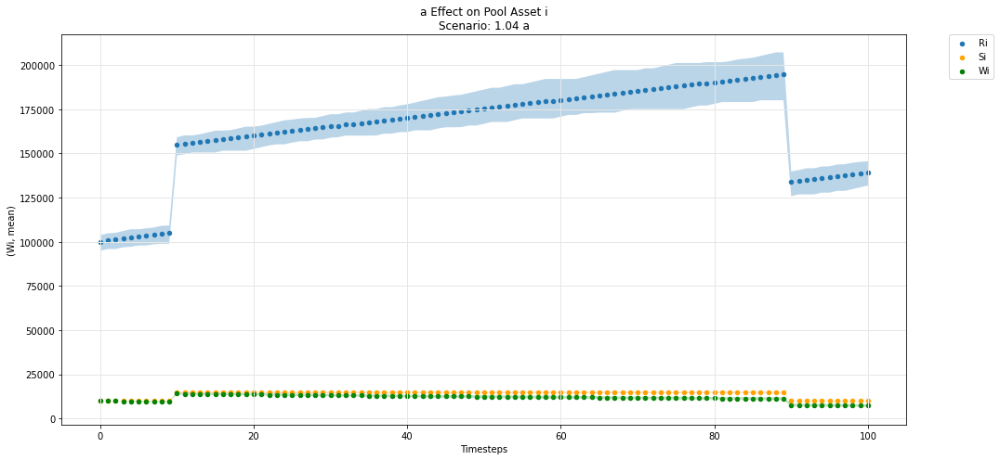

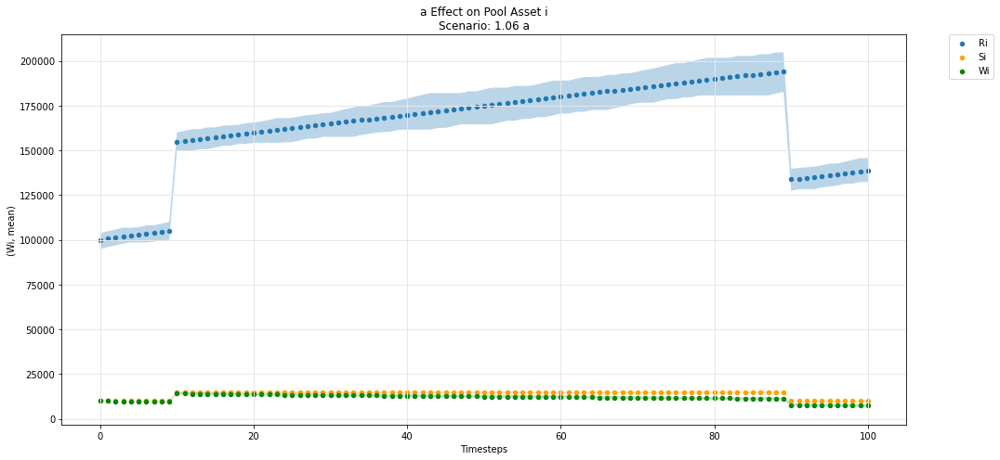

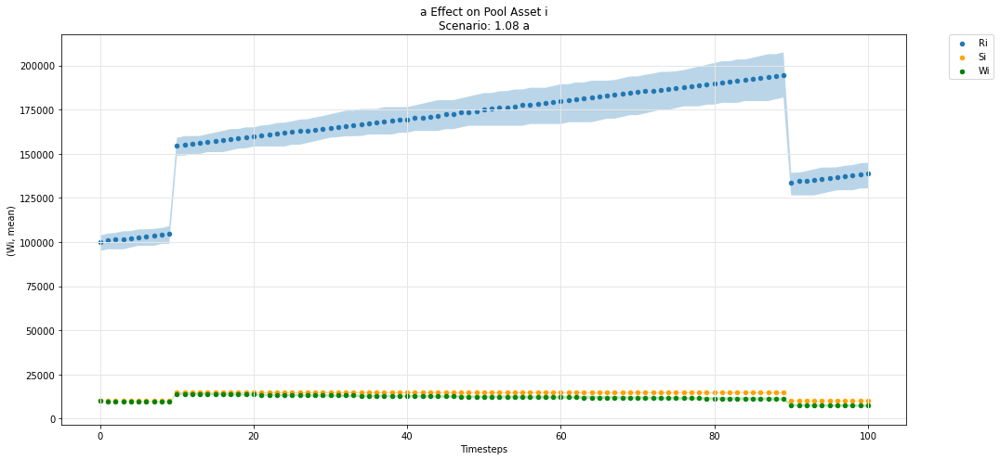

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

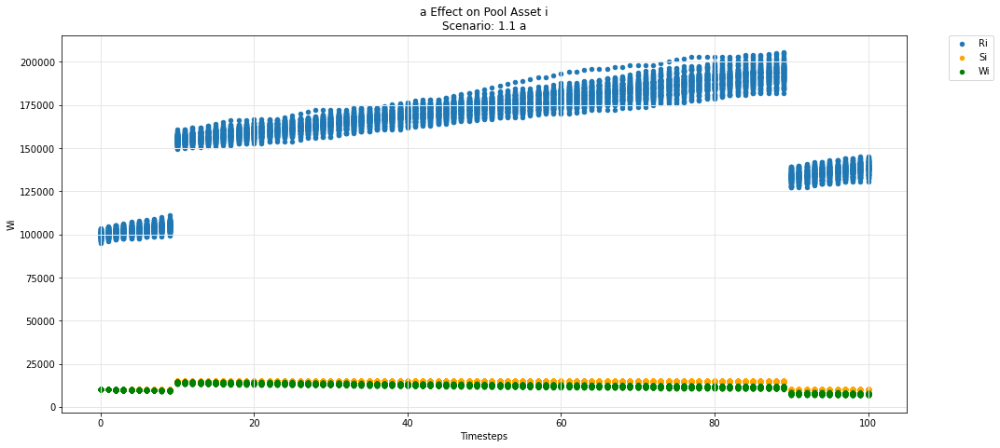

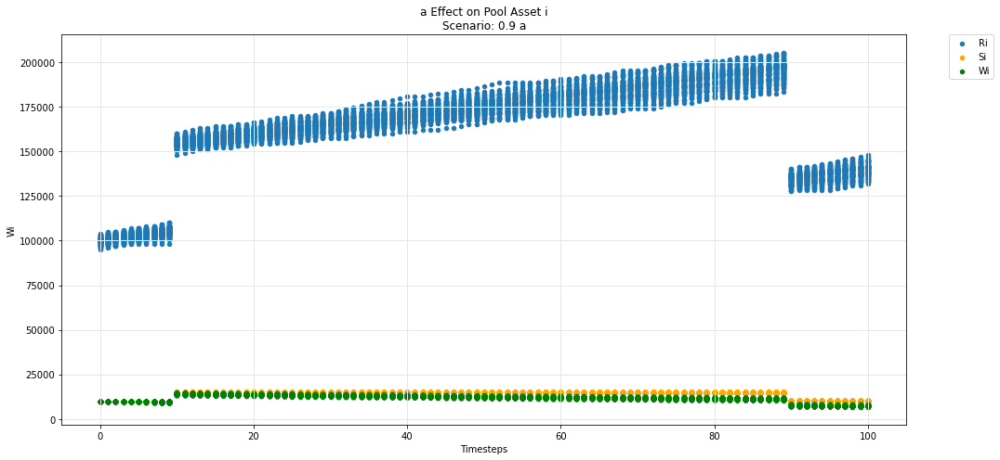

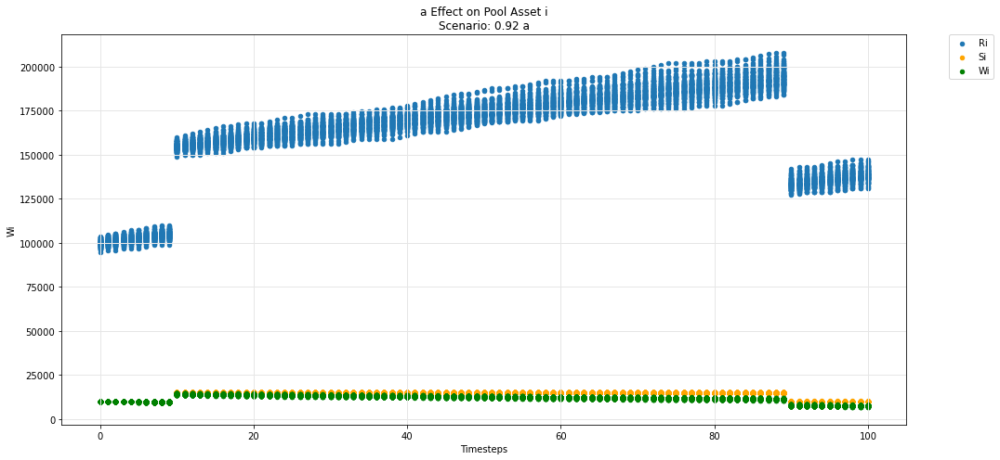

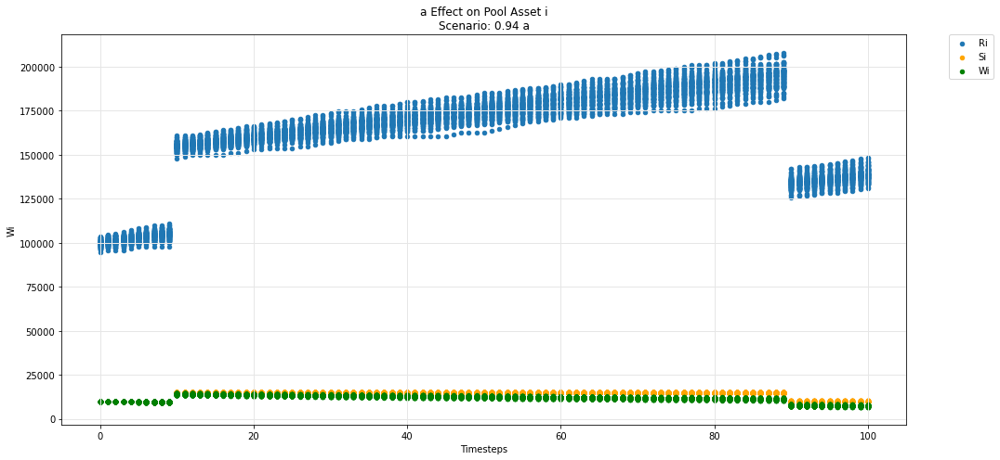

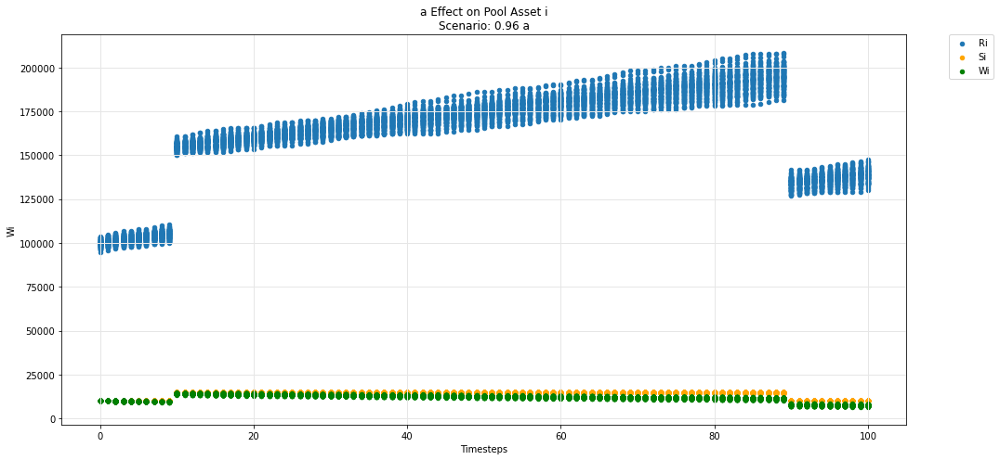

...

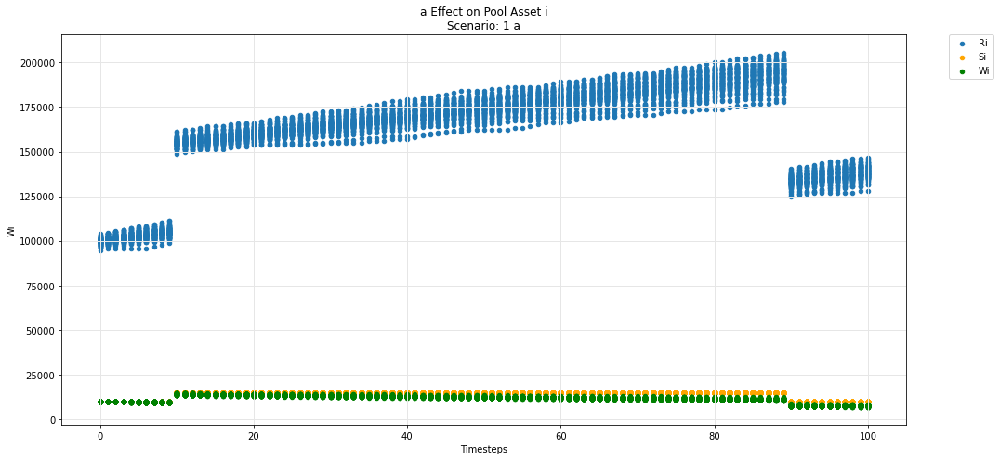

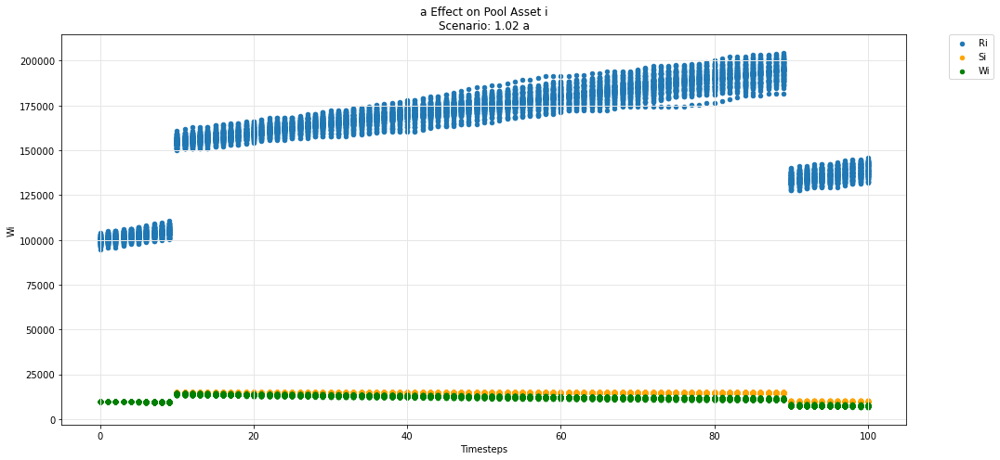

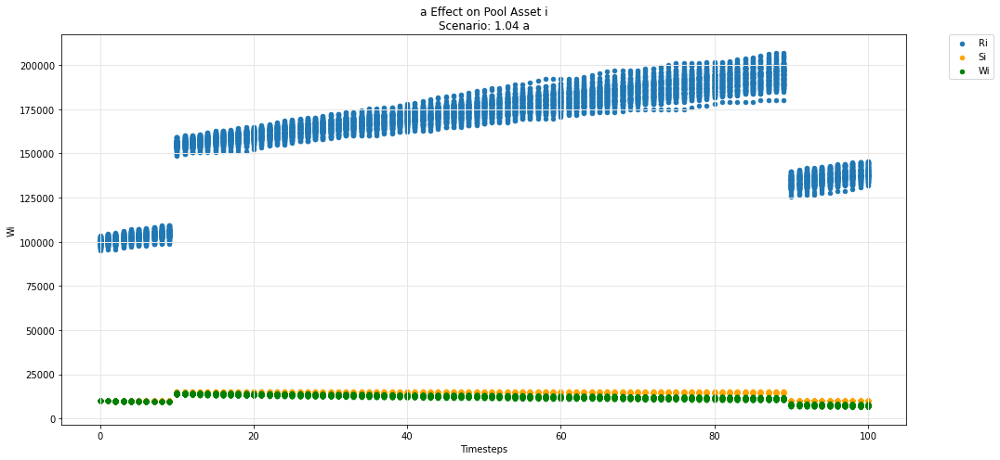

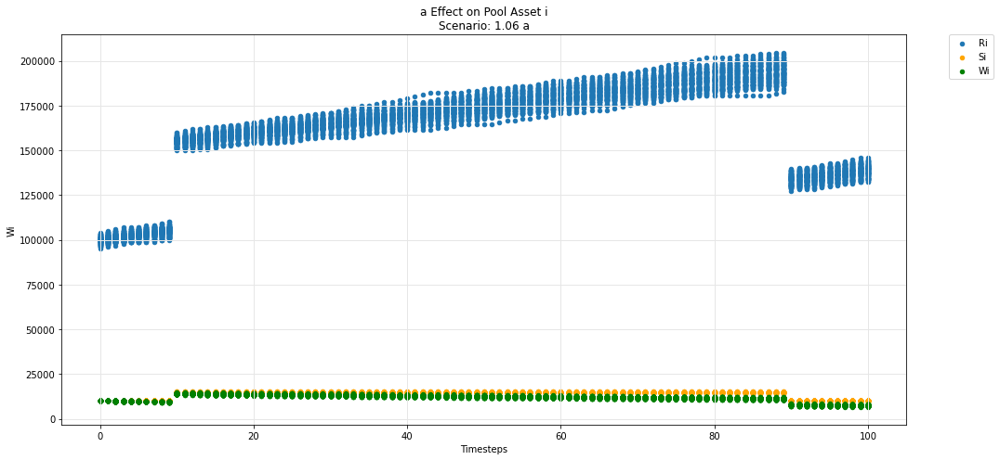

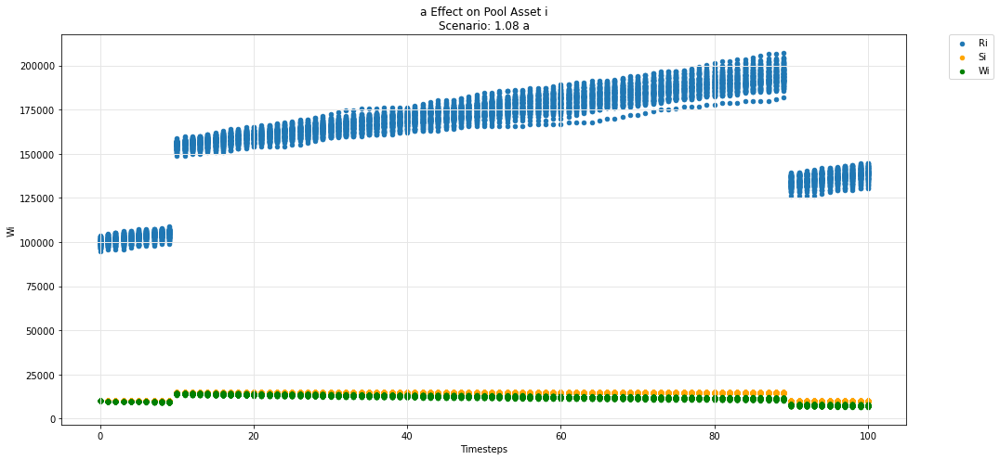

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

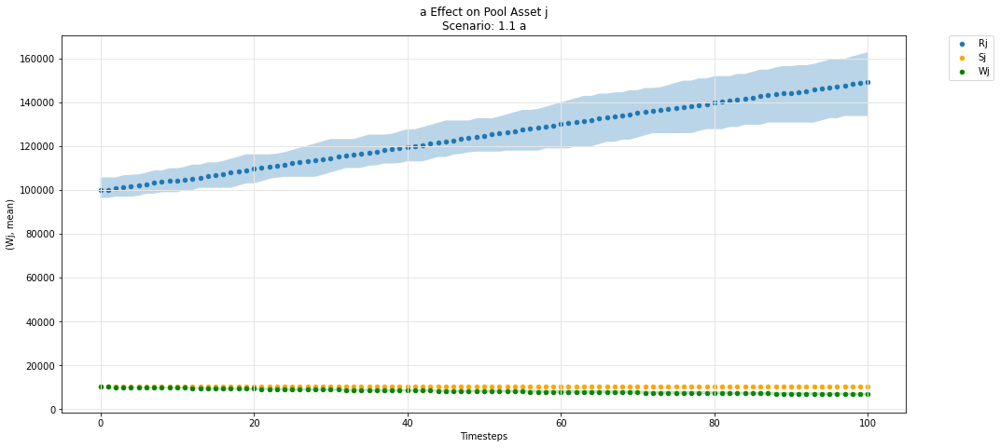

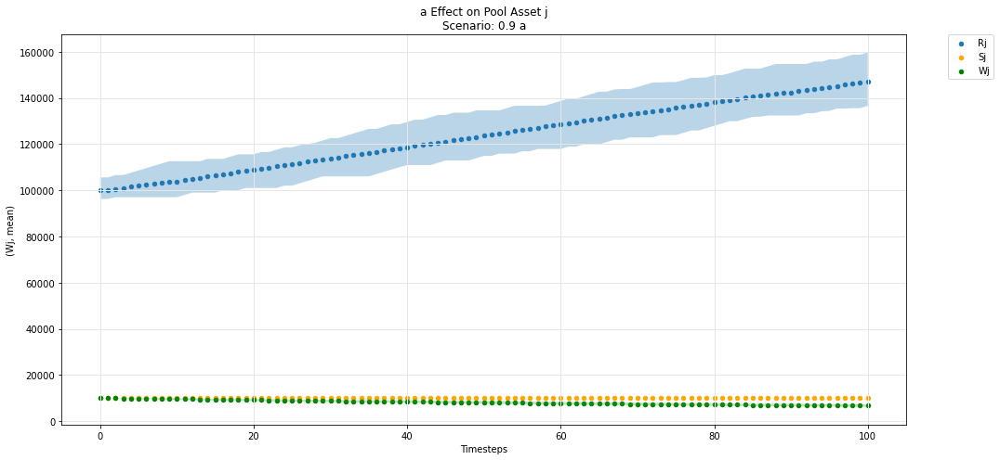

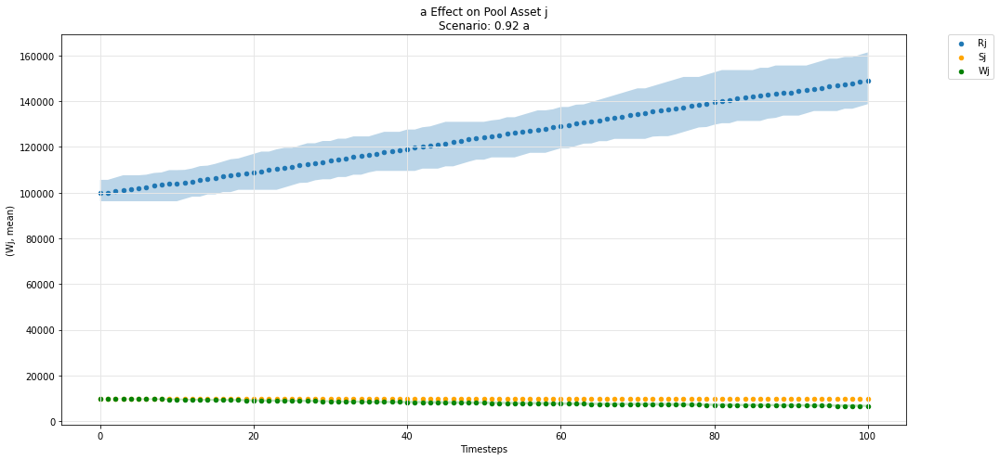

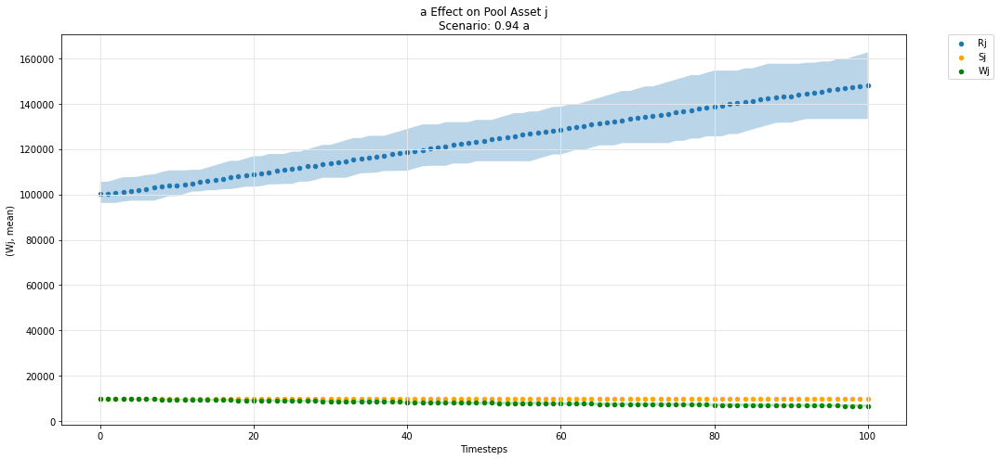

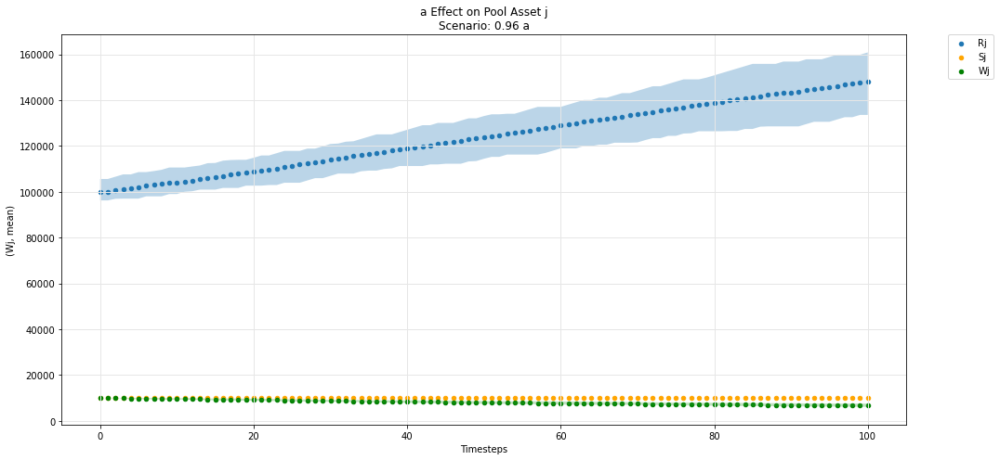

...

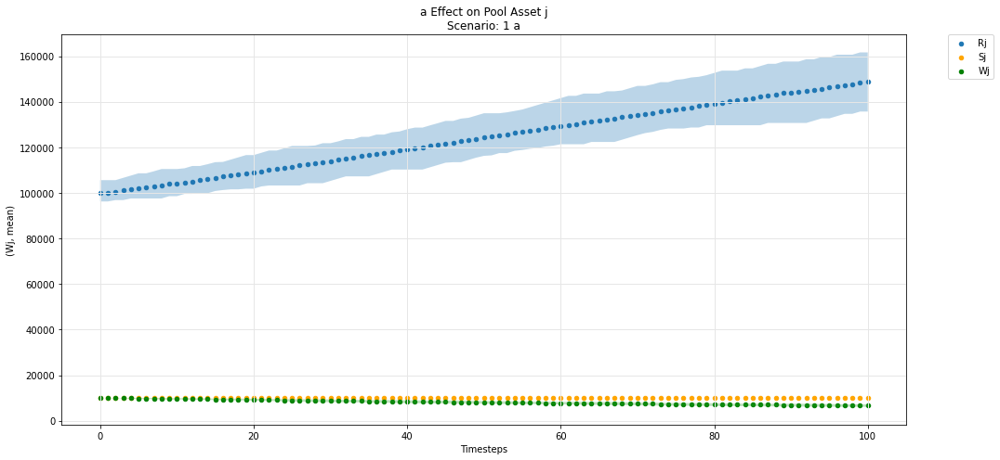

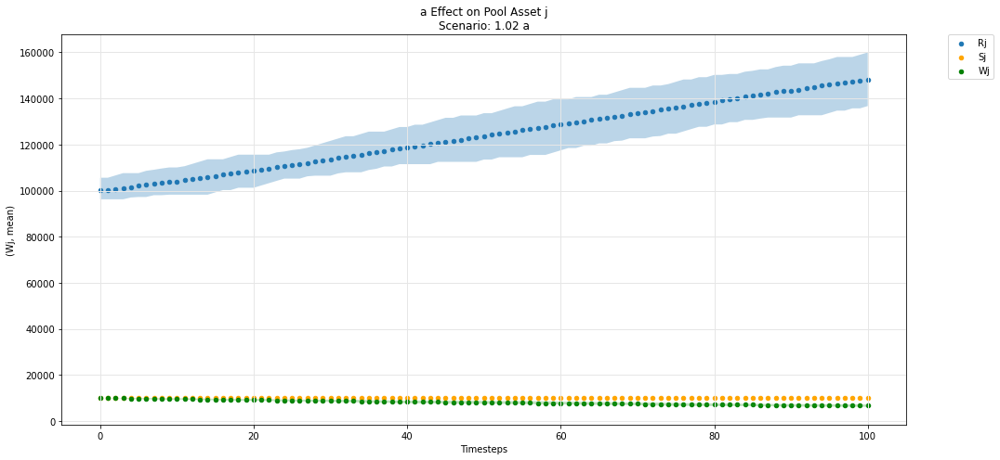

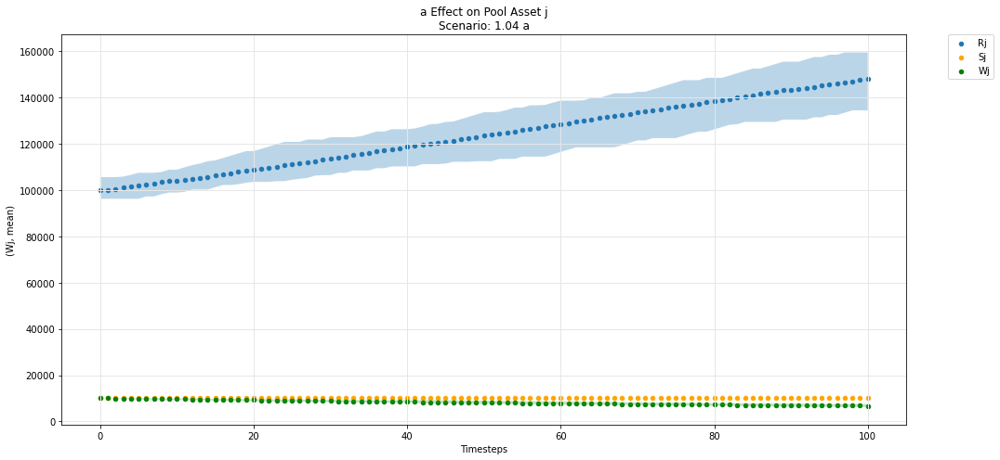

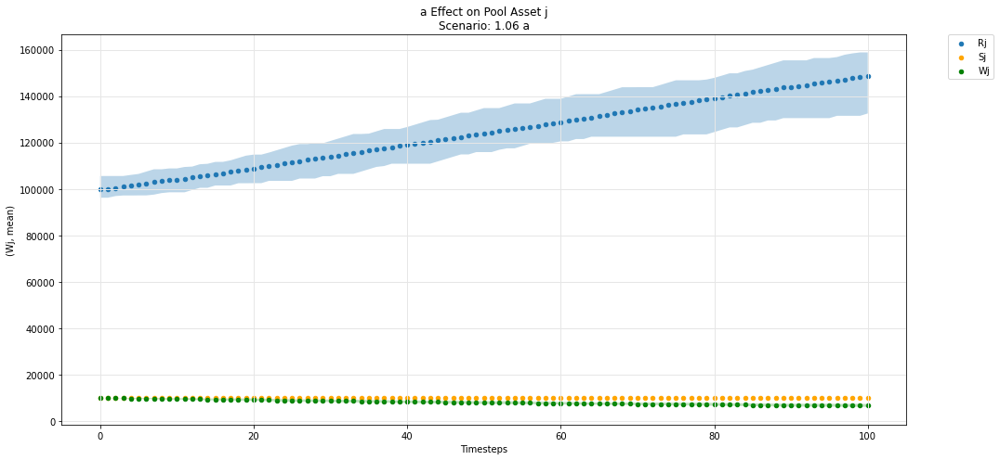

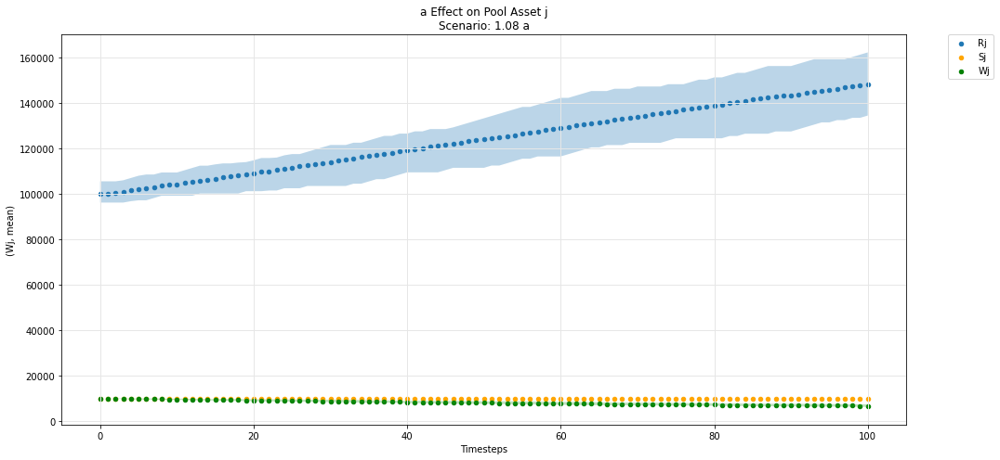

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

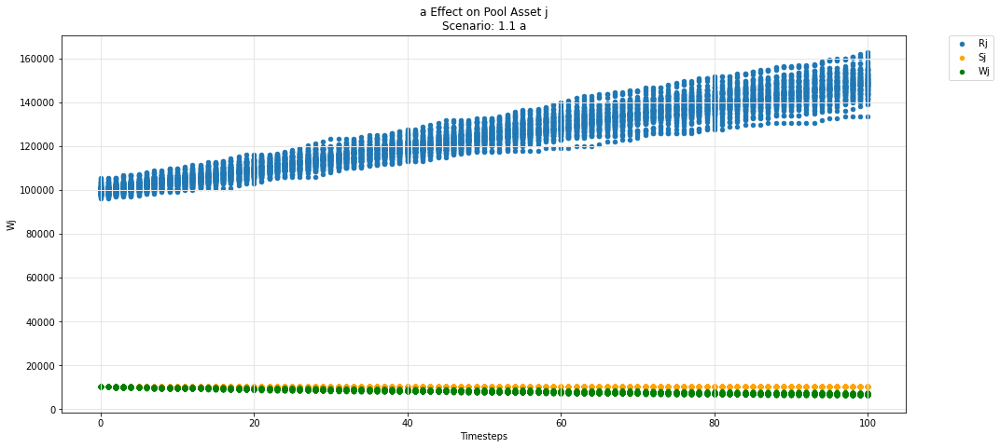

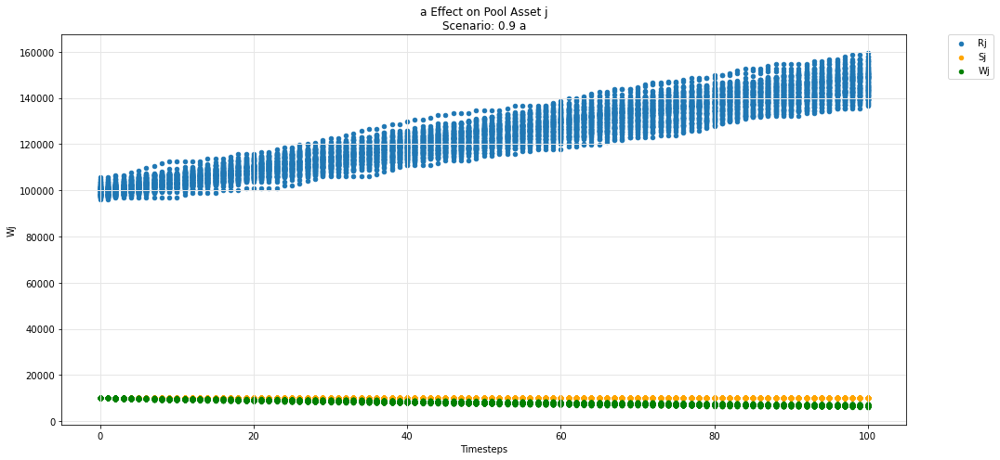

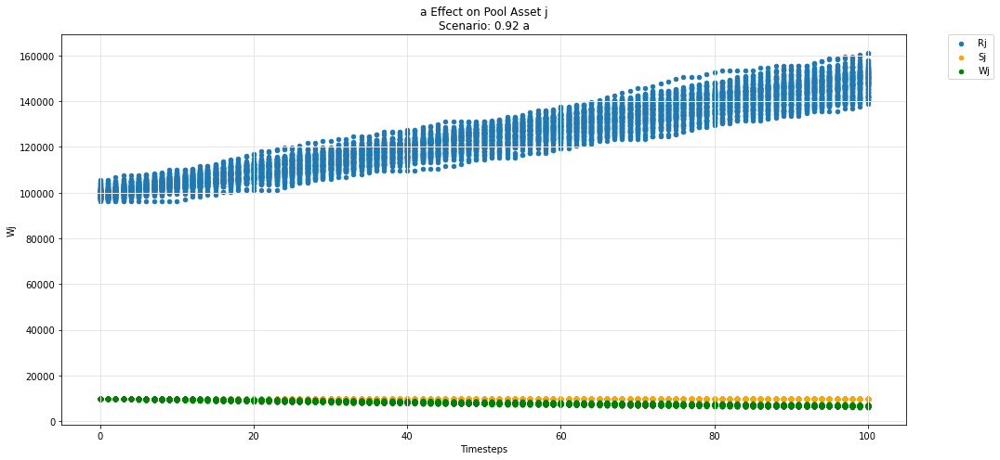

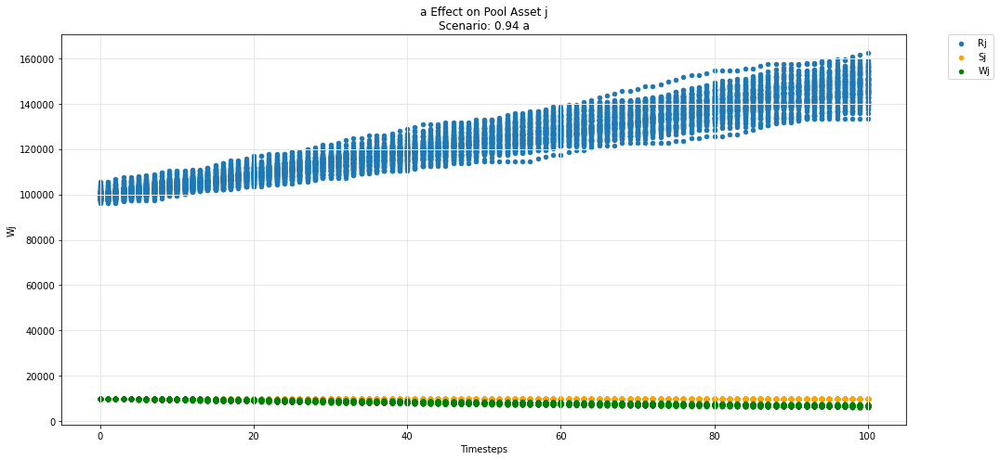

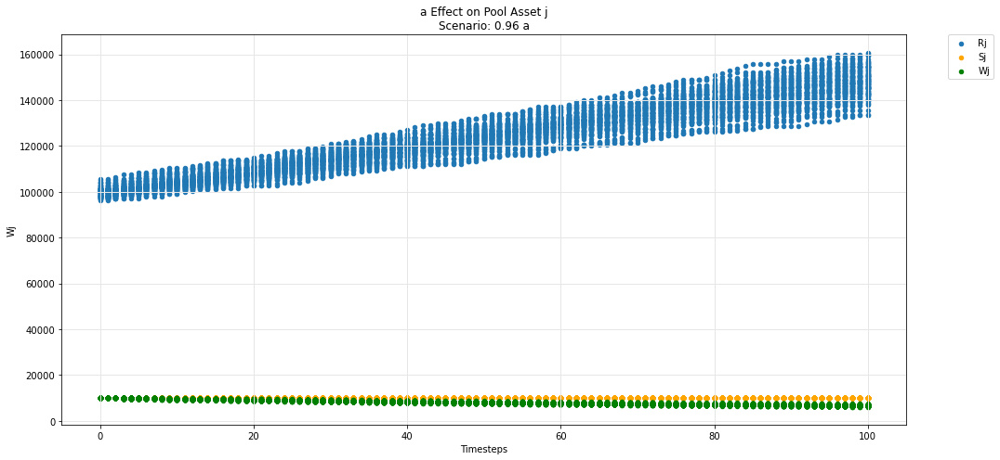

...

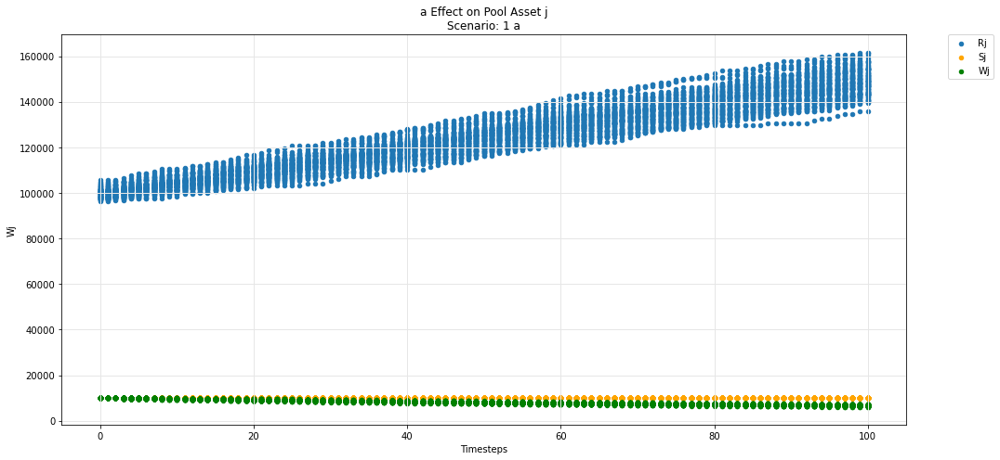

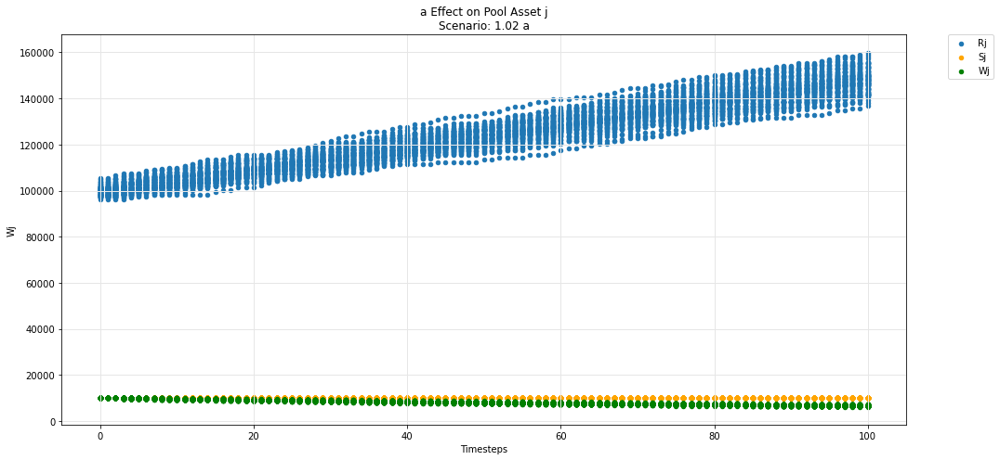

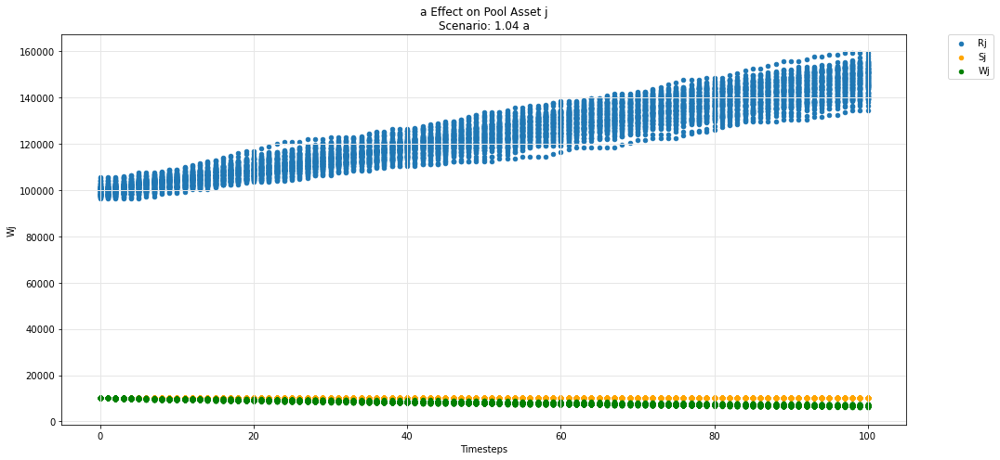

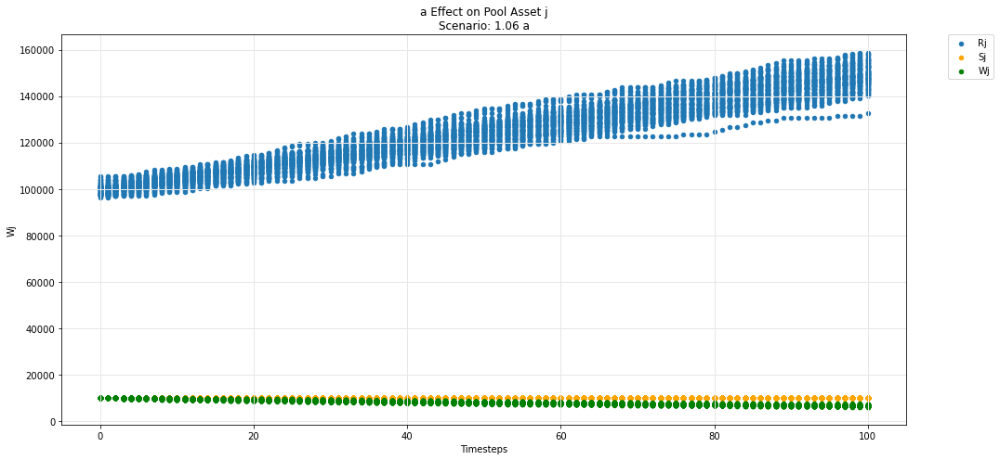

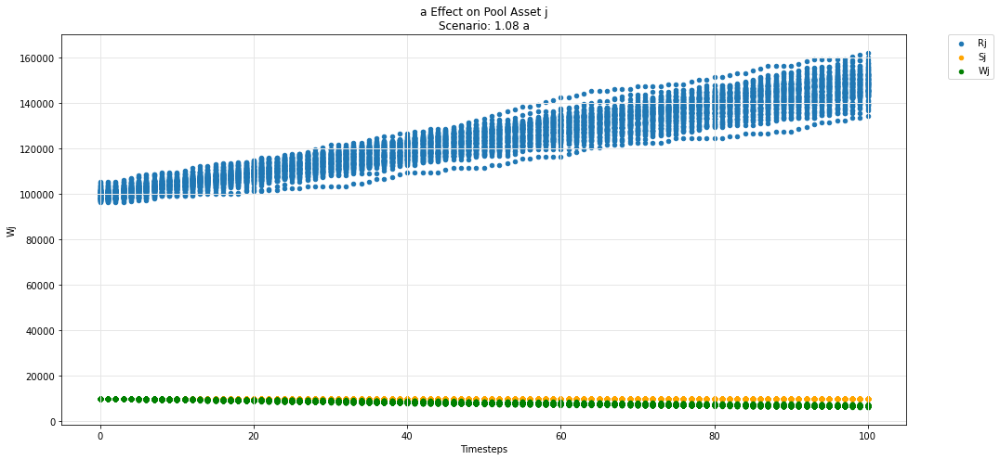

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

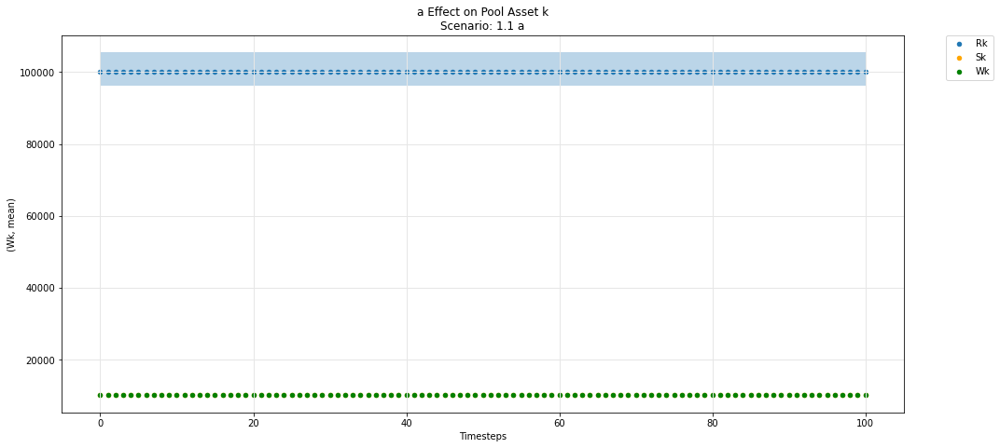

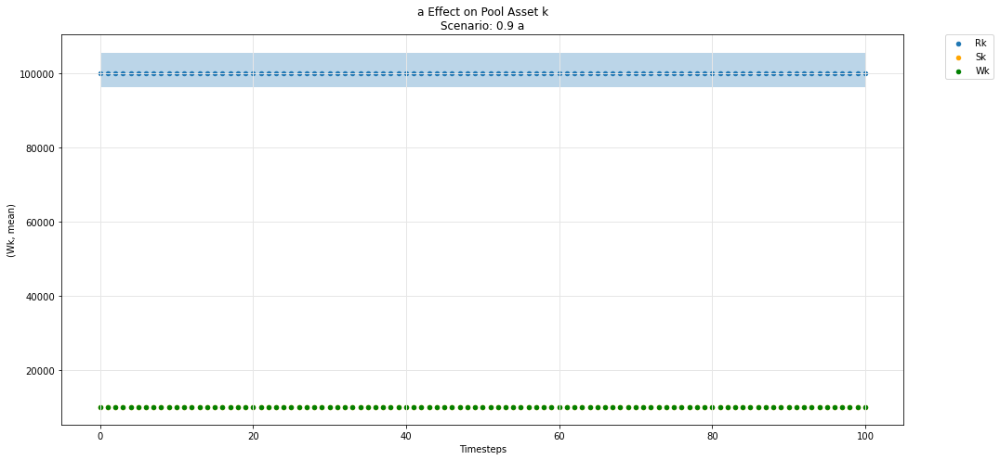

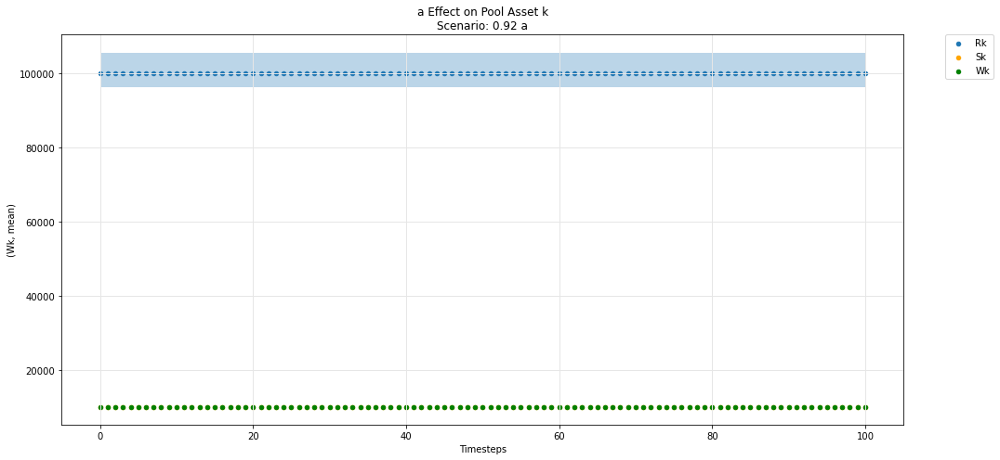

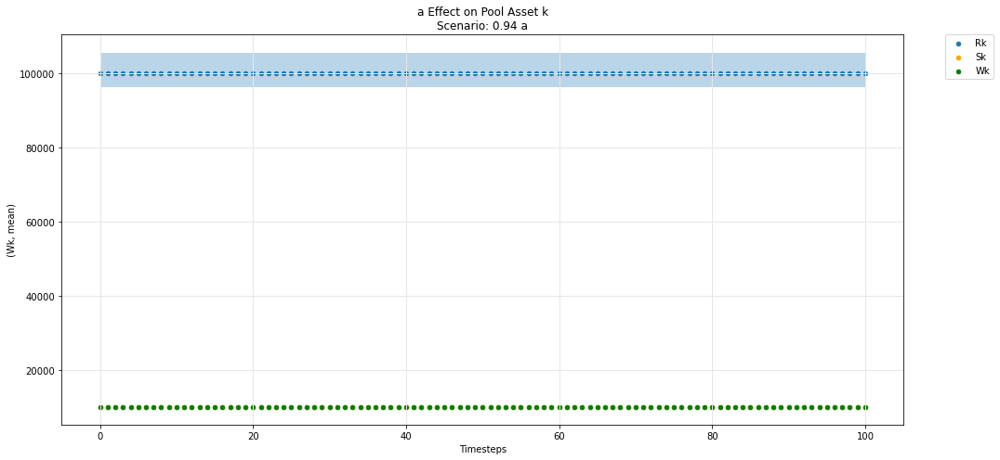

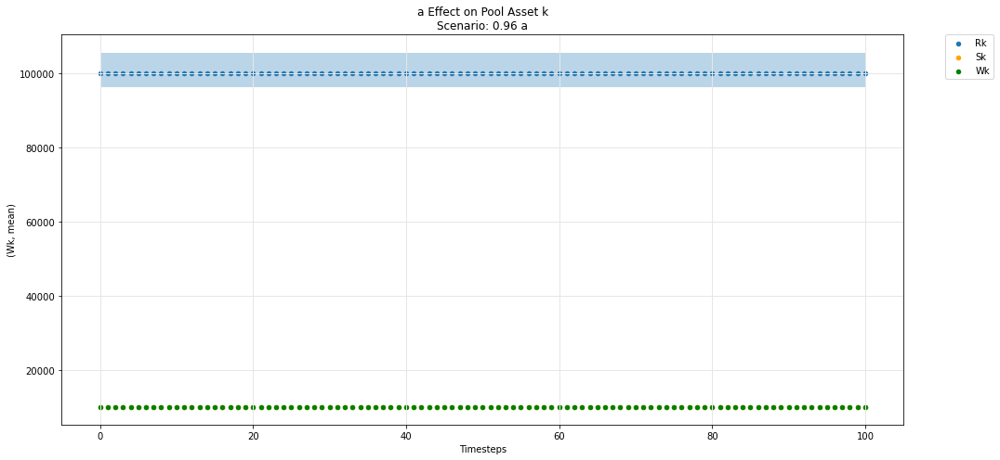

...

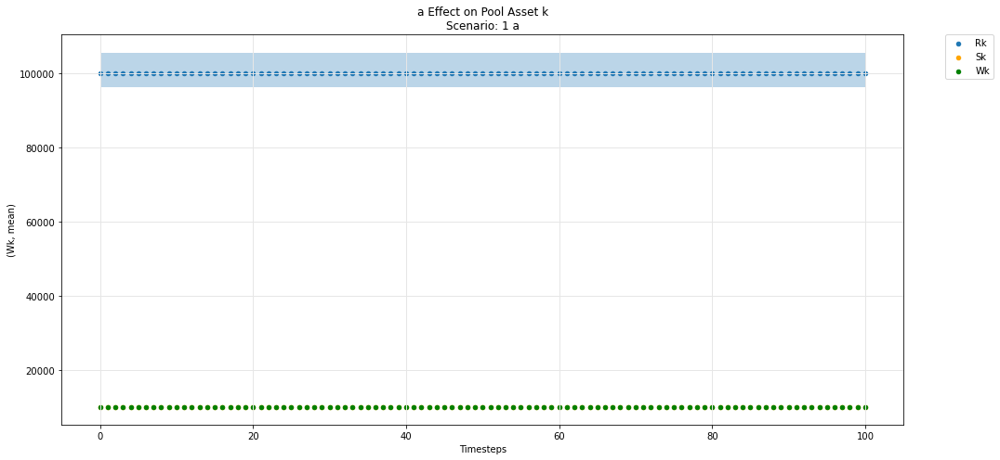

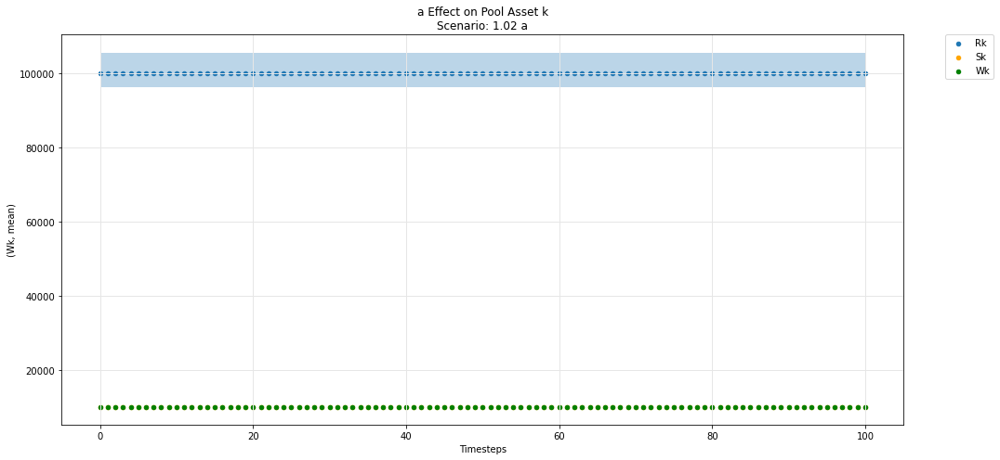

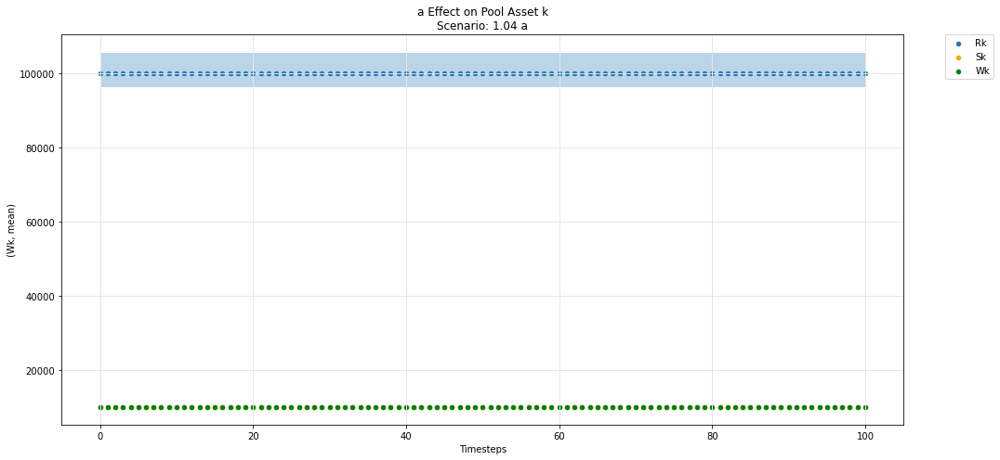

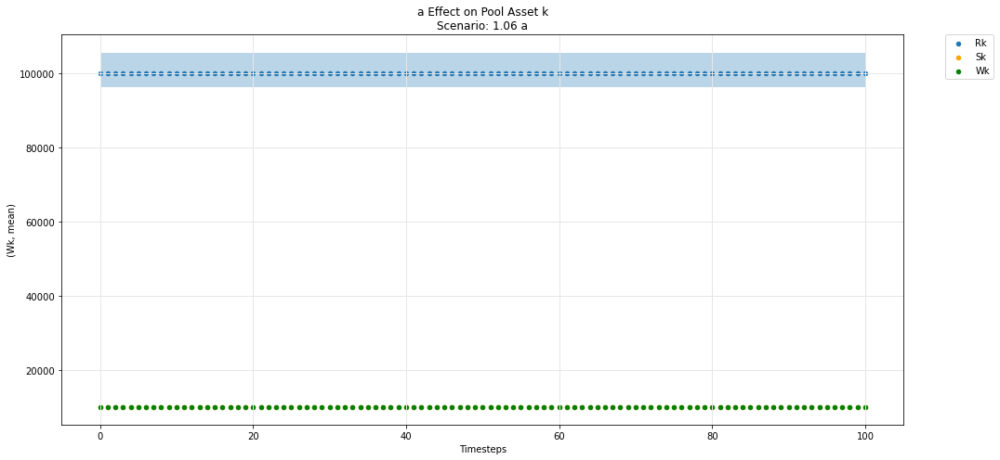

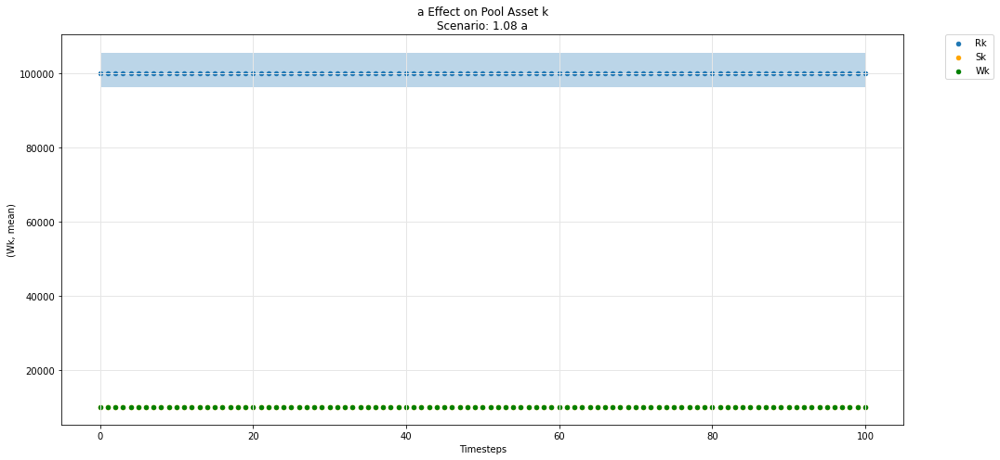

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

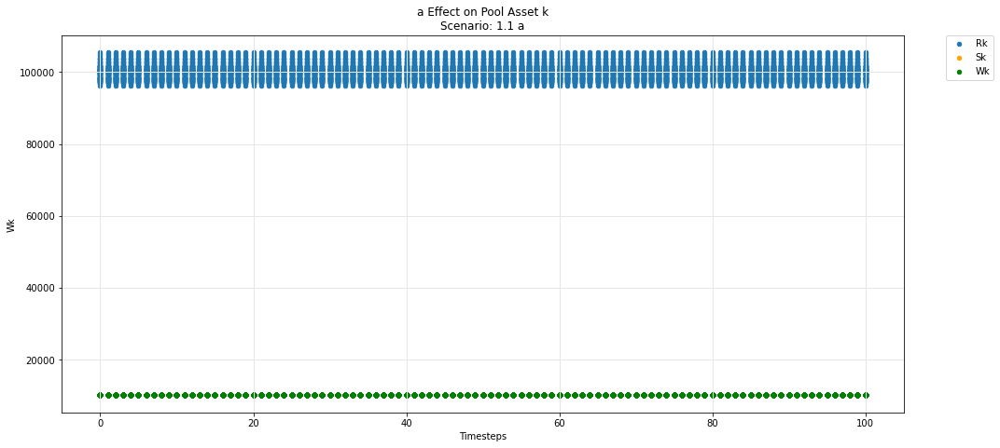

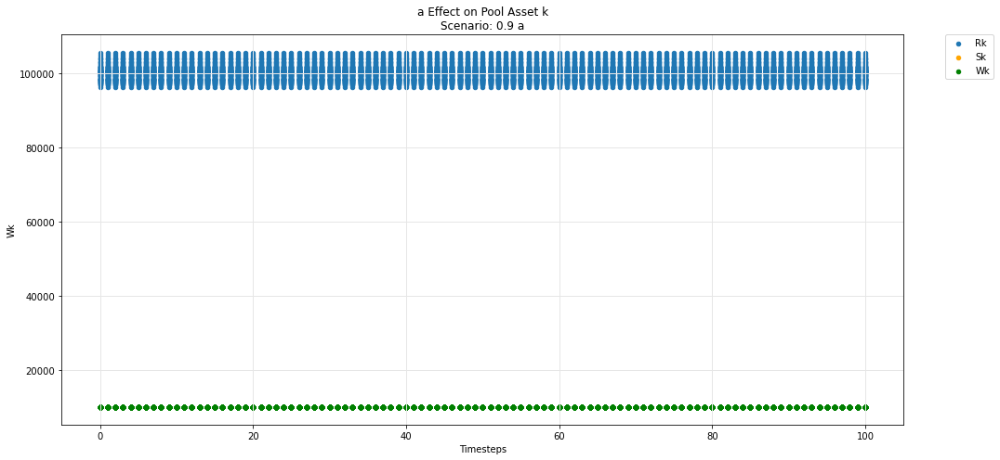

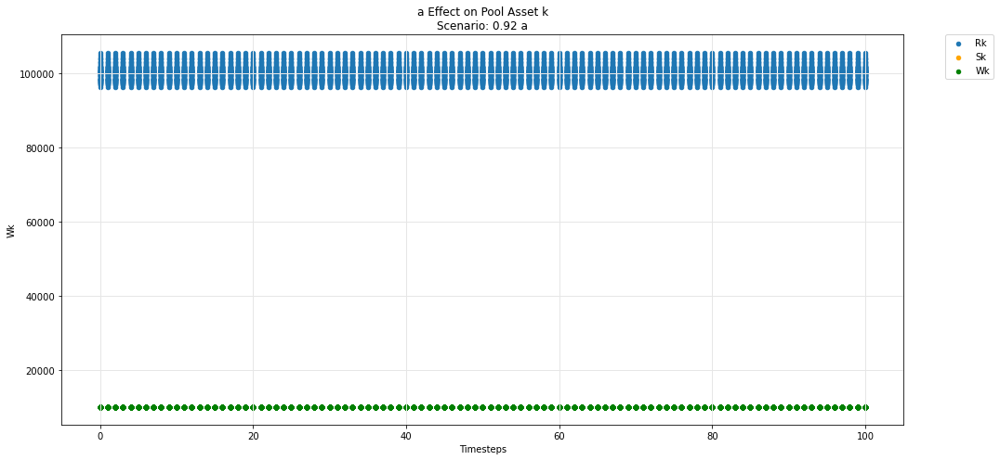

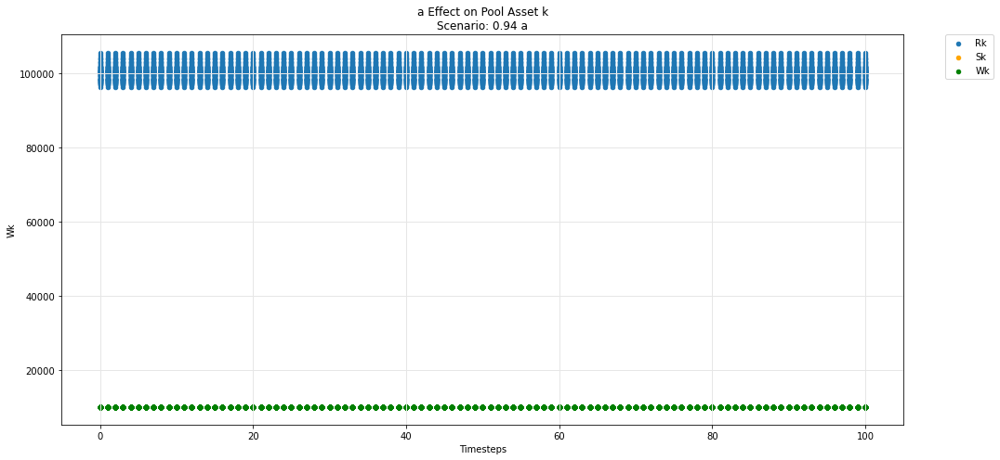

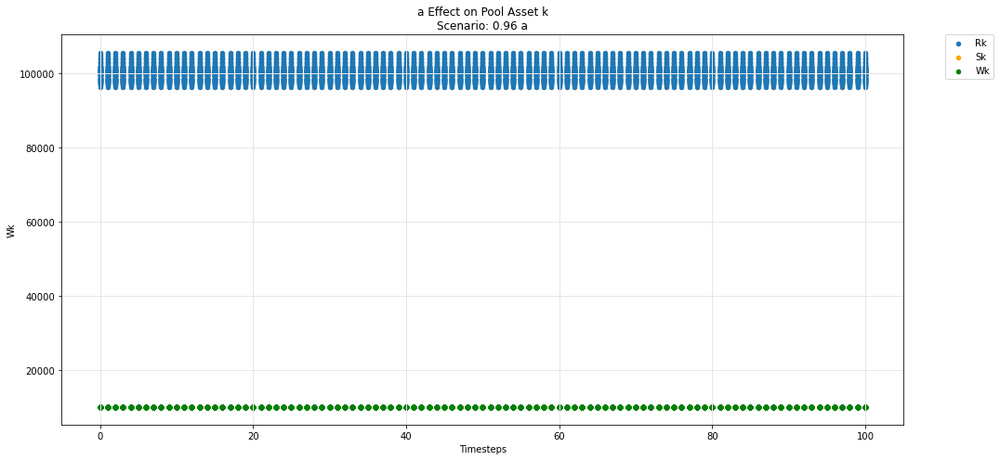

...

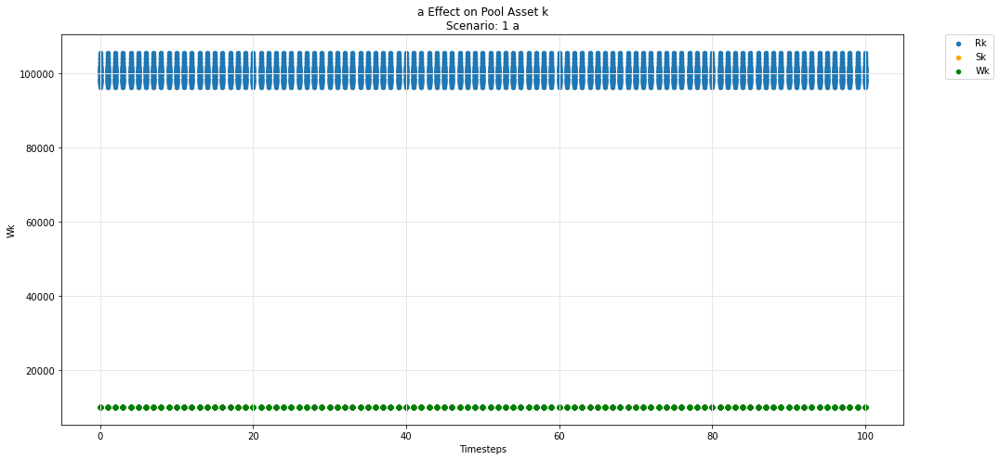

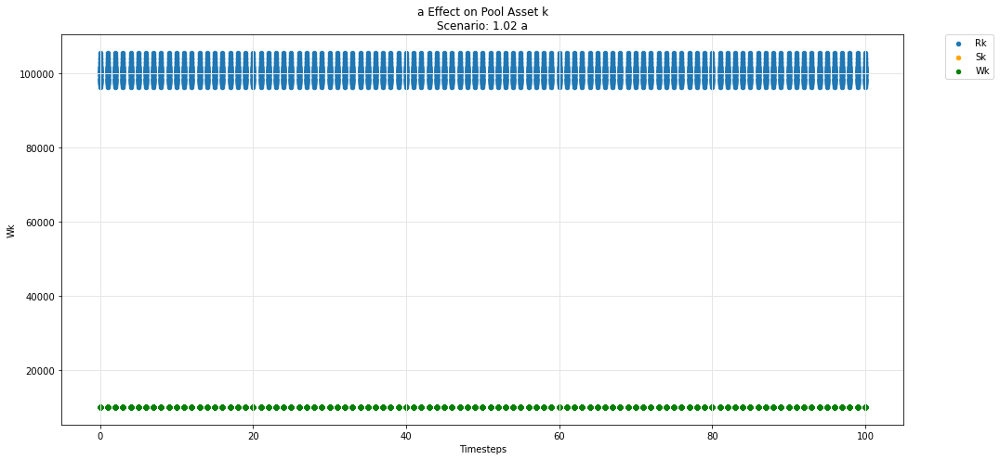

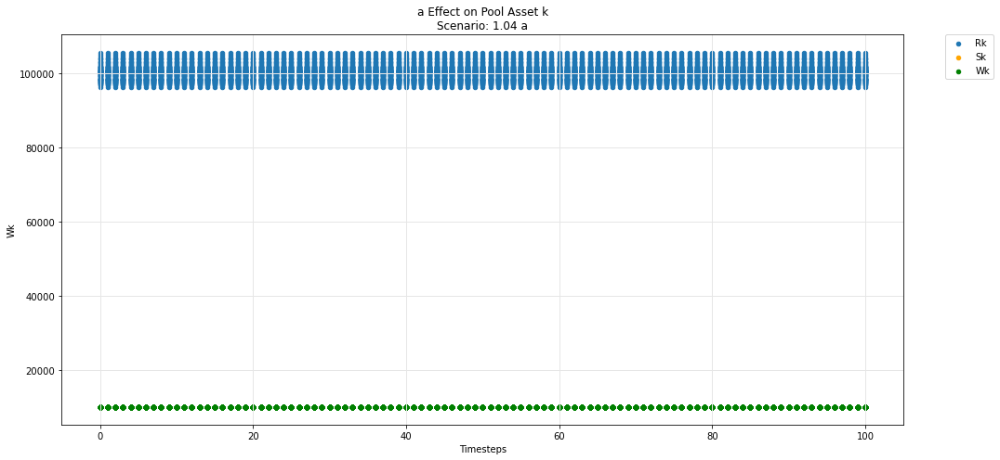

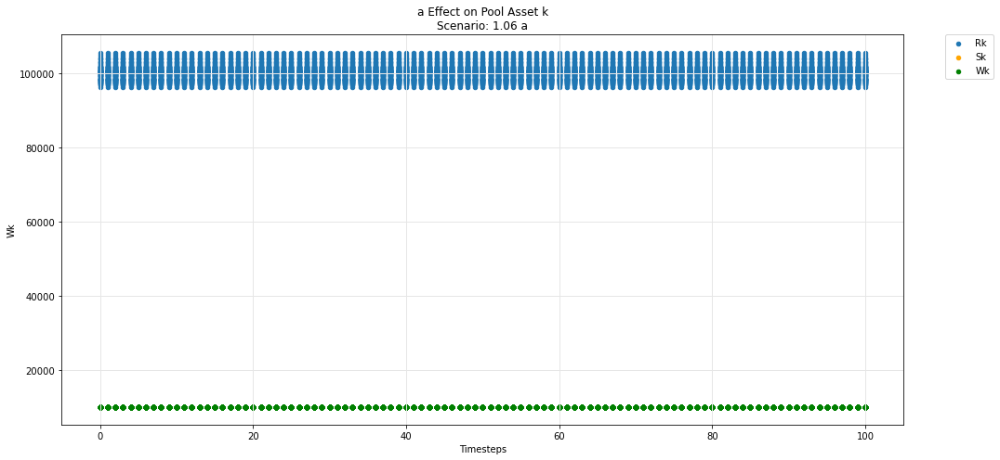

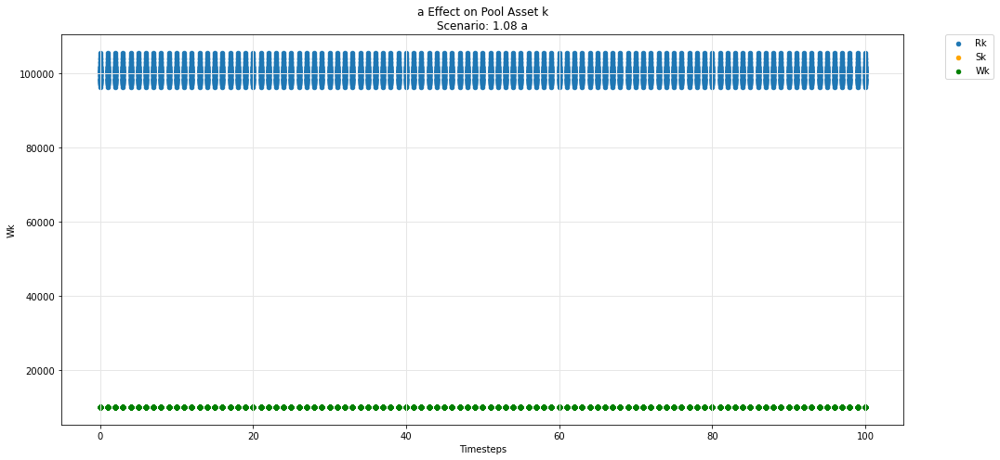

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

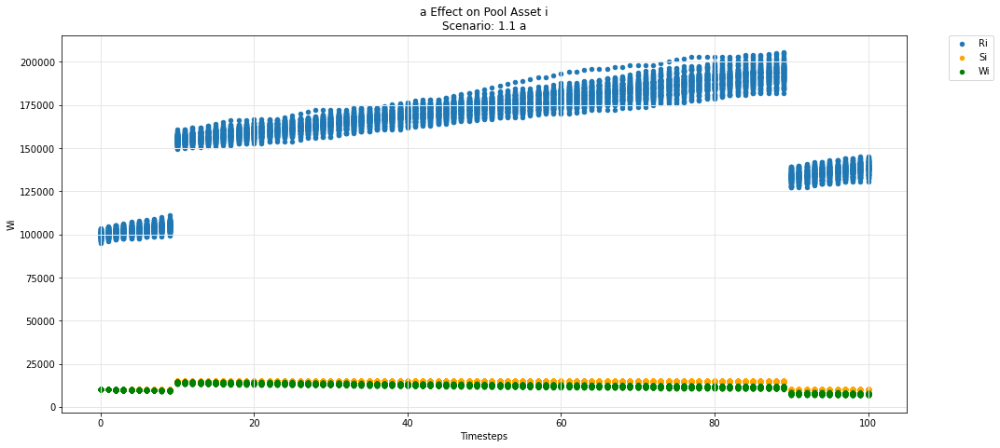

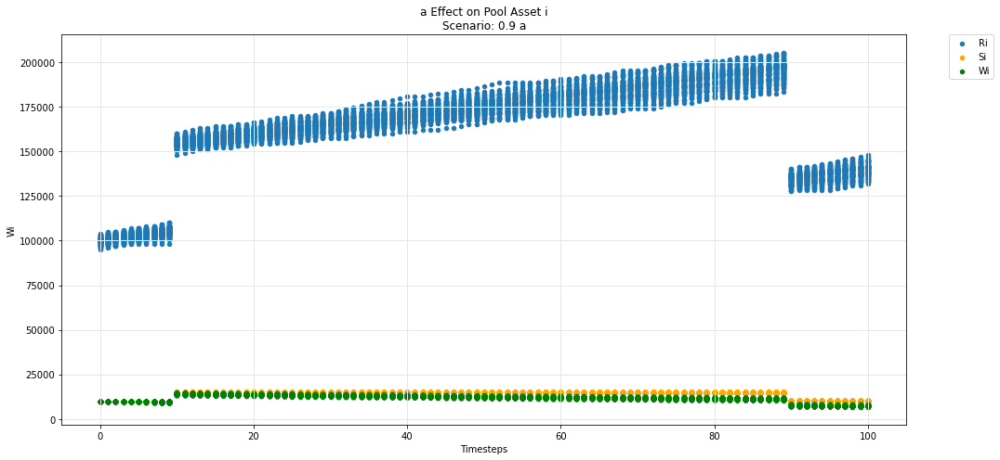

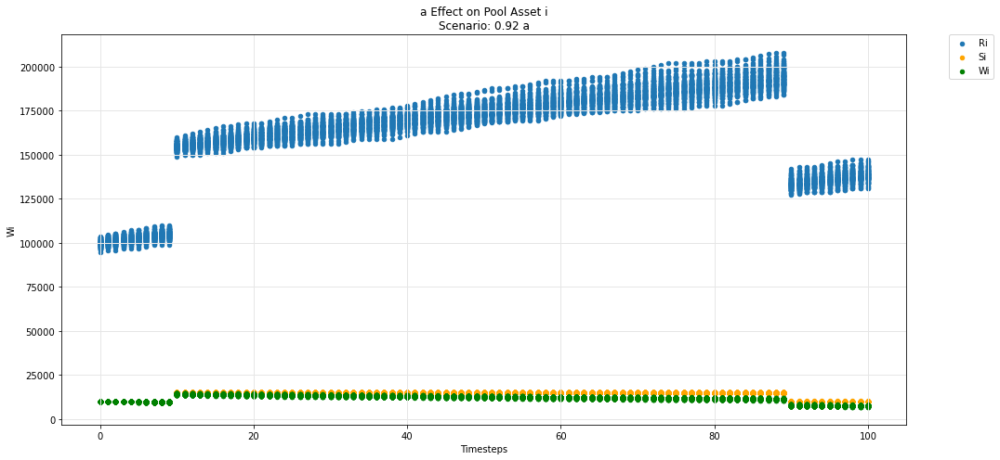

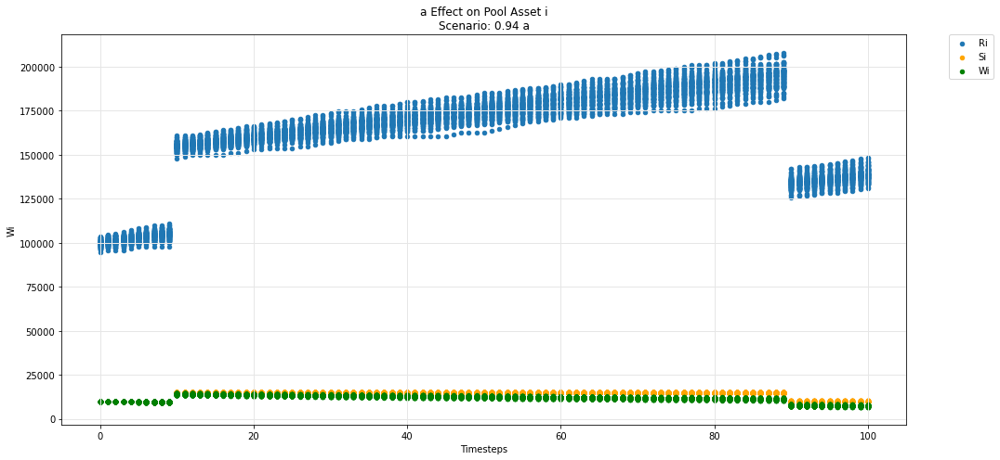

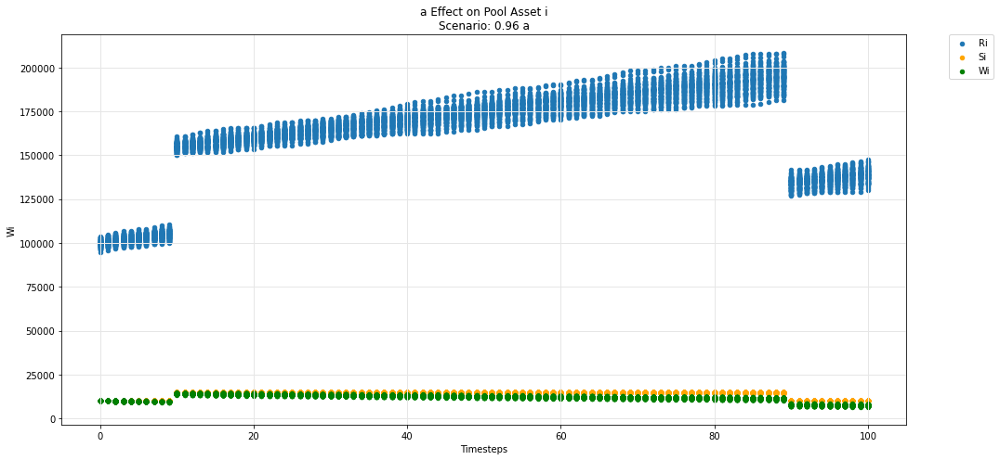

...

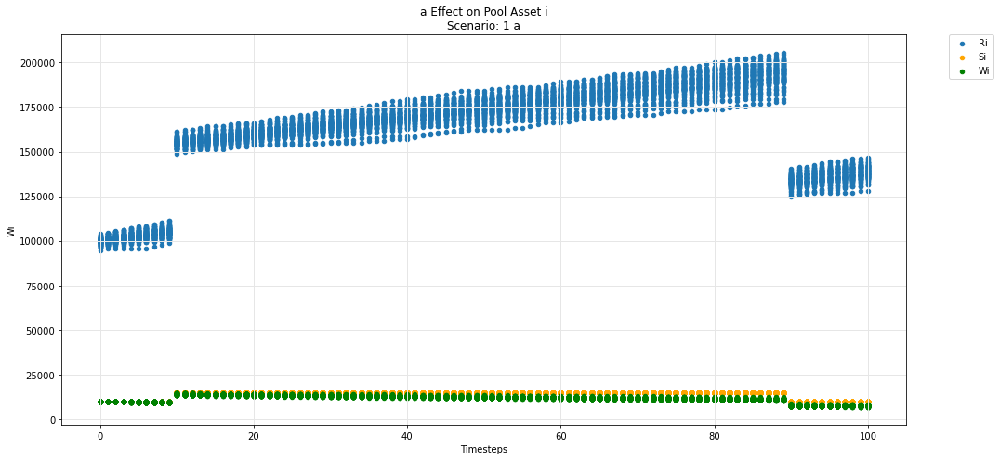

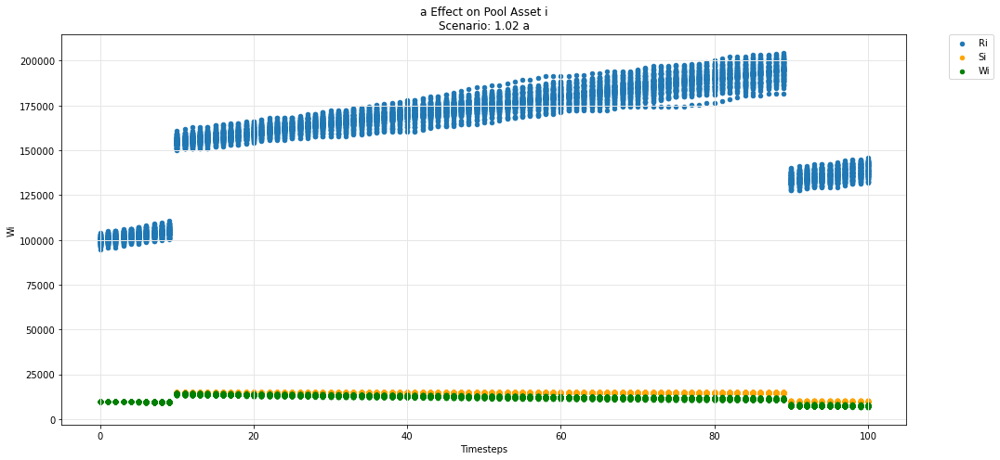

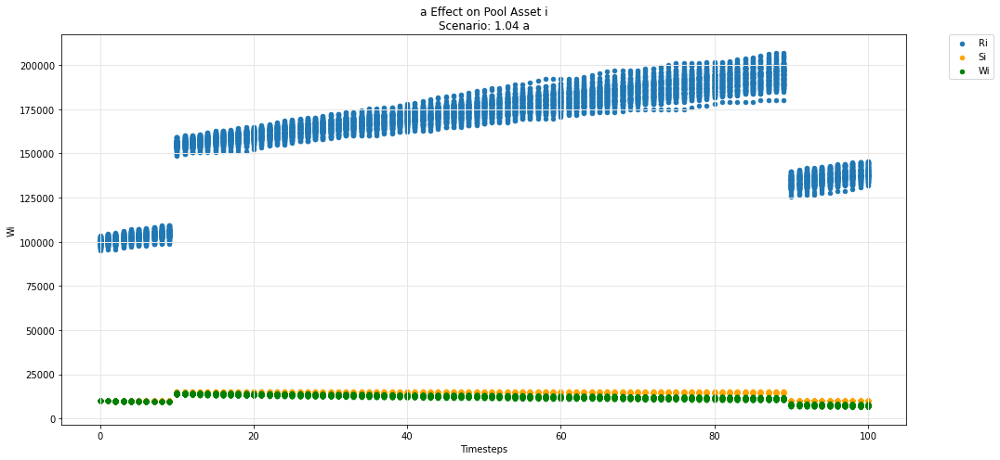

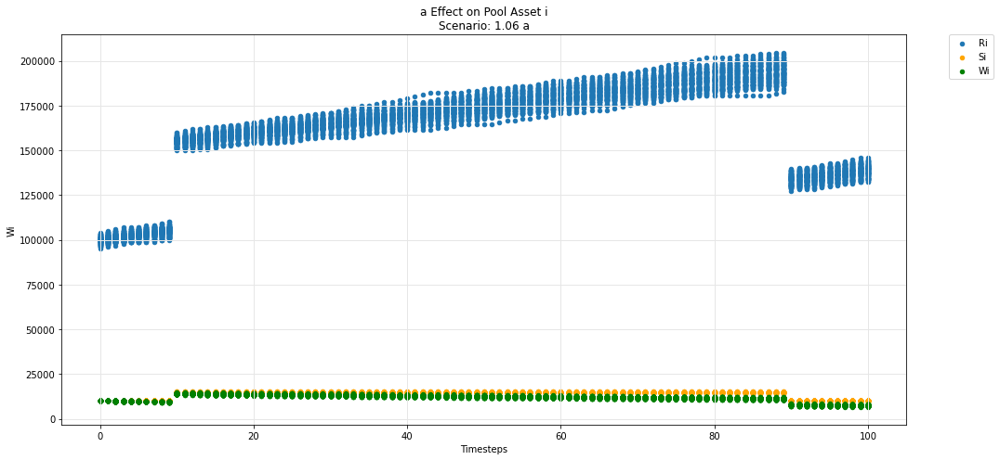

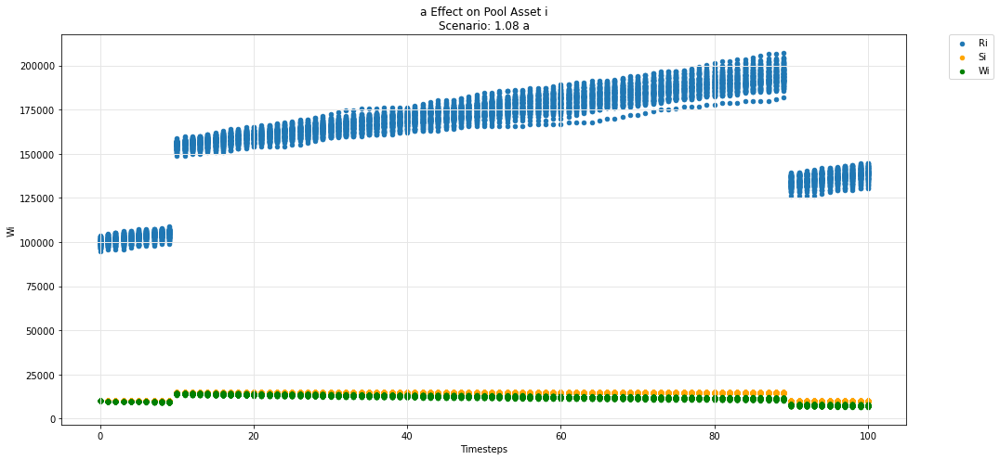

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

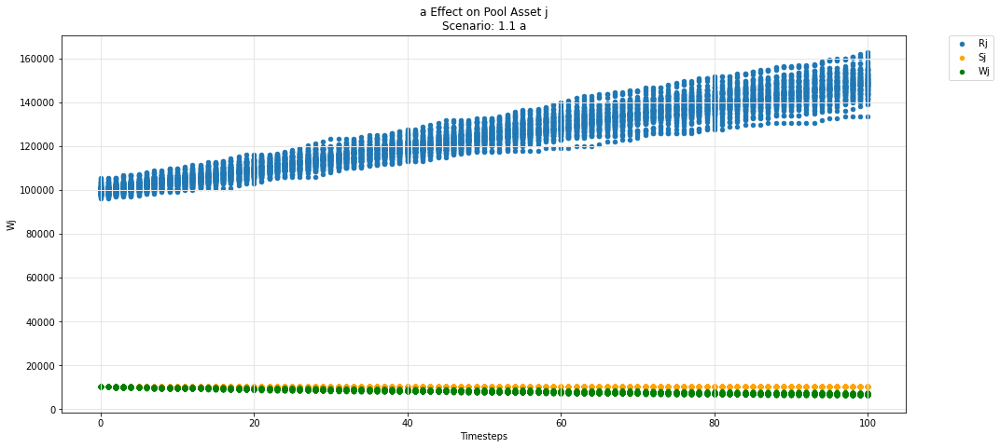

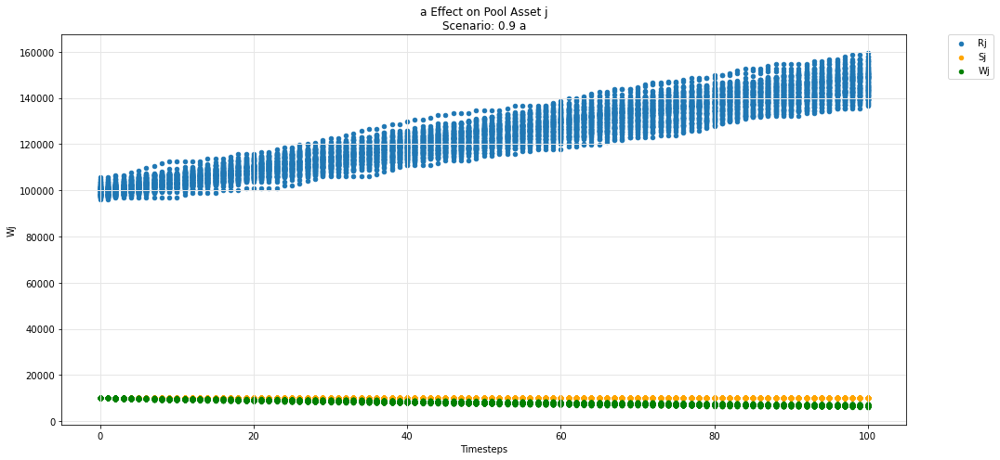

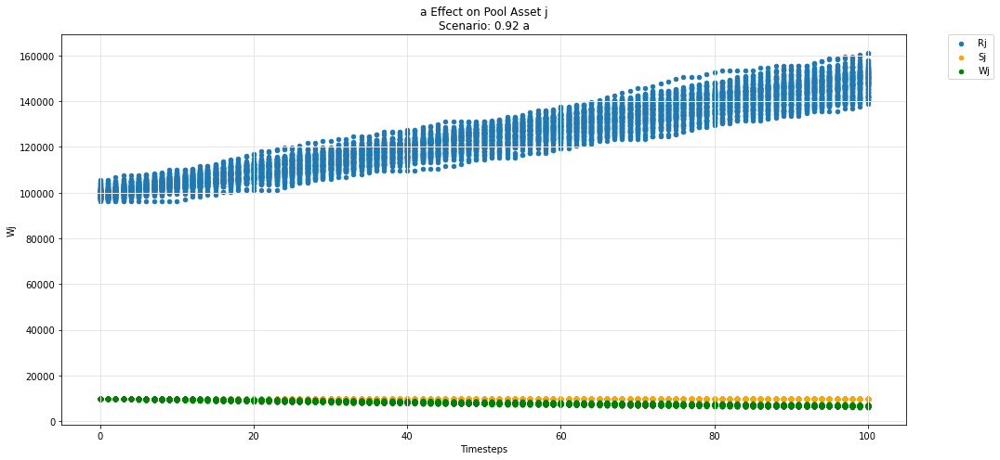

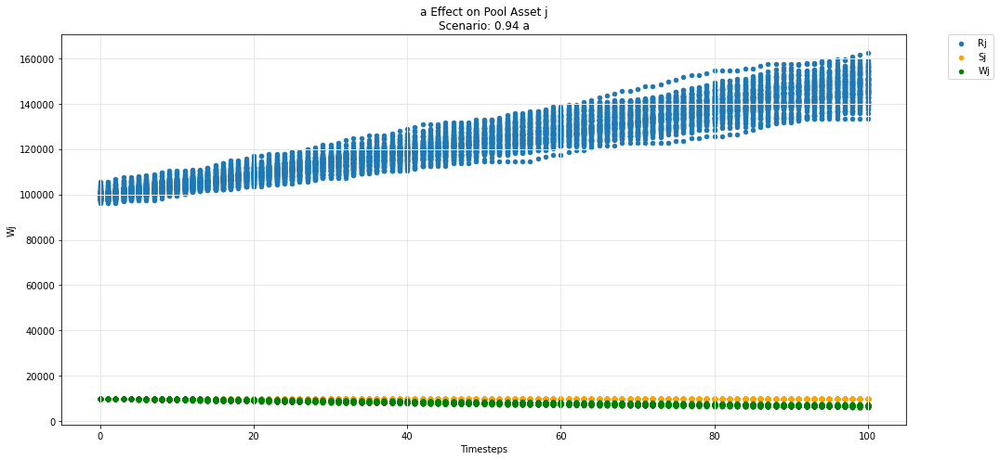

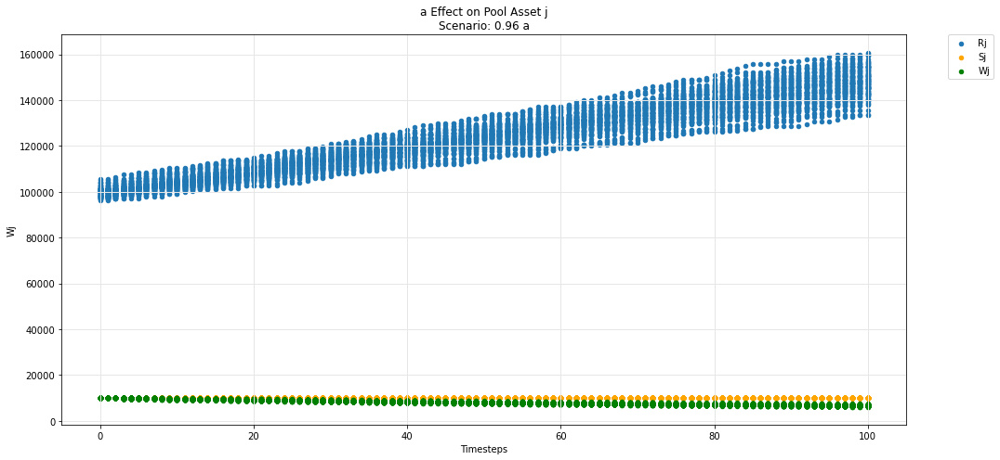

...

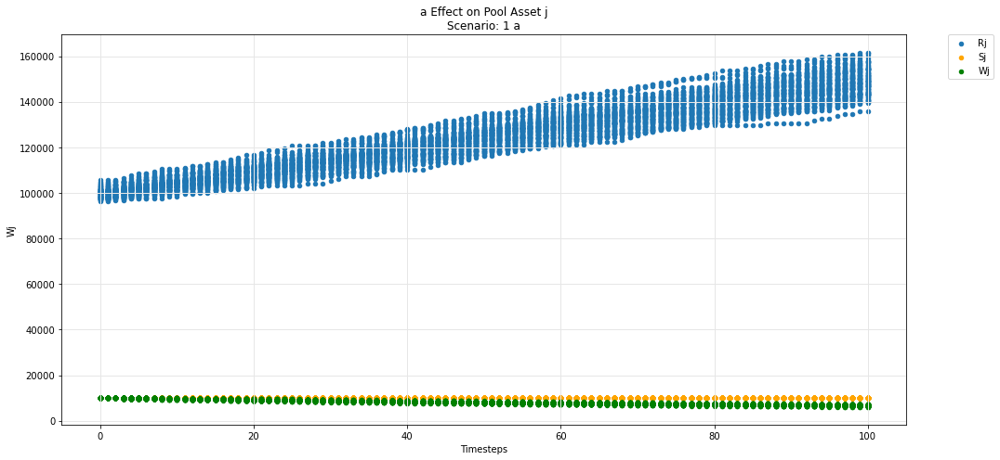

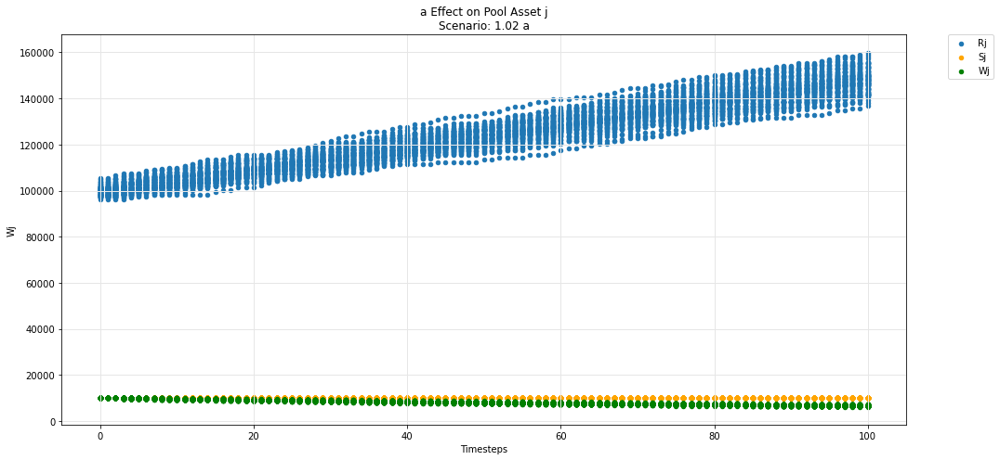

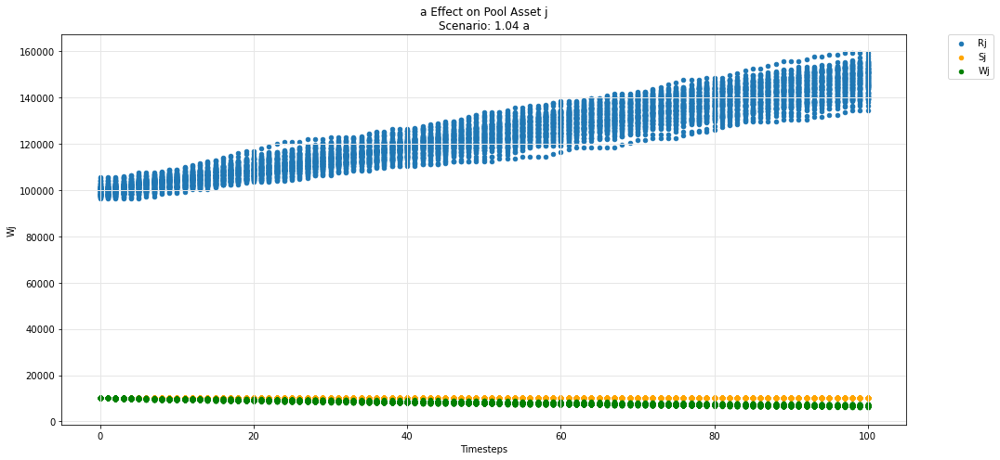

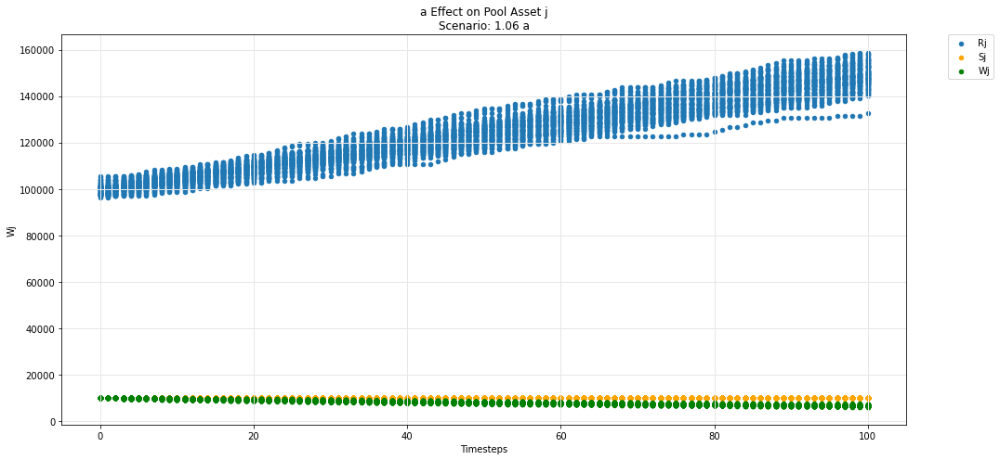

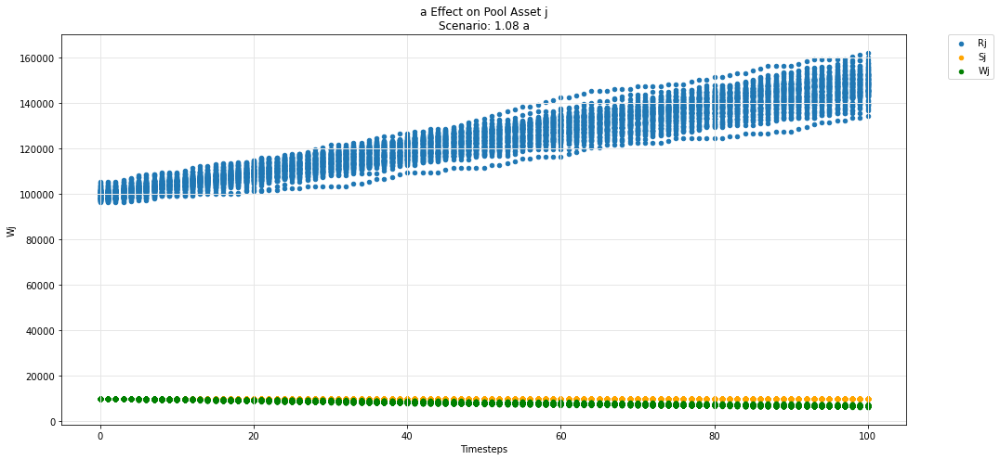

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

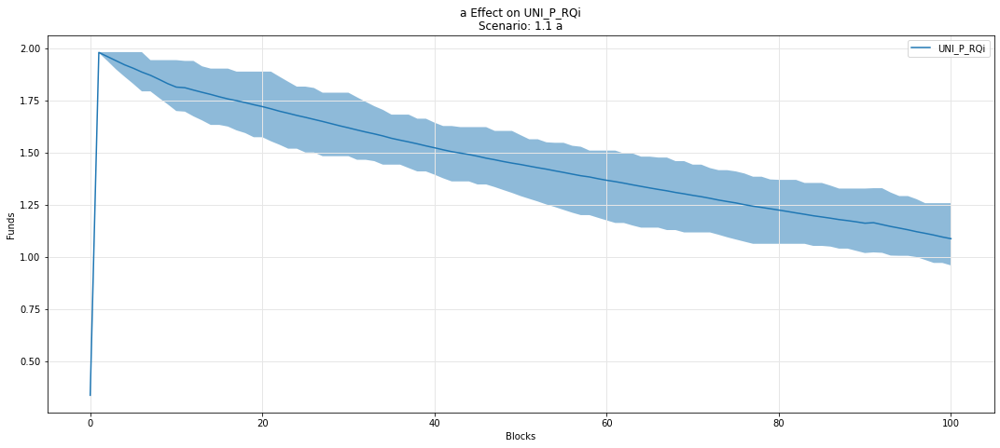

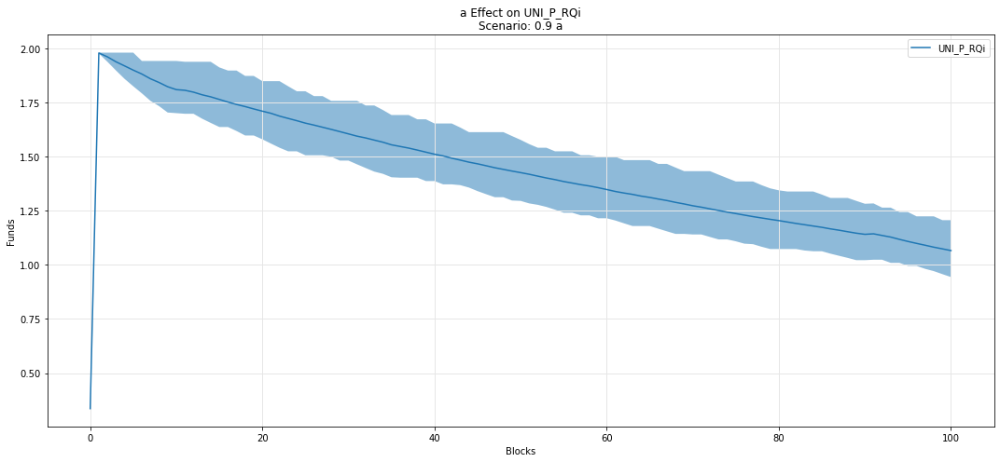

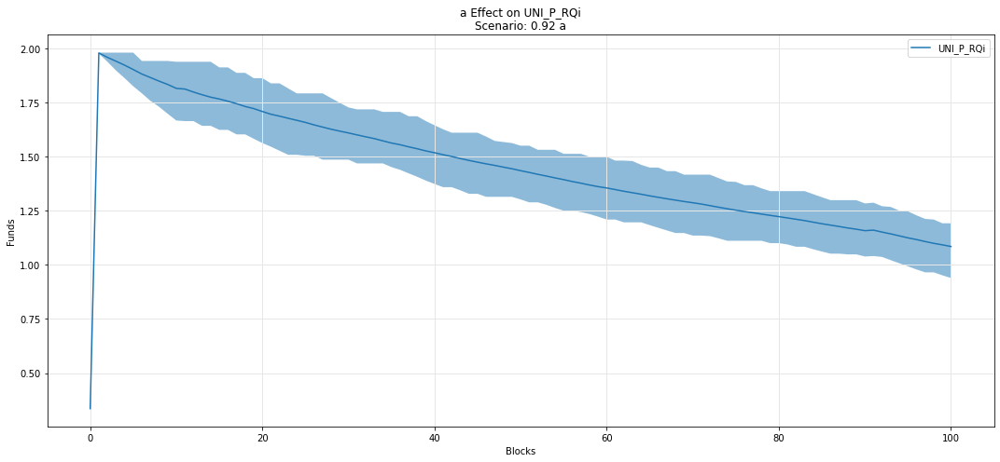

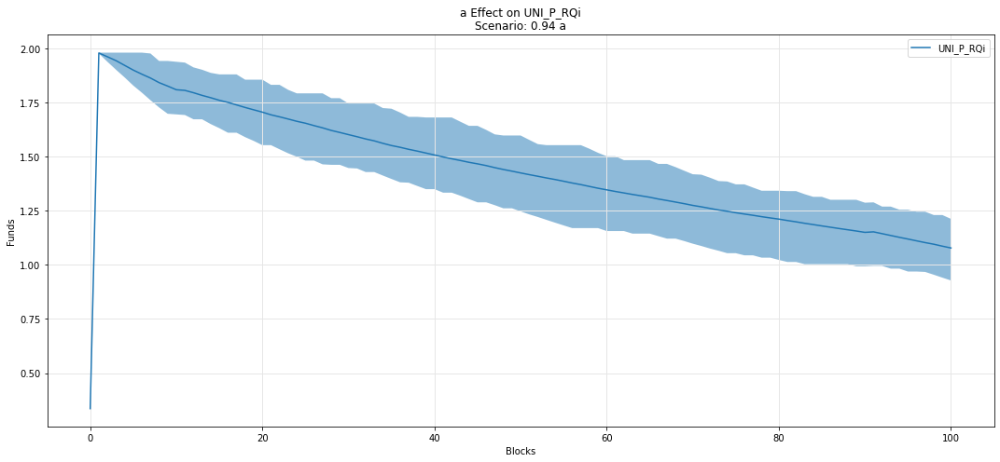

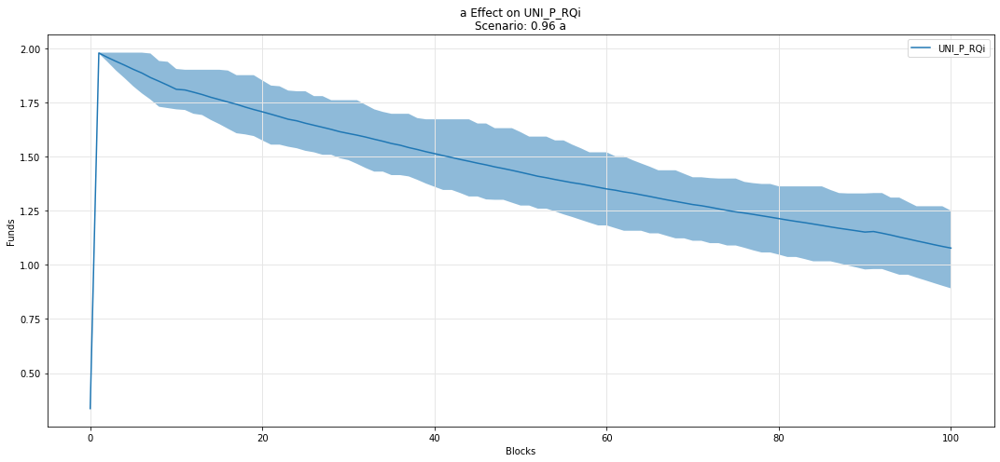

...

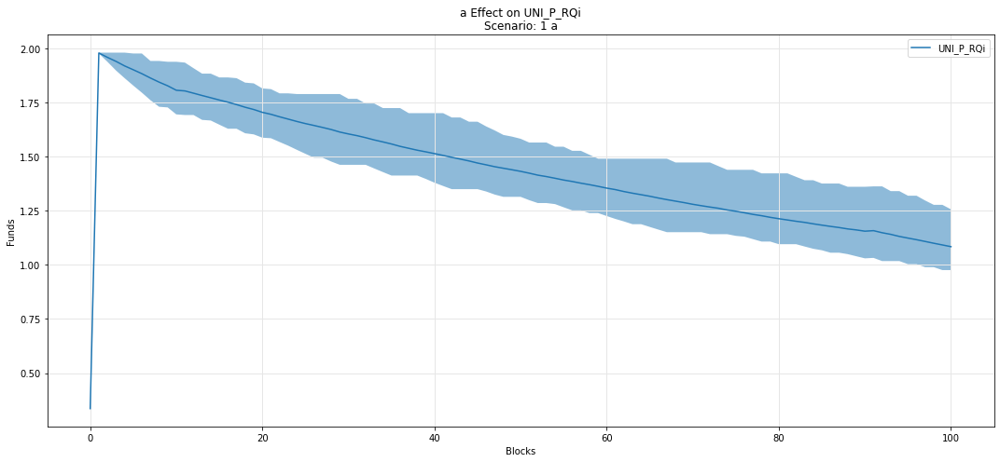

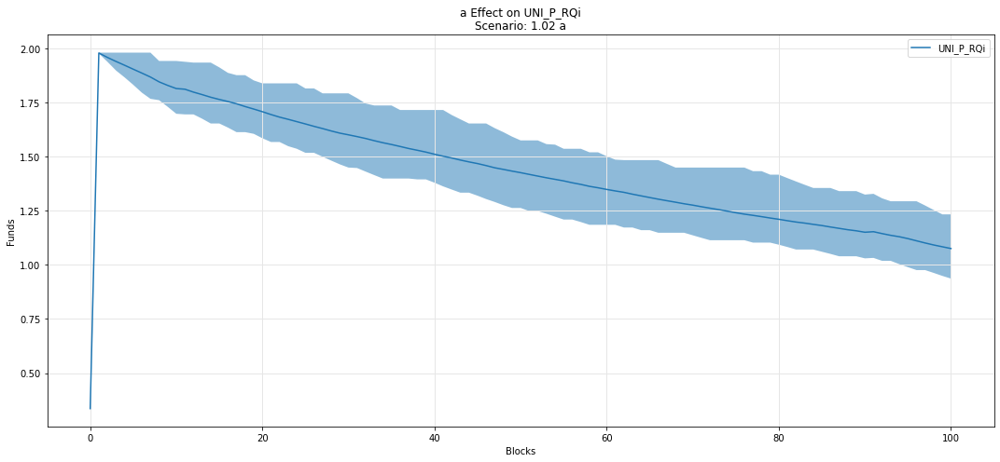

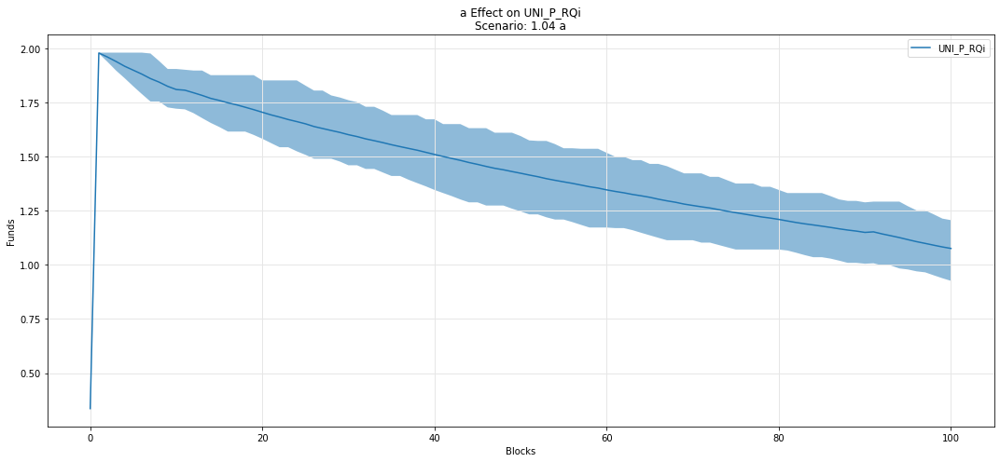

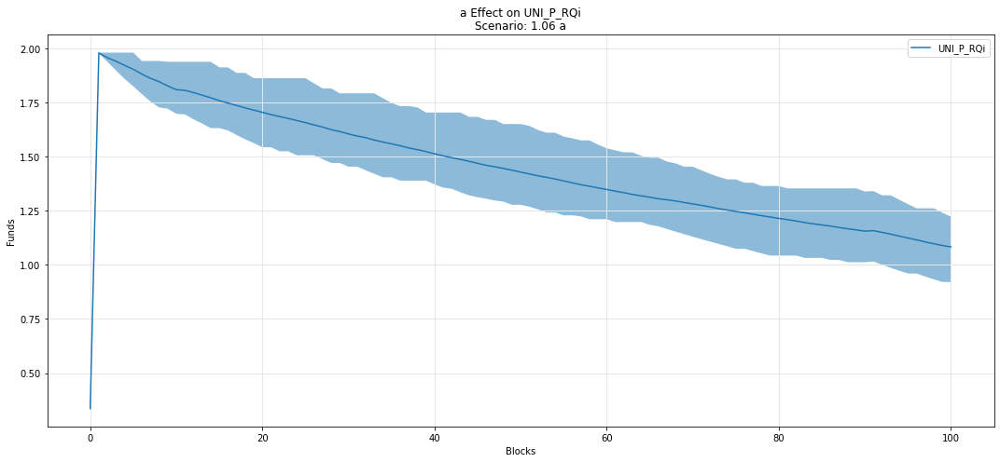

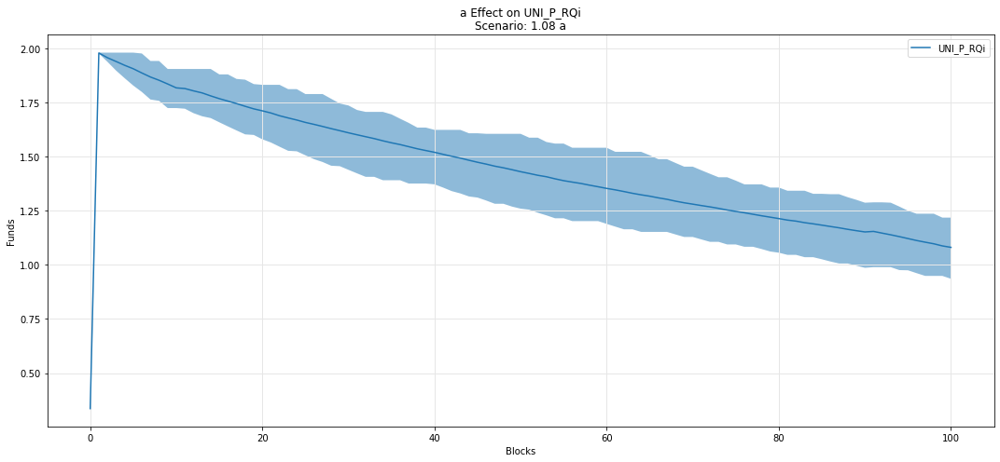

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

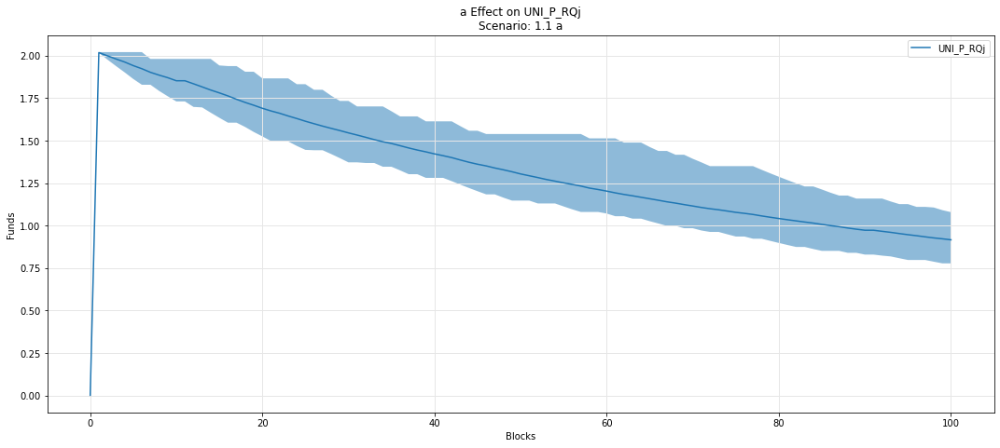

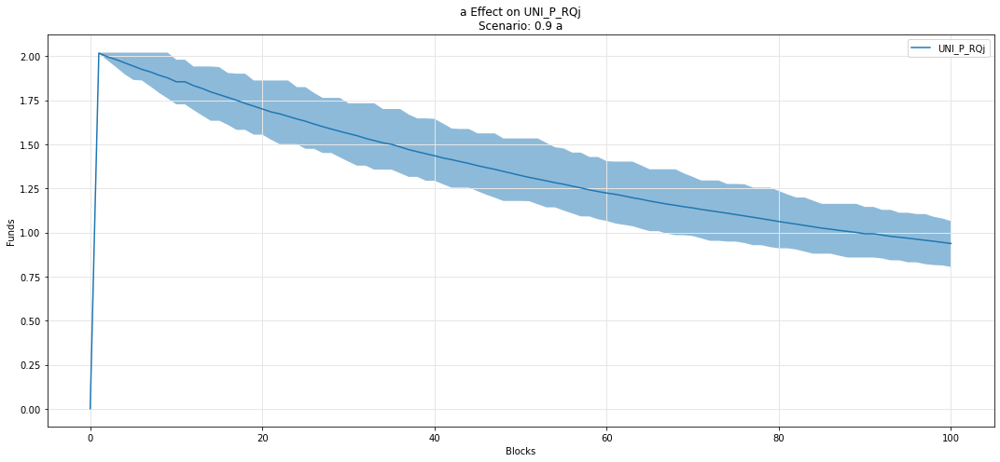

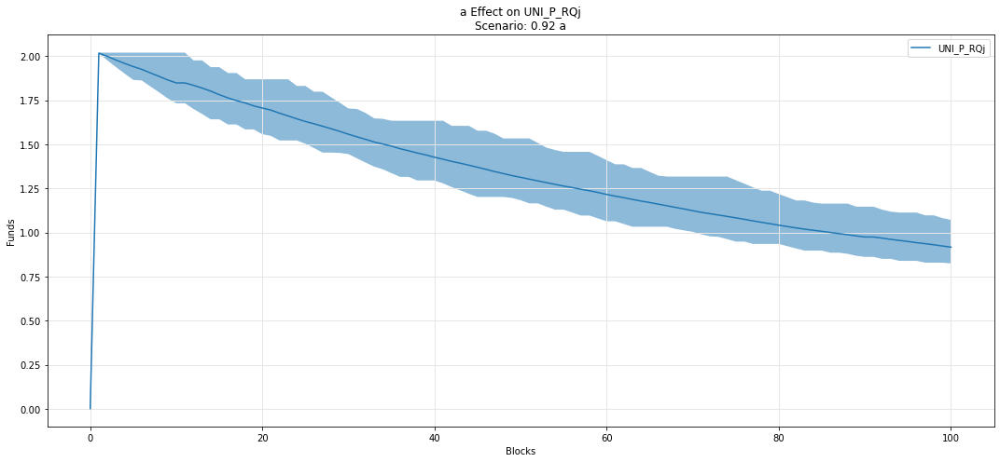

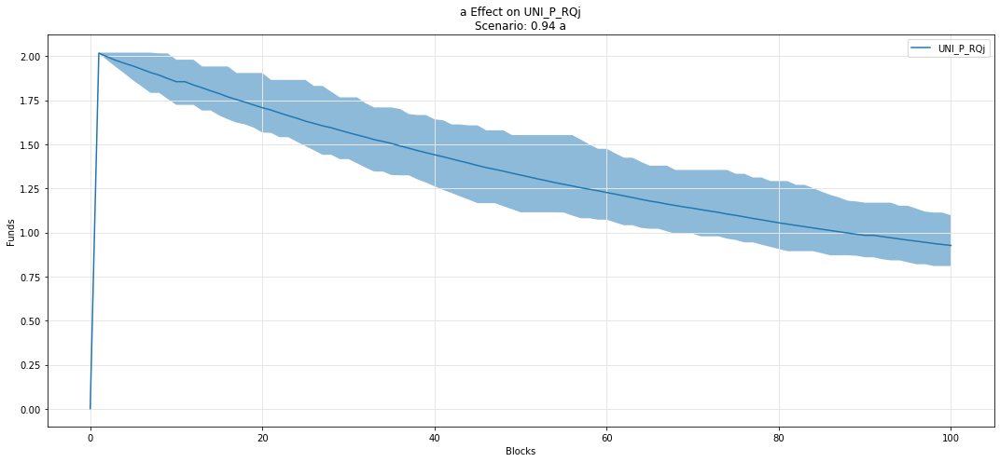

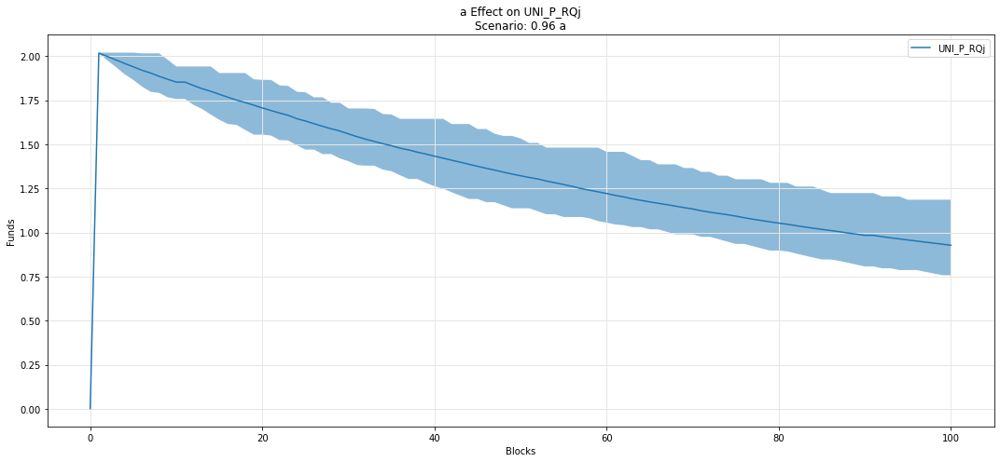

...

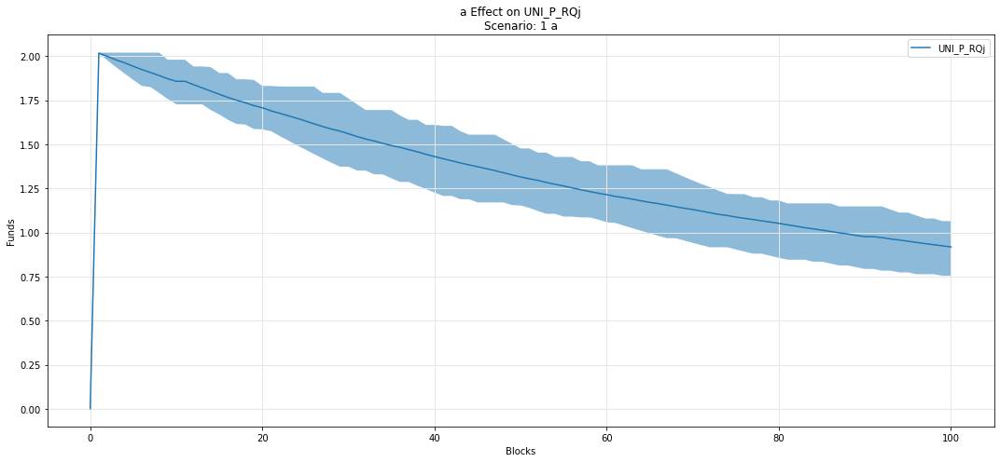

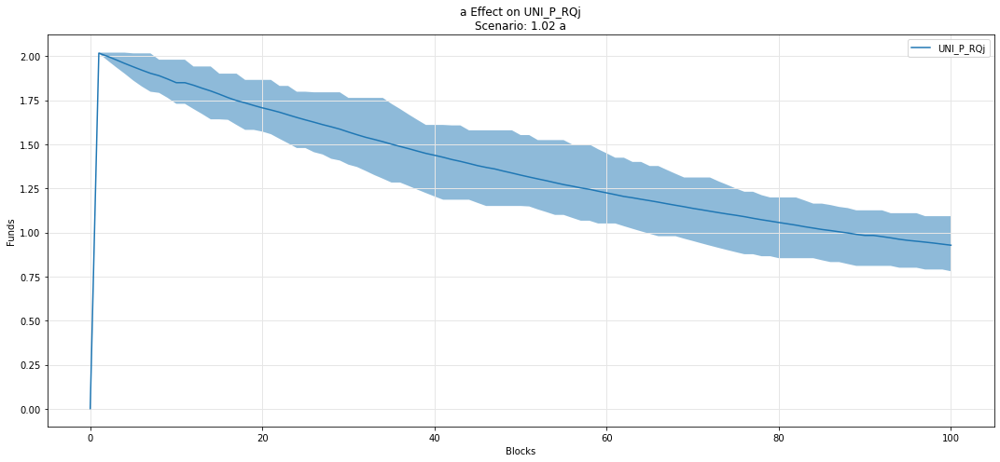

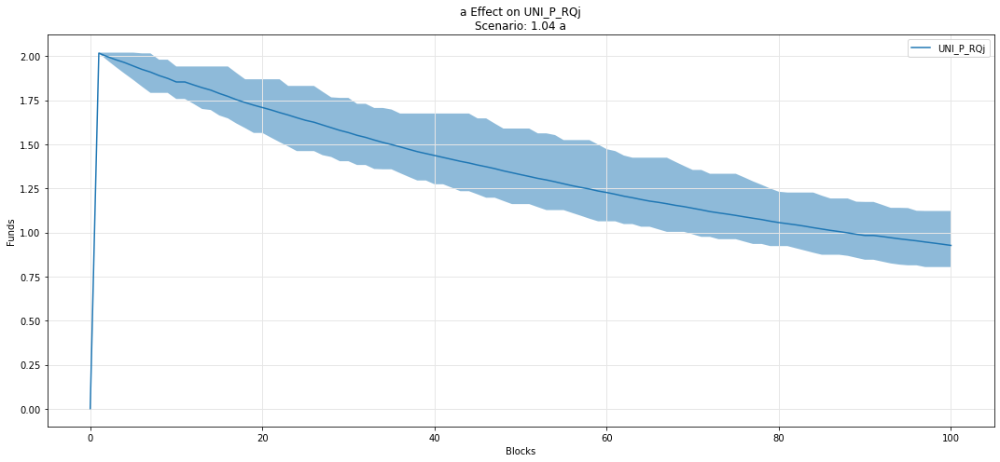

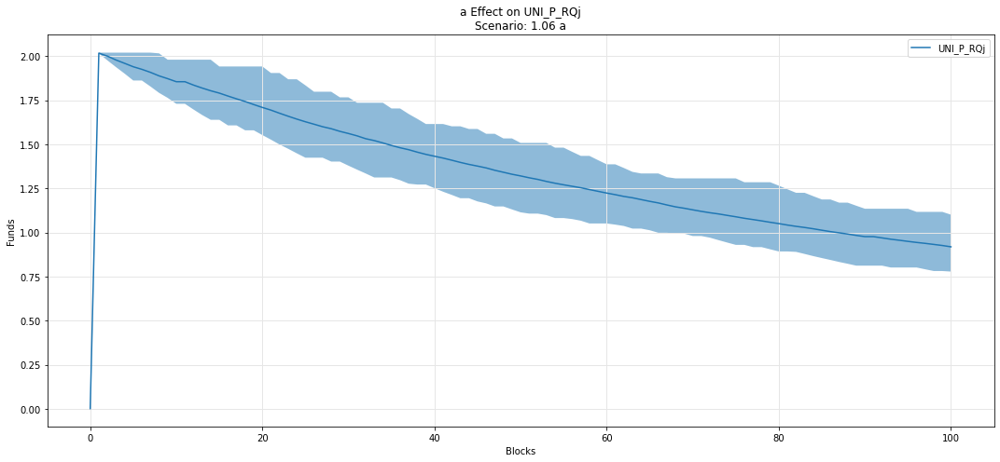

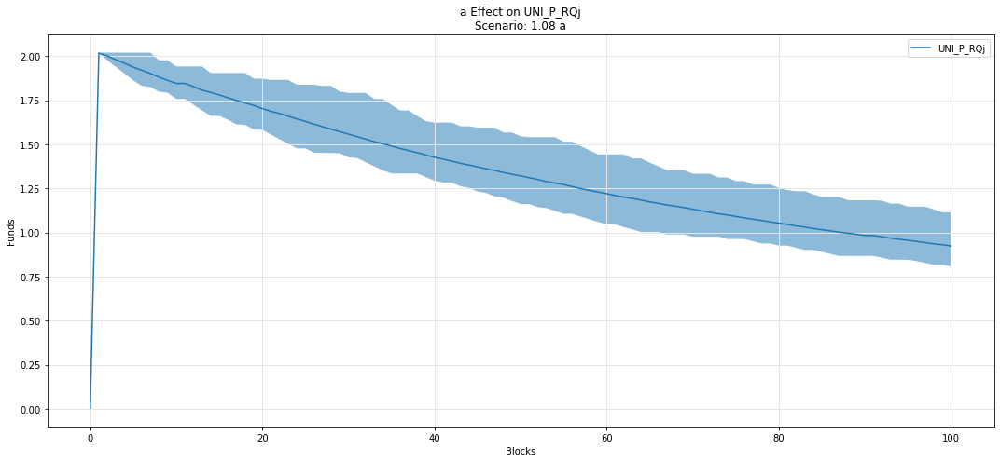

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

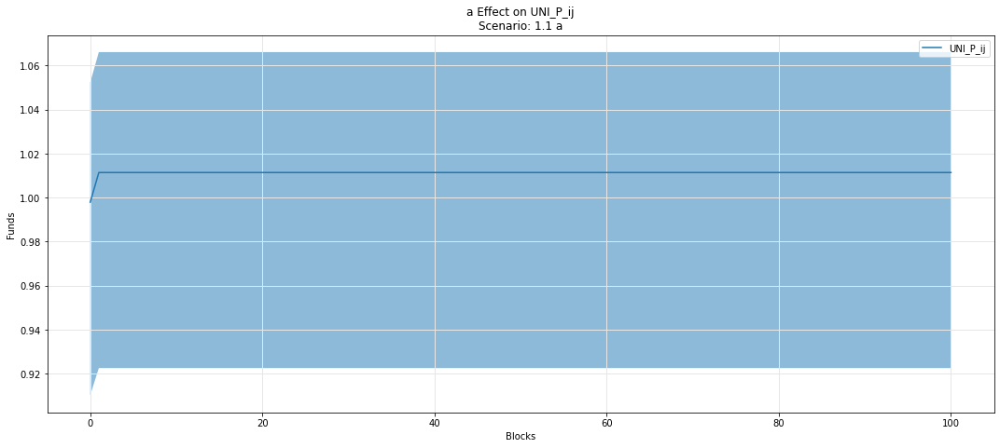

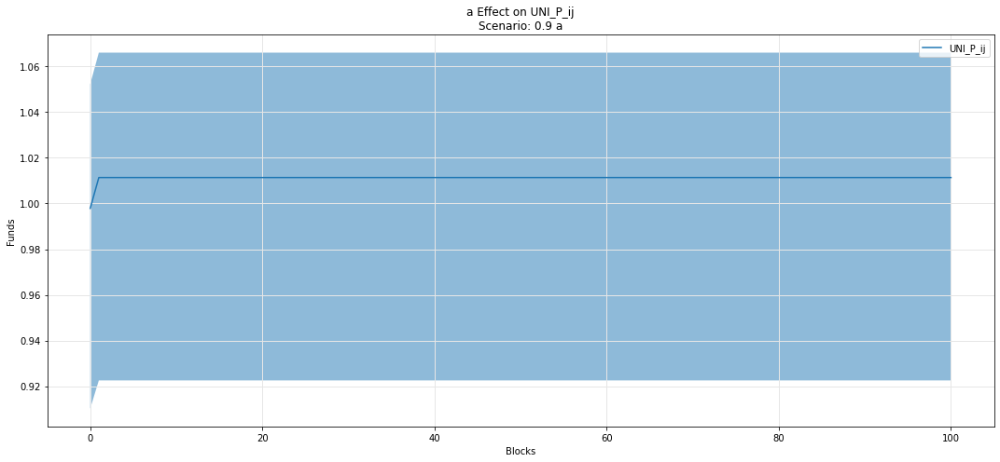

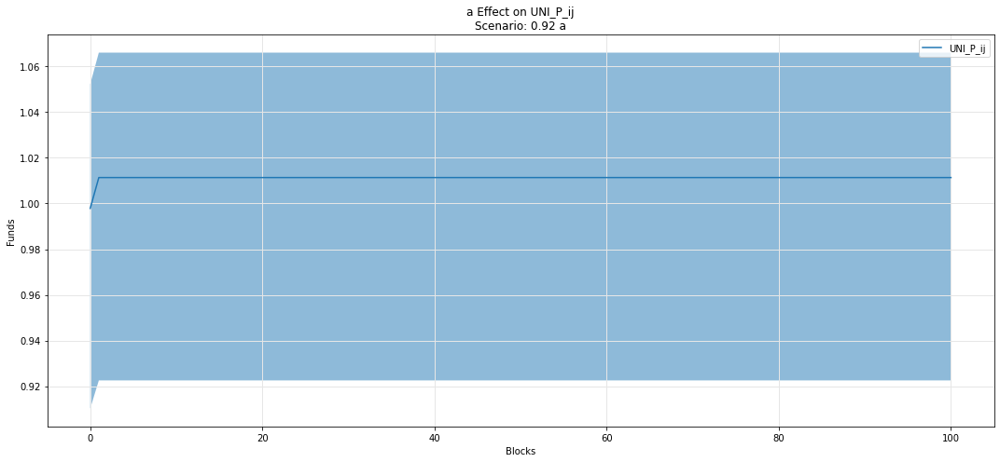

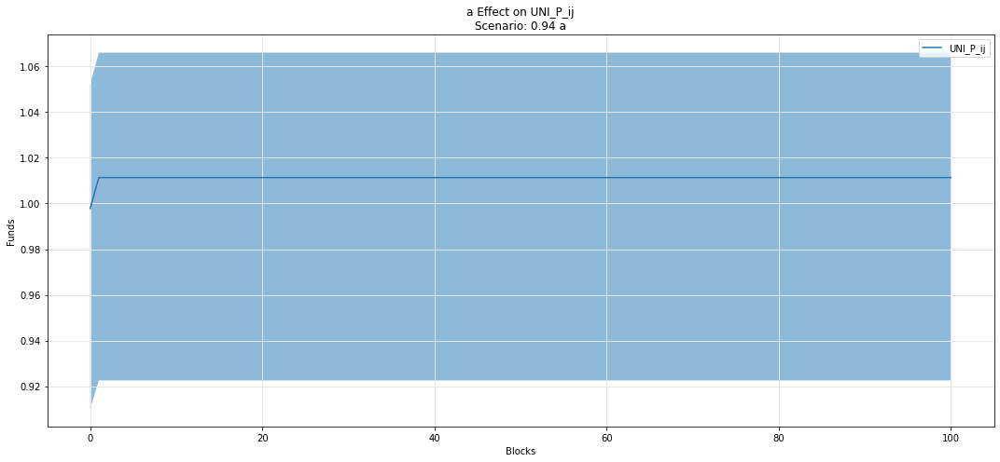

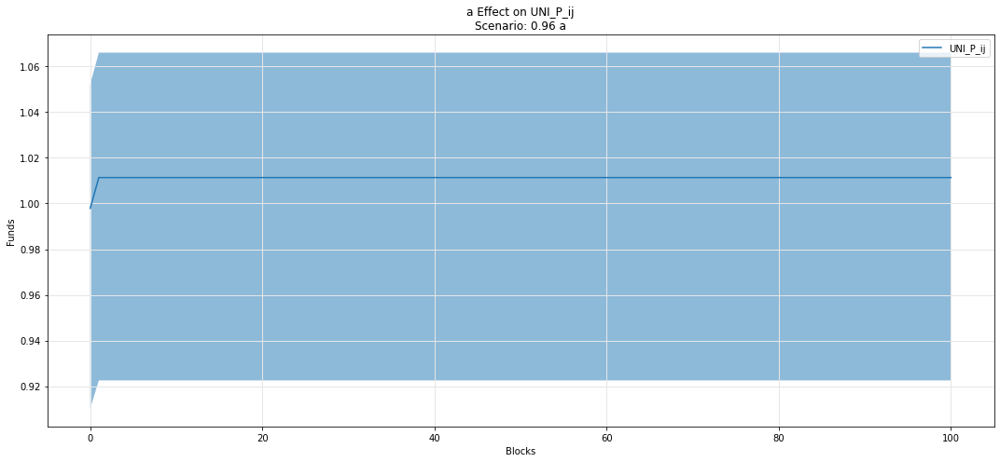

...

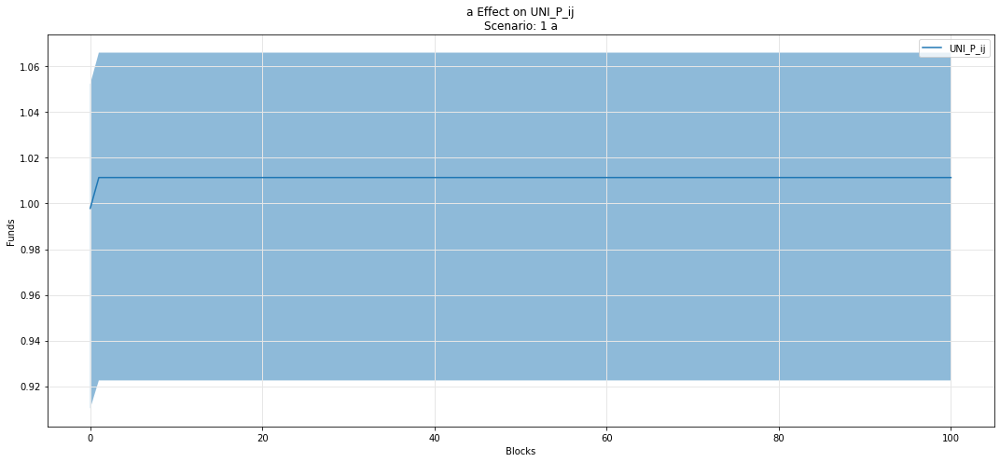

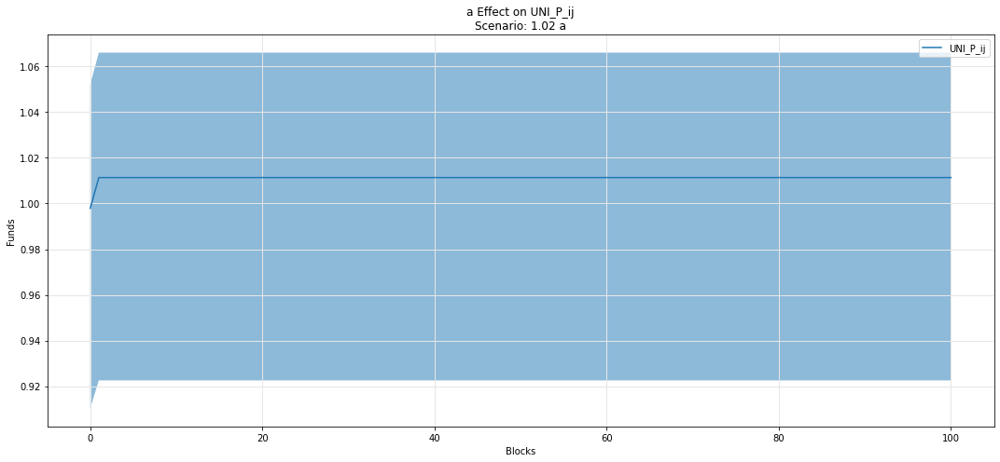

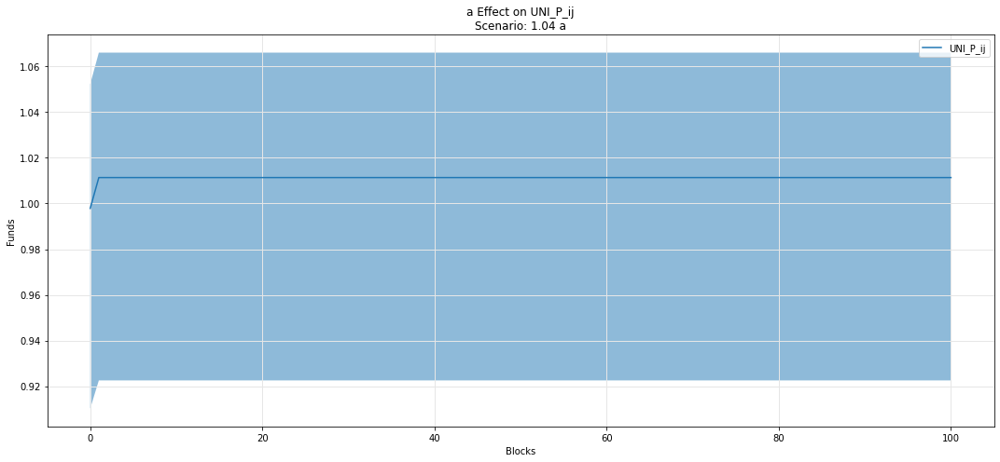

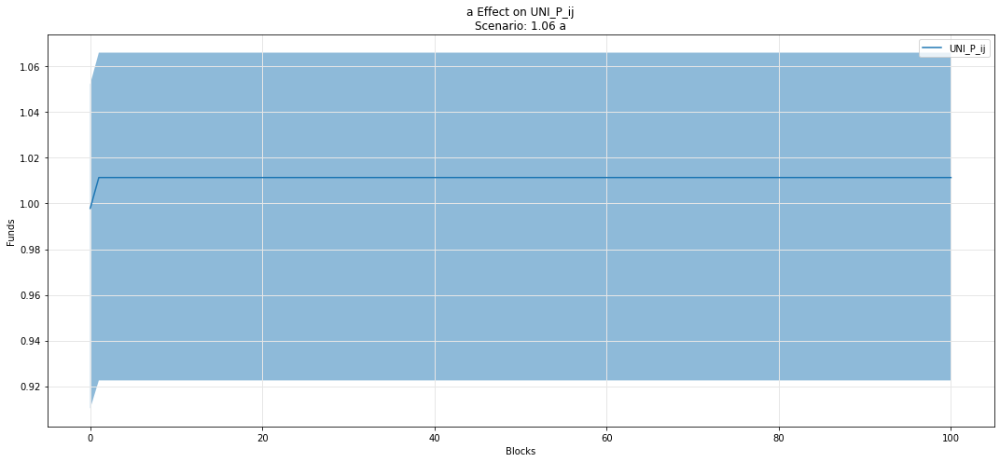

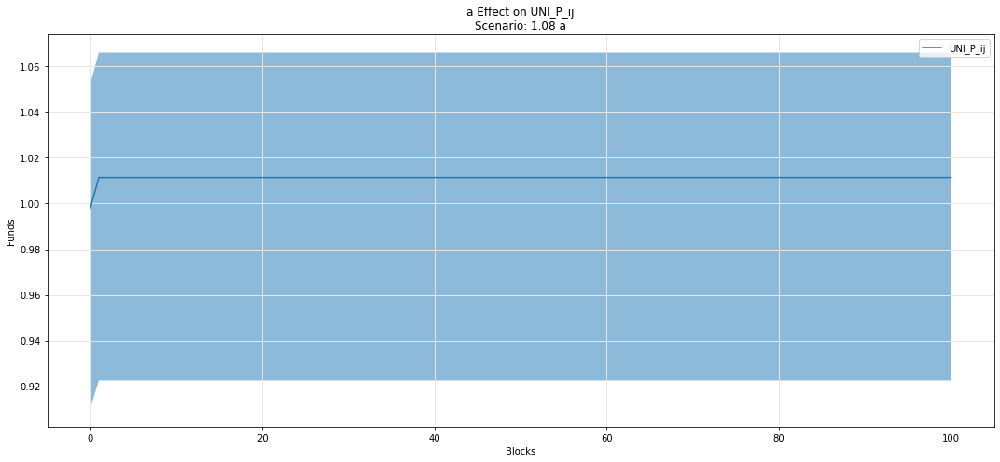

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

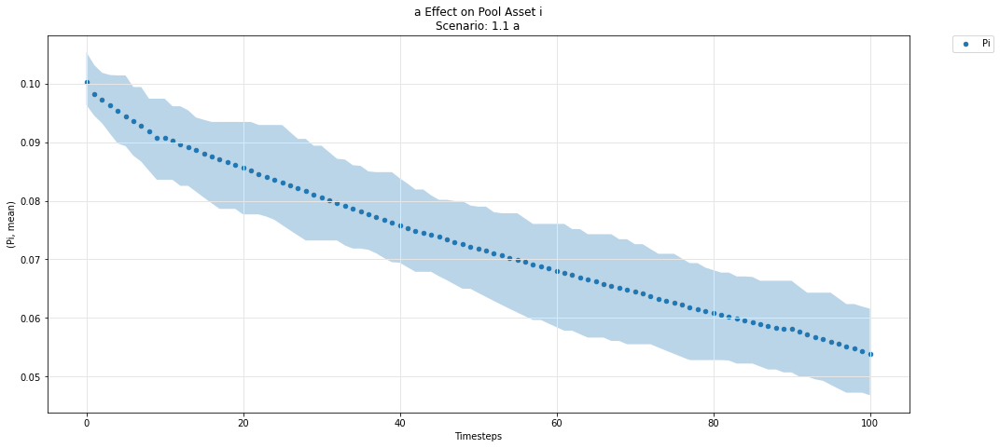

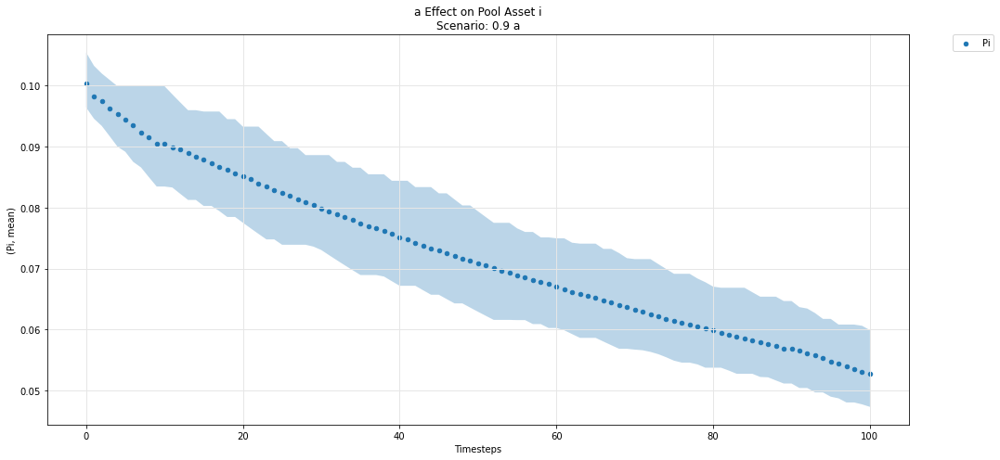

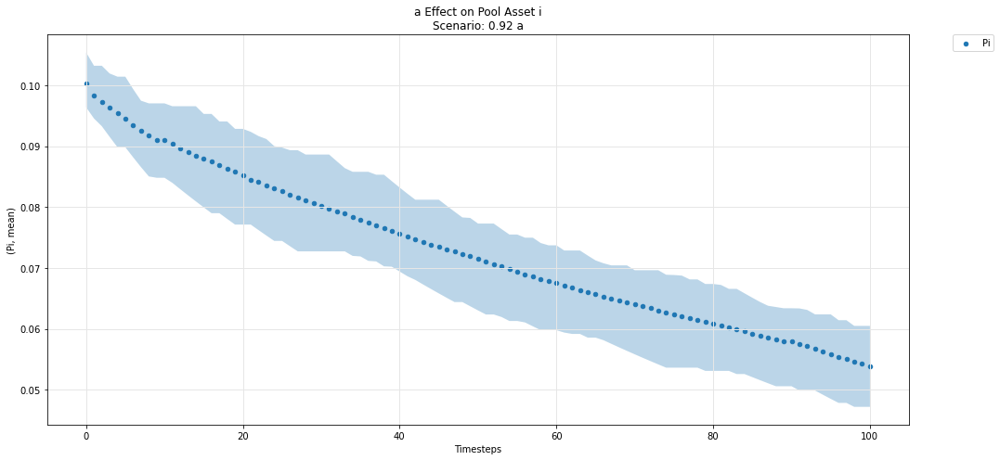

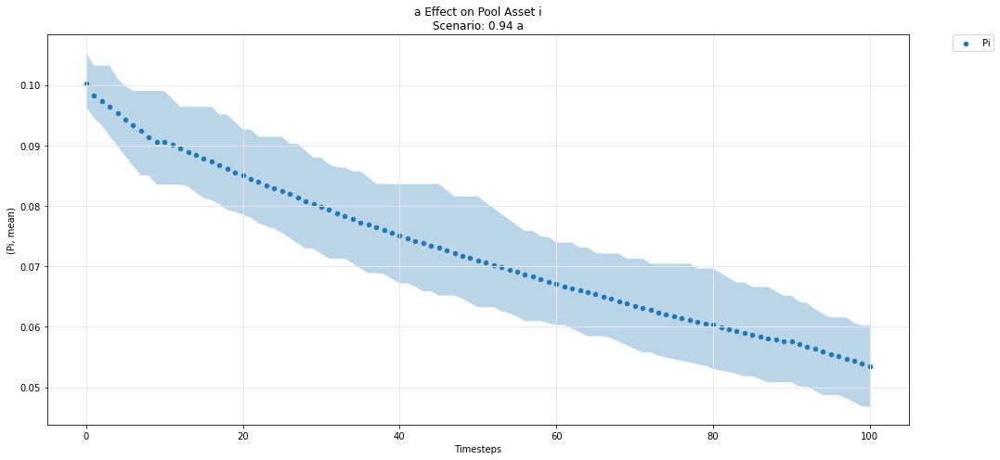

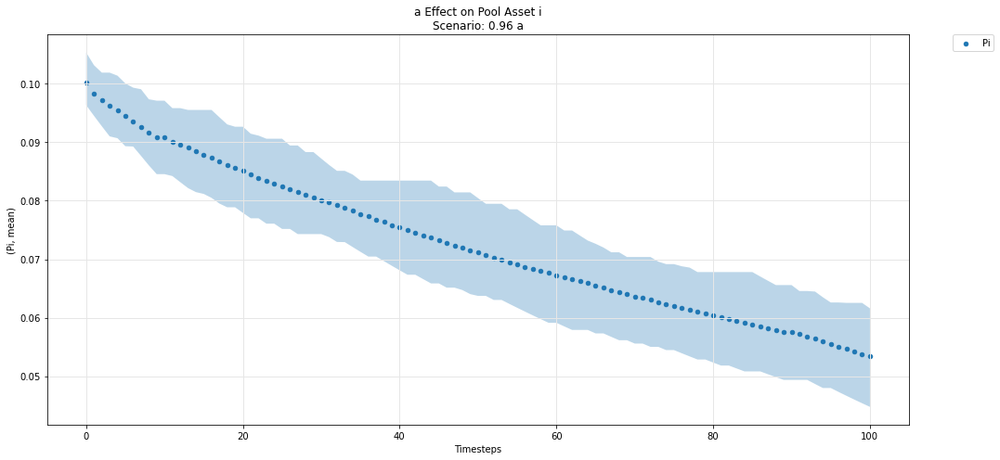

...

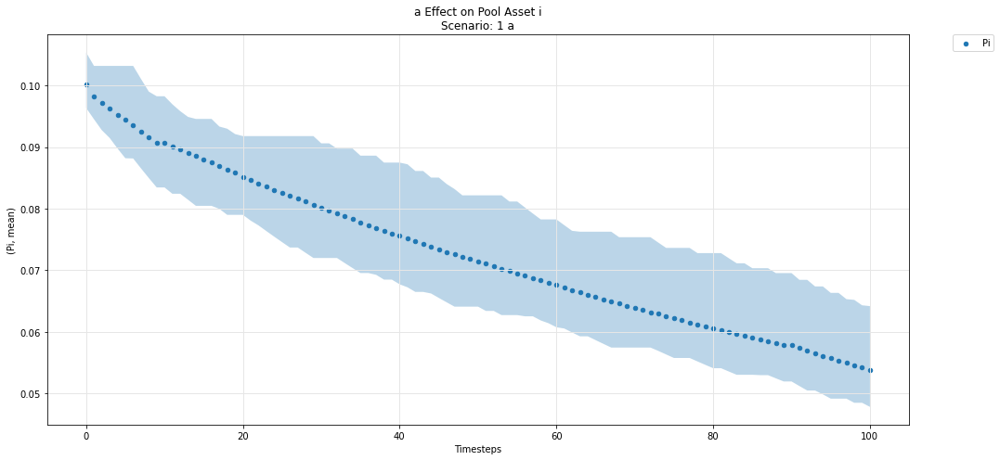

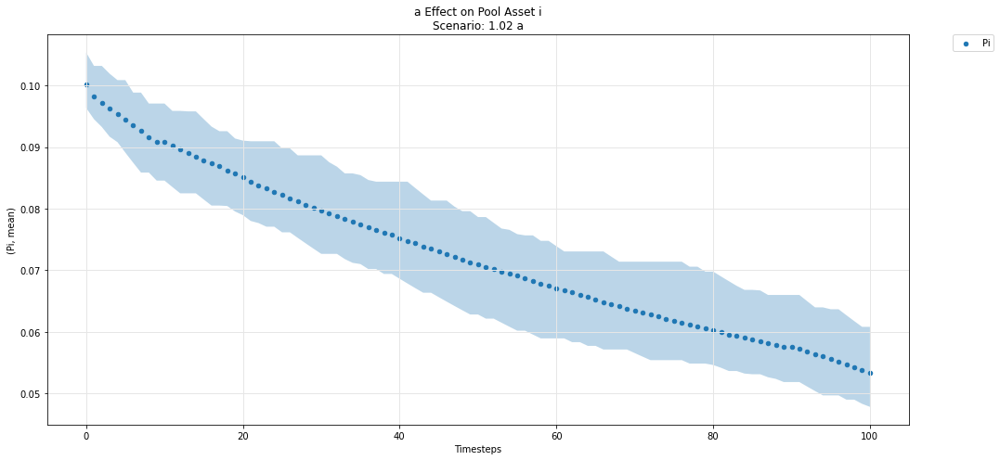

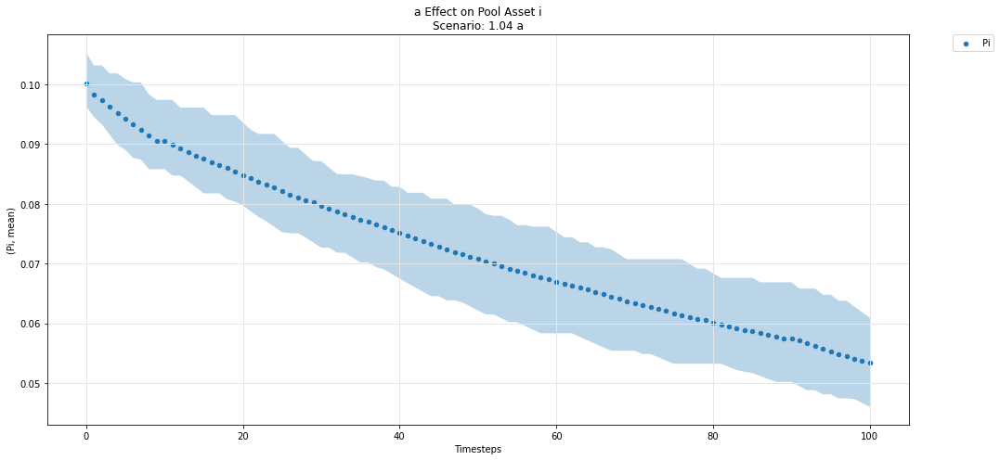

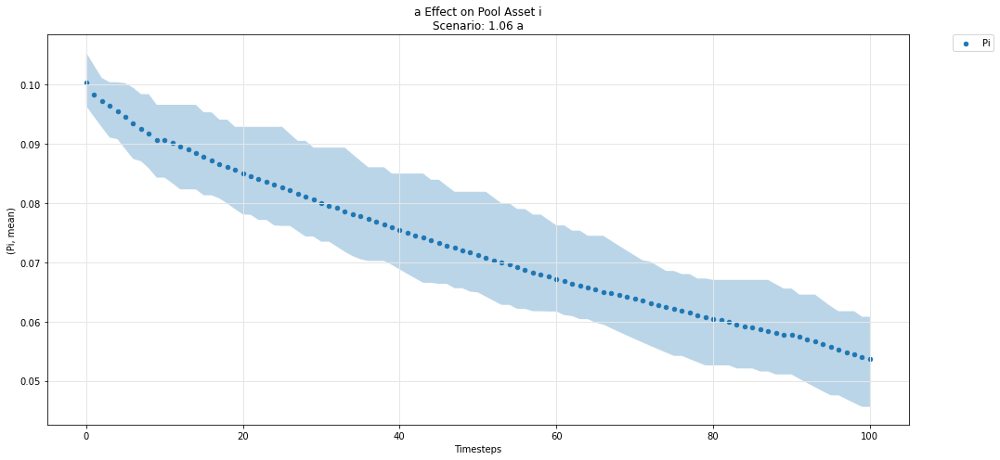

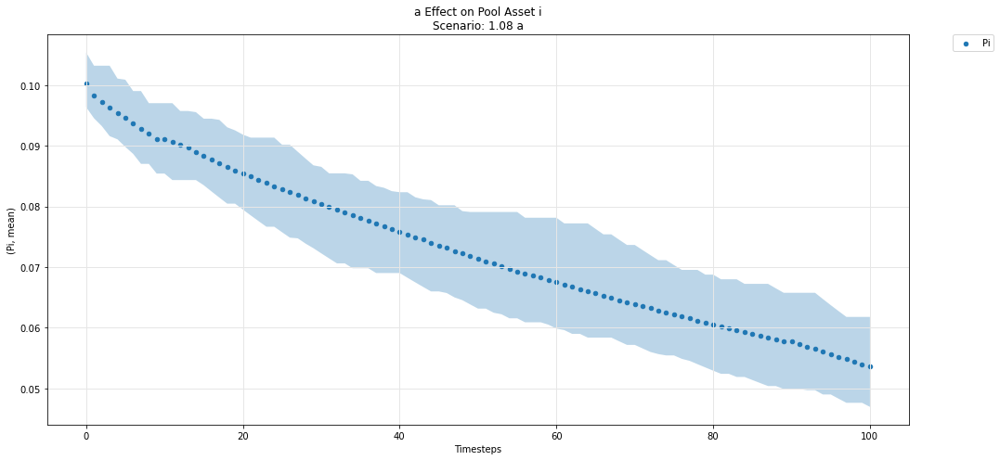

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

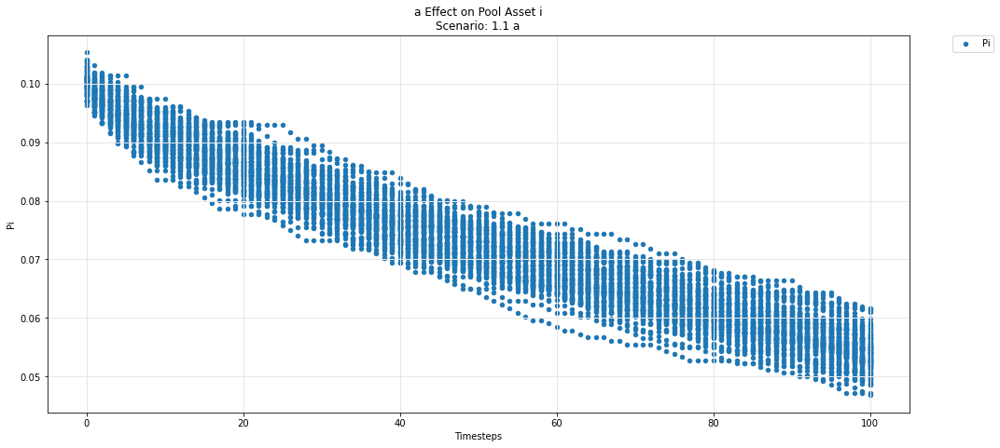

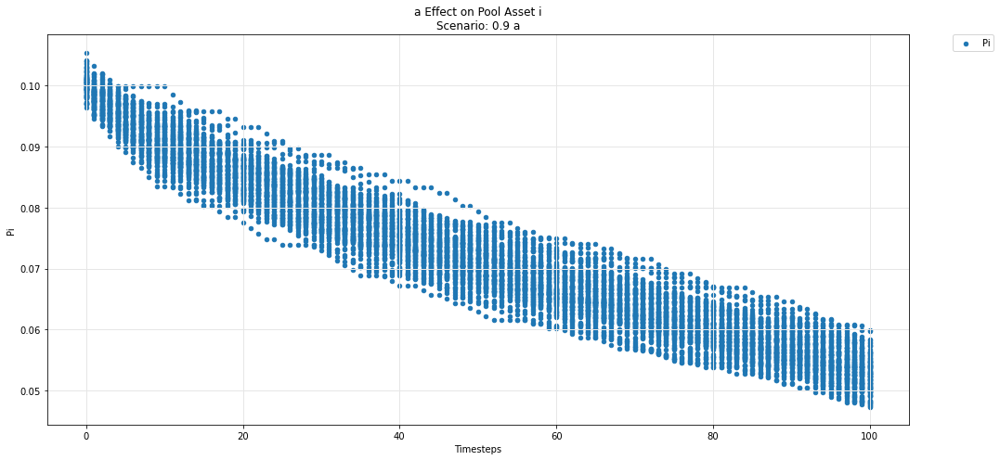

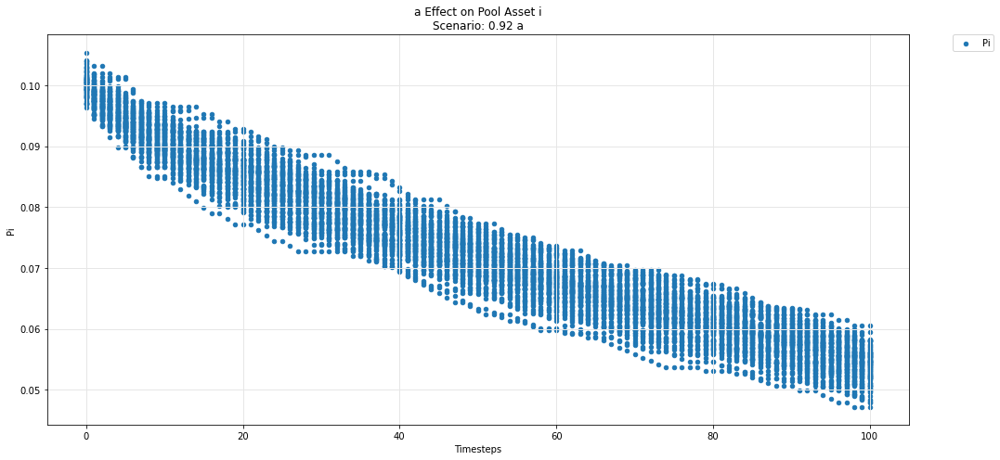

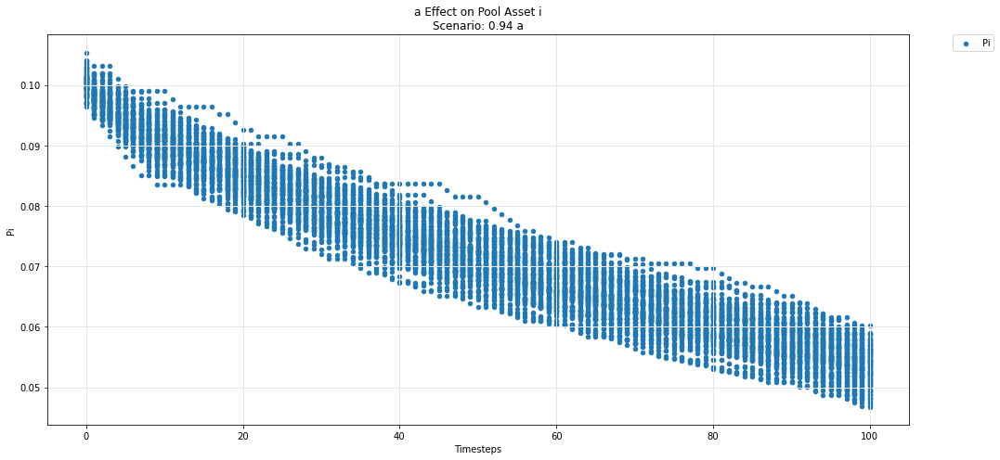

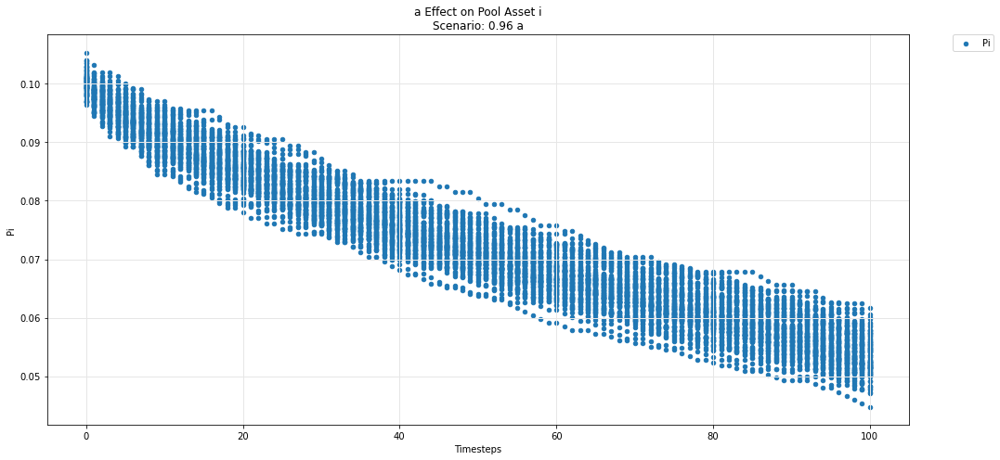

...

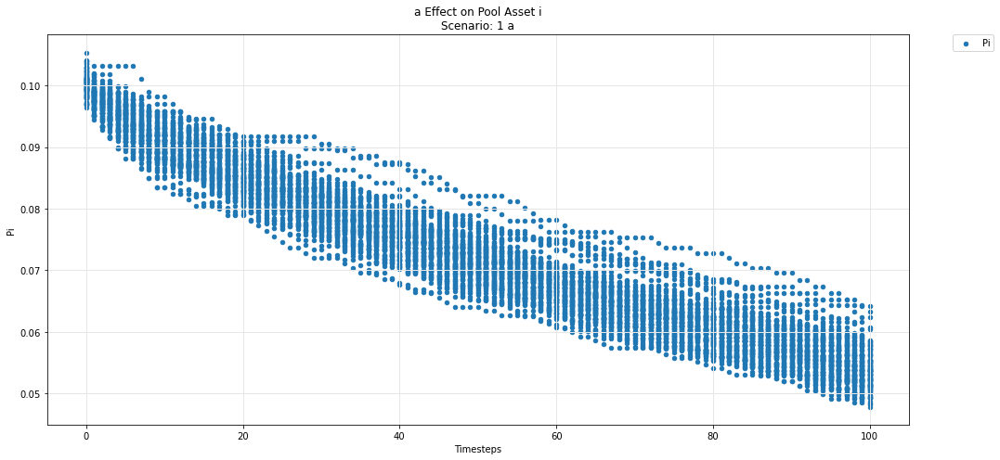

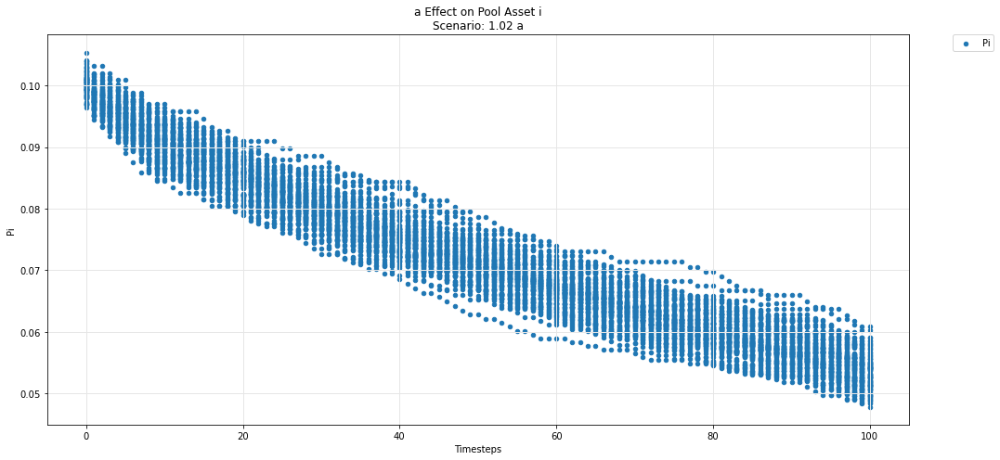

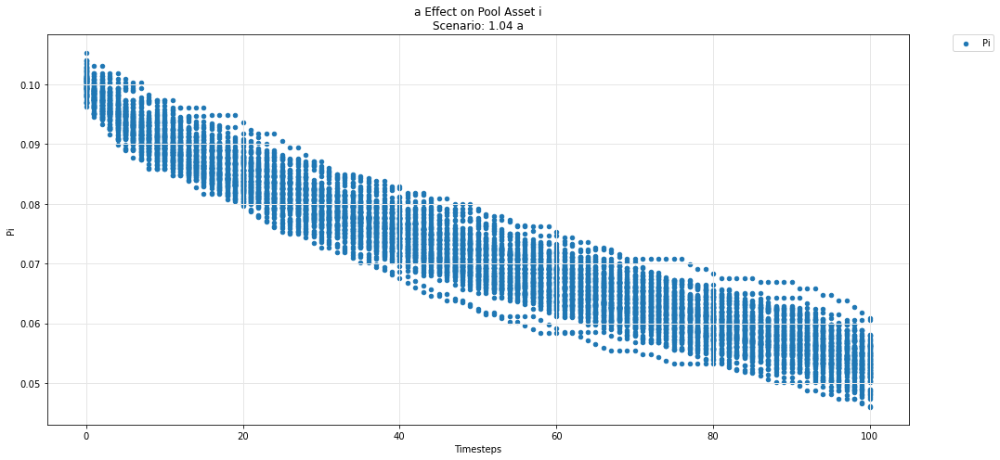

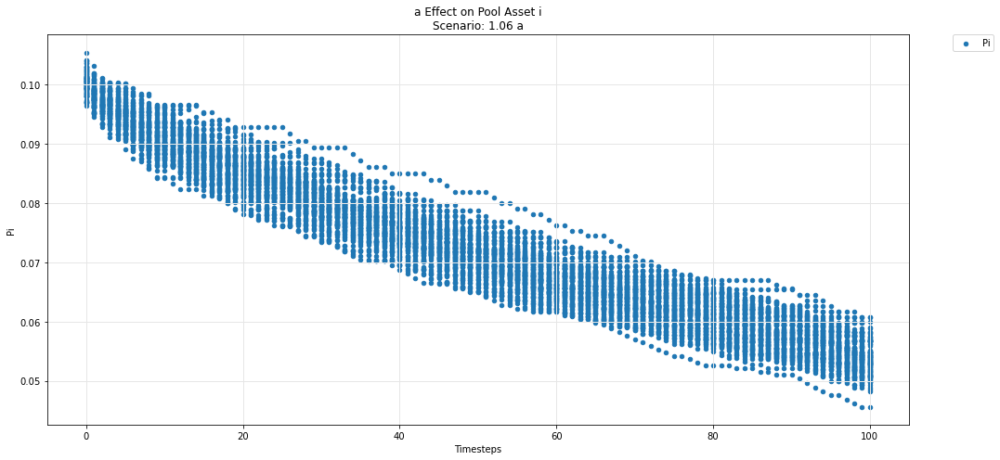

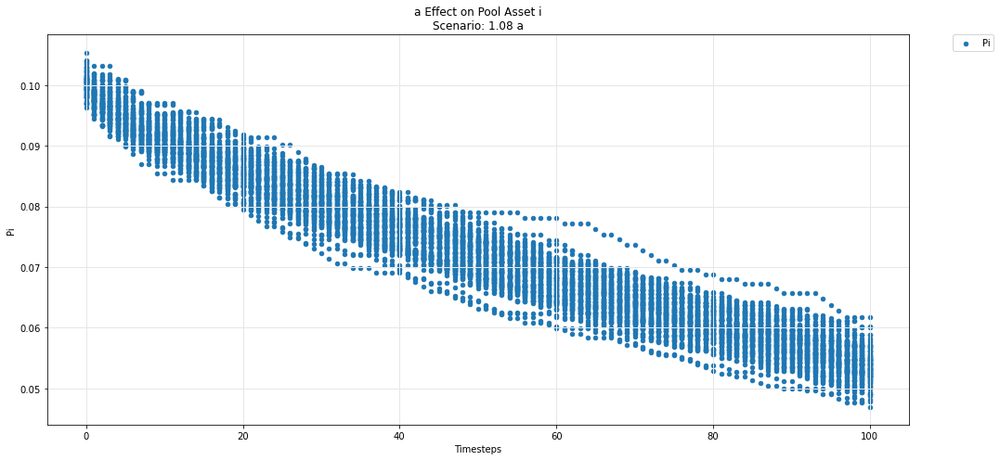

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

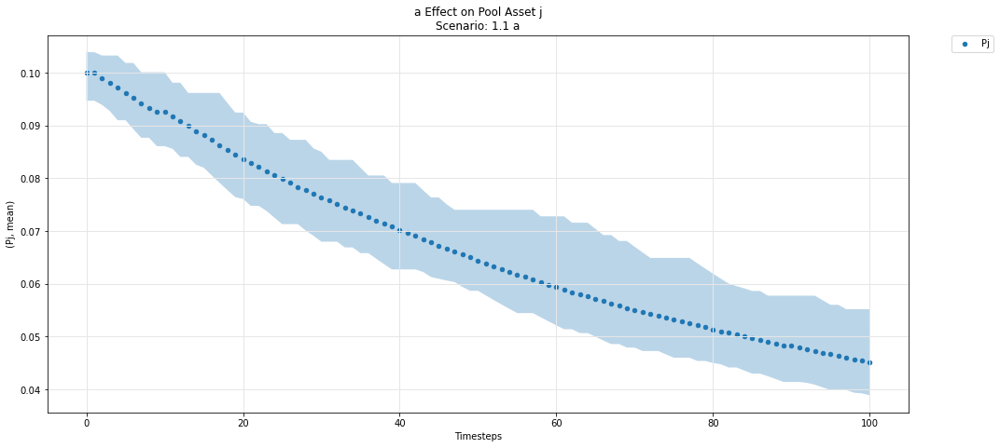

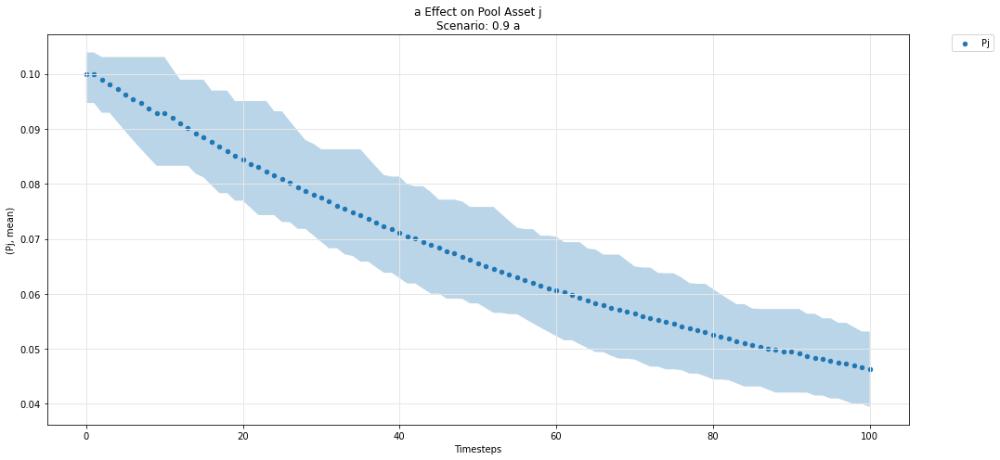

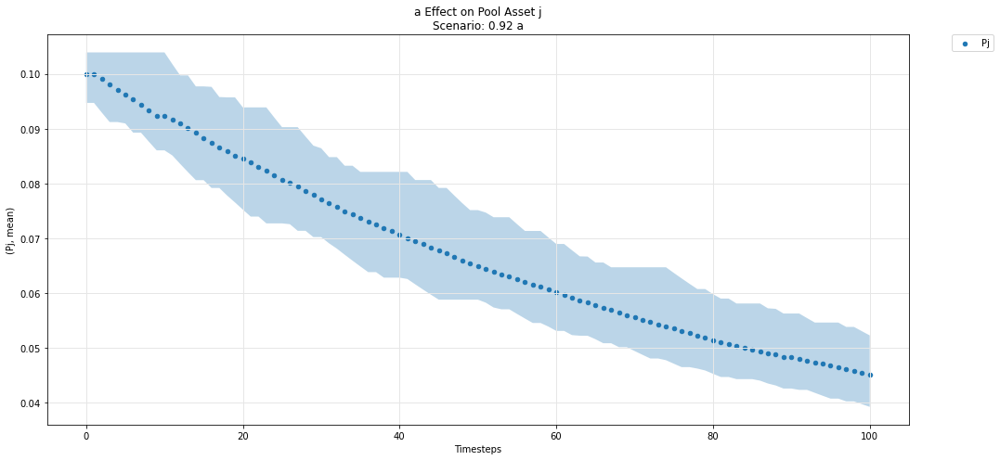

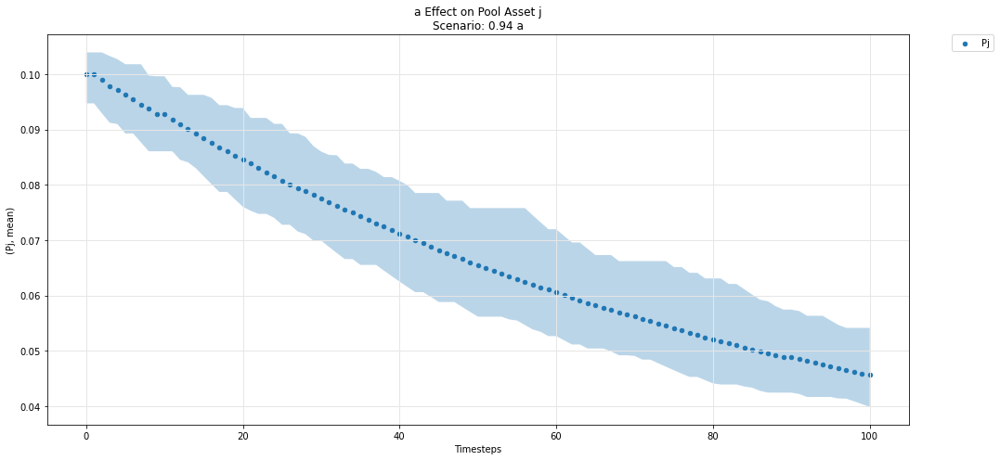

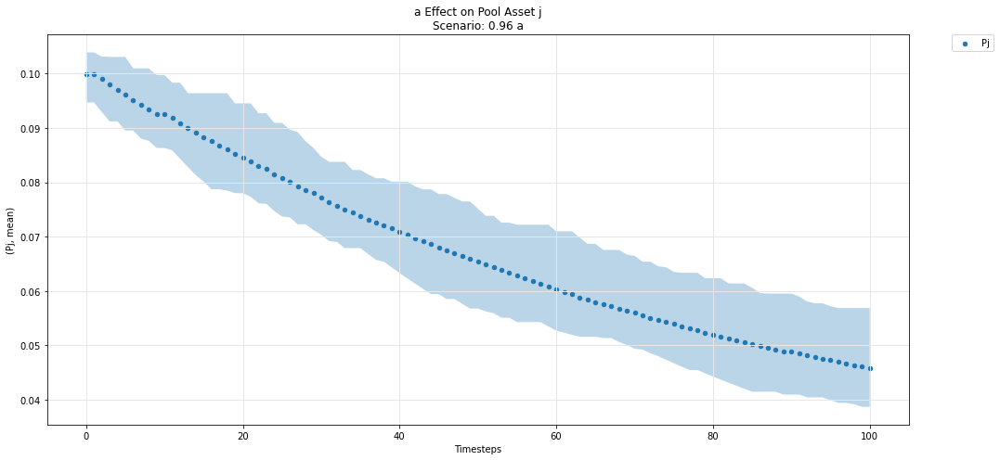

...

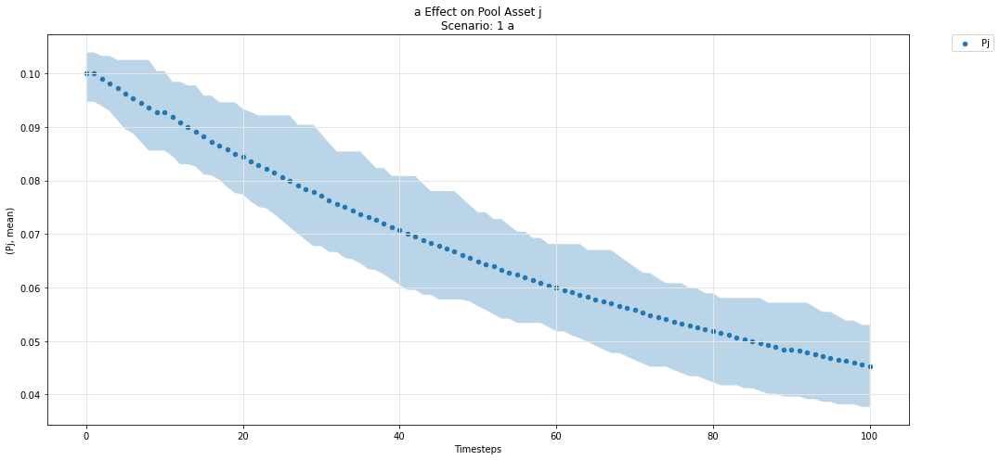

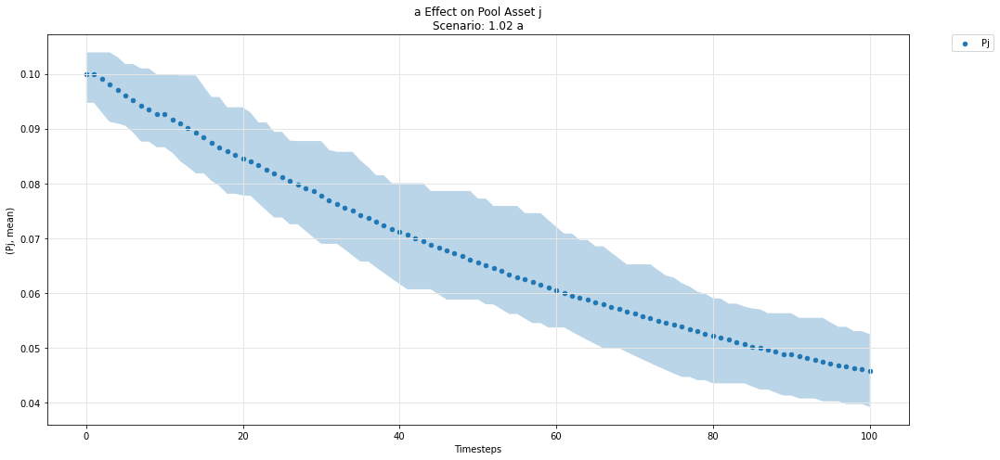

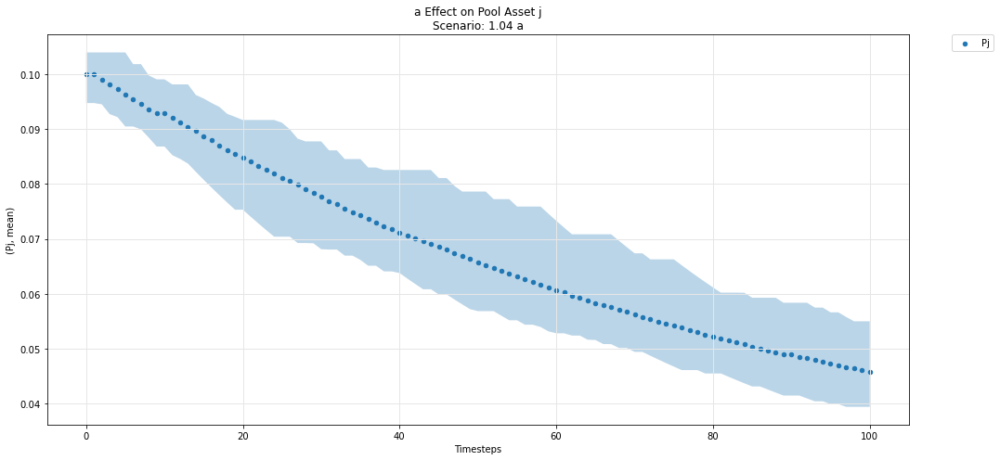

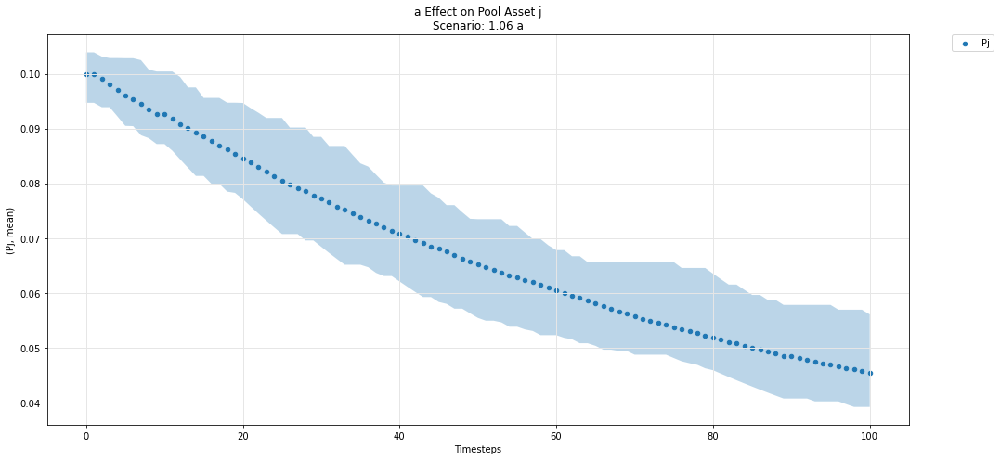

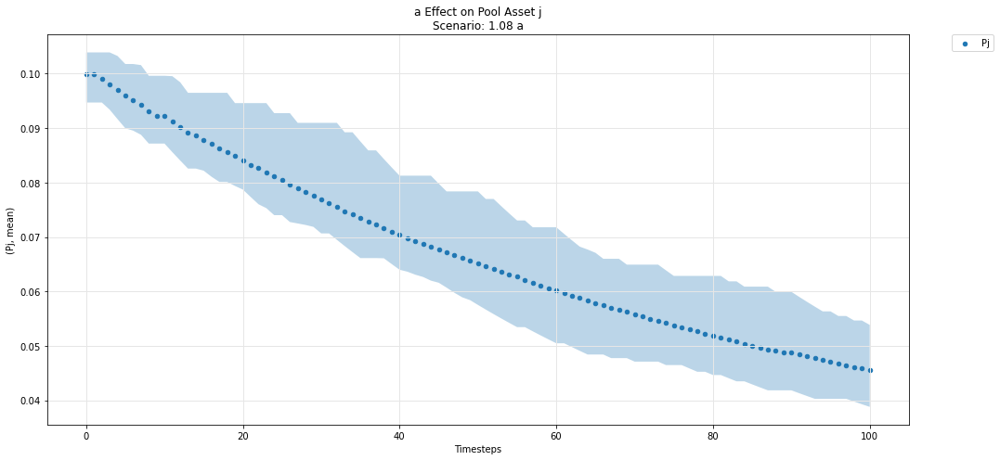

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

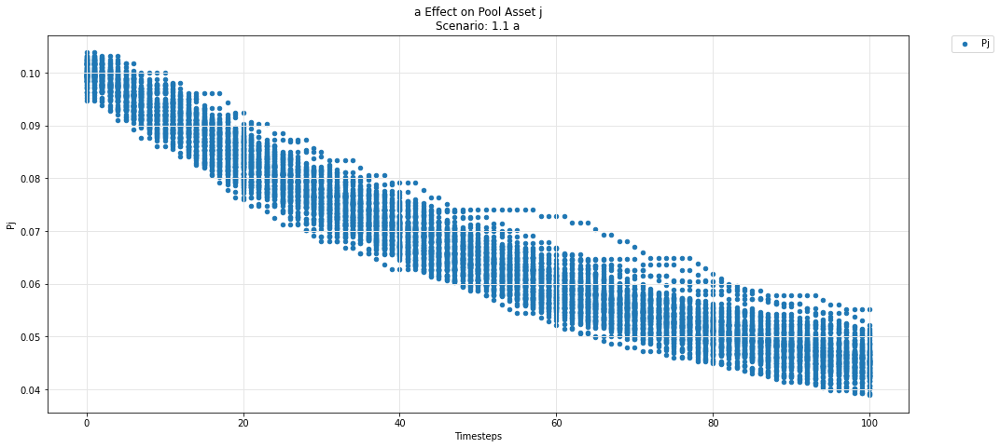

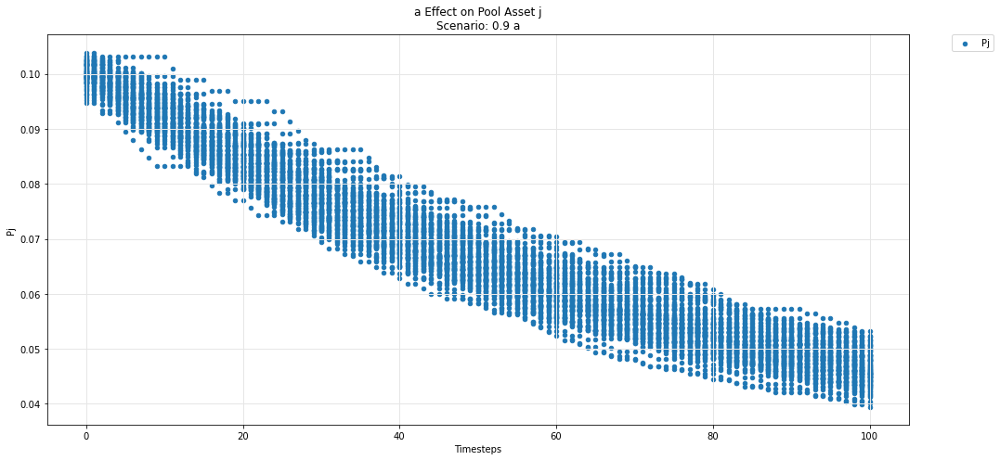

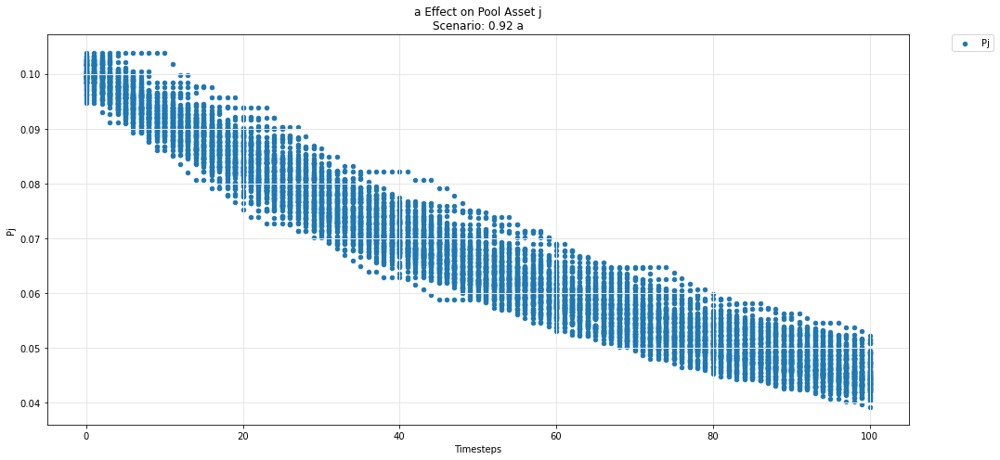

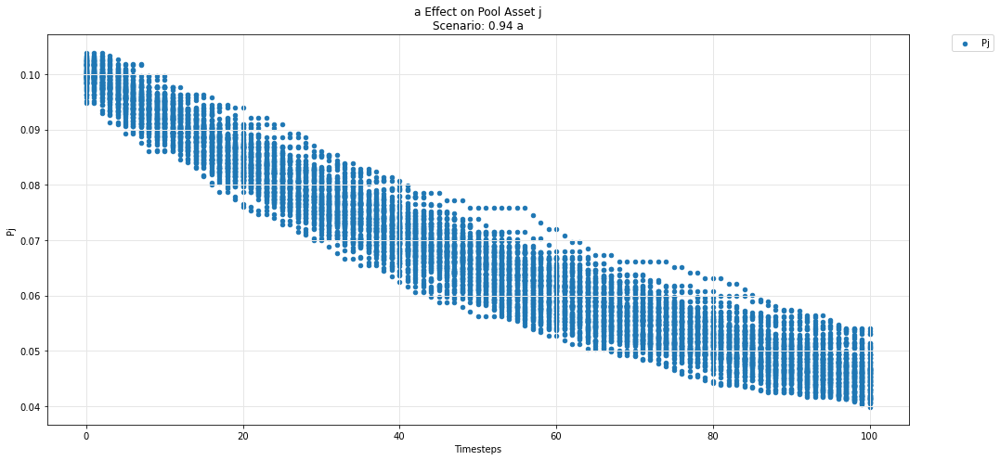

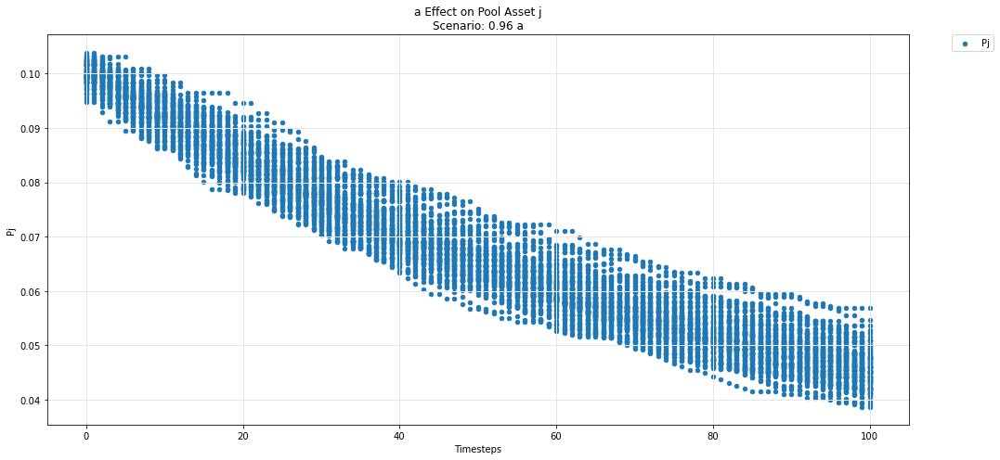

...

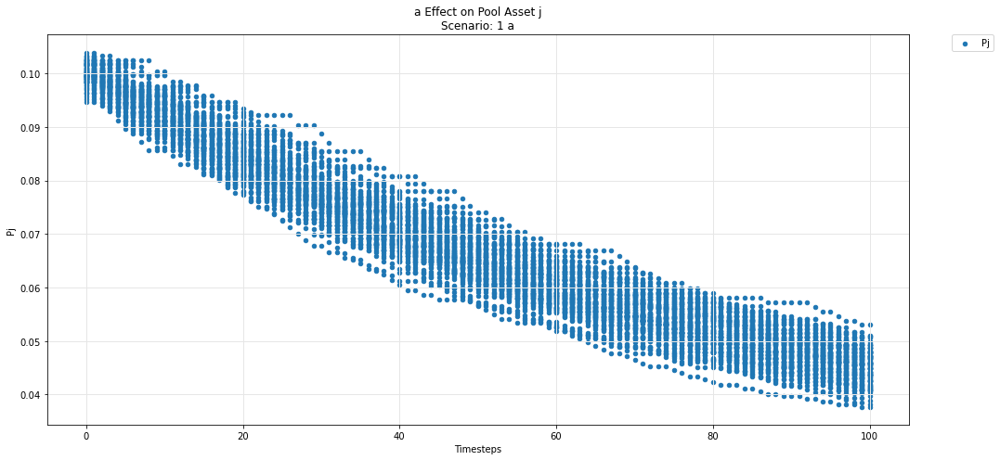

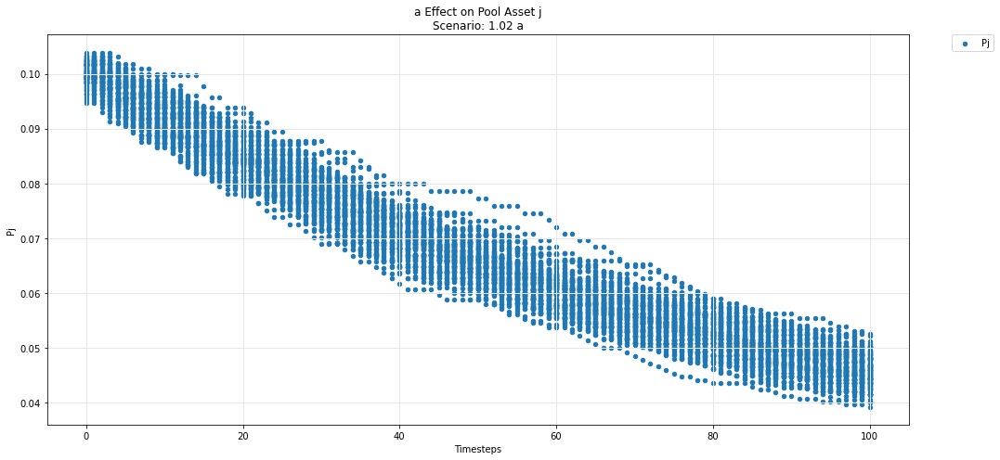

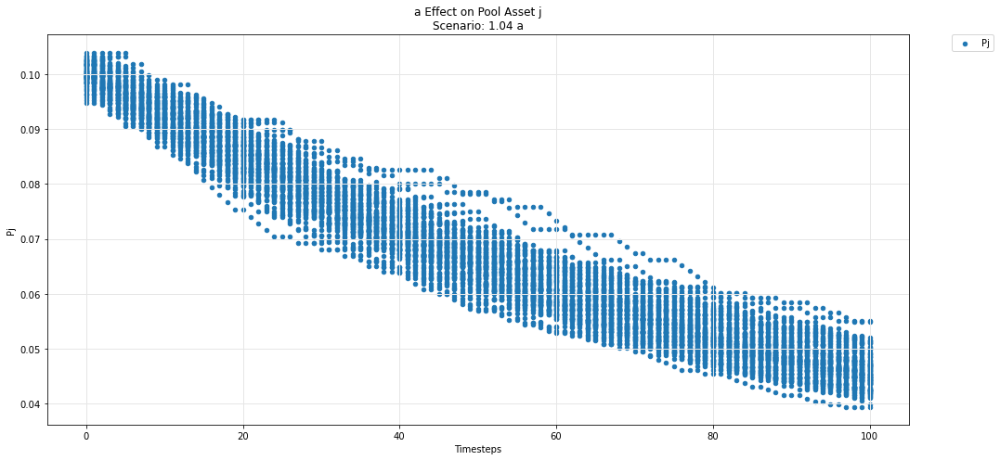

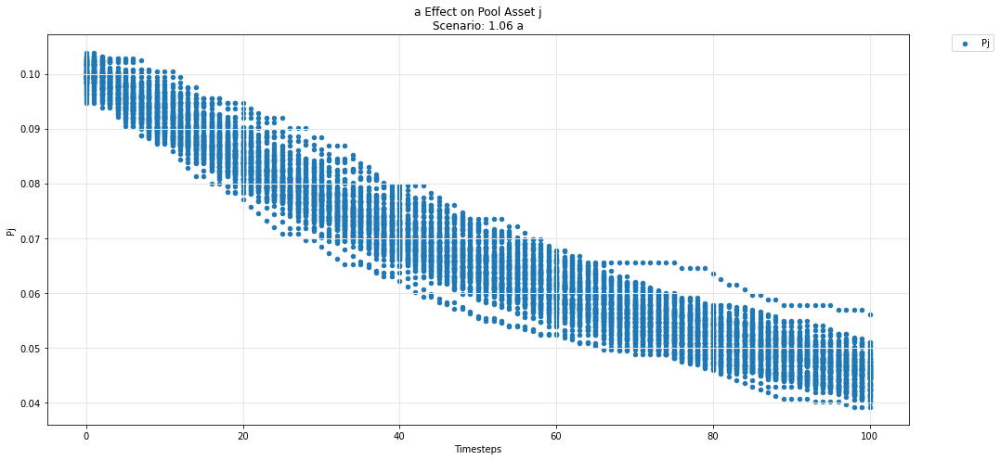

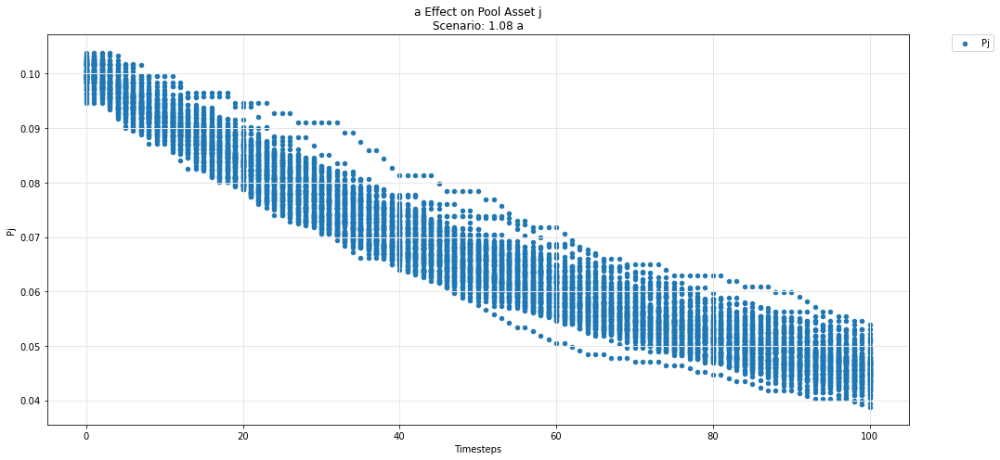

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

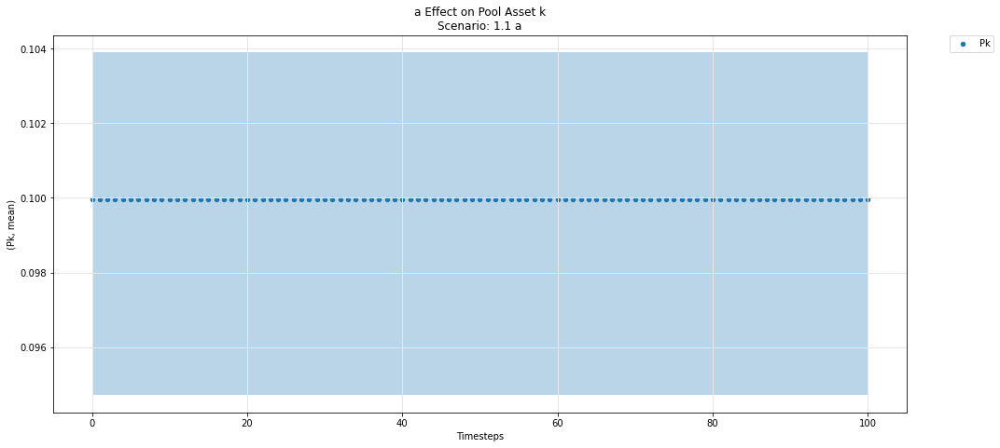

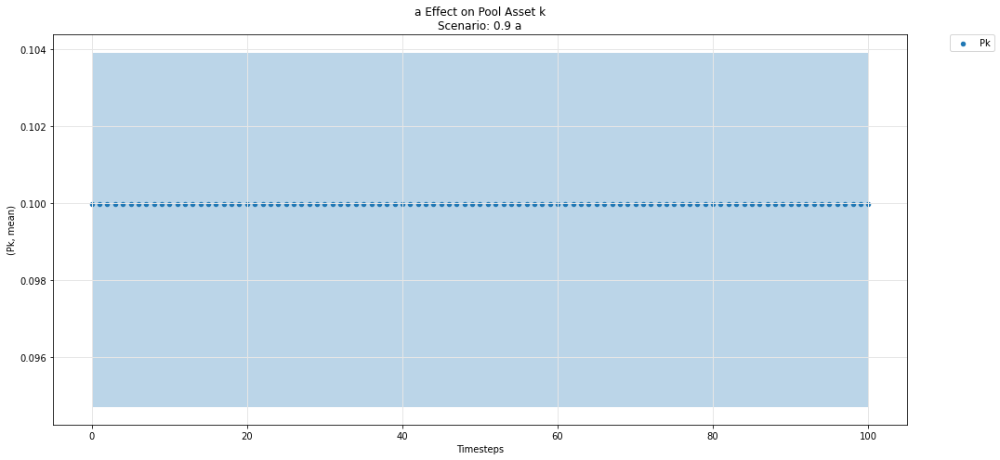

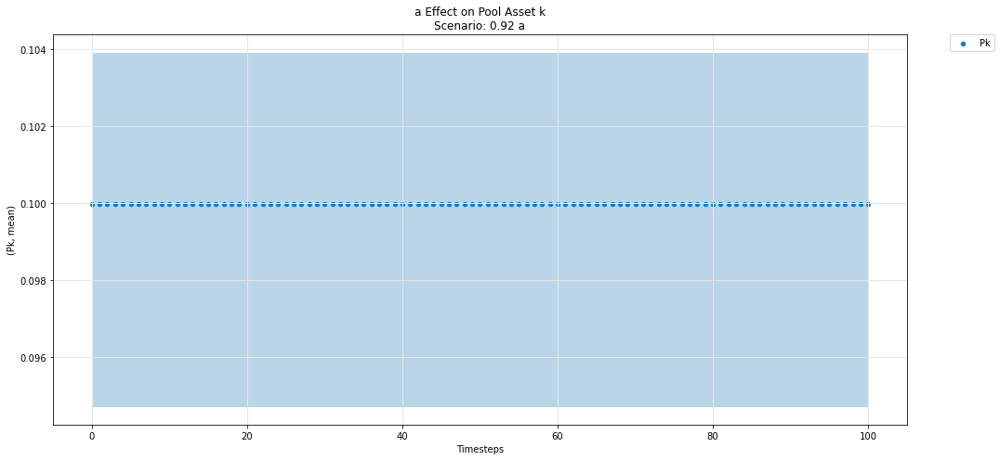

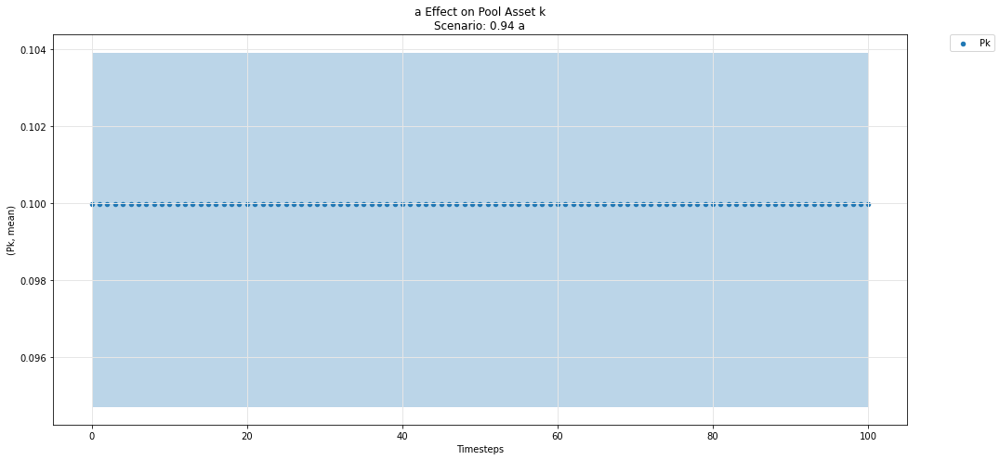

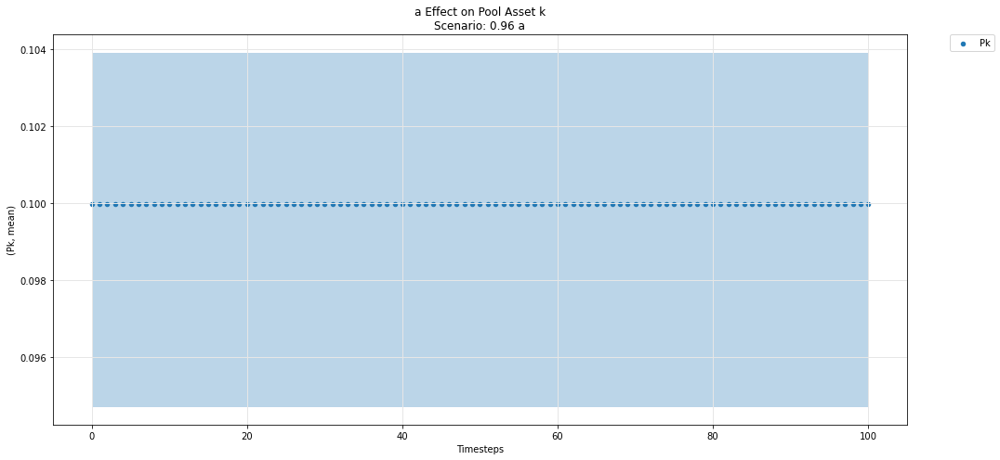

...

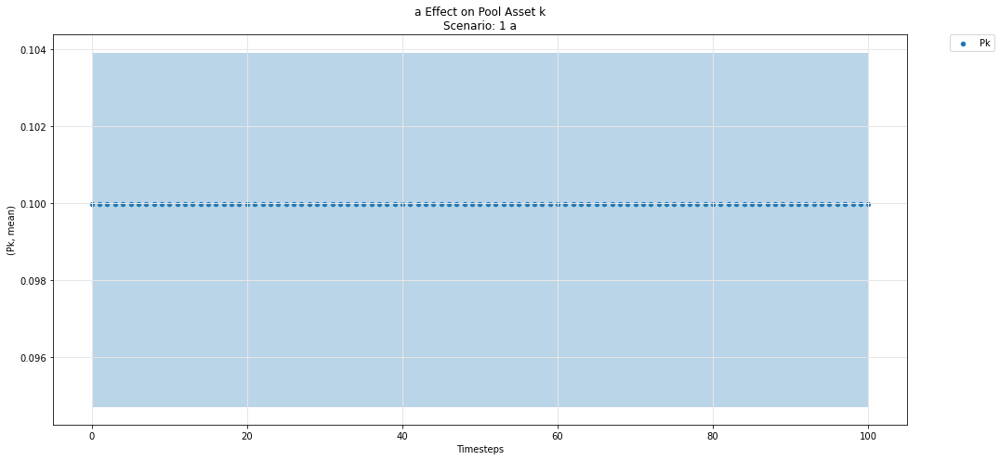

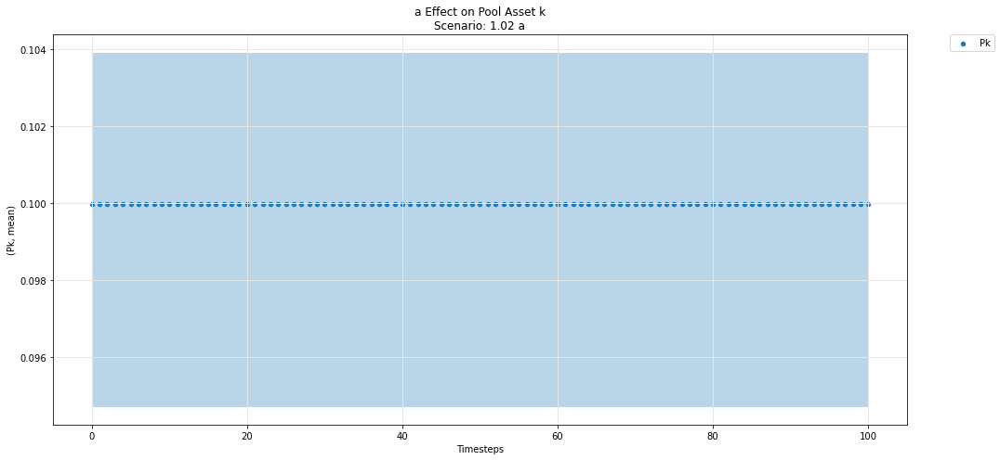

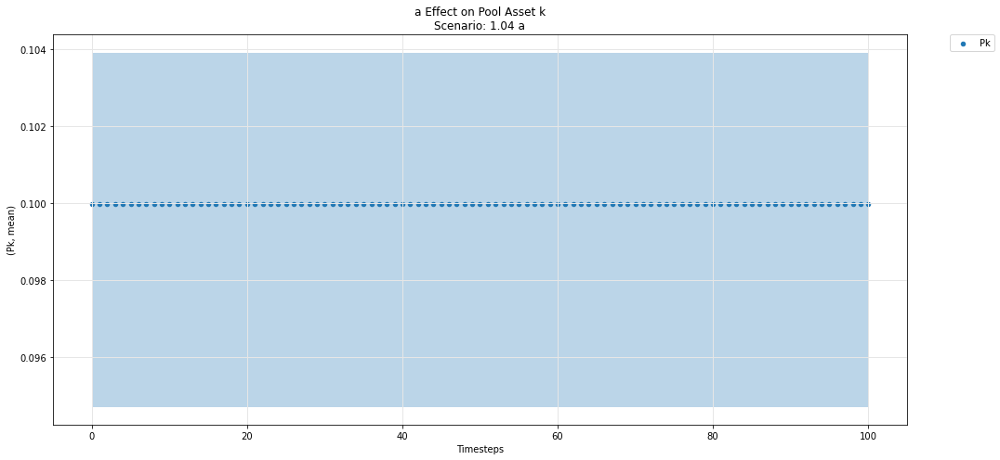

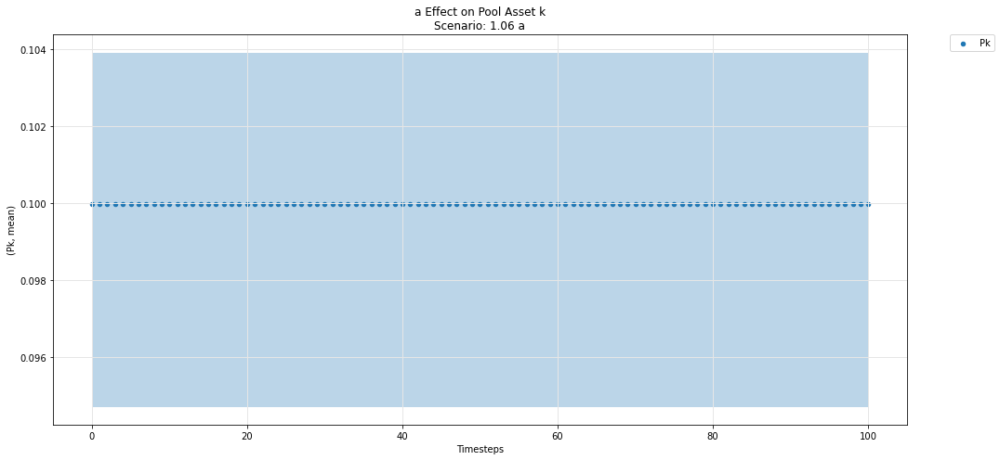

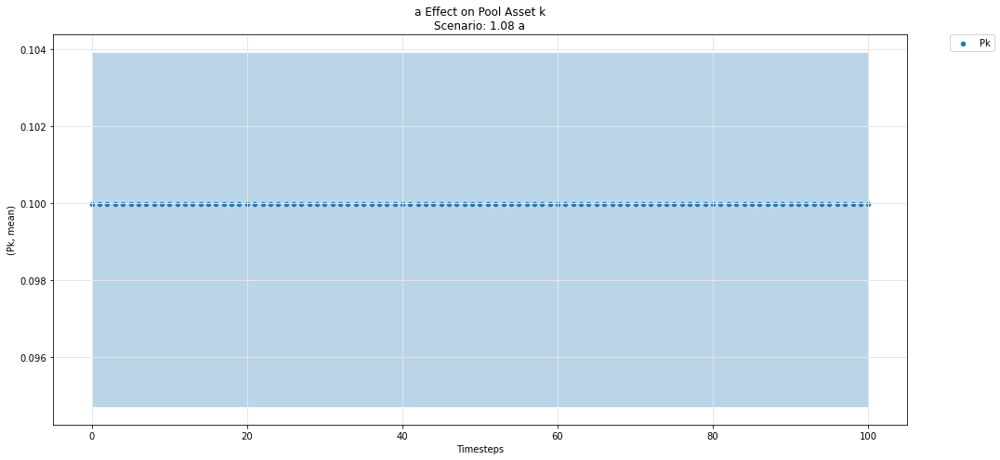

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

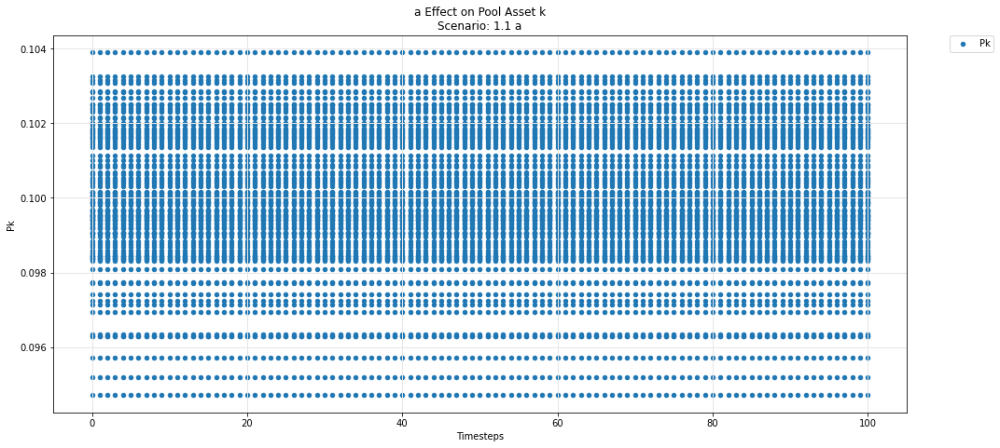

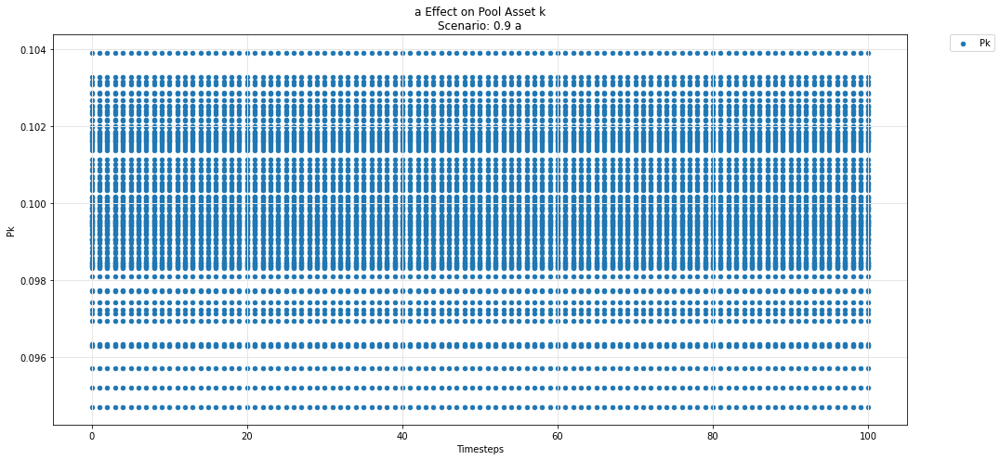

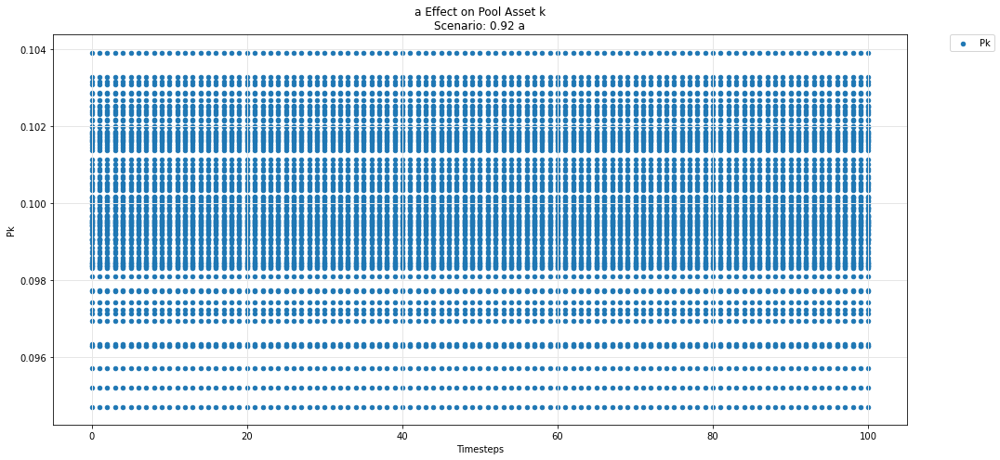

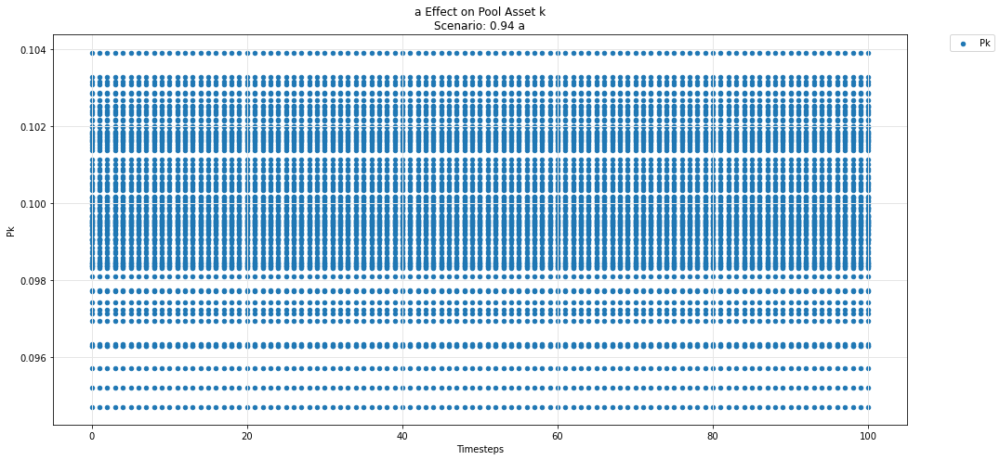

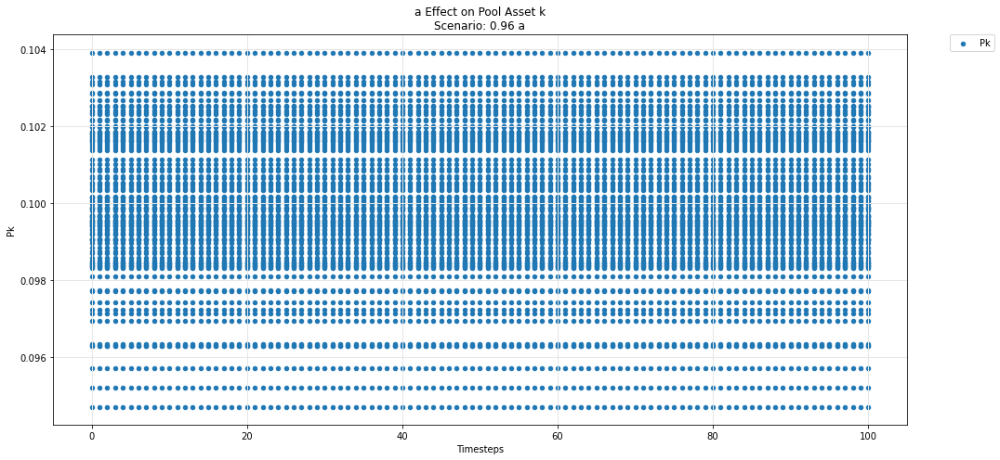

...

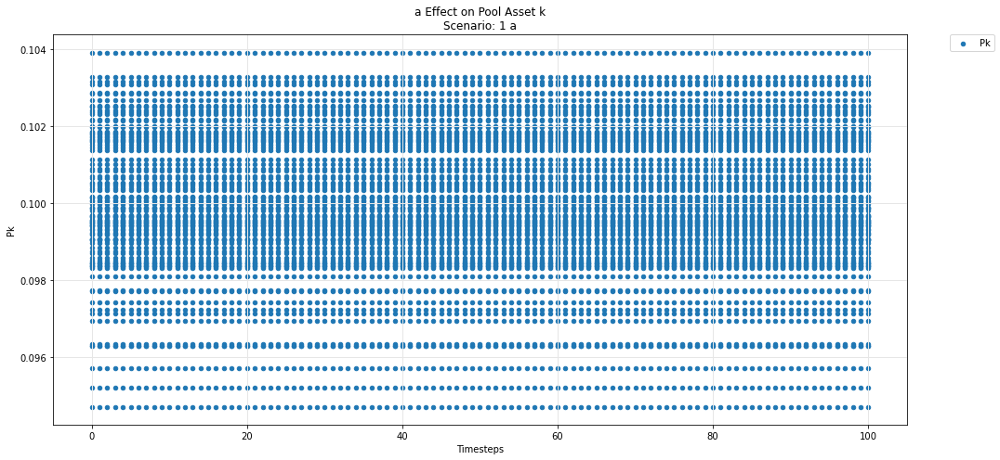

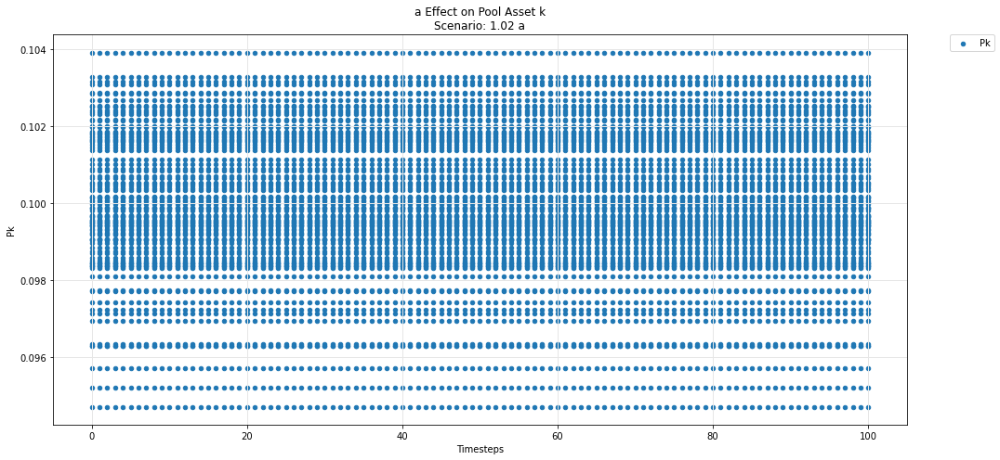

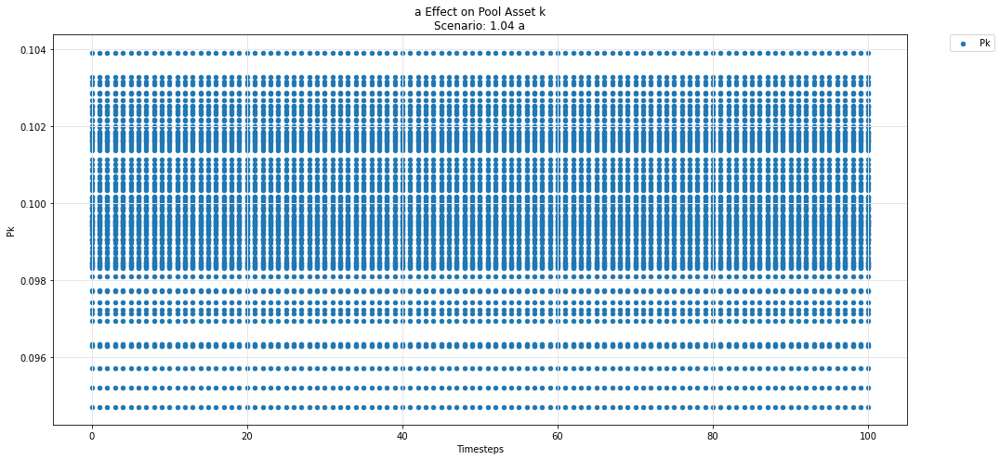

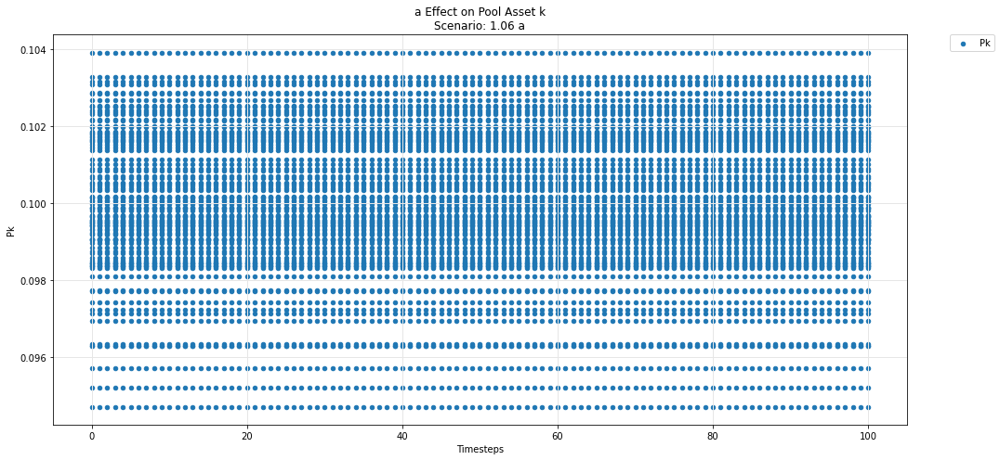

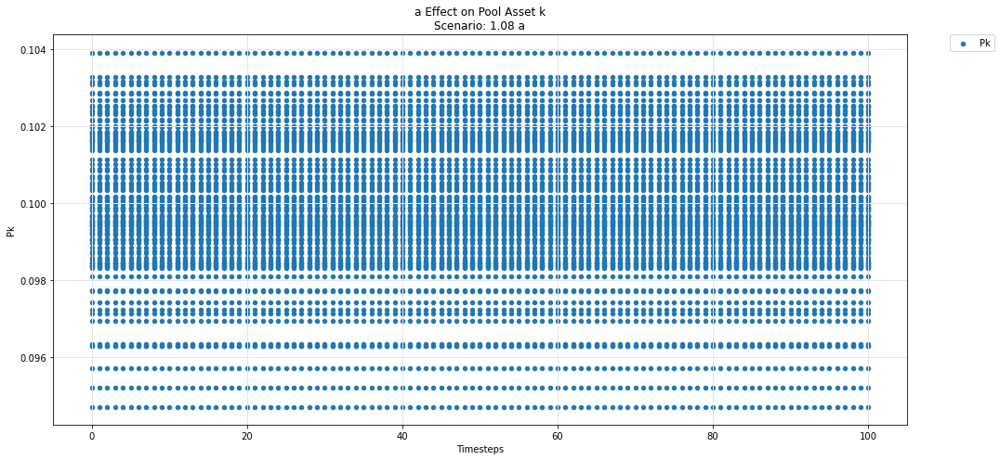

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')